In [1]:
%matplotlib inline

# Determination of centroids and distances to the seeds


In [1]:
from segmentation_functions import resample
from finding_biggest_lung import arrange_slices, normalization, creating_mask
from automaticSeeding import find_seed
import numpy as np
import os
import matplotlib.pyplot as plt
import scipy.io as spio
import pydicom
import time
from math import sqrt

def getKey_row(item):
    return item[1]

def getKey_col(item):
    return item[2]

def find_centroid(opened, shape):
    min_i = opened[0][0]
    max_i = opened[-1][0]
    opened_rows = sorted(opened, key=getKey_row)
    min_j = opened_rows[0][1]
    max_j = opened_rows[-1][1]
    opened_cols = sorted(opened, key=getKey_col)
    min_k = opened_cols[0][2]
    max_k = opened_cols[-1][2]
    pre_centroid_slices = (max_i-min_i)//2+min_i
    pre_centroid_rows = (max_j-min_j)//2+min_j
    pre_centroid_cols = (max_k-min_k)//2+min_k
    
    return tuple([pre_centroid_slices,pre_centroid_rows,pre_centroid_cols])

def separate_mask(separator, opened):
    right_lung = [s for s in opened if s[2]<=separator]
    left_lung = [s for s in opened if s[2]>=separator]
    return left_lung, right_lung

slices_path = "G:/CTImages/"
indices_path ="G:/Plans/CT/Lungs/ok/Separate Lungs"
seeds_path = "G:/CTImages/CT/Images/Seeds/"
separation_path = "G:/CTimages/Separator/"
centroid_path = "G:/CTimages/CT/Images/Centroids/New_method"
indices_folder= os.listdir(indices_path)
 
distances = []
centroids = []

for num,each_mask in enumerate(indices_folder):

    print(num)
    
    #Loading data--------------------------------------------------------------------------------------------------------
    opened = spio.loadmat(indices_path+'/'+each_mask, squeeze_me=True)["indexes"]
    patient_id = each_mask.split(" ", each_mask.count(each_mask))[0] 
    separador = spio.loadmat(separation_path+'/'+patient_id+'_separator', squeeze_me=True)["separator"]
    pre_region = each_mask.split("_", each_mask.count(each_mask))[1]
    region = pre_region.split("_", pre_region.count(pre_region))[0]
    print("Patient-id: "+ str(patient_id))
    print(region)
    
    #Reading the data--------------------------------------------------------------------------------------------------------
    slices= arrange_slices(slices_path,patient_id)
    normalized_volume=normalization(slices)
    normalized_array = np.array(normalized_volume)
    
    #Separating left and right side------------------------------------------------------------------------------------------
    volume = np.zeros(normalized_array.shape) #possible improvement: define the non-used side to the minimum intensity
    cols = normalized_array.shape[2]
    
    if region =='left':
        volume[:,:,separador:cols] = normalized_array[:,:,separador:cols]
    elif region =='right':
        volume[:,:,0:separador] = normalized_array[:,:,0:separador]
    volume_resampled, spacing = resample(volume, slices, [5,5,5])
    
    #Mask--------------------------------------------------------------------------------------------------------------------
    lung_mask = creating_mask(opened,normalized_array)
    lung_mask_resampled, spacing = resample(lung_mask, slices, [5,5,5])
    
    #Centroid--------------------------------------------------------------------------------------------------------------------
    
    centroid_non_resampled = find_centroid(opened,normalized_array.shape)
    mask_centroid = creating_mask([centroid_non_resampled],normalized_array)
    mask_centroid_resampled, spacing = resample(mask_centroid, slices, [5,5,5])
    centroid = [np.unravel_index(np.argmax(mask_centroid_resampled), mask_centroid_resampled.shape)] #tuple-->list
    centroids.append(centroid)
    centroid = tuple(centroids[num])
    
#     showing = lung_mask_resampled.copy()
#     showing[tuple(centroid[0])]=2
#     plt.imshow(showing[:,centroid[0][1],:])
#     plt.show()
#     print('centroid: '+str(centroid))
    
    
    #Seed--------------------------------------------------------------------------------------------------------------------
    seed_thresh = 0
    max_seeding = 39705+50
    min_seeding = 3257
    new_seed = [0,0,0]
    
    while new_seed == [0,0,0]:
        new_seed = find_seed(volume_resampled,seed_thresh,region)
        if new_seed == [0,0,0]:
            seed_thresh= seed_thresh+15
            new_seed = find_seed(volume_resampled,seed_thresh,region)
    
    seed = new_seed
    
#     interval = volume_resampled.copy()
#     interval[tuple(centroid[0])]=5000
#     interval[seed]=5000
#     plt.imshow(interval[:,centroid[0][1],:])
#     plt.show()
    
    #Distance--------------------------------------------------------------------------------------------------------------------
    distance = sqrt((seed[0]-centroid[0][0])**2 + (seed[1]-centroid[0][1])**2 + (seed[2]-centroid[0][2])**2 )
    distances.append(distance)
    print(distance)
    name = centroid_path+"centroid_"+str(patient_id)+'_'+str(region)
    np.save(name, centroid)
  

0
Patient-id: 10194022
left
10.723805294763608
1
Patient-id: 10194022
right
10.954451150103322
2
Patient-id: 28838683
left
13.601470508735444
3
Patient-id: 28838683
right
10.816653826391969
4
Patient-id: 31022832
left
10.04987562112089
5
Patient-id: 31022832
right
5.916079783099616
6
Patient-id: 31119444
left
10.04987562112089
7
Patient-id: 31119444
right
22.135943621178654
8
Patient-id: 32064030
right
29.171904291629644
9
Patient-id: 32407507
left
8.306623862918075
10
Patient-id: 32407507
right
5.0990195135927845
11
Patient-id: 33515150
left
72.069410986909
12
Patient-id: 33515150
right
96.23408959407264
13
Patient-id: 34332375
left
2.23606797749979
14
Patient-id: 34332375
right
2.449489742783178
15
Patient-id: 35196645
right
8.602325267042627
16
Patient-id: 35939665
left
11.575836902790225
17
Patient-id: 35939665
right
12.884098726725126
18
Patient-id: 36319905
left
18.138357147217054
19
Patient-id: 36319905
right
19.026297590440446
20
Patient-id: 36778909
left
93.38629449764028
21
P

C:\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:605: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


6.4031242374328485
45
Patient-id: 37881605
right
9.695359714832659
46
Patient-id: 37953385
left
6.4031242374328485
47
Patient-id: 37953385
right
10.295630140987
48
Patient-id: 38028657
left
7.211102550927978
49
Patient-id: 38028657
right
8.12403840463596
50
Patient-id: 38133514
left
12.409673645990857
51
Patient-id: 38133514
right
16.401219466856727
52
Patient-id: 38564873
left
49.16299421312742
53
Patient-id: 38564873
right
34.0147027033899
54
Patient-id: 39002828
left
9.899494936611665
55
Patient-id: 39002828
right
9.695359714832659
56
Patient-id: 39137852
left
12.083045973594572
57
Patient-id: 39137852
right
9.486832980505138
58
Patient-id: 39256095
left
13.74772708486752
59
Patient-id: 39256095
right
11.180339887498949
60
Patient-id: 39524591
left
81.2219182240853
61
Patient-id: 39524591
right
57.21887800367987
62
Patient-id: 39819471
left
10.392304845413264
63
Patient-id: 39819471
right
11.180339887498949
64
Patient-id: 39844012
left
9.273618495495704
65
Patient-id: 39844012
right

In [3]:
distances

[10.723805294763608,
 10.954451150103322,
 13.601470508735444,
 10.816653826391969,
 10.04987562112089,
 5.916079783099616,
 10.04987562112089,
 22.135943621178654,
 29.171904291629644,
 8.306623862918075,
 5.0990195135927845,
 72.069410986909,
 96.23408959407264,
 2.23606797749979,
 2.449489742783178,
 8.602325267042627,
 11.575836902790225,
 12.884098726725126,
 18.138357147217054,
 19.026297590440446,
 93.38629449764028,
 92.54728521139883,
 16.61324772583615,
 16.0312195418814,
 5.916079783099616,
 5.196152422706632,
 11.704699910719626,
 13.19090595827292,
 10.198039027185569,
 10.816653826391969,
 75.11324783285569,
 88.16461875378354,
 13.92838827718412,
 11.180339887498949,
 6.4031242374328485,
 6.708203932499369,
 64.06246951218786,
 42.34383071948026,
 14.352700094407323,
 13.152946437965905,
 19.1049731745428,
 8.06225774829855,
 87.05170877128145,
 81.16033513977132,
 6.4031242374328485,
 9.695359714832659,
 6.4031242374328485,
 10.295630140987,
 7.211102550927978,
 8.12403

(57.82155789473684, 70.05717894736843, 52.92244210526316)


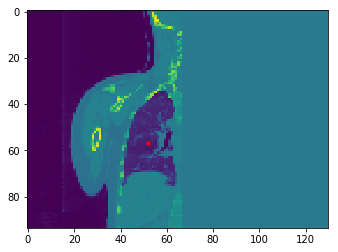

In [74]:
binary_lung = np.where(lung_mask_resampled>0.5,1, 0)
plt.imshow(binary_lung[:,70,:])
abc_bi = tuple(ndimage.measurements.center_of_mass(binary_lung))
print(abc_bi)
plt.imshow(volume_resampled[:,int(abc_bi[1]),:])
plt.scatter([int(abc_bi[2])], [int(abc_bi[0])],c='r',s=10)

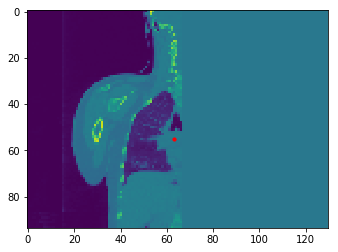

In [76]:
plt.imshow(volume_resampled[:,int(centroid[0][1]),:])
plt.scatter([int(centroid[0][2])], [int(centroid[0][0])],c='r',s=10)

In [5]:
distances = np.array(distances)
avg_distances = np.mean(distances)
avg_distances

22.01438214678663

(115.64760606668003, 277.70314425068483, 209.71151466559766)


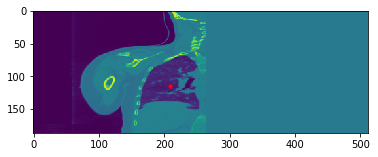

In [77]:
from scipy import ndimage
abc = tuple(ndimage.measurements.center_of_mass(lung_mask))
print(abc)
plt.imshow(volume[:,int(abc[1]),:])
plt.scatter([int(abc[2])], [int(abc[0])],c='r',s=10)

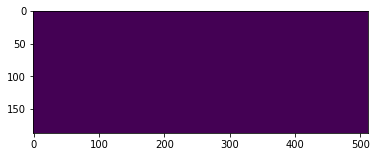

205


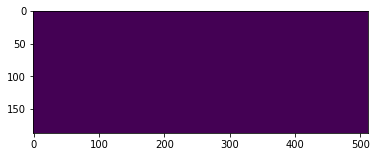

206


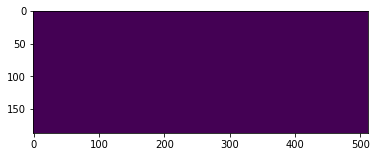

207


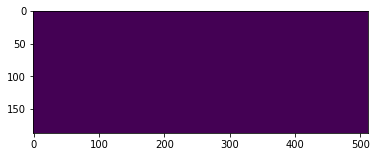

208


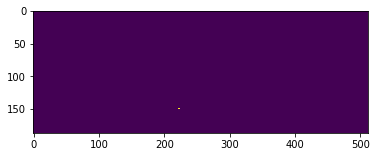

209


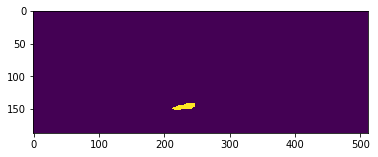

210


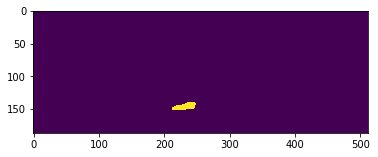

211


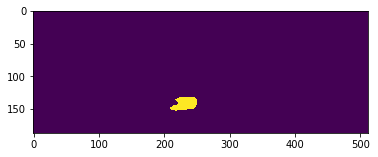

212


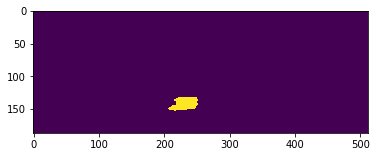

213


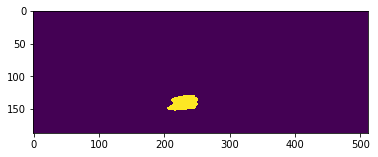

214


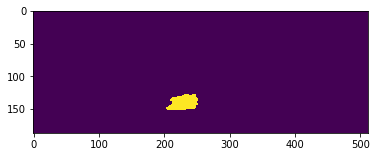

215


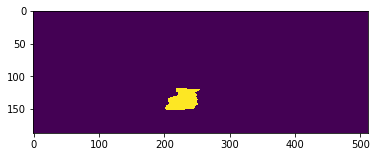

216


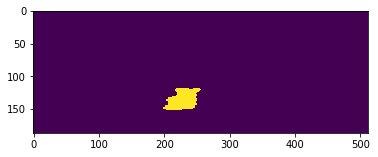

217


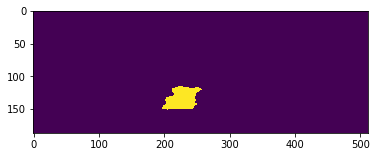

218


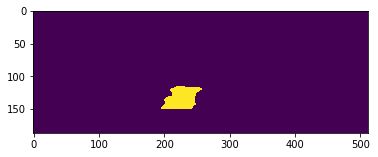

219


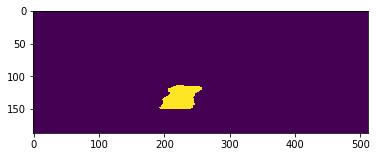

220


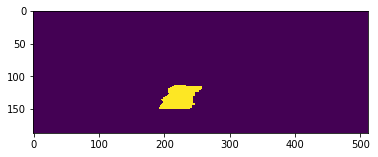

221


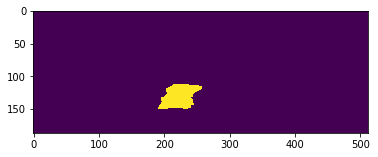

222


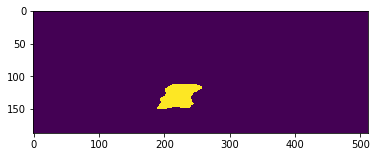

223


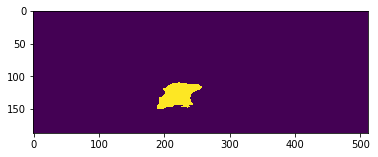

224


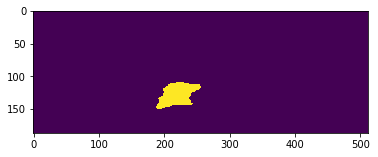

225


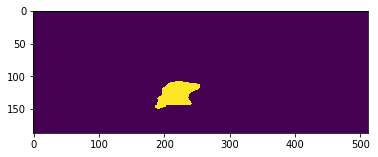

226


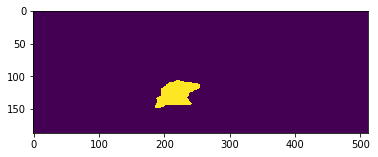

227


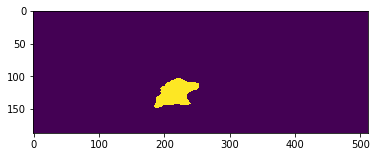

228


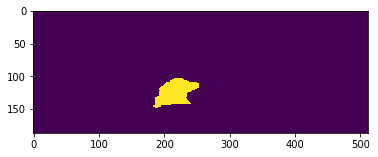

229


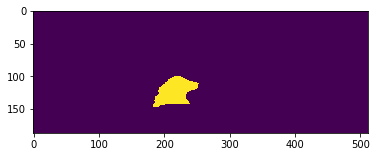

230


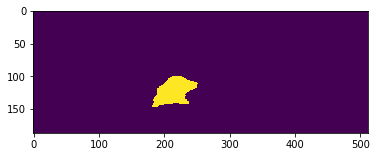

231


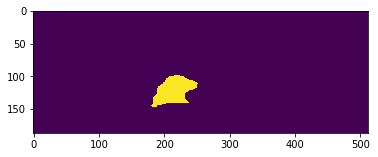

232


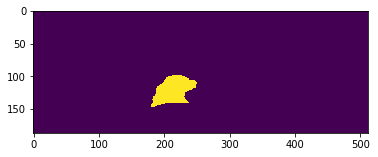

233


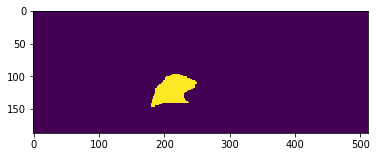

234


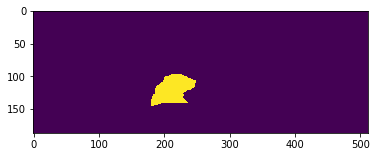

235


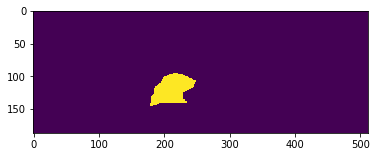

236


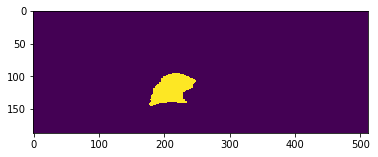

237


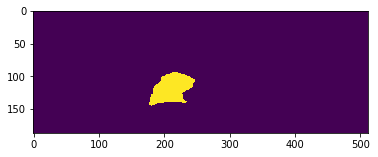

238


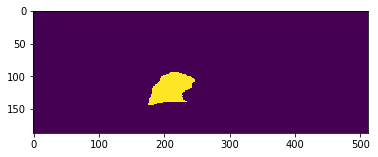

239


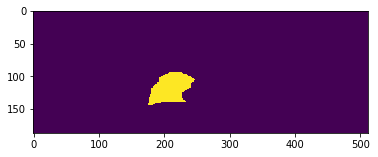

240


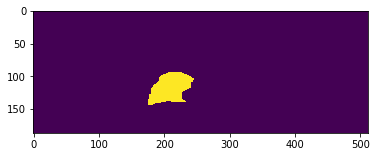

241


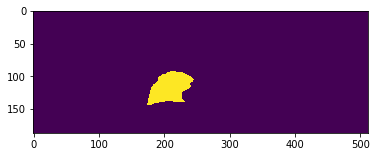

242


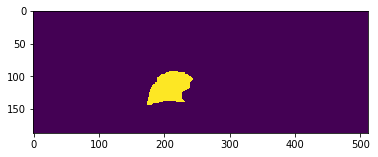

243


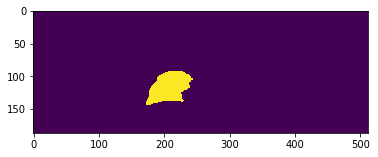

244


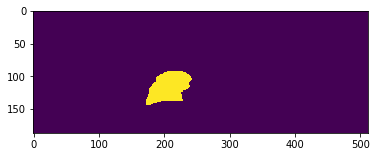

245


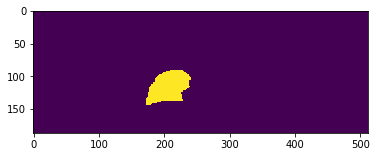

246


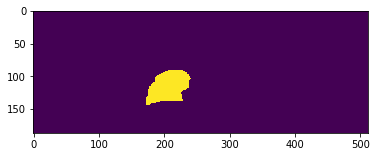

247


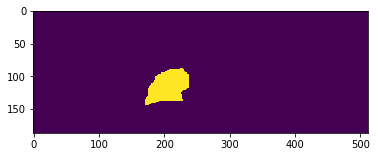

248


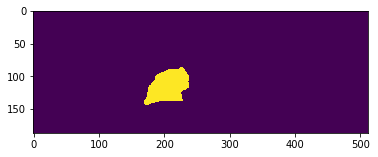

249


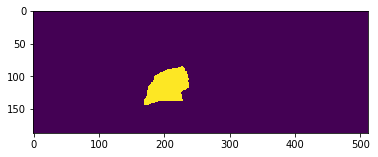

250


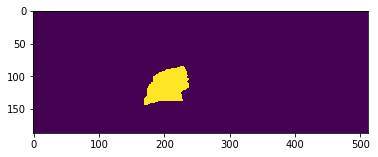

251


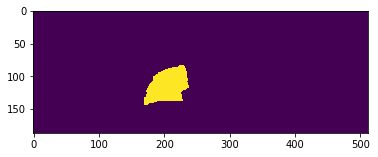

252


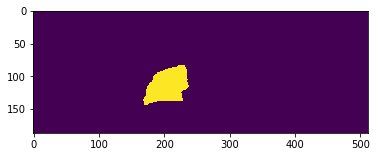

253


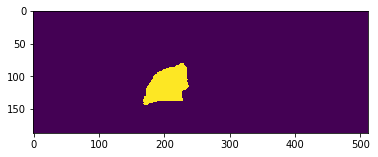

254


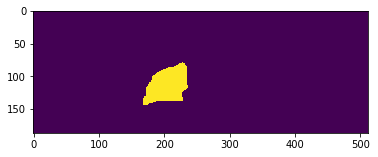

255


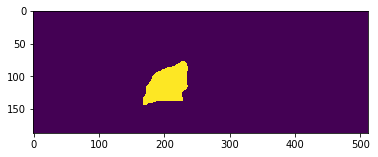

256


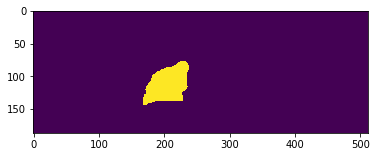

257


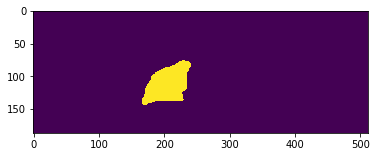

258


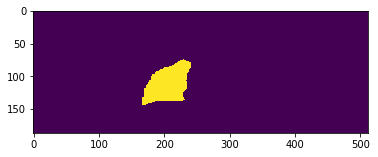

259


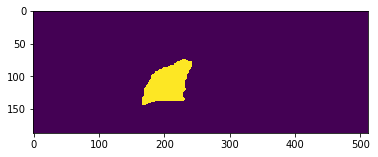

260


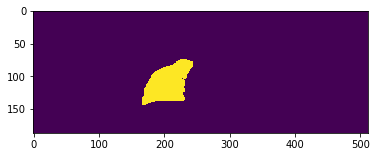

261


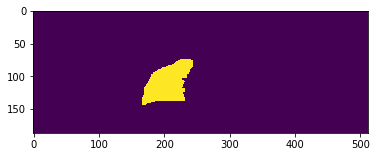

262


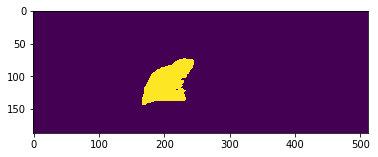

263


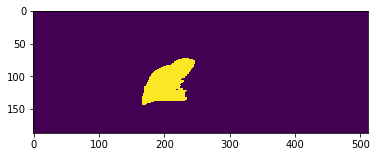

264


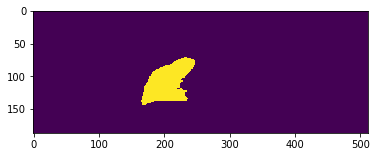

265


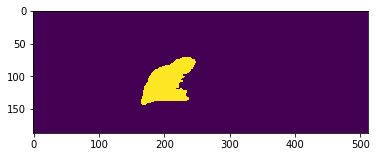

266


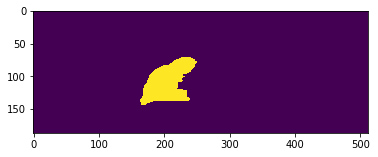

267


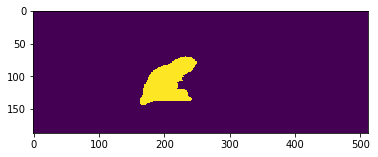

268


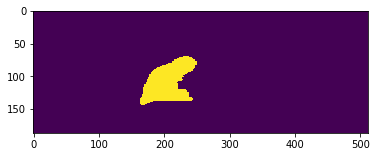

269


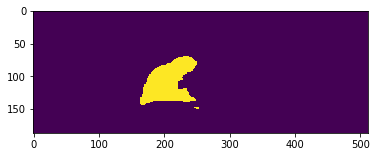

270


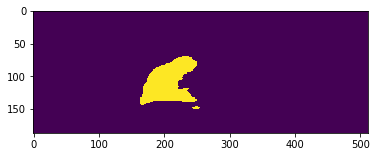

271


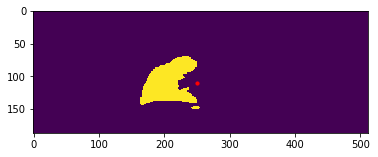

272


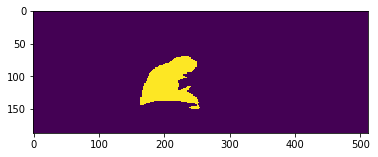

273


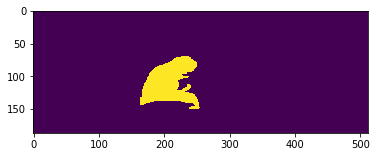

274


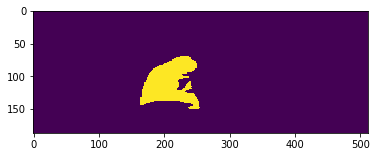

275


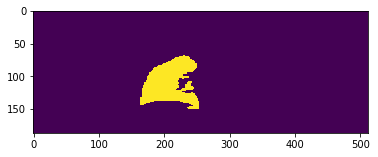

276


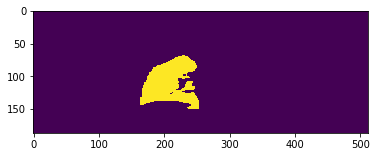

277


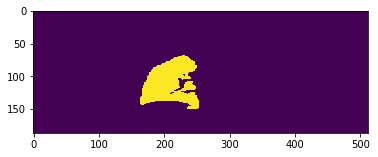

278


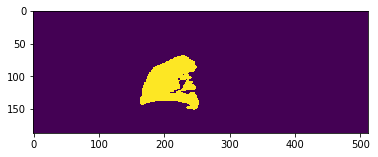

279


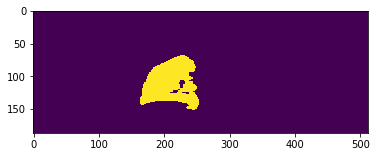

280


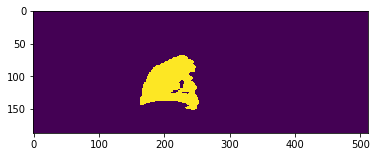

281


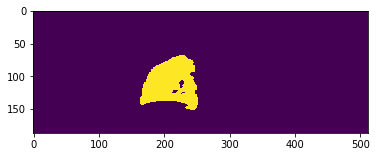

282


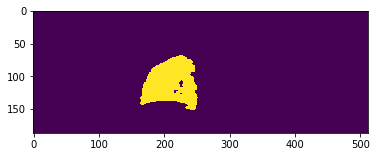

283


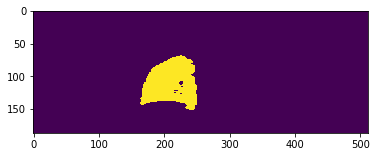

284


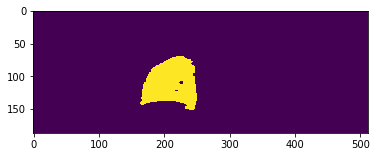

285


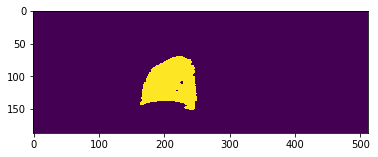

286


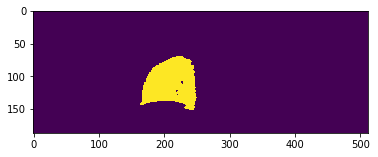

287


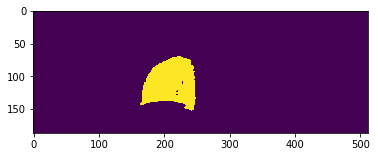

288


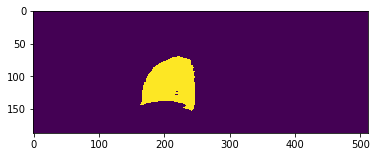

289


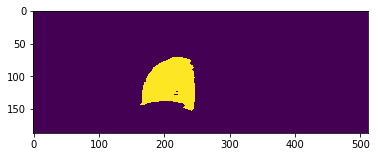

290


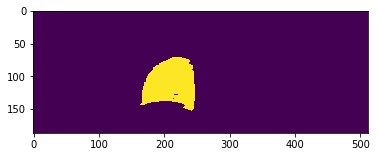

291


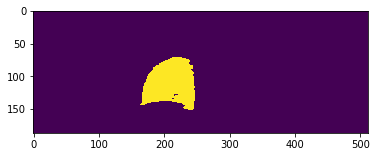

292


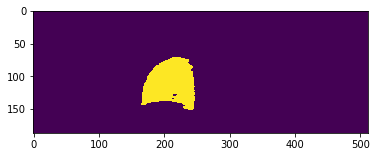

293


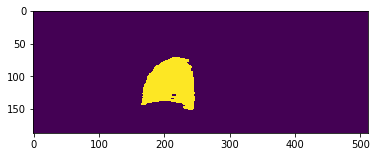

294


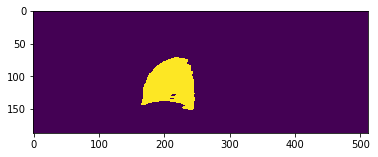

295


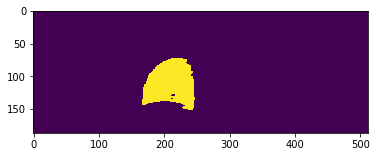

296


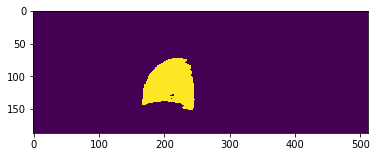

297


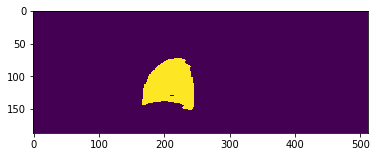

298


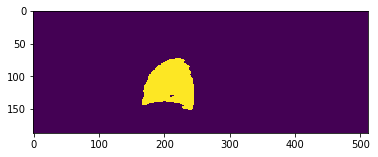

299


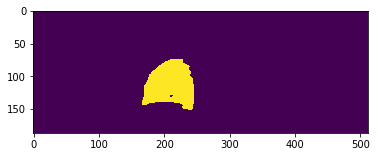

300


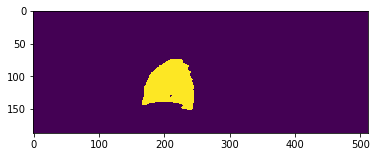

301


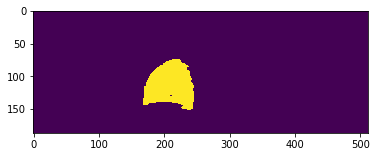

302


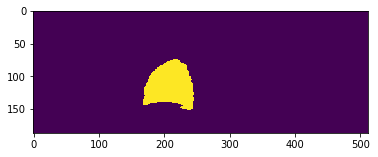

303


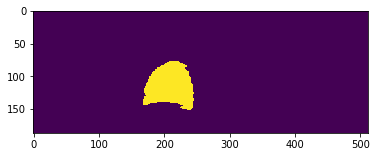

304


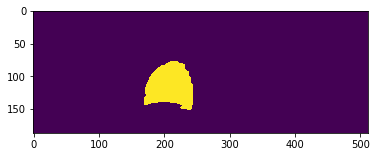

305


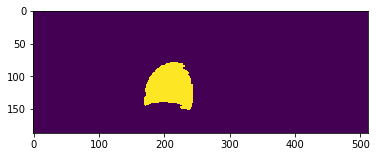

306


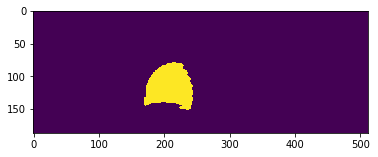

307


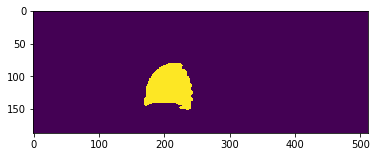

308


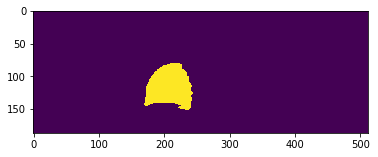

309


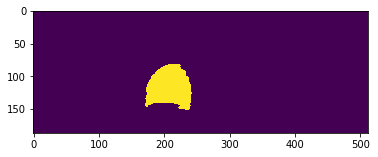

310


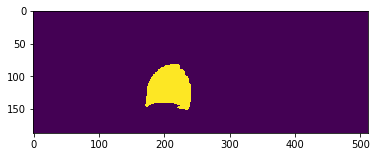

311


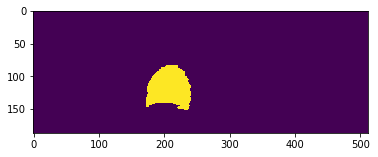

312


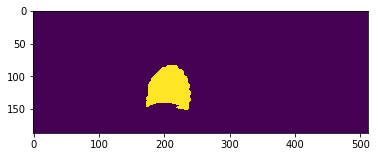

313


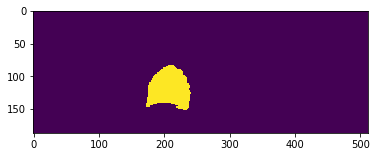

314


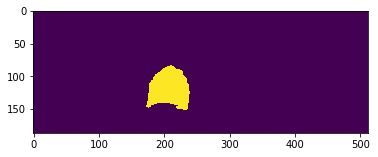

315


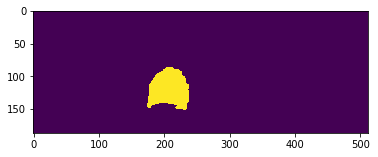

316


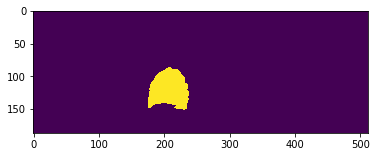

317


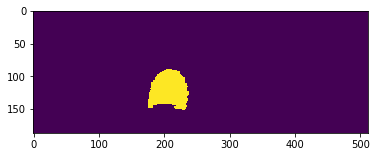

318


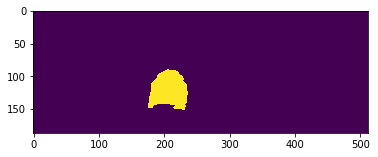

319


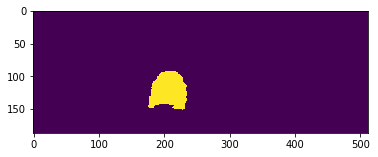

320


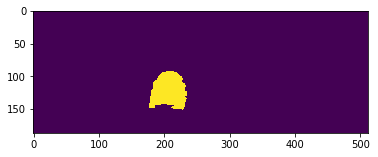

321


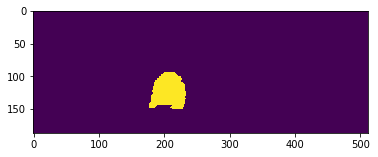

322


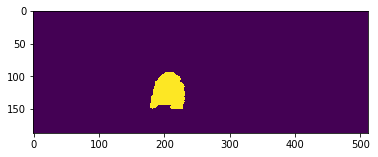

323


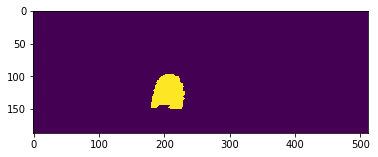

324


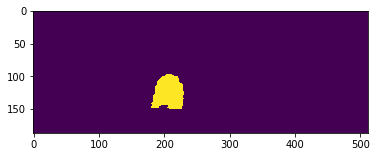

325


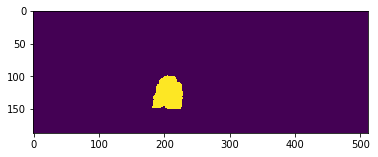

326


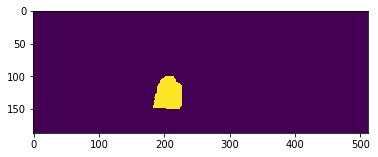

327


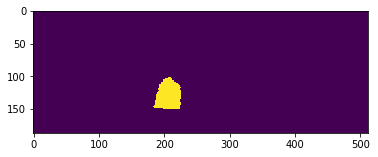

328


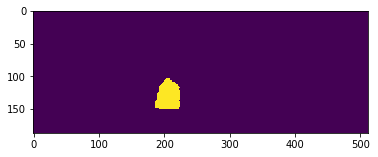

329


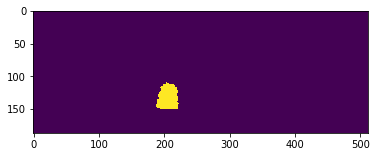

330


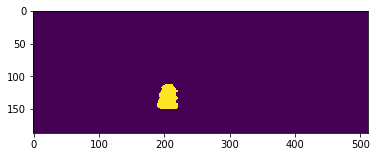

331


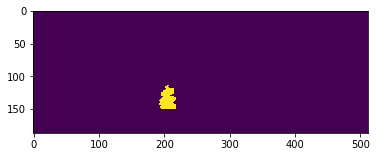

332


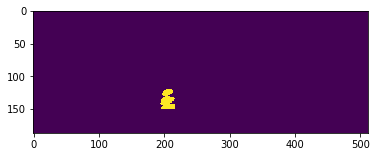

333


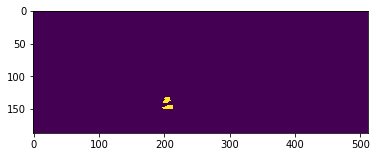

334


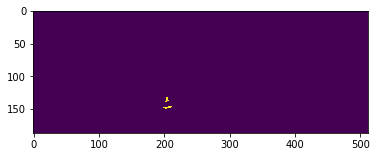

335


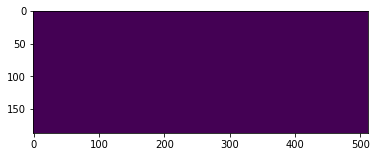

336


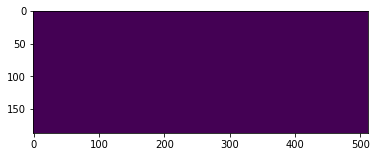

337


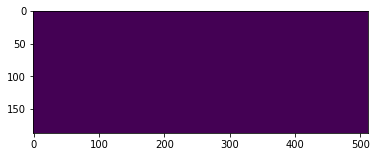

338


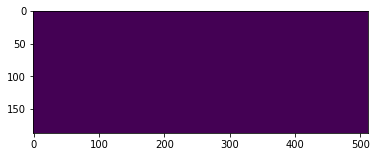

339


In [51]:
for i in range(205,340):
    fig, ax = plt.subplots()
    cs = ax.imshow(lung_mask[:,i,:])
    if i==272:
        ax.scatter([centroid_non_resampled[2]], [centroid_non_resampled[0]],c='r',s=10)
    plt.show()
    print(i)
    time.sleep(1)

# Segmentation - non iterative

0
Patient-id: 10194022
left


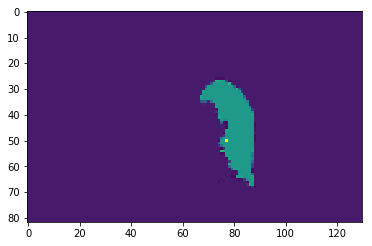

centroid: (array([50, 68, 77], dtype=int64),)
starting segmentation...


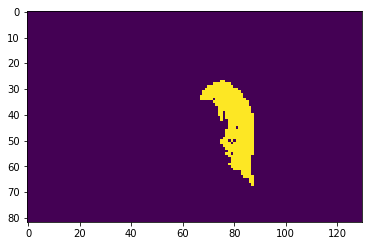

Elapsed time: 5.506 seconds.
1
Patient-id: 10194022
right


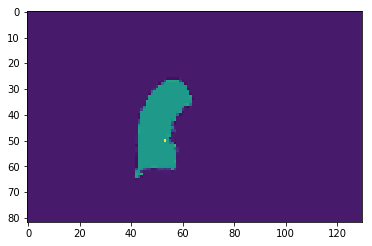

centroid: (array([50, 67, 53], dtype=int64),)
starting segmentation...


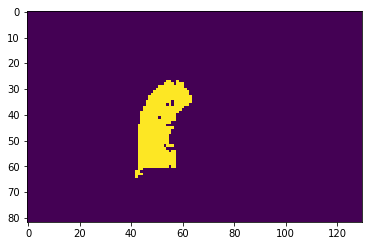

Elapsed time: 6.373 seconds.
2
Patient-id: 28838683
left


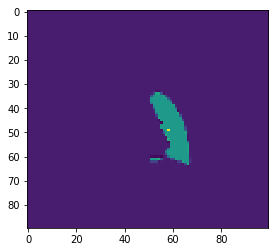

centroid: (array([49, 50, 58], dtype=int64),)
starting segmentation...


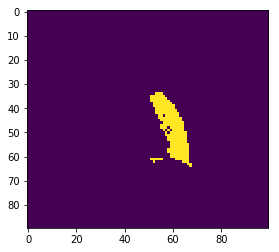

Elapsed time: 1.771 seconds.
3
Patient-id: 28838683
right


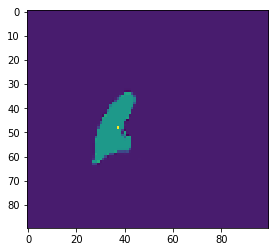

centroid: (array([48, 49, 37], dtype=int64),)
starting segmentation...


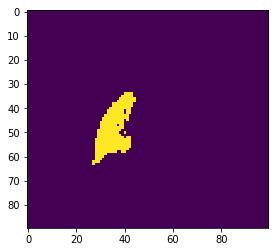

Elapsed time: 1.951 seconds.
4
Patient-id: 31022832
left


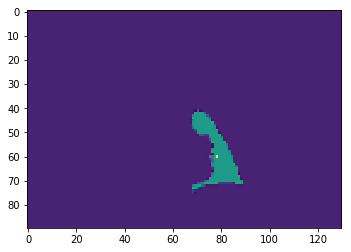

centroid: (array([60, 64, 78], dtype=int64),)
starting segmentation...


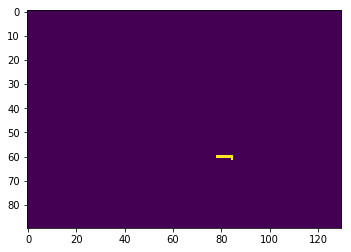

Elapsed time: 19.952 seconds.
5
Patient-id: 31022832
right


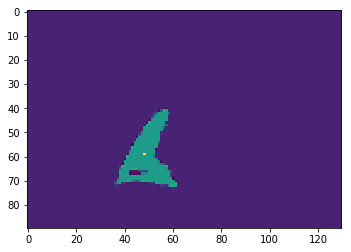

centroid: (array([59, 62, 48], dtype=int64),)
starting segmentation...


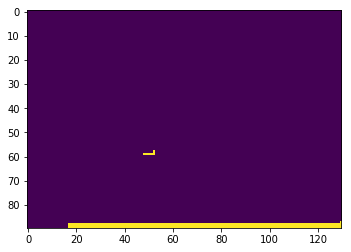

Elapsed time: 18.998 seconds.
6
Patient-id: 31119444
left


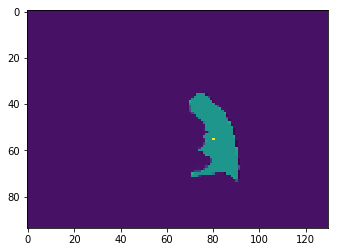

centroid: (array([55, 69, 80], dtype=int64),)
starting segmentation...


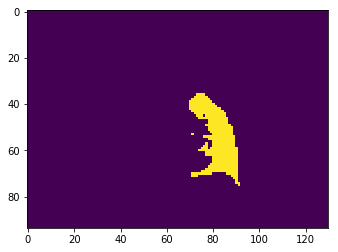

Elapsed time: 6.408 seconds.
7
Patient-id: 31119444
right


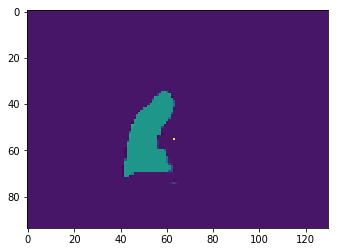

centroid: (array([55, 68, 63], dtype=int64),)
starting segmentation...


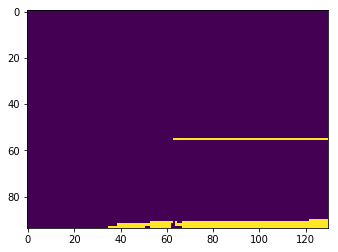

Elapsed time: 19.503 seconds.
8
Patient-id: 32064030
right


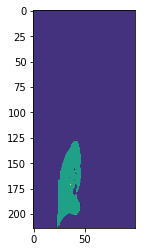

centroid: (array([171,  51,  36], dtype=int64),)
starting segmentation...


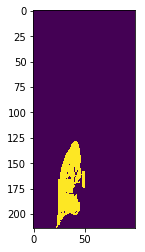

Elapsed time: 31.560 seconds.
9
Patient-id: 32407507
left


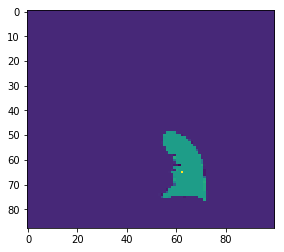

centroid: (array([65, 52, 62], dtype=int64),)
starting segmentation...


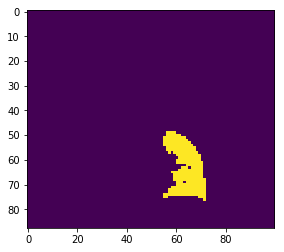

Elapsed time: 2.440 seconds.
10
Patient-id: 32407507
right


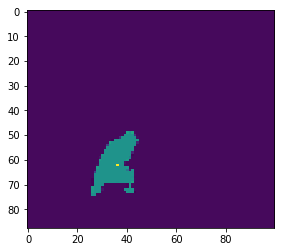

centroid: (array([62, 51, 36], dtype=int64),)
starting segmentation...


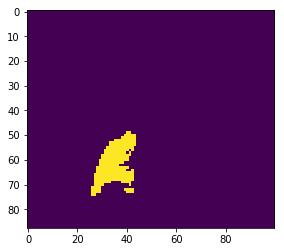

Elapsed time: 2.694 seconds.
11
Patient-id: 33515150
left


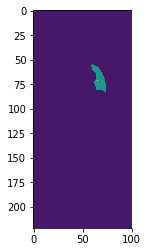

centroid: (array([71, 47, 65], dtype=int64),)
starting segmentation...


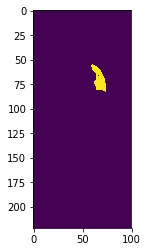

Elapsed time: 4.335 seconds.
12
Patient-id: 33515150
right


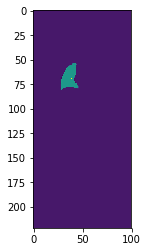

centroid: (array([69, 47, 39], dtype=int64),)
starting segmentation...


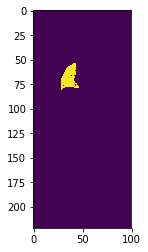

Elapsed time: 5.529 seconds.
13
Patient-id: 34332375
left


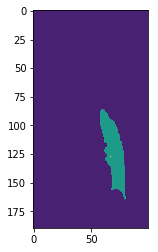

centroid: (array([127,  52,  67], dtype=int64),)
starting segmentation...


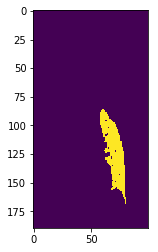

Elapsed time: 20.199 seconds.
14
Patient-id: 34332375
right


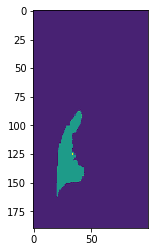

centroid: (array([125,  51,  34], dtype=int64),)
starting segmentation...


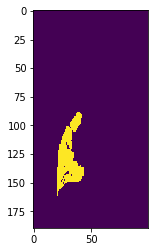

Elapsed time: 19.349 seconds.
15
Patient-id: 35196645
right


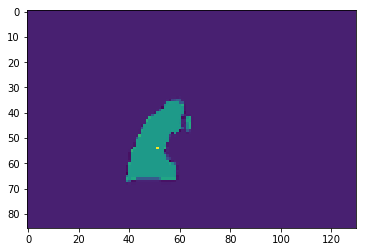

centroid: (array([54, 66, 51], dtype=int64),)
starting segmentation...


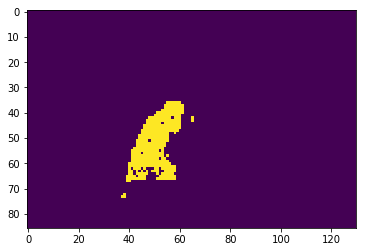

Elapsed time: 8.350 seconds.
16
Patient-id: 35939665
left


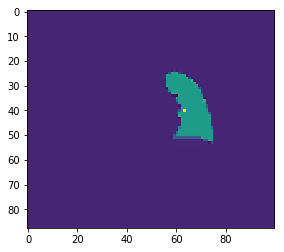

centroid: (array([40, 45, 63], dtype=int64),)
starting segmentation...


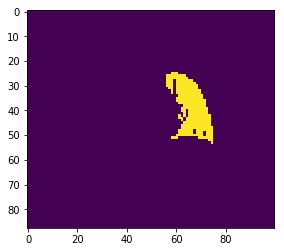

Elapsed time: 3.041 seconds.
17
Patient-id: 35939665
right


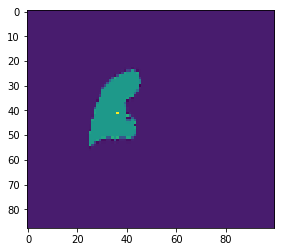

centroid: (array([41, 44, 36], dtype=int64),)
starting segmentation...


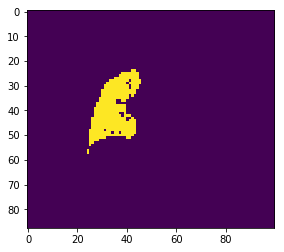

Elapsed time: 4.271 seconds.
18
Patient-id: 36319905
left


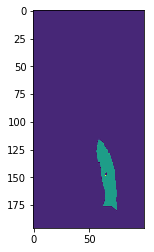

centroid: (array([148,  48,  65], dtype=int64),)
starting segmentation...


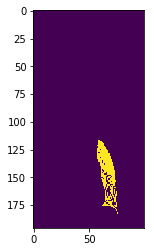

Elapsed time: 12.038 seconds.
19
Patient-id: 36319905
right


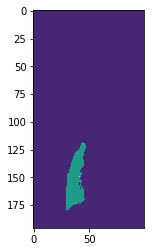

centroid: (array([149,  47,  41], dtype=int64),)
starting segmentation...


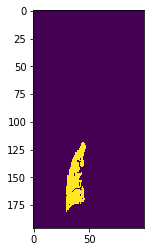

Elapsed time: 13.867 seconds.
20
Patient-id: 36778909
left


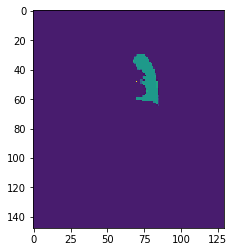

centroid: (array([48, 66, 70], dtype=int64),)
starting segmentation...


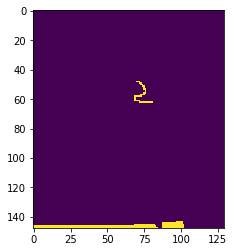

Elapsed time: 43.356 seconds.
21
Patient-id: 36778909
right


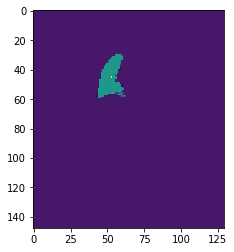

centroid: (array([45, 64, 53], dtype=int64),)
starting segmentation...


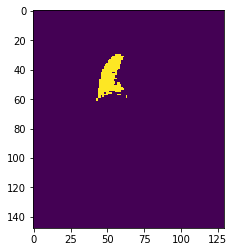

Elapsed time: 7.098 seconds.
22
Patient-id: 36873387
left


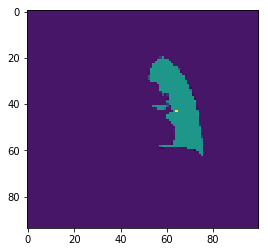

centroid: (array([43, 54, 64], dtype=int64),)
starting segmentation...


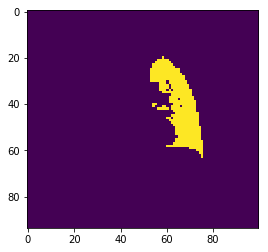

Elapsed time: 4.437 seconds.
23
Patient-id: 36873387
right


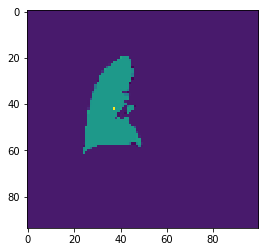

centroid: (array([42, 54, 37], dtype=int64),)
starting segmentation...


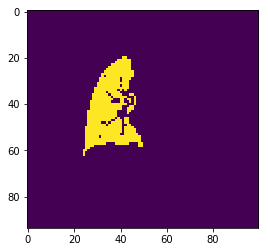

Elapsed time: 5.462 seconds.
24
Patient-id: 37017626
left


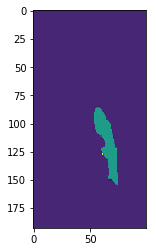

centroid: (array([127,  51,  61], dtype=int64),)
starting segmentation...


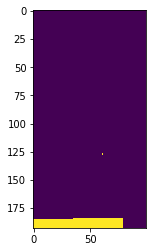

Elapsed time: 26.737 seconds.
25
Patient-id: 37017626
right


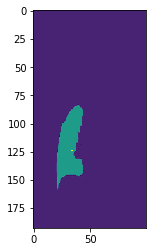

centroid: (array([124,  51,  34], dtype=int64),)
starting segmentation...


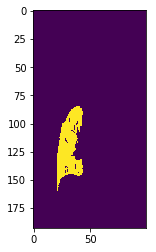

Elapsed time: 17.105 seconds.
26
Patient-id: 37018208
left


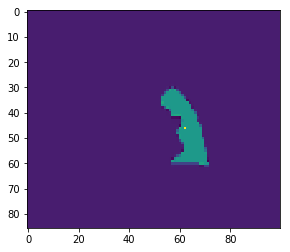

centroid: (array([46, 50, 62], dtype=int64),)
starting segmentation...


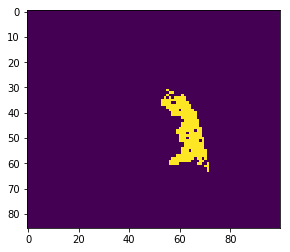

Elapsed time: 1.576 seconds.
27
Patient-id: 37018208
right


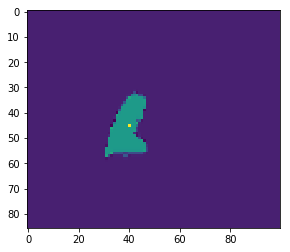

centroid: (array([45, 48, 40], dtype=int64),)
starting segmentation...


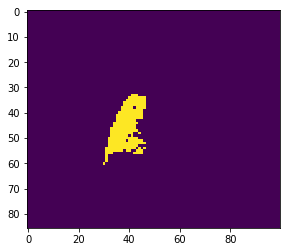

Elapsed time: 1.811 seconds.
28
Patient-id: 37042652
left


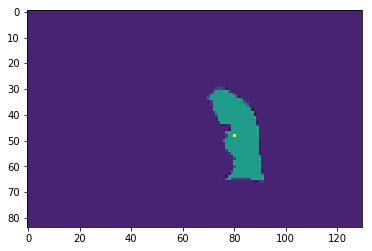

centroid: (array([48, 63, 80], dtype=int64),)
starting segmentation...


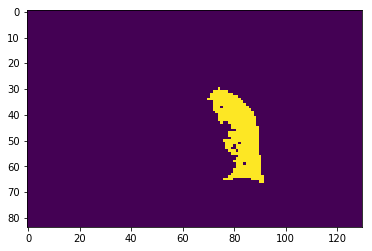

Elapsed time: 4.628 seconds.
29
Patient-id: 37042652
right


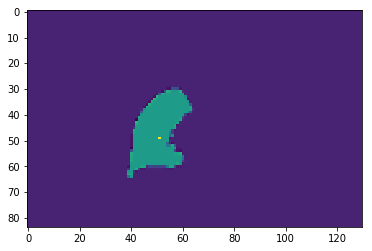

centroid: (array([49, 63, 51], dtype=int64),)
starting segmentation...


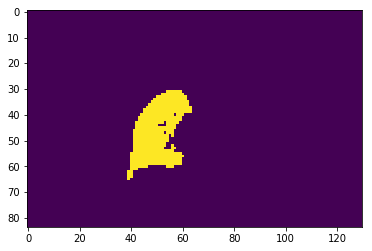

Elapsed time: 6.886 seconds.
30
Patient-id: 37137615
left


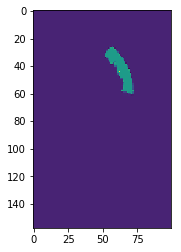

centroid: (array([44, 49, 62], dtype=int64),)
starting segmentation...


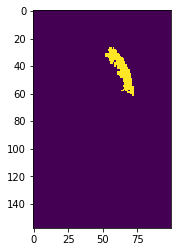

Elapsed time: 3.052 seconds.
31
Patient-id: 37137615
right


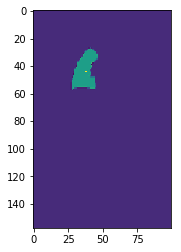

centroid: (array([44, 48, 38], dtype=int64),)
starting segmentation...


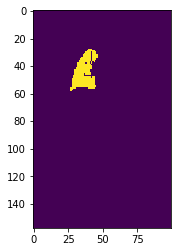

Elapsed time: 4.233 seconds.
32
Patient-id: 37173796
left


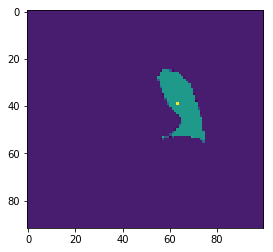

centroid: (array([39, 46, 63], dtype=int64),)
starting segmentation...


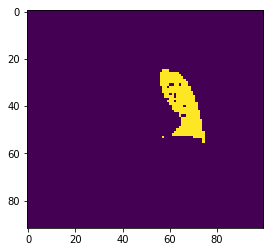

Elapsed time: 3.409 seconds.
33
Patient-id: 37173796
right


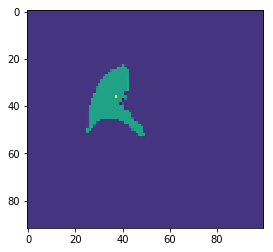

centroid: (array([36, 47, 37], dtype=int64),)
starting segmentation...


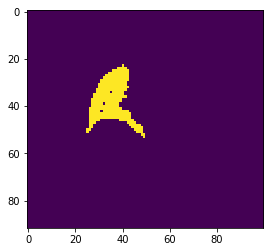

Elapsed time: 3.661 seconds.
34
Patient-id: 37468094
left


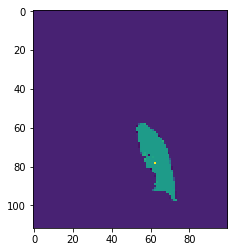

centroid: (array([78, 47, 62], dtype=int64),)
starting segmentation...


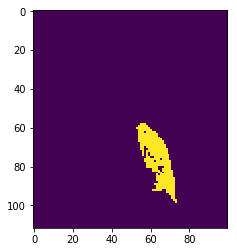

Elapsed time: 4.771 seconds.
35
Patient-id: 37468094
right


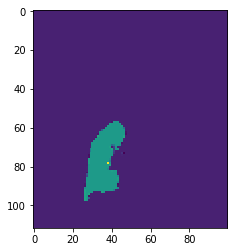

centroid: (array([78, 48, 38], dtype=int64),)
starting segmentation...


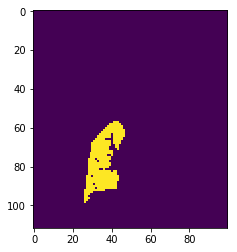

Elapsed time: 5.175 seconds.
36
Patient-id: 37606125
left


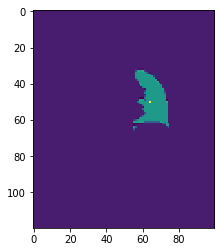

centroid: (array([50, 52, 64], dtype=int64),)
starting segmentation...


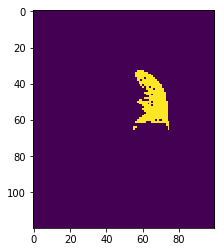

Elapsed time: 3.090 seconds.
37
Patient-id: 37606125
right


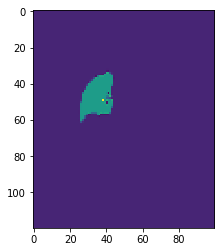

centroid: (array([49, 48, 38], dtype=int64),)
starting segmentation...


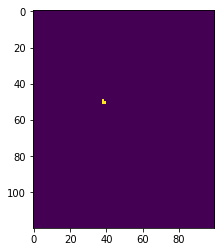

Elapsed time: 0.026 seconds.
38
Patient-id: 37624458
left


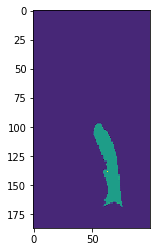

centroid: (array([138,  51,  63], dtype=int64),)
starting segmentation...


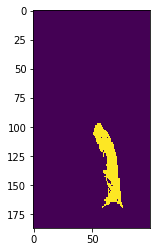

Elapsed time: 14.965 seconds.
39
Patient-id: 37624458
right


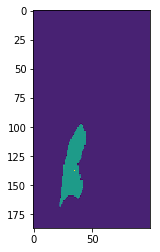

centroid: (array([137,  50,  35], dtype=int64),)
starting segmentation...


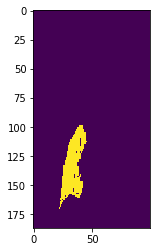

Elapsed time: 19.165 seconds.
40
Patient-id: 37650357
left


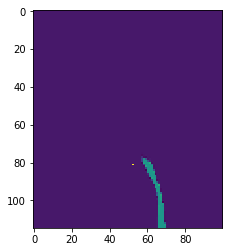

centroid: (array([81, 38, 52], dtype=int64),)
starting segmentation...


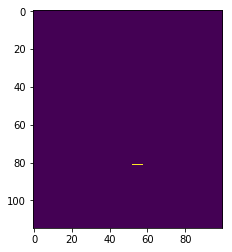

Elapsed time: 16.386 seconds.
41
Patient-id: 37650357
right


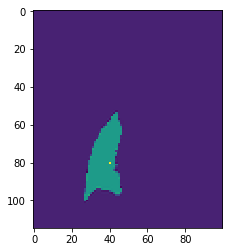

centroid: (array([80, 50, 40], dtype=int64),)
starting segmentation...


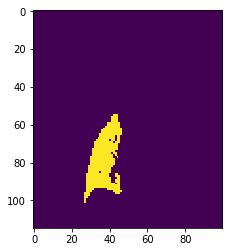

Elapsed time: 7.884 seconds.
42
Patient-id: 37683143
left


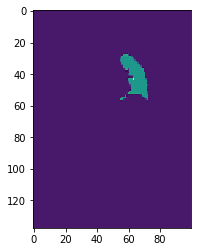

centroid: (array([43, 50, 63], dtype=int64),)
starting segmentation...


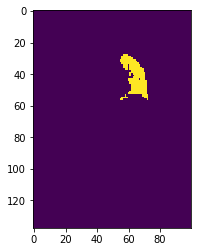

Elapsed time: 2.603 seconds.
43
Patient-id: 37683143
right


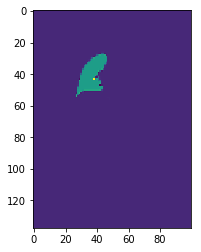

centroid: (array([43, 49, 38], dtype=int64),)
starting segmentation...


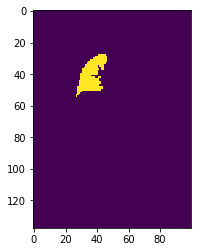

Elapsed time: 3.468 seconds.
44
Patient-id: 37881605
left


C:\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:605: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


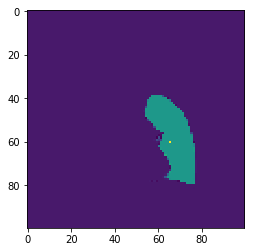

centroid: (array([60, 52, 65], dtype=int64),)
starting segmentation...


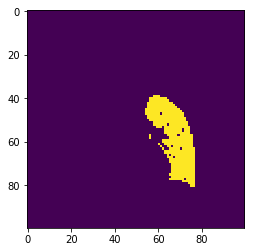

Elapsed time: 4.265 seconds.
45
Patient-id: 37881605
right


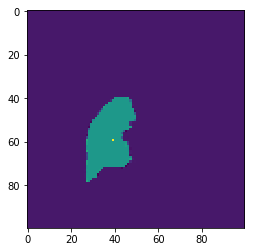

centroid: (array([59, 53, 39], dtype=int64),)
starting segmentation...


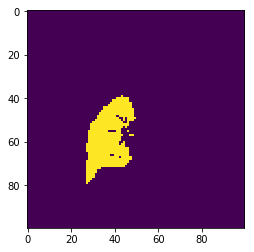

Elapsed time: 4.621 seconds.
46
Patient-id: 37953385
left


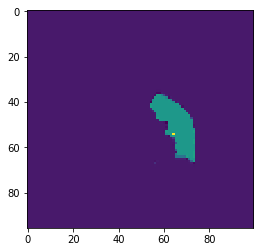

centroid: (array([54, 51, 64], dtype=int64),)
starting segmentation...


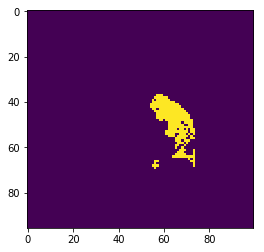

Elapsed time: 2.761 seconds.
47
Patient-id: 37953385
right


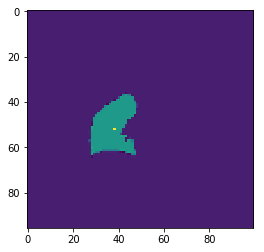

centroid: (array([52, 50, 38], dtype=int64),)
starting segmentation...


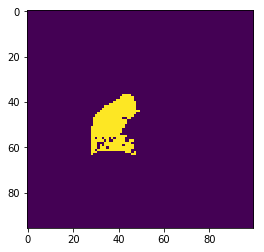

Elapsed time: 3.157 seconds.
48
Patient-id: 38028657
left


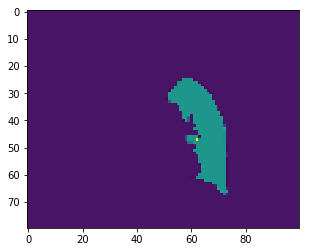

centroid: (array([47, 50, 62], dtype=int64),)
starting segmentation...


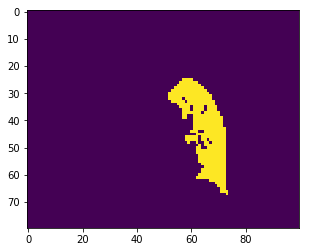

Elapsed time: 3.968 seconds.
49
Patient-id: 38028657
right


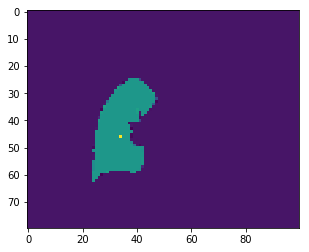

centroid: (array([46, 49, 34], dtype=int64),)
starting segmentation...


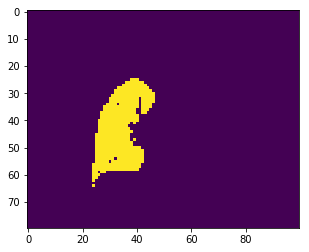

Elapsed time: 3.997 seconds.
50
Patient-id: 38133514
left


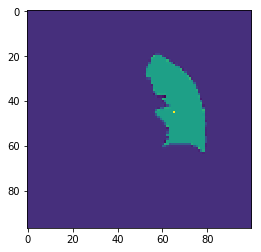

centroid: (array([45, 53, 65], dtype=int64),)
starting segmentation...


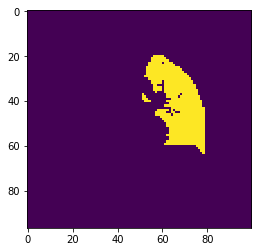

Elapsed time: 8.068 seconds.
51
Patient-id: 38133514
right


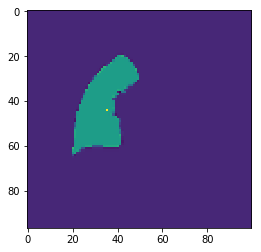

centroid: (array([44, 53, 35], dtype=int64),)
starting segmentation...


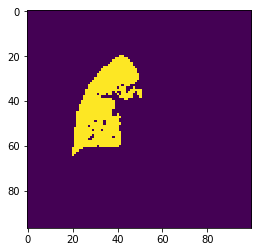

Elapsed time: 7.991 seconds.
52
Patient-id: 38564873
left


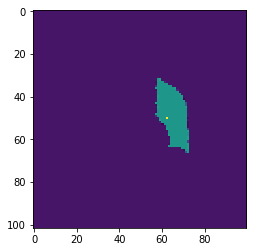

centroid: (array([50, 50, 62], dtype=int64),)
starting segmentation...


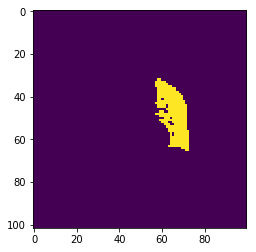

Elapsed time: 3.752 seconds.
53
Patient-id: 38564873
right


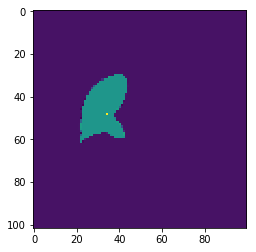

centroid: (array([48, 50, 34], dtype=int64),)
starting segmentation...


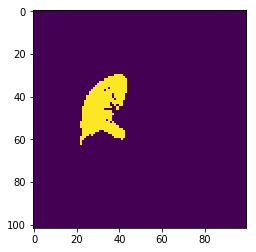

Elapsed time: 5.253 seconds.
54
Patient-id: 39002828
left


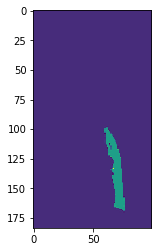

centroid: (array([133,  54,  67], dtype=int64),)
starting segmentation...


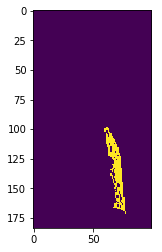

Elapsed time: 9.302 seconds.
55
Patient-id: 39002828
right


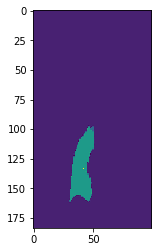

centroid: (array([133,  53,  42], dtype=int64),)
starting segmentation...


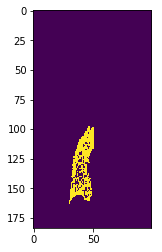

Elapsed time: 14.504 seconds.
56
Patient-id: 39137852
left


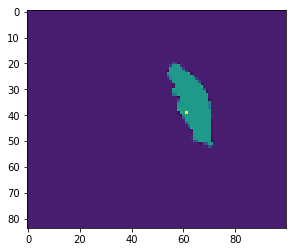

centroid: (array([39, 50, 61], dtype=int64),)
starting segmentation...


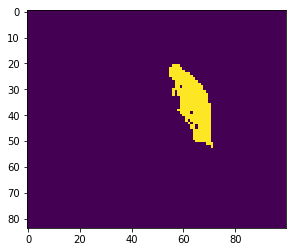

Elapsed time: 2.950 seconds.
57
Patient-id: 39137852
right


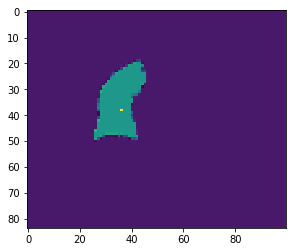

centroid: (array([38, 50, 36], dtype=int64),)
starting segmentation...


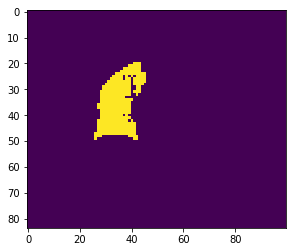

Elapsed time: 3.399 seconds.
58
Patient-id: 39256095
left


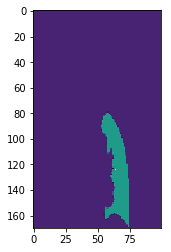

centroid: (array([124,  58,  64], dtype=int64),)
starting segmentation...


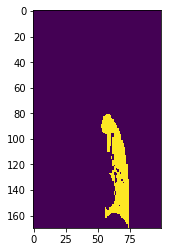

Elapsed time: 15.682 seconds.
59
Patient-id: 39256095
right


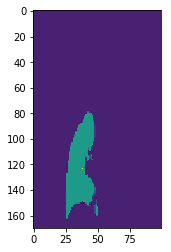

centroid: (array([123,  58,  38], dtype=int64),)
starting segmentation...


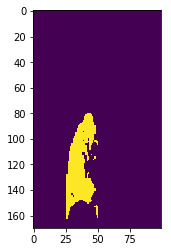

Elapsed time: 18.861 seconds.
60
Patient-id: 39524591
left


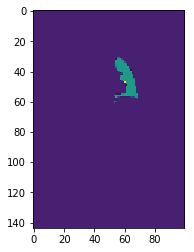

centroid: (array([47, 50, 60], dtype=int64),)
starting segmentation...


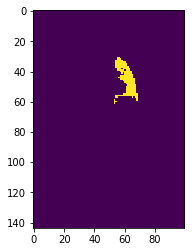

Elapsed time: 2.047 seconds.
61
Patient-id: 39524591
right


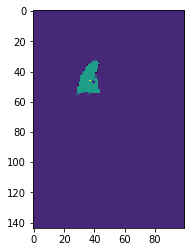

centroid: (array([46, 47, 37], dtype=int64),)
starting segmentation...


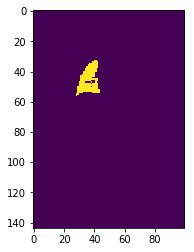

Elapsed time: 2.539 seconds.
62
Patient-id: 39819471
left


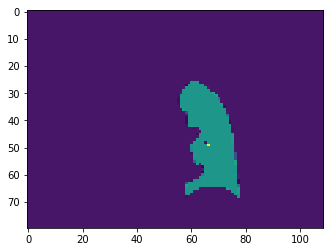

centroid: (array([49, 60, 66], dtype=int64),)
starting segmentation...


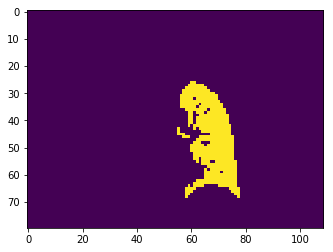

Elapsed time: 4.067 seconds.
63
Patient-id: 39819471
right


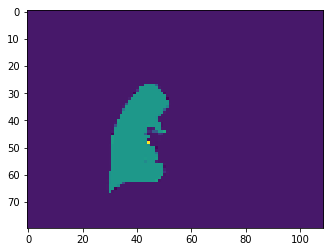

centroid: (array([48, 59, 44], dtype=int64),)
starting segmentation...


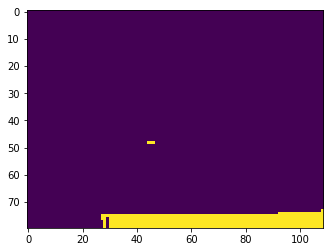

Elapsed time: 13.703 seconds.
64
Patient-id: 39844012
left


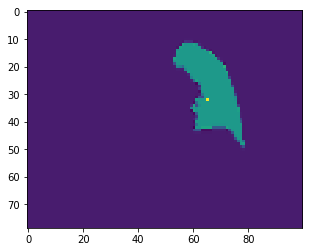

centroid: (array([32, 48, 65], dtype=int64),)
starting segmentation...


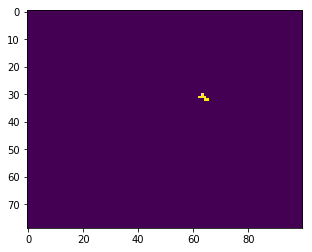

Elapsed time: 0.042 seconds.
65
Patient-id: 39844012
right


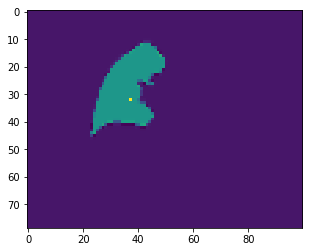

centroid: (array([32, 47, 37], dtype=int64),)
starting segmentation...


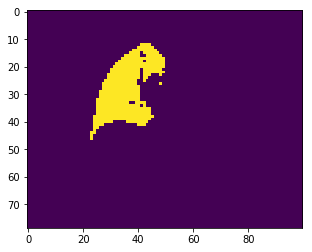

Elapsed time: 5.989 seconds.
66
Patient-id: 39859629
left


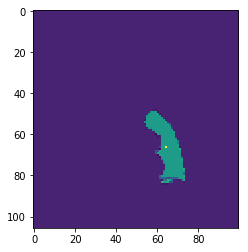

centroid: (array([66, 56, 64], dtype=int64),)
starting segmentation...


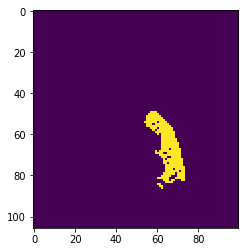

Elapsed time: 4.323 seconds.
67
Patient-id: 39859629
right


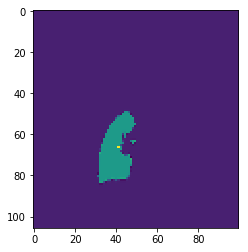

centroid: (array([66, 56, 41], dtype=int64),)
starting segmentation...


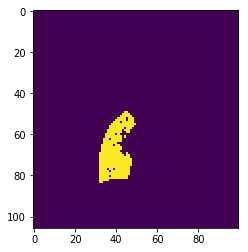

Elapsed time: 5.467 seconds.
68
Patient-id: 39929954
left


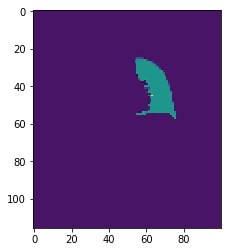

centroid: (array([45, 50, 63], dtype=int64),)
starting segmentation...


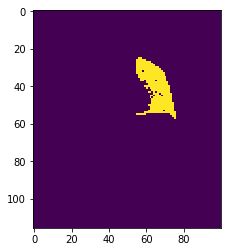

Elapsed time: 5.589 seconds.
69
Patient-id: 39929954
right


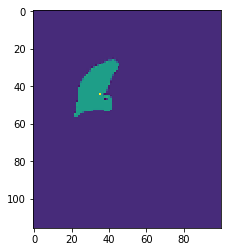

centroid: (array([44, 48, 35], dtype=int64),)
starting segmentation...


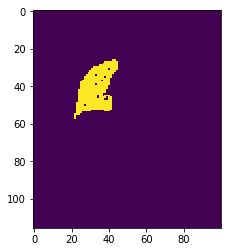

Elapsed time: 6.052 seconds.
70
Patient-id: 39980297
left


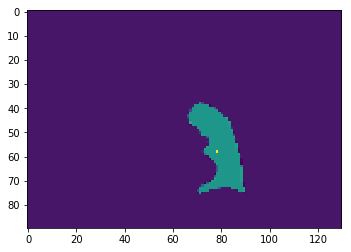

centroid: (array([58, 65, 78], dtype=int64),)
starting segmentation...


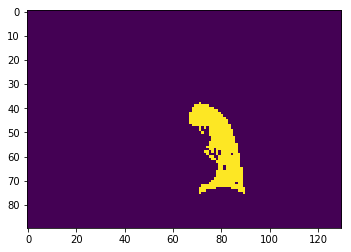

Elapsed time: 5.462 seconds.
71
Patient-id: 39980297
right


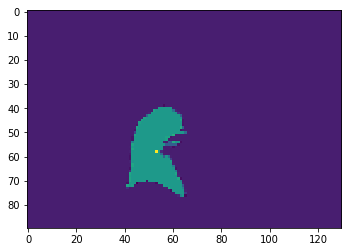

centroid: (array([58, 65, 53], dtype=int64),)
starting segmentation...


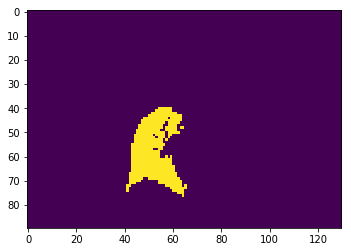

Elapsed time: 7.182 seconds.
72
Patient-id: 40165373
left


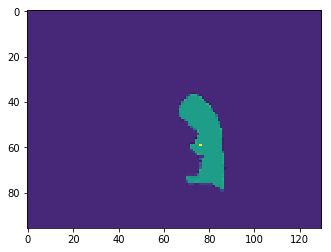

centroid: (array([59, 64, 76], dtype=int64),)
starting segmentation...


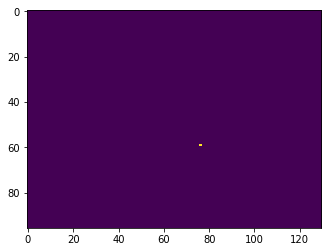

Elapsed time: 0.021 seconds.
73
Patient-id: 40165373
right


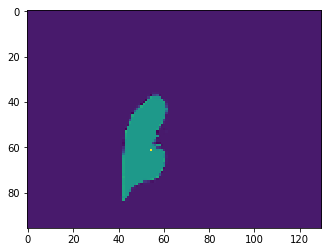

centroid: (array([61, 62, 54], dtype=int64),)
starting segmentation...


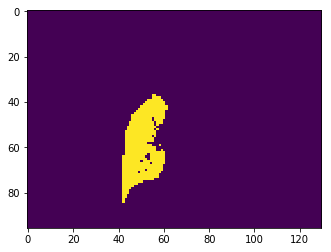

Elapsed time: 6.294 seconds.
74
Patient-id: 40283713
left


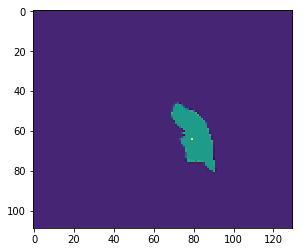

centroid: (array([64, 65, 79], dtype=int64),)
starting segmentation...


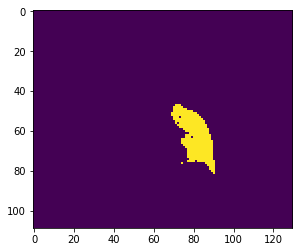

Elapsed time: 6.340 seconds.
75
Patient-id: 40283713
right


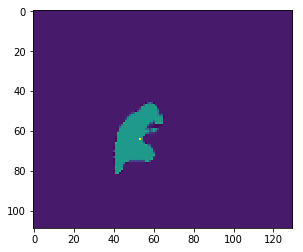

centroid: (array([64, 65, 53], dtype=int64),)
starting segmentation...


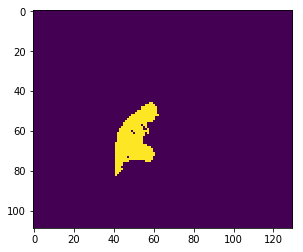

Elapsed time: 7.569 seconds.
76
Patient-id: 40433190
right


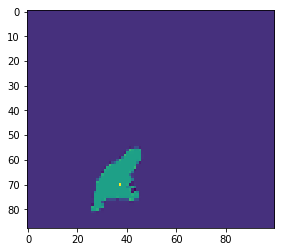

centroid: (array([70, 45, 37], dtype=int64),)
starting segmentation...


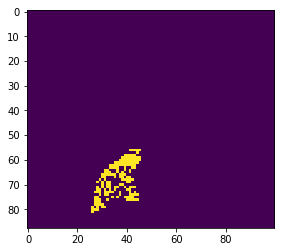

Elapsed time: 2.740 seconds.
77
Patient-id: 40470341
left


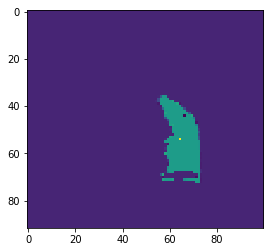

centroid: (array([54, 52, 64], dtype=int64),)
starting segmentation...


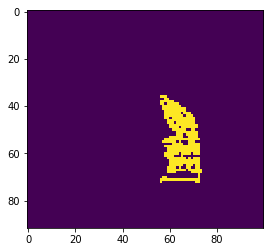

Elapsed time: 2.740 seconds.
78
Patient-id: 40470341
right


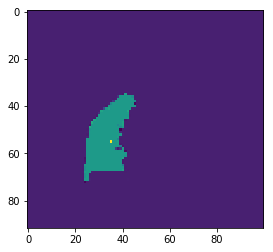

centroid: (array([55, 51, 35], dtype=int64),)
starting segmentation...


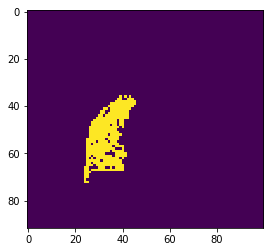

Elapsed time: 3.263 seconds.
79
Patient-id: 40584316
left


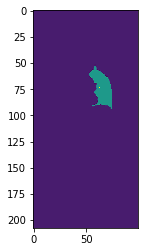

centroid: (array([73, 52, 63], dtype=int64),)
starting segmentation...


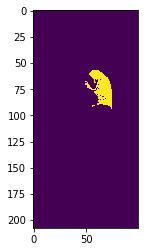

Elapsed time: 6.684 seconds.
80
Patient-id: 40584316
right


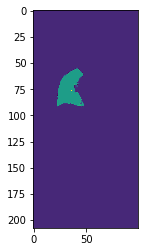

centroid: (array([76, 52, 36], dtype=int64),)
starting segmentation...


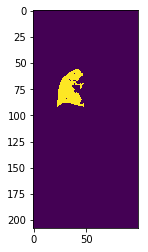

Elapsed time: 8.156 seconds.
81
Patient-id: 41265741
left


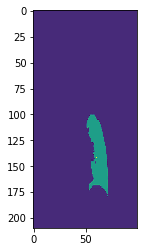

centroid: (array([142,  57,  61], dtype=int64),)
starting segmentation...


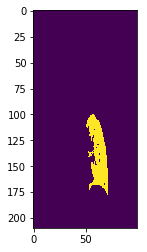

Elapsed time: 14.867 seconds.
82
Patient-id: 41265741
right


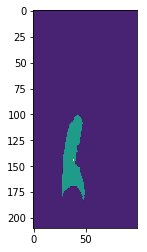

centroid: (array([144,  55,  38], dtype=int64),)
starting segmentation...


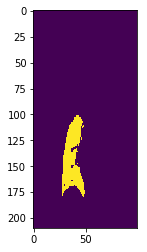

Elapsed time: 18.993 seconds.
83
Patient-id: 42242822
left


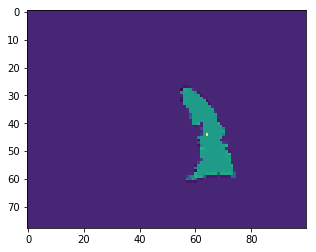

centroid: (array([44, 54, 64], dtype=int64),)
starting segmentation...


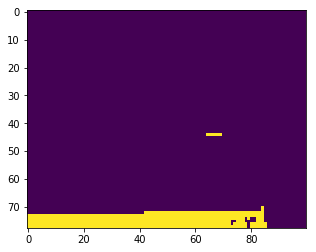

Elapsed time: 10.351 seconds.
84
Patient-id: 42715988
left


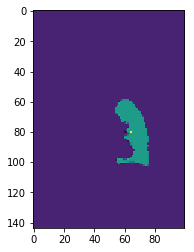

centroid: (array([80, 59, 64], dtype=int64),)
starting segmentation...


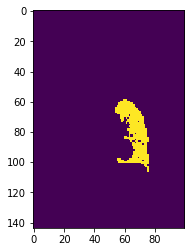

Elapsed time: 5.608 seconds.
85
Patient-id: 42715988
right


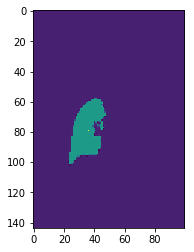

centroid: (array([79, 58, 36], dtype=int64),)
starting segmentation...


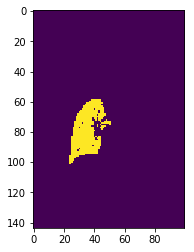

Elapsed time: 7.427 seconds.
86
Patient-id: 43109032
left


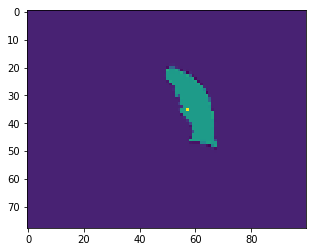

centroid: (array([35, 48, 57], dtype=int64),)
starting segmentation...


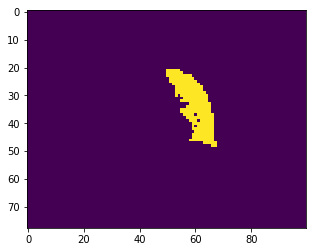

Elapsed time: 2.041 seconds.
87
Patient-id: 43109032
right


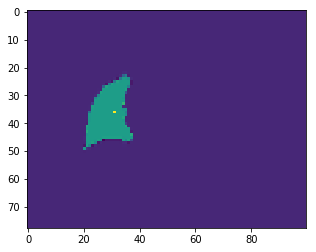

centroid: (array([36, 46, 31], dtype=int64),)
starting segmentation...


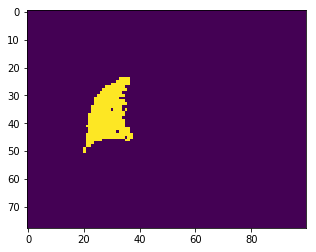

Elapsed time: 2.905 seconds.
88
Patient-id: 43151324
left


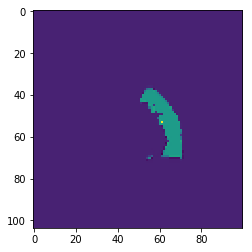

centroid: (array([53, 54, 61], dtype=int64),)
starting segmentation...


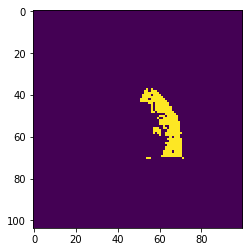

Elapsed time: 2.275 seconds.
89
Patient-id: 43151324
right


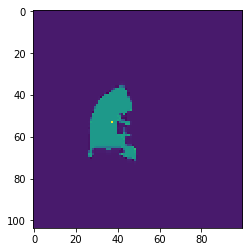

centroid: (array([53, 52, 37], dtype=int64),)
starting segmentation...


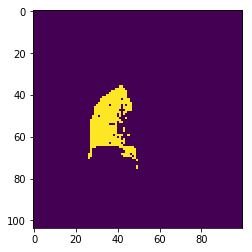

Elapsed time: 3.565 seconds.
90
Patient-id: 43181879
left


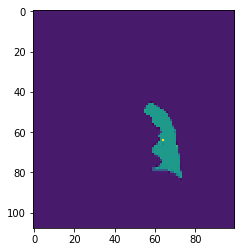

centroid: (array([64, 52, 64], dtype=int64),)
starting segmentation...


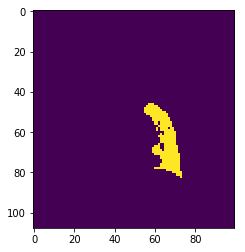

Elapsed time: 2.992 seconds.
91
Patient-id: 43181879
right


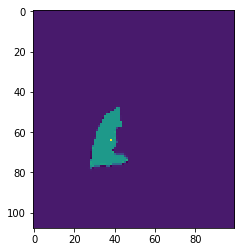

centroid: (array([64, 50, 38], dtype=int64),)
starting segmentation...


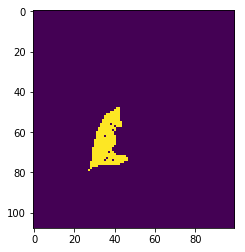

Elapsed time: 3.544 seconds.
92
Patient-id: 43266075
left


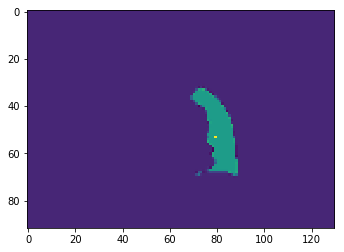

centroid: (array([53, 65, 79], dtype=int64),)
starting segmentation...


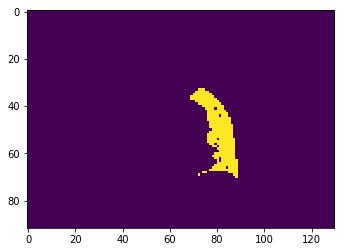

Elapsed time: 4.314 seconds.
93
Patient-id: 43266075
right


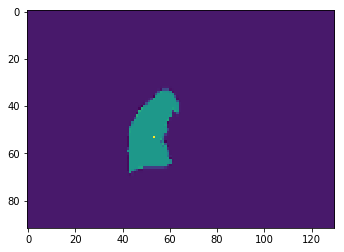

centroid: (array([53, 63, 53], dtype=int64),)
starting segmentation...


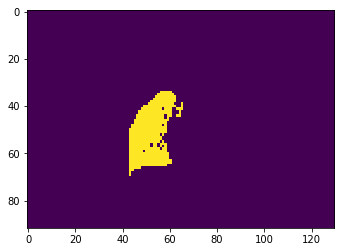

Elapsed time: 5.942 seconds.
94
Patient-id: 43405561
left


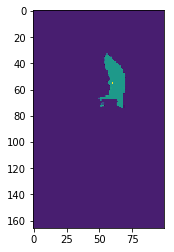

centroid: (array([55, 53, 60], dtype=int64),)
starting segmentation...


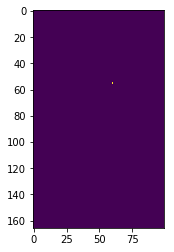

Elapsed time: 0.036 seconds.
95
Patient-id: 43405561
right


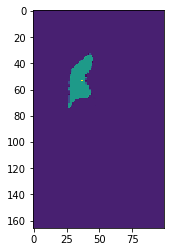

centroid: (array([53, 52, 37], dtype=int64),)
starting segmentation...


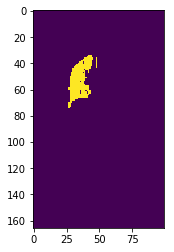

Elapsed time: 6.614 seconds.
96
Patient-id: 43675706
left


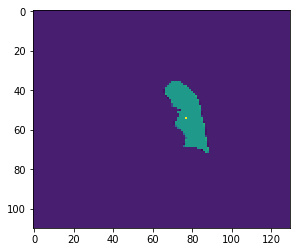

centroid: (array([54, 64, 77], dtype=int64),)
starting segmentation...


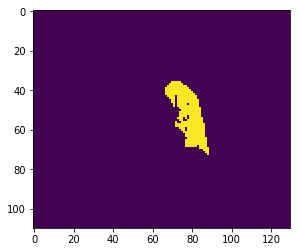

Elapsed time: 5.678 seconds.
97
Patient-id: 43675706
right


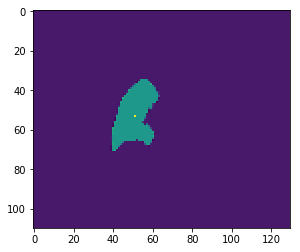

centroid: (array([53, 64, 51], dtype=int64),)
starting segmentation...


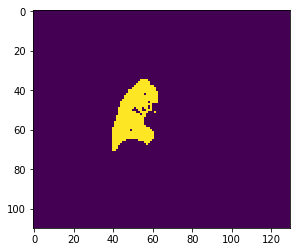

Elapsed time: 6.778 seconds.
98
Patient-id: 44120063
left


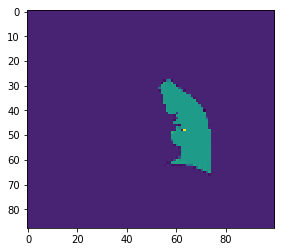

centroid: (array([48, 52, 63], dtype=int64),)
starting segmentation...


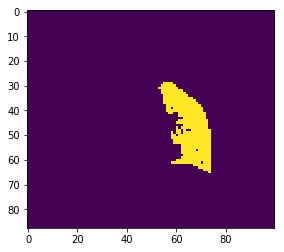

Elapsed time: 3.343 seconds.
99
Patient-id: 44120063
right


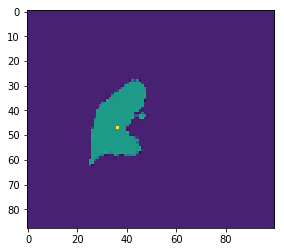

centroid: (array([47, 52, 36], dtype=int64),)
starting segmentation...


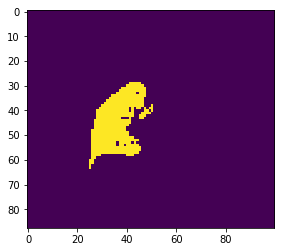

Elapsed time: 3.759 seconds.
100
Patient-id: 44253050
left


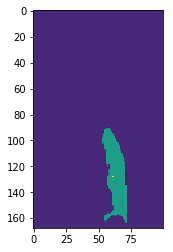

centroid: (array([128,  50,  61], dtype=int64),)
starting segmentation...


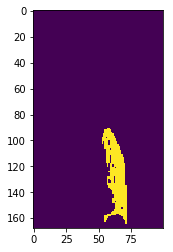

Elapsed time: 9.321 seconds.
101
Patient-id: 44253050
right


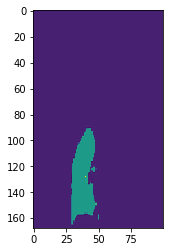

centroid: (array([128,  50,  40], dtype=int64),)
starting segmentation...


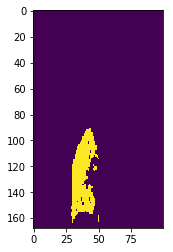

Elapsed time: 11.177 seconds.
102
Patient-id: 44422897
left


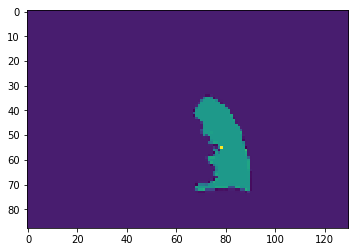

centroid: (array([55, 66, 78], dtype=int64),)
starting segmentation...


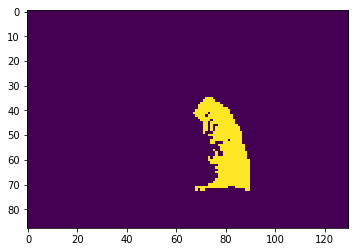

Elapsed time: 7.059 seconds.
103
Patient-id: 44422897
right


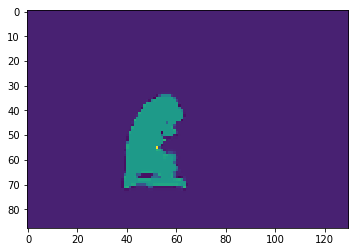

centroid: (array([55, 66, 52], dtype=int64),)
starting segmentation...


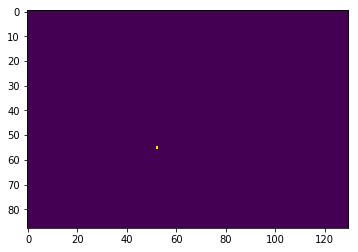

Elapsed time: 0.026 seconds.
104
Patient-id: 45858788
left


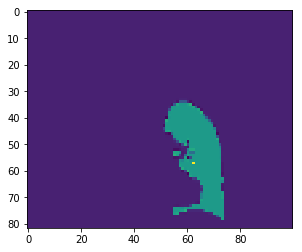

centroid: (array([57, 58, 62], dtype=int64),)
starting segmentation...


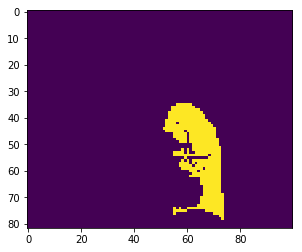

Elapsed time: 3.505 seconds.
105
Patient-id: 45858788
right


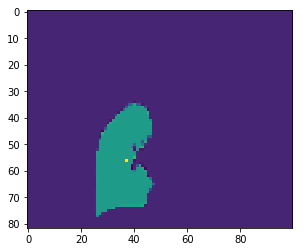

centroid: (array([56, 57, 37], dtype=int64),)
starting segmentation...


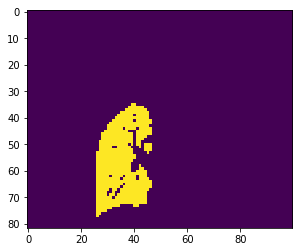

Elapsed time: 5.313 seconds.
106
Patient-id: 46318956
left


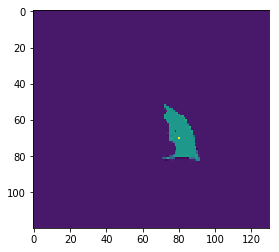

centroid: (array([70, 71, 80], dtype=int64),)
starting segmentation...


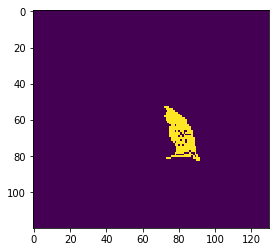

Elapsed time: 5.573 seconds.
107
Patient-id: 46318956
right


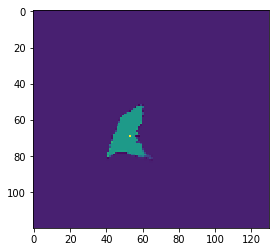

centroid: (array([69, 70, 53], dtype=int64),)
starting segmentation...


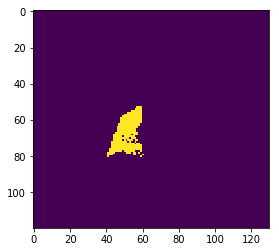

Elapsed time: 6.612 seconds.
108
Patient-id: 47262863
left


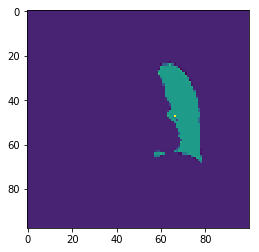

centroid: (array([47, 51, 66], dtype=int64),)
starting segmentation...


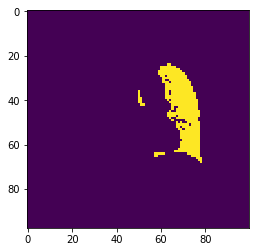

Elapsed time: 5.543 seconds.
109
Patient-id: 47262863
right


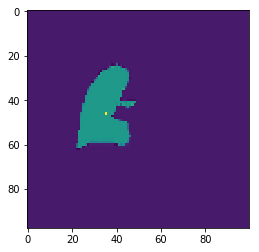

centroid: (array([46, 51, 35], dtype=int64),)
starting segmentation...


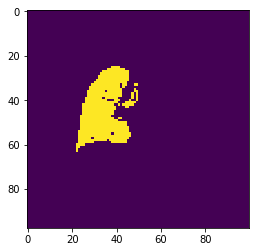

Elapsed time: 6.042 seconds.
110
Patient-id: 47295940
left


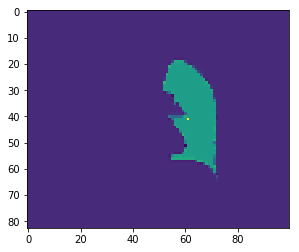

centroid: (array([41, 55, 61], dtype=int64),)
starting segmentation...


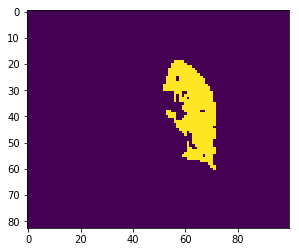

Elapsed time: 3.870 seconds.
111
Patient-id: 47295940
right


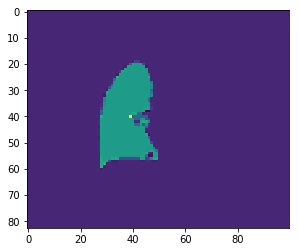

centroid: (array([40, 55, 39], dtype=int64),)
starting segmentation...


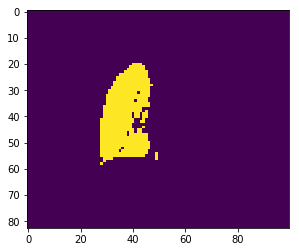

Elapsed time: 3.589 seconds.
112
Patient-id: 48148279
left


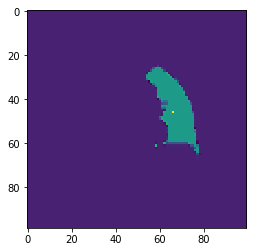

centroid: (array([46, 49, 66], dtype=int64),)
starting segmentation...


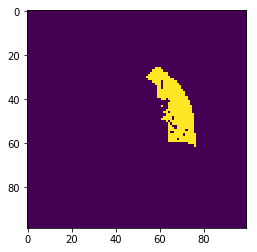

Elapsed time: 3.911 seconds.
113
Patient-id: 48148279
right


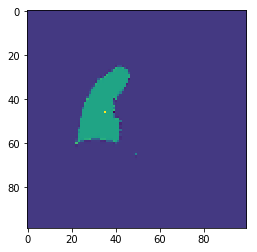

centroid: (array([46, 48, 35], dtype=int64),)
starting segmentation...


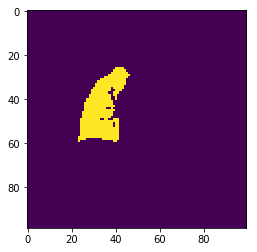

Elapsed time: 4.561 seconds.
114
Patient-id: 48259441
left
Im zero
Im zero


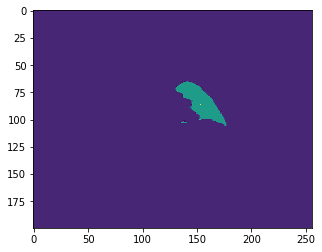

centroid: (array([ 86, 134, 153], dtype=int64),)
starting segmentation...


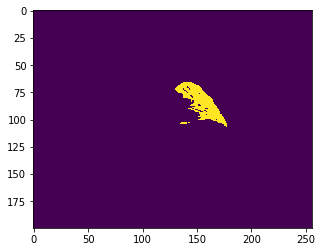

Elapsed time: 161.104 seconds.
115
Patient-id: 48259441
right
Im zero
Im zero


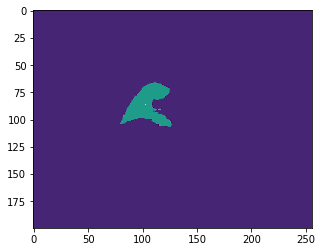

centroid: (array([ 86, 133, 103], dtype=int64),)
starting segmentation...


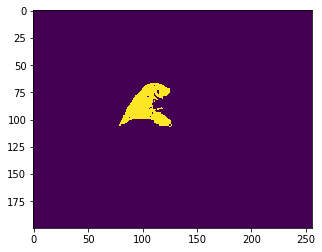

Elapsed time: 172.595 seconds.
116
Patient-id: 48335198
right


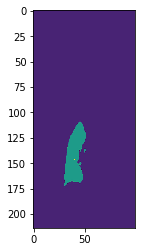

centroid: (array([146,  62,  40], dtype=int64),)
starting segmentation...


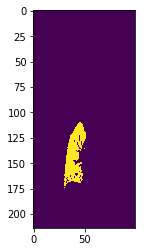

Elapsed time: 11.145 seconds.
117
Patient-id: 48389421
left


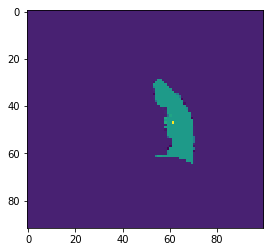

centroid: (array([47, 48, 61], dtype=int64),)
starting segmentation...


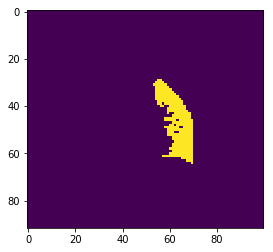

Elapsed time: 2.340 seconds.
118
Patient-id: 48389421
right


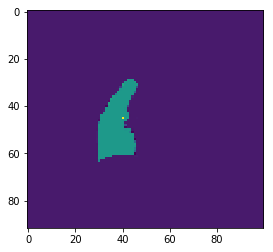

centroid: (array([45, 48, 40], dtype=int64),)
starting segmentation...


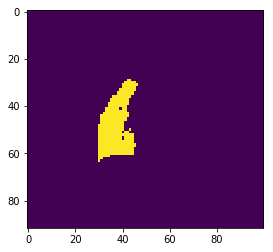

Elapsed time: 2.640 seconds.
119
Patient-id: 48684980
left


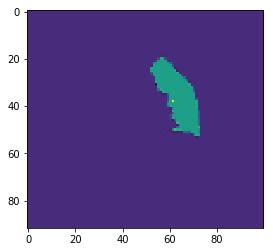

centroid: (array([38, 53, 61], dtype=int64),)
starting segmentation...


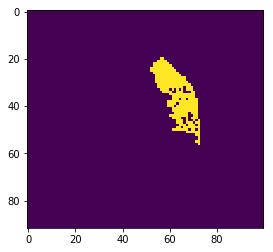

Elapsed time: 2.568 seconds.
120
Patient-id: 48684980
right


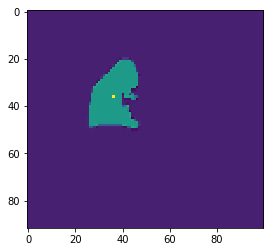

centroid: (array([36, 53, 36], dtype=int64),)
starting segmentation...


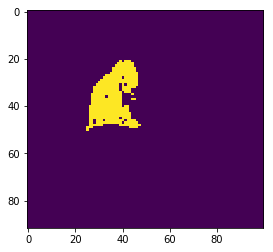

Elapsed time: 2.911 seconds.
121
Patient-id: 49174830
left


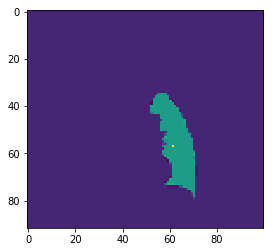

centroid: (array([57, 57, 61], dtype=int64),)
starting segmentation...


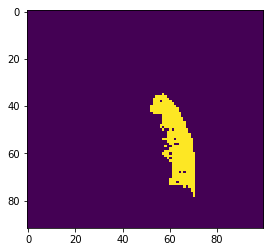

Elapsed time: 3.321 seconds.
122
Patient-id: 49174830
right


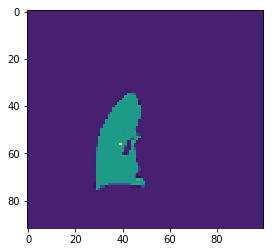

centroid: (array([56, 57, 39], dtype=int64),)
starting segmentation...


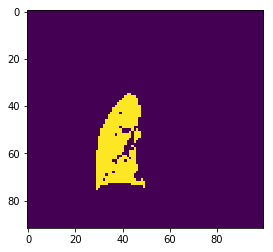

Elapsed time: 4.374 seconds.
123
Patient-id: 51927593
right
Im zero
Im zero


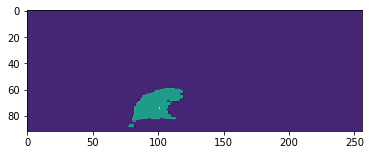

centroid: (array([ 74, 143, 101], dtype=int64),)
starting segmentation...


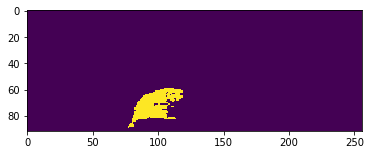

Elapsed time: 79.883 seconds.
124
Patient-id: 52016057
left


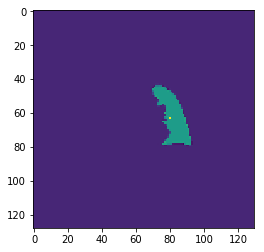

centroid: (array([63, 70, 80], dtype=int64),)
starting segmentation...


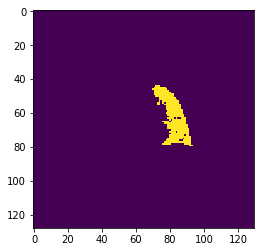

Elapsed time: 7.594 seconds.
125
Patient-id: 52016057
right


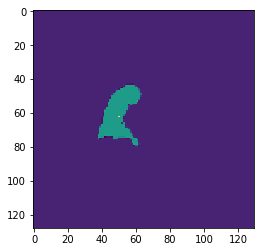

centroid: (array([62, 69, 50], dtype=int64),)
starting segmentation...


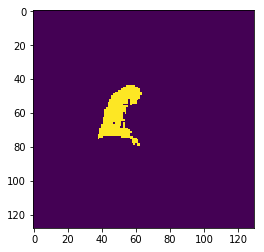

Elapsed time: 8.777 seconds.
126
Patient-id: 52075421
left


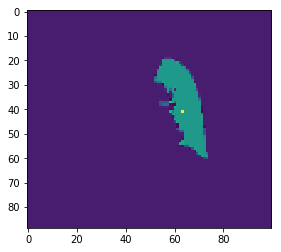

centroid: (array([41, 55, 63], dtype=int64),)
starting segmentation...


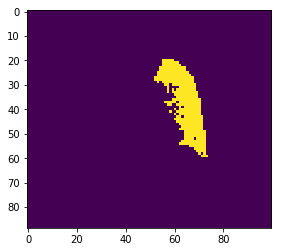

Elapsed time: 3.021 seconds.
127
Patient-id: 52075421
right


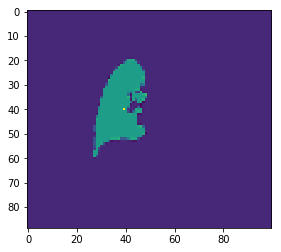

centroid: (array([40, 54, 39], dtype=int64),)
starting segmentation...


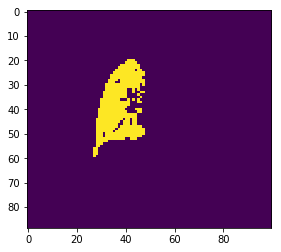

Elapsed time: 4.147 seconds.
128
Patient-id: 54828475
left


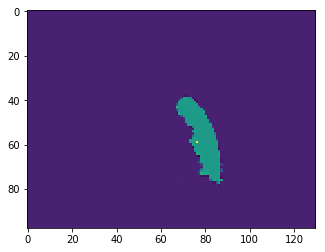

centroid: (array([59, 66, 76], dtype=int64),)
starting segmentation...


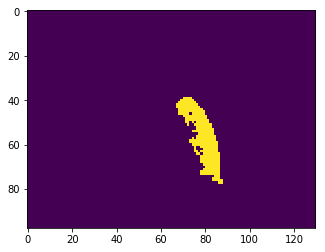

Elapsed time: 4.850 seconds.
129
Patient-id: 54828475
right


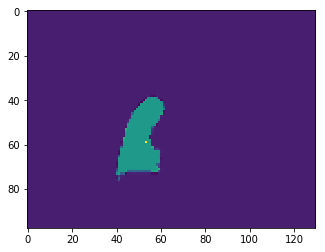

centroid: (array([59, 65, 53], dtype=int64),)
starting segmentation...


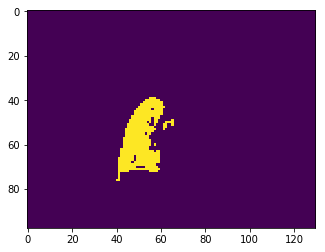

Elapsed time: 6.792 seconds.
130
Patient-id: 57220883
left


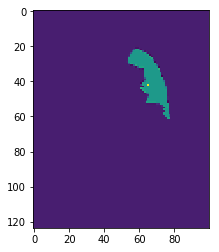

centroid: (array([42, 50, 65], dtype=int64),)
starting segmentation...


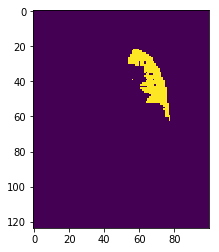

Elapsed time: 3.513 seconds.
131
Patient-id: 57220883
right


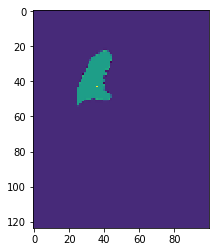

centroid: (array([43, 47, 36], dtype=int64),)
starting segmentation...


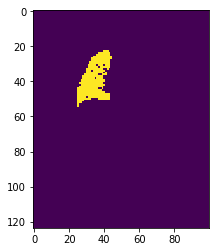

Elapsed time: 4.176 seconds.


In [3]:
from segmentation_functions import resample, grow
from finding_biggest_lung import arrange_slices, normalization, creating_mask
from automaticSeeding import find_seed
import numpy as np
import os
import matplotlib.pyplot as plt
import scipy.io as spio
import pydicom
import time
from math import sqrt

slices_path = "G:/CTimages/"
indices_path ="G:/Plans/CT/Lungs/ok/Separate Lungs"
seeds_path = "G:/CTimagens/CT/Images/Seeds/"
separation_path = "G:/CTImages/CT/Images/Separator/"
centroid_path = "G:/CTimages/CT/Images/Centroids/"
segmentations_results_path = "G:/Plans/CT/Lungs/segmentation_results/Non_iterative/Centroid"
indices_folder= os.listdir(indices_path)
 
a=0
centroides = np.load(centroid_path+'centroides_all.npy')
for num,each_mask in enumerate(indices_folder):

    print(num)
    #Loading data--------------------------------------------------------------------------------------------------------
    opened = spio.loadmat(indices_path+'/'+each_mask, squeeze_me=True)["indexes"]
    patient_id = each_mask.split(" ", each_mask.count(each_mask))[0] 
    separador = spio.loadmat(separation_path+'/'+patient_id+'_separator', squeeze_me=True)["separator"]
    pre_region = each_mask.split("_", each_mask.count(each_mask))[1]
    region = pre_region.split("_", pre_region.count(pre_region))[0]
    
    print("Patient-id: "+ str(patient_id))
    print(region)
    
    #Reading the data--------------------------------------------------------------------------------------------------------
    slices= arrange_slices(slices_path,patient_id)
    normalized_volume=normalization(slices)
    normalized_array = np.array(normalized_volume)
    
    #Separating left and right side------------------------------------------------------------------------------------------
    volume = np.zeros(normalized_array.shape) #possible improvement: define the non-used side to the minimum intensity
    cols = normalized_array.shape[2]
    
    if region =='left':
        volume[:,:,separador:cols] = normalized_array[:,:,separador:cols]
    elif region =='right':
        volume[:,:,0:separador] = normalized_array[:,:,0:separador]
    volume_resampled, spacing = resample(volume, slices, [5,5,5])
    
    
    #Mask-----------------------------------------------------------------------------------------------------------------
    lung_mask = creating_mask(opened,normalized_array)
    lung_mask_resampled, spacing = resample(lung_mask, slices, [5,5,5])

    #Centroids--------------------------------------------------------------------------------------------------------------
    
    centroid = tuple(centroides[num])
    
    showing = lung_mask_resampled.copy()
    showing[tuple(centroid[0])]=2
    plt.imshow(showing[:,centroid[0][1],:])
    plt.show()
    print('centroid: '+str(centroid))
    
    #Segmentation--------------------------------------------------------------------------------------------------------------------

    thresh = 225

    first_seg = np.zeros(volume_resampled.shape, dtype=np.bool)
    print('starting segmentation...')
    pre_seed = tuple(centroid[0])
    start = time.time()
    seg, counter = grow(volume_resampled,pre_seed,thresh,1,first_seg)
    stop = time.time()
    plt.imshow(seg[:,centroid[0][1],:])
    plt.show()
    print("Elapsed time: %.3f seconds." % (stop - start))
    a=a+1

    #Saving------------------------------------------------------------------------------------------------------------------
    name = segmentations_results_path+"3DVolumeSegmented_"+str(patient_id)+'_'+str(region)+"_"+str(thresh)
    np.save(name, seg)
   
    del slices
    del seg
    del normalized_array
    del volume_resampled
    

# Segmentation - iterative

0
Patient-id: 10194022
left


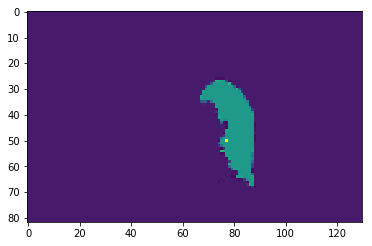

centroid: [[50 68 77]]
starting segmentation...
225


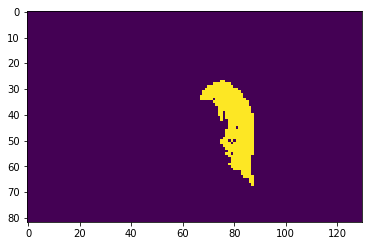

Elapsed time: 5.947 seconds.
1
Patient-id: 10194022
right


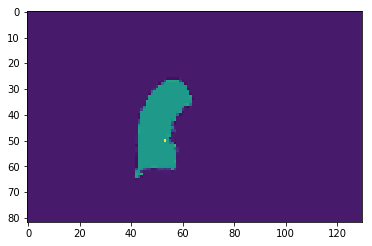

centroid: [[50 67 53]]
starting segmentation...
225


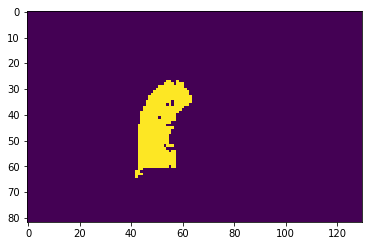

Elapsed time: 7.221 seconds.
2
Patient-id: 28838683
left


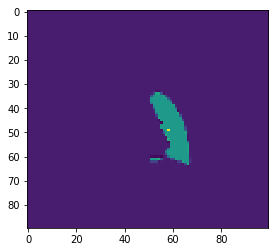

centroid: [[49 50 58]]
starting segmentation...
225


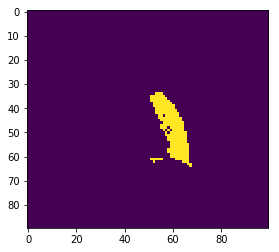

Elapsed time: 1.554 seconds.
3
Patient-id: 28838683
right


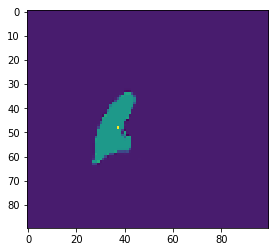

centroid: [[48 49 37]]
starting segmentation...
225


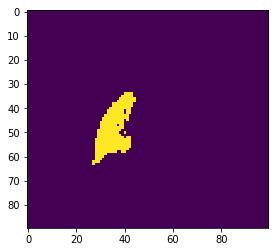

Elapsed time: 1.797 seconds.
4
Patient-id: 31022832
left


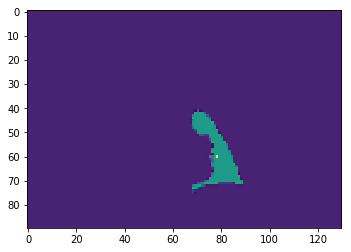

centroid: [[60 64 78]]
starting segmentation...
225


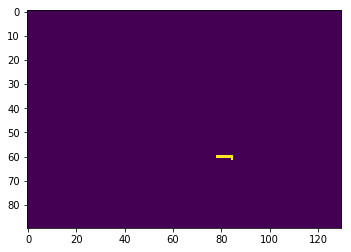

Elapsed time: 19.001 seconds.
5
Patient-id: 31022832
right


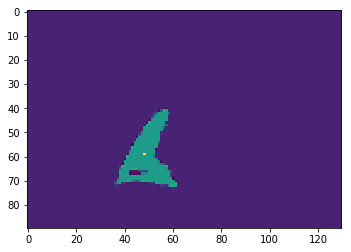

centroid: [[59 62 48]]
starting segmentation...
225


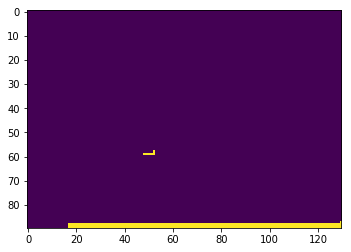

Elapsed time: 18.598 seconds.
6
Patient-id: 31119444
left


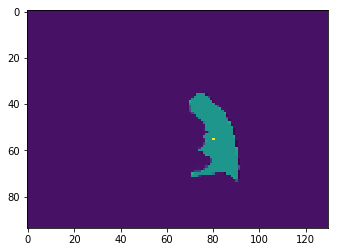

centroid: [[55 69 80]]
starting segmentation...
225


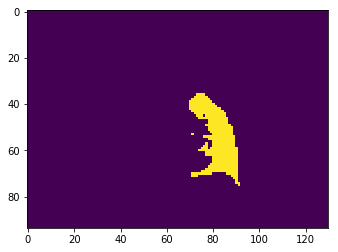

Elapsed time: 5.584 seconds.
7
Patient-id: 31119444
right


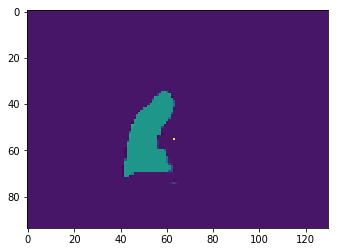

centroid: [[55 68 63]]
starting segmentation...
225


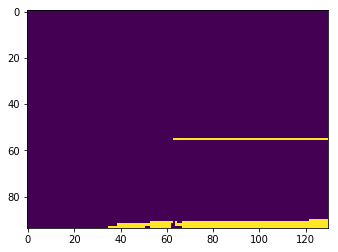

Elapsed time: 18.676 seconds.
8
Patient-id: 32064030
right


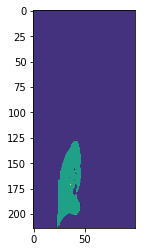

centroid: [[171  51  36]]
starting segmentation...
225


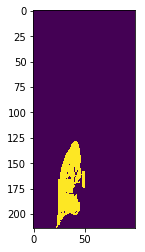

Elapsed time: 27.046 seconds.
9
Patient-id: 32407507
left


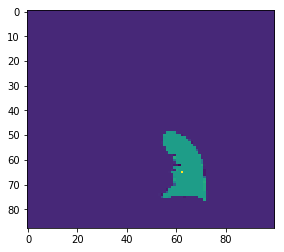

centroid: [[65 52 62]]
starting segmentation...
225


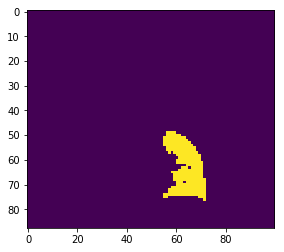

Elapsed time: 2.236 seconds.
10
Patient-id: 32407507
right


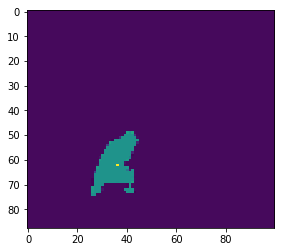

centroid: [[62 51 36]]
starting segmentation...
225


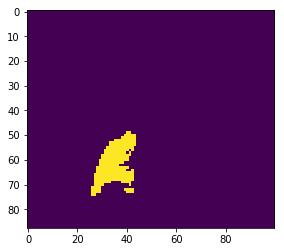

Elapsed time: 2.413 seconds.
11
Patient-id: 33515150
left


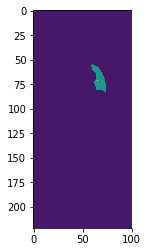

centroid: [[71 47 65]]
starting segmentation...
225


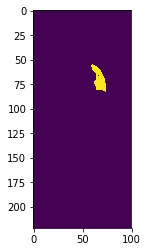

Elapsed time: 4.228 seconds.
12
Patient-id: 33515150
right


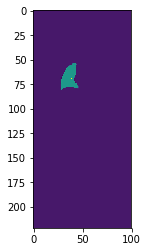

centroid: [[69 47 39]]
starting segmentation...
225


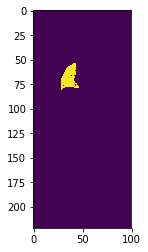

Elapsed time: 5.117 seconds.
13
Patient-id: 34332375
left


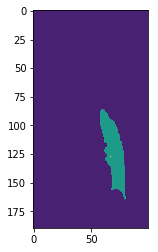

centroid: [[127  52  67]]
starting segmentation...
225


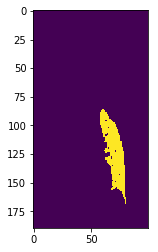

Elapsed time: 17.348 seconds.
14
Patient-id: 34332375
right


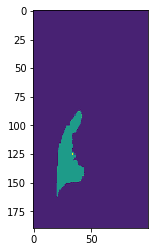

centroid: [[125  51  34]]
starting segmentation...
225


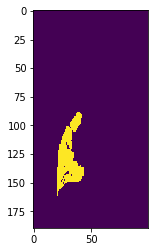

Elapsed time: 17.615 seconds.
15
Patient-id: 35196645
right


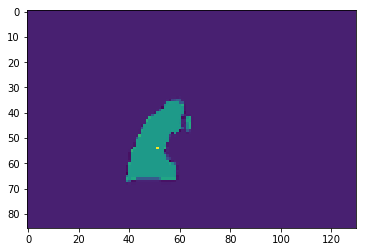

centroid: [[54 66 51]]
starting segmentation...
225


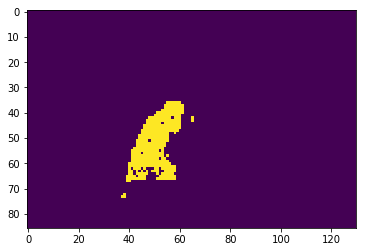

Elapsed time: 8.737 seconds.
16
Patient-id: 35939665
left


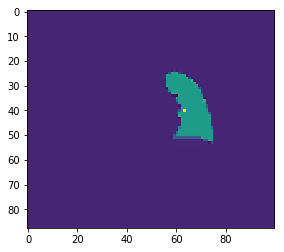

centroid: [[40 45 63]]
starting segmentation...
225


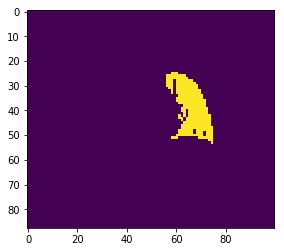

Elapsed time: 3.029 seconds.
17
Patient-id: 35939665
right


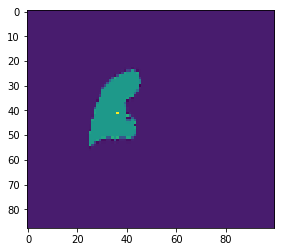

centroid: [[41 44 36]]
starting segmentation...
225


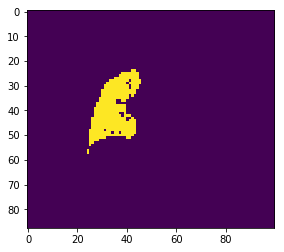

Elapsed time: 3.775 seconds.
18
Patient-id: 36319905
left


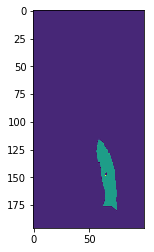

centroid: [[148  48  65]]
starting segmentation...
225


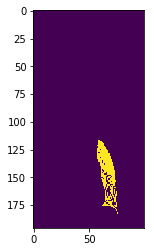

Elapsed time: 10.460 seconds.
19
Patient-id: 36319905
right


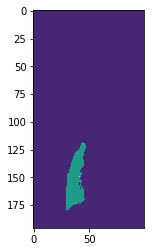

centroid: [[149  47  41]]
starting segmentation...
225


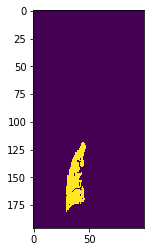

Elapsed time: 12.746 seconds.
20
Patient-id: 36778909
left


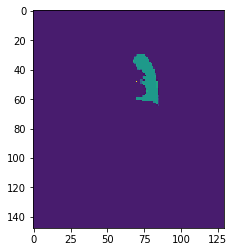

centroid: [[48 66 70]]
starting segmentation...
225


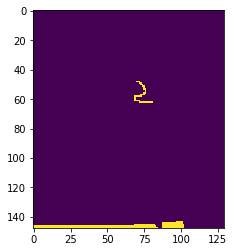

Elapsed time: 41.092 seconds.
21
Patient-id: 36778909
right


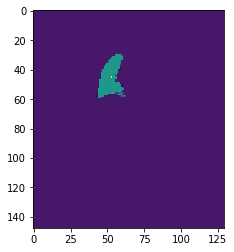

centroid: [[45 64 53]]
starting segmentation...
225


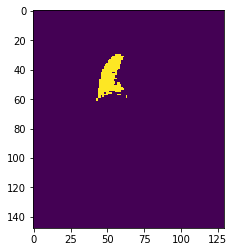

Elapsed time: 6.070 seconds.
22
Patient-id: 36873387
left


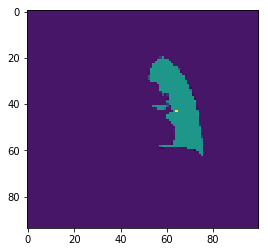

centroid: [[43 54 64]]
starting segmentation...
225


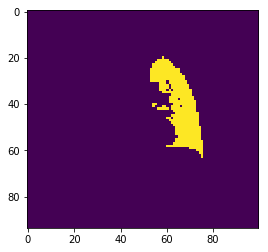

Elapsed time: 4.128 seconds.
23
Patient-id: 36873387
right


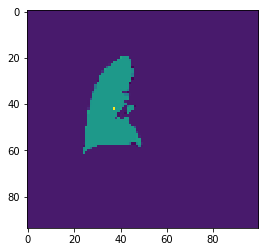

centroid: [[42 54 37]]
starting segmentation...
225


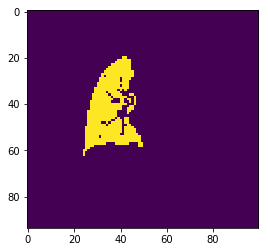

Elapsed time: 5.128 seconds.
24
Patient-id: 37017626
left


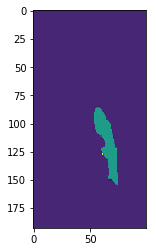

centroid: [[127  51  61]]
starting segmentation...
225


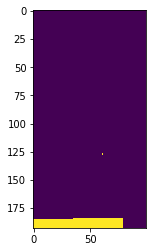

Elapsed time: 23.685 seconds.
25
Patient-id: 37017626
right


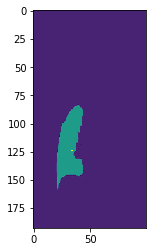

centroid: [[124  51  34]]
starting segmentation...
225


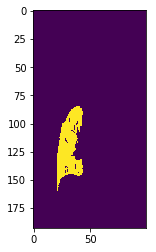

Elapsed time: 15.630 seconds.
26
Patient-id: 37018208
left


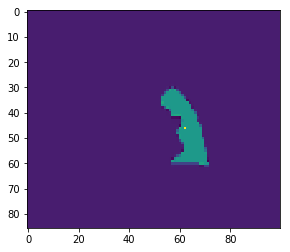

centroid: [[46 50 62]]
starting segmentation...
225


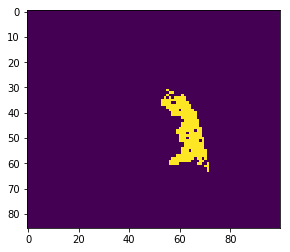

Elapsed time: 1.389 seconds.
27
Patient-id: 37018208
right


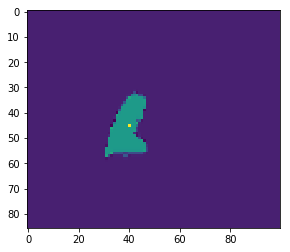

centroid: [[45 48 40]]
starting segmentation...
225


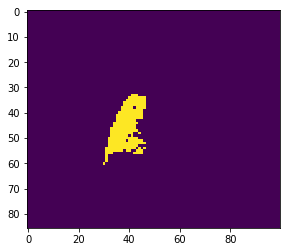

Elapsed time: 1.718 seconds.
28
Patient-id: 37042652
left


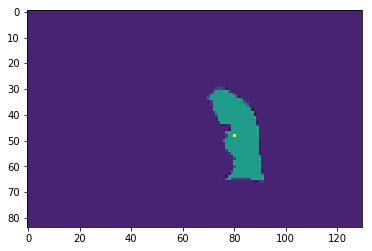

centroid: [[48 63 80]]
starting segmentation...
225


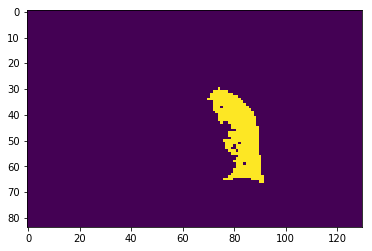

Elapsed time: 4.390 seconds.
29
Patient-id: 37042652
right


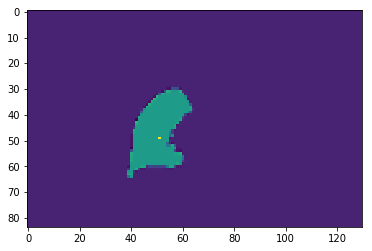

centroid: [[49 63 51]]
starting segmentation...
225


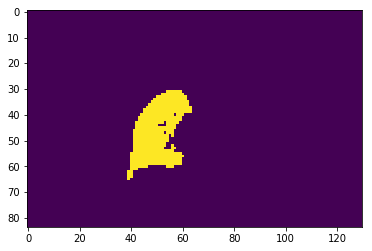

Elapsed time: 5.458 seconds.
30
Patient-id: 37137615
left


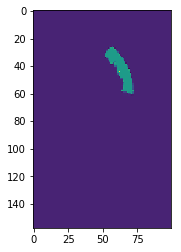

centroid: [[44 49 62]]
starting segmentation...
225


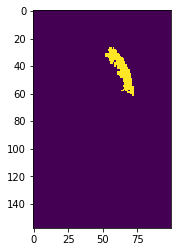

Elapsed time: 3.075 seconds.
31
Patient-id: 37137615
right


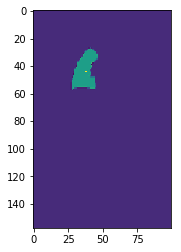

centroid: [[44 48 38]]
starting segmentation...
225


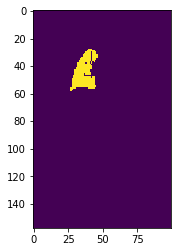

Elapsed time: 3.749 seconds.
32
Patient-id: 37173796
left


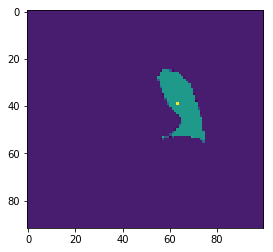

centroid: [[39 46 63]]
starting segmentation...
225


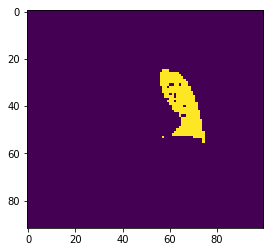

Elapsed time: 3.148 seconds.
33
Patient-id: 37173796
right


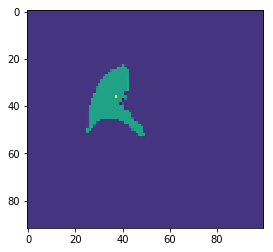

centroid: [[36 47 37]]
starting segmentation...
225


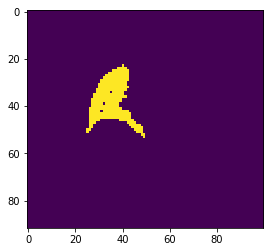

Elapsed time: 4.204 seconds.
34
Patient-id: 37468094
left


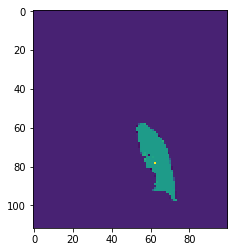

centroid: [[78 47 62]]
starting segmentation...
225


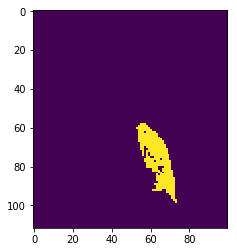

Elapsed time: 4.045 seconds.
35
Patient-id: 37468094
right


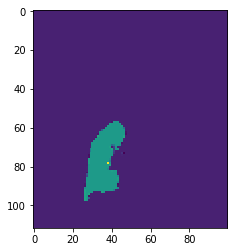

centroid: [[78 48 38]]
starting segmentation...
225


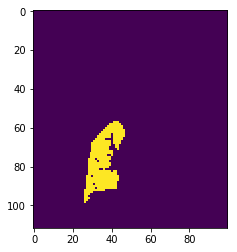

Elapsed time: 4.724 seconds.
36
Patient-id: 37606125
left


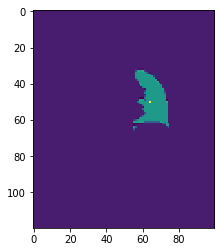

centroid: [[50 52 64]]
starting segmentation...
225


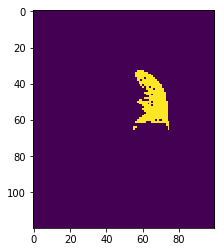

Elapsed time: 2.882 seconds.
37
Patient-id: 37606125
right


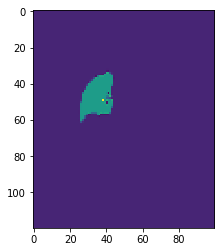

centroid: [[49 48 38]]
starting segmentation...
225
starting segmentation...
235


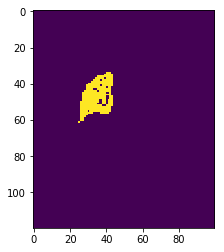

Elapsed time: 4.075 seconds.
38
Patient-id: 37624458
left


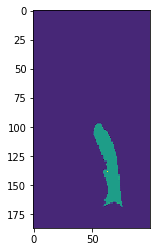

centroid: [[138  51  63]]
starting segmentation...
225


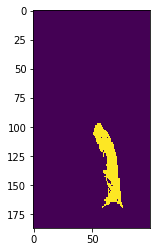

Elapsed time: 13.971 seconds.
39
Patient-id: 37624458
right


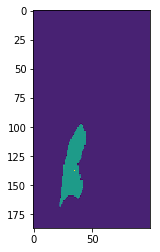

centroid: [[137  50  35]]
starting segmentation...
225


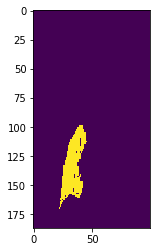

Elapsed time: 17.468 seconds.
40
Patient-id: 37650357
left


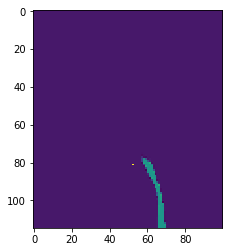

centroid: [[81 38 52]]
starting segmentation...
225


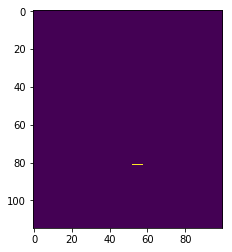

Elapsed time: 14.832 seconds.
41
Patient-id: 37650357
right


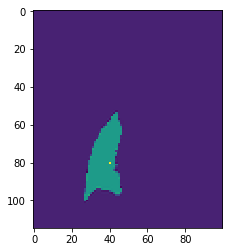

centroid: [[80 50 40]]
starting segmentation...
225


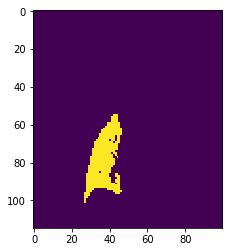

Elapsed time: 7.251 seconds.
42
Patient-id: 37683143
left


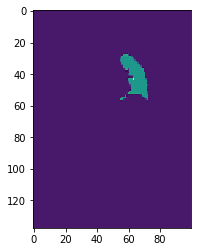

centroid: [[43 50 63]]
starting segmentation...
225


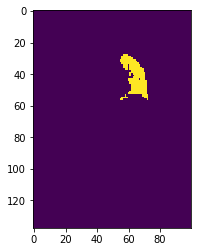

Elapsed time: 2.527 seconds.
43
Patient-id: 37683143
right


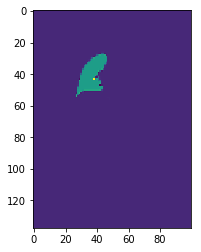

centroid: [[43 49 38]]
starting segmentation...
225


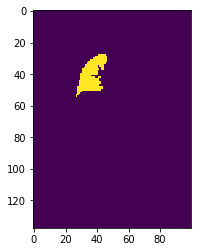

Elapsed time: 2.967 seconds.
44
Patient-id: 37881605
left


C:\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:605: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


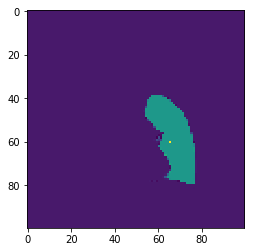

centroid: [[60 52 65]]
starting segmentation...
225


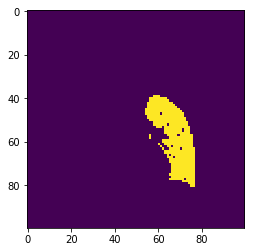

Elapsed time: 3.911 seconds.
45
Patient-id: 37881605
right


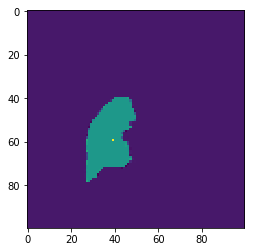

centroid: [[59 53 39]]
starting segmentation...
225


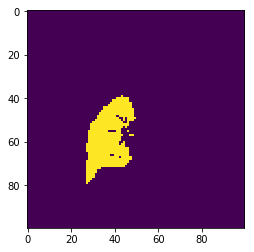

Elapsed time: 4.064 seconds.
46
Patient-id: 37953385
left


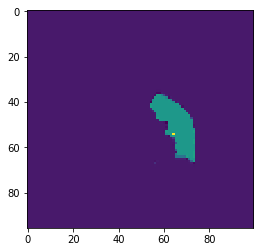

centroid: [[54 51 64]]
starting segmentation...
225


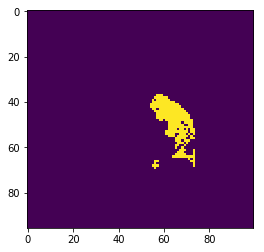

Elapsed time: 2.583 seconds.
47
Patient-id: 37953385
right


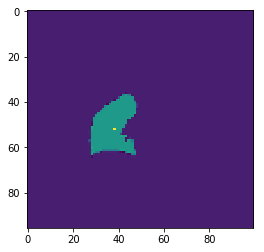

centroid: [[52 50 38]]
starting segmentation...
225


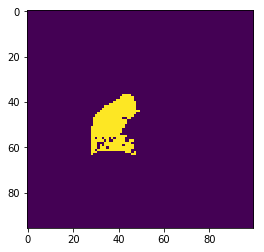

Elapsed time: 3.155 seconds.
48
Patient-id: 38028657
left


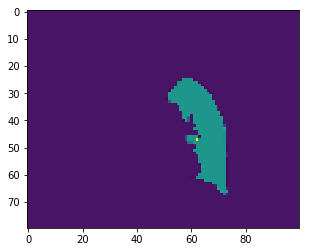

centroid: [[47 50 62]]
starting segmentation...
225


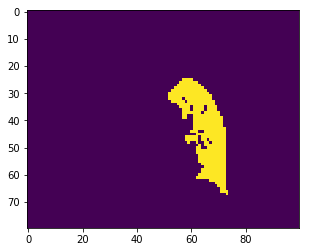

Elapsed time: 3.092 seconds.
49
Patient-id: 38028657
right


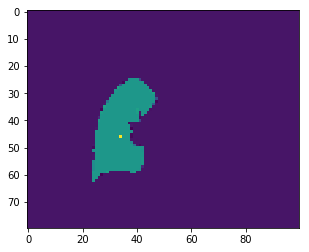

centroid: [[46 49 34]]
starting segmentation...
225


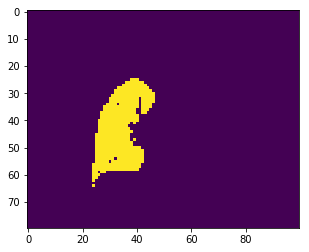

Elapsed time: 3.958 seconds.
50
Patient-id: 38133514
left


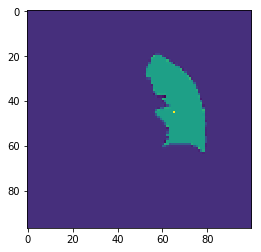

centroid: [[45 53 65]]
starting segmentation...
225


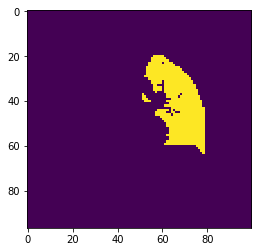

Elapsed time: 8.536 seconds.
51
Patient-id: 38133514
right


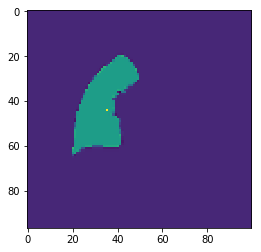

centroid: [[44 53 35]]
starting segmentation...
225


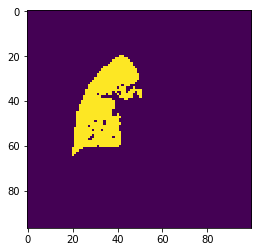

Elapsed time: 8.404 seconds.
52
Patient-id: 38564873
left


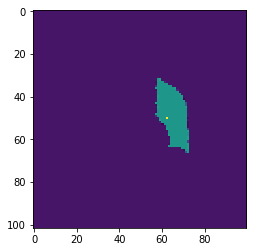

centroid: [[50 50 62]]
starting segmentation...
225


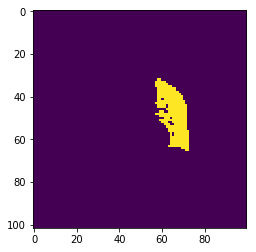

Elapsed time: 4.133 seconds.
53
Patient-id: 38564873
right


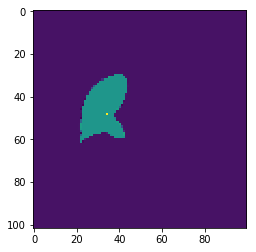

centroid: [[48 50 34]]
starting segmentation...
225


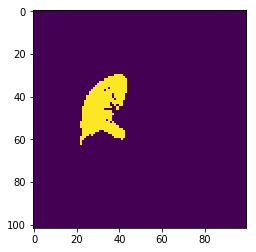

Elapsed time: 5.449 seconds.
54
Patient-id: 39002828
left


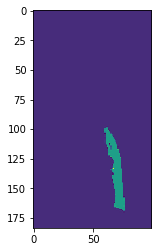

centroid: [[133  54  67]]
starting segmentation...
225


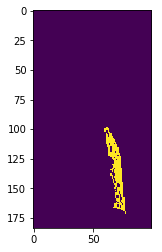

Elapsed time: 10.184 seconds.
55
Patient-id: 39002828
right


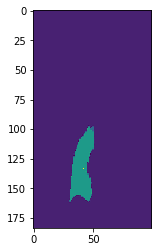

centroid: [[133  53  42]]
starting segmentation...
225


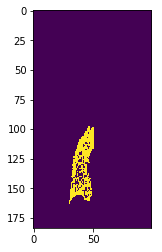

Elapsed time: 16.337 seconds.
56
Patient-id: 39137852
left


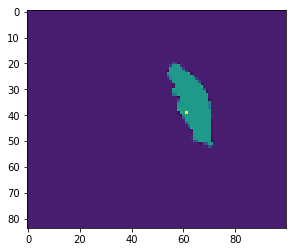

centroid: [[39 50 61]]
starting segmentation...
225


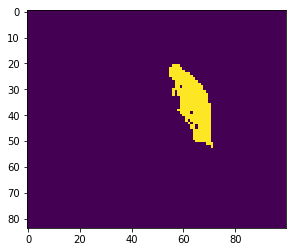

Elapsed time: 2.621 seconds.
57
Patient-id: 39137852
right


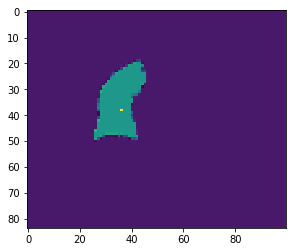

centroid: [[38 50 36]]
starting segmentation...
225


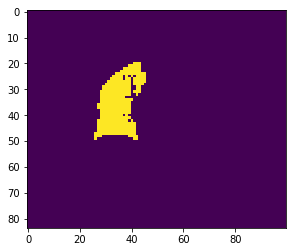

Elapsed time: 3.159 seconds.
58
Patient-id: 39256095
left


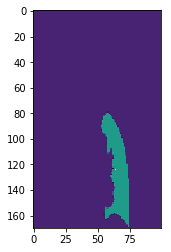

centroid: [[124  58  64]]
starting segmentation...
225


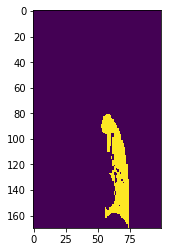

Elapsed time: 13.888 seconds.
59
Patient-id: 39256095
right


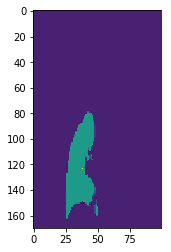

centroid: [[123  58  38]]
starting segmentation...
225


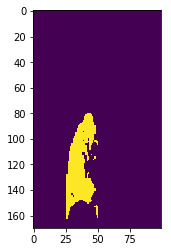

Elapsed time: 17.079 seconds.
60
Patient-id: 39524591
left


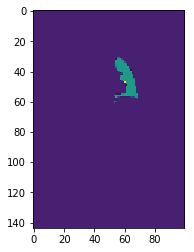

centroid: [[47 50 60]]
starting segmentation...
225


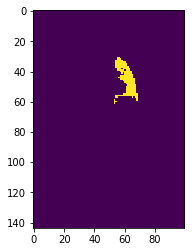

Elapsed time: 1.929 seconds.
61
Patient-id: 39524591
right


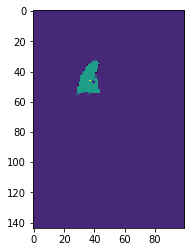

centroid: [[46 47 37]]
starting segmentation...
225


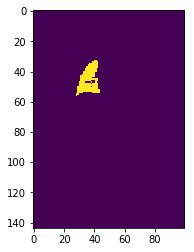

Elapsed time: 2.457 seconds.
62
Patient-id: 39819471
left


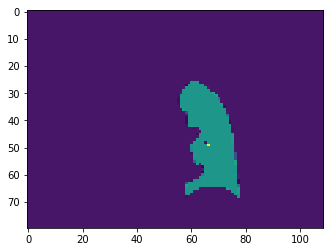

centroid: [[49 60 66]]
starting segmentation...
225


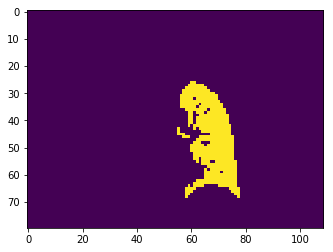

Elapsed time: 3.841 seconds.
63
Patient-id: 39819471
right


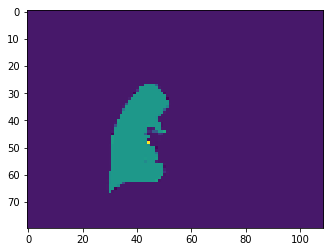

centroid: [[48 59 44]]
starting segmentation...
225


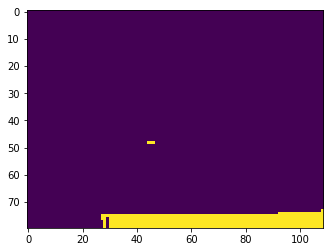

Elapsed time: 13.021 seconds.
64
Patient-id: 39844012
left


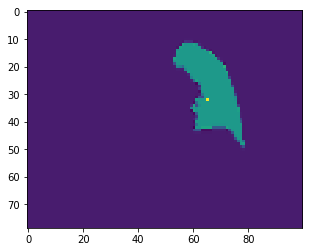

centroid: [[32 48 65]]
starting segmentation...
225
starting segmentation...
235
starting segmentation...
245
starting segmentation...
255
starting segmentation...
265


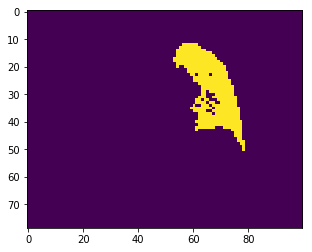

Elapsed time: 3.443 seconds.
65
Patient-id: 39844012
right


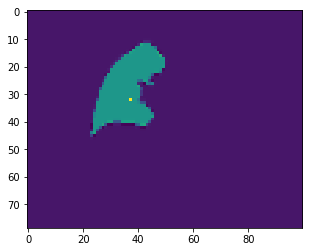

centroid: [[32 47 37]]
starting segmentation...
225


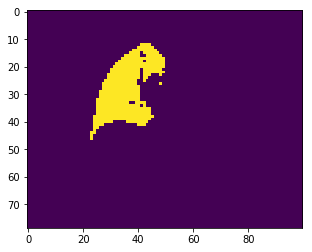

Elapsed time: 3.803 seconds.
66
Patient-id: 39859629
left


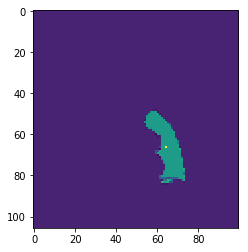

centroid: [[66 56 64]]
starting segmentation...
225


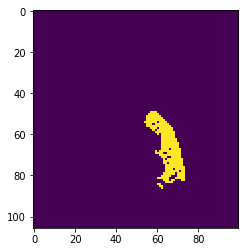

Elapsed time: 2.813 seconds.
67
Patient-id: 39859629
right


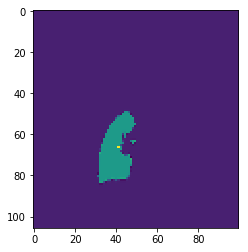

centroid: [[66 56 41]]
starting segmentation...
225


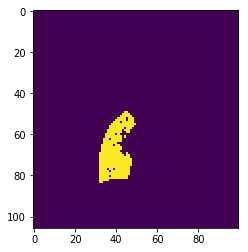

Elapsed time: 3.539 seconds.
68
Patient-id: 39929954
left


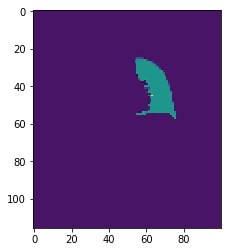

centroid: [[45 50 63]]
starting segmentation...
225


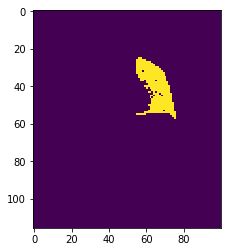

Elapsed time: 4.450 seconds.
69
Patient-id: 39929954
right


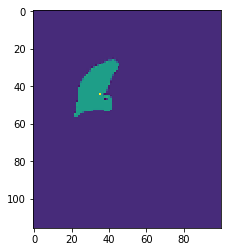

centroid: [[44 48 35]]
starting segmentation...
225


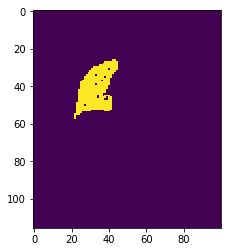

Elapsed time: 5.914 seconds.
70
Patient-id: 39980297
left


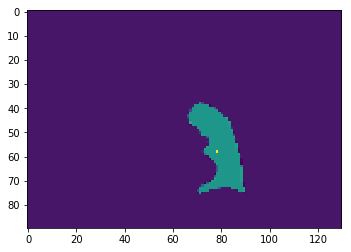

centroid: [[58 65 78]]
starting segmentation...
225


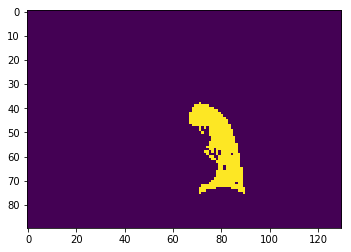

Elapsed time: 5.448 seconds.
71
Patient-id: 39980297
right


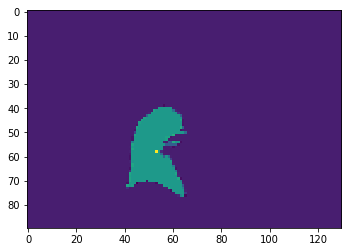

centroid: [[58 65 53]]
starting segmentation...
225


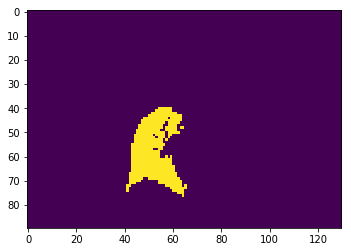

Elapsed time: 6.662 seconds.
72
Patient-id: 40165373
left


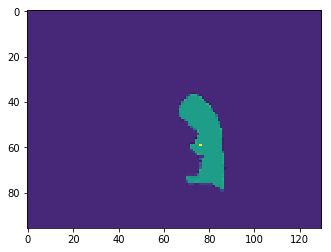

centroid: [[59 64 76]]
starting segmentation...
225
starting segmentation...
235
starting segmentation...
245
starting segmentation...
255
starting segmentation...
265
starting segmentation...
275


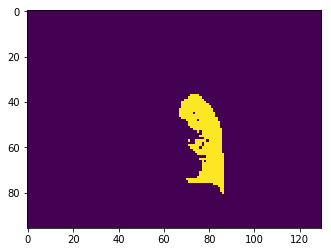

Elapsed time: 4.478 seconds.
73
Patient-id: 40165373
right


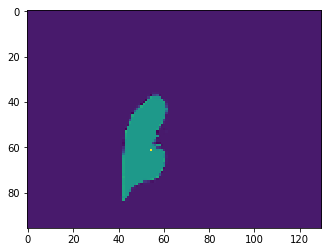

centroid: [[61 62 54]]
starting segmentation...
225


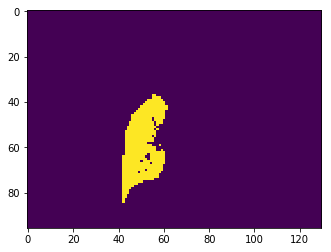

Elapsed time: 6.190 seconds.
74
Patient-id: 40283713
left


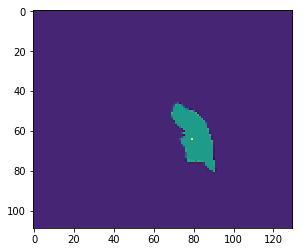

centroid: [[64 65 79]]
starting segmentation...
225


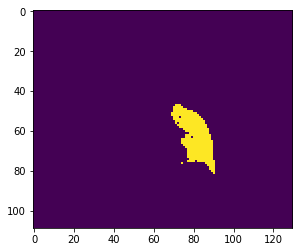

Elapsed time: 6.387 seconds.
75
Patient-id: 40283713
right


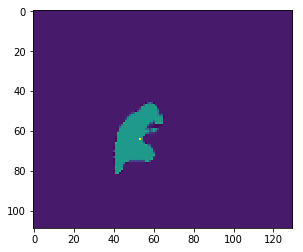

centroid: [[64 65 53]]
starting segmentation...
225


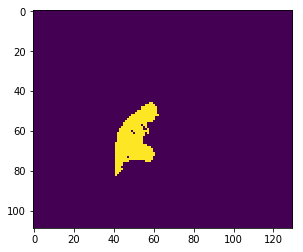

Elapsed time: 7.590 seconds.
76
Patient-id: 40433190
right


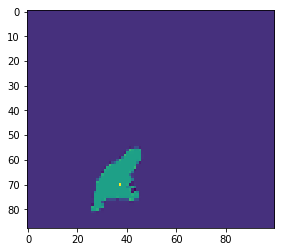

centroid: [[70 45 37]]
starting segmentation...
225


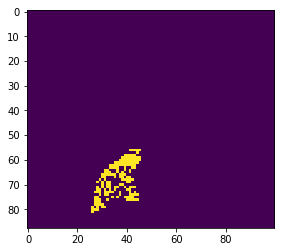

Elapsed time: 2.720 seconds.
77
Patient-id: 40470341
left


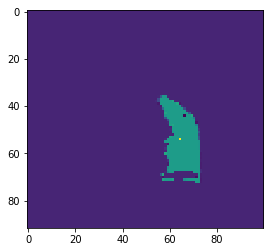

centroid: [[54 52 64]]
starting segmentation...
225


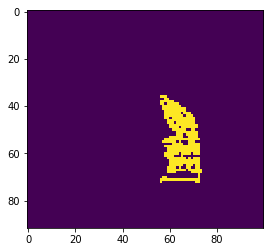

Elapsed time: 2.813 seconds.
78
Patient-id: 40470341
right


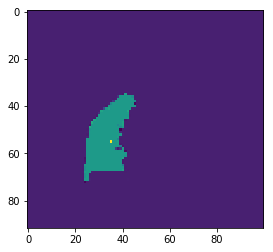

centroid: [[55 51 35]]
starting segmentation...
225


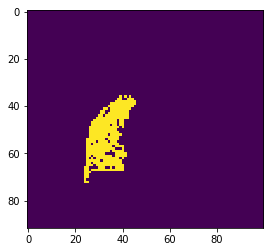

Elapsed time: 3.743 seconds.
79
Patient-id: 40584316
left


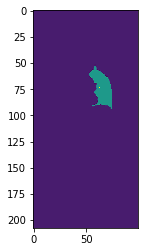

centroid: [[73 52 63]]
starting segmentation...
225


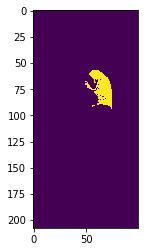

Elapsed time: 6.591 seconds.
80
Patient-id: 40584316
right


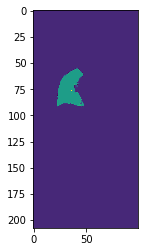

centroid: [[76 52 36]]
starting segmentation...
225


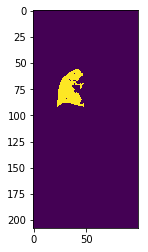

Elapsed time: 8.057 seconds.
81
Patient-id: 41265741
left


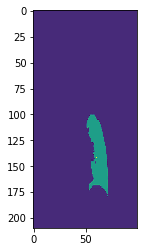

centroid: [[142  57  61]]
starting segmentation...
225


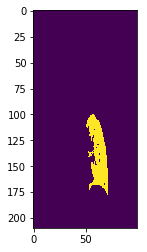

Elapsed time: 14.603 seconds.
82
Patient-id: 41265741
right


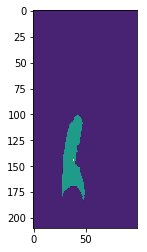

centroid: [[144  55  38]]
starting segmentation...
225


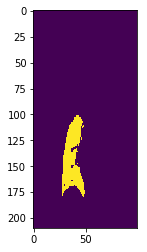

Elapsed time: 17.684 seconds.
83
Patient-id: 42242822
left


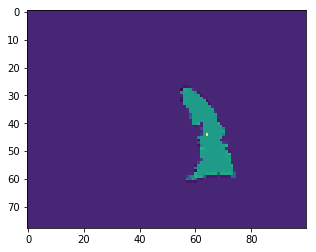

centroid: [[44 54 64]]
starting segmentation...
225


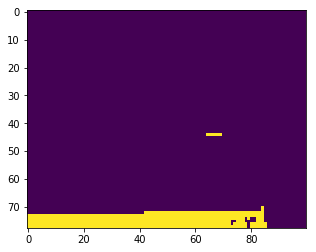

Elapsed time: 11.537 seconds.
84
Patient-id: 42715988
left


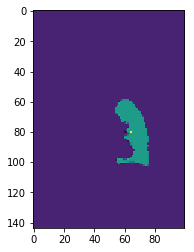

centroid: [[80 59 64]]
starting segmentation...
225


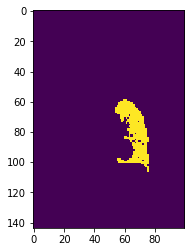

Elapsed time: 6.589 seconds.
85
Patient-id: 42715988
right


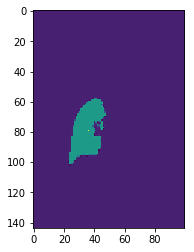

centroid: [[79 58 36]]
starting segmentation...
225


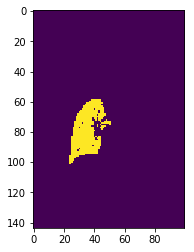

Elapsed time: 7.599 seconds.
86
Patient-id: 43109032
left


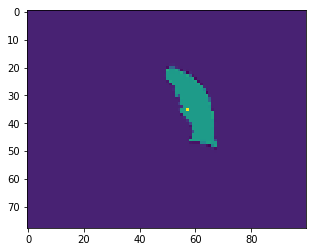

centroid: [[35 48 57]]
starting segmentation...
225


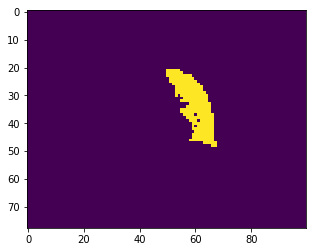

Elapsed time: 1.919 seconds.
87
Patient-id: 43109032
right


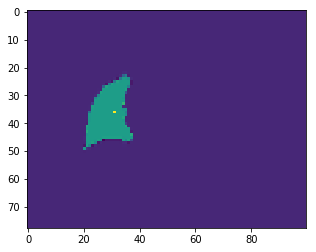

centroid: [[36 46 31]]
starting segmentation...
225


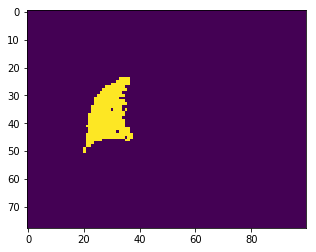

Elapsed time: 2.530 seconds.
88
Patient-id: 43151324
left


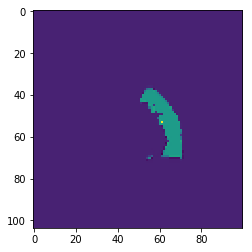

centroid: [[53 54 61]]
starting segmentation...
225


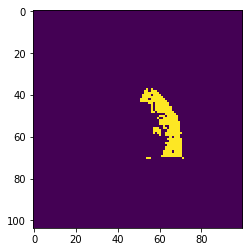

Elapsed time: 2.549 seconds.
89
Patient-id: 43151324
right


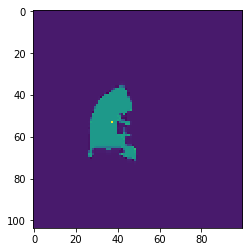

centroid: [[53 52 37]]
starting segmentation...
225


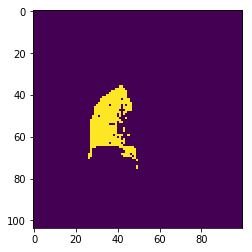

Elapsed time: 3.645 seconds.
90
Patient-id: 43181879
left


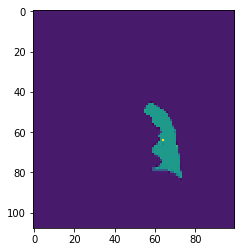

centroid: [[64 52 64]]
starting segmentation...
225


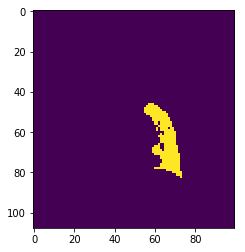

Elapsed time: 3.001 seconds.
91
Patient-id: 43181879
right


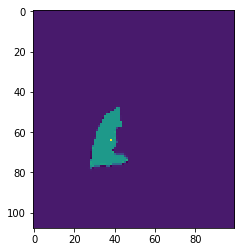

centroid: [[64 50 38]]
starting segmentation...
225


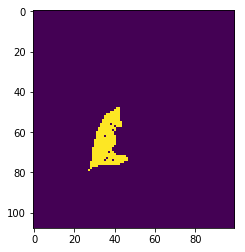

Elapsed time: 4.079 seconds.
92
Patient-id: 43266075
left


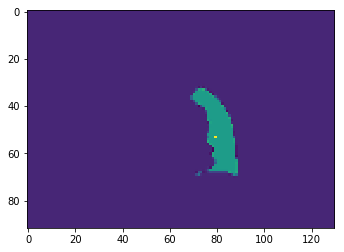

centroid: [[53 65 79]]
starting segmentation...
225


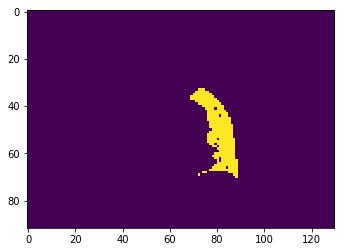

Elapsed time: 4.473 seconds.
93
Patient-id: 43266075
right


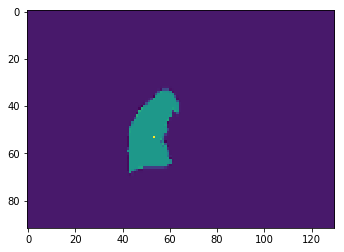

centroid: [[53 63 53]]
starting segmentation...
225


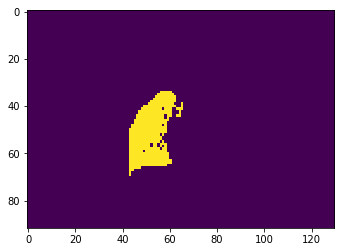

Elapsed time: 6.293 seconds.
94
Patient-id: 43405561
left


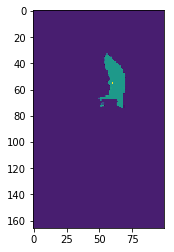

centroid: [[55 53 60]]
starting segmentation...
225
starting segmentation...
235
starting segmentation...
245


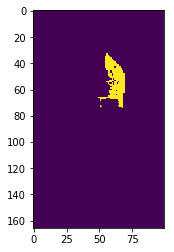

Elapsed time: 5.421 seconds.
95
Patient-id: 43405561
right


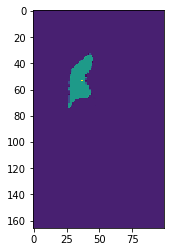

centroid: [[53 52 37]]
starting segmentation...
225


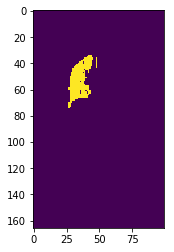

Elapsed time: 6.602 seconds.
96
Patient-id: 43675706
left


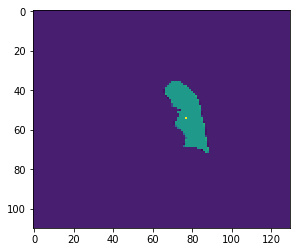

centroid: [[54 64 77]]
starting segmentation...
225


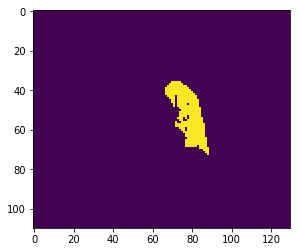

Elapsed time: 5.621 seconds.
97
Patient-id: 43675706
right


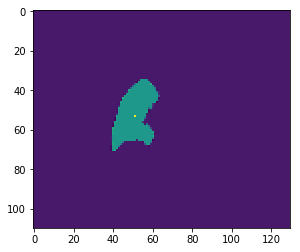

centroid: [[53 64 51]]
starting segmentation...
225


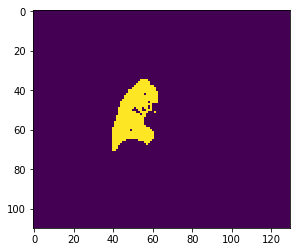

Elapsed time: 6.484 seconds.
98
Patient-id: 44120063
left


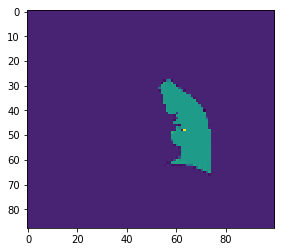

centroid: [[48 52 63]]
starting segmentation...
225


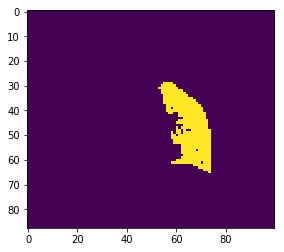

Elapsed time: 3.487 seconds.
99
Patient-id: 44120063
right


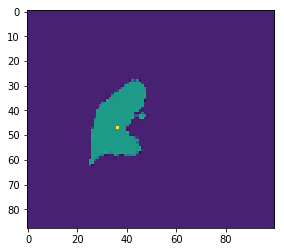

centroid: [[47 52 36]]
starting segmentation...
225


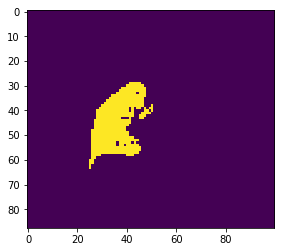

Elapsed time: 3.677 seconds.
100
Patient-id: 44253050
left


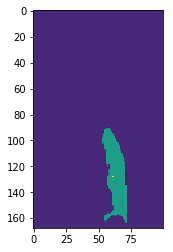

centroid: [[128  50  61]]
starting segmentation...
225


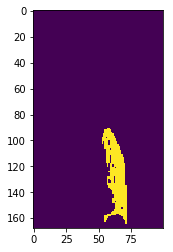

Elapsed time: 9.158 seconds.
101
Patient-id: 44253050
right


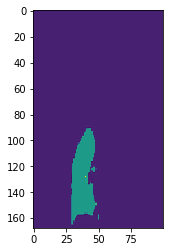

centroid: [[128  50  40]]
starting segmentation...
225


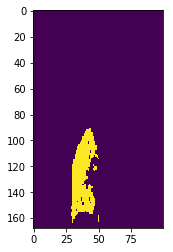

Elapsed time: 10.969 seconds.
102
Patient-id: 44422897
left


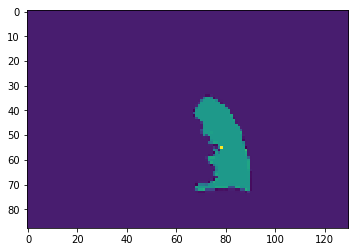

centroid: [[55 66 78]]
starting segmentation...
225


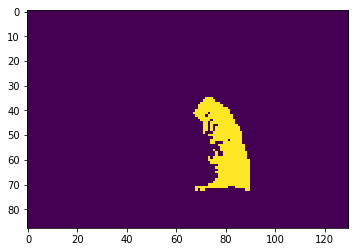

Elapsed time: 6.818 seconds.
103
Patient-id: 44422897
right


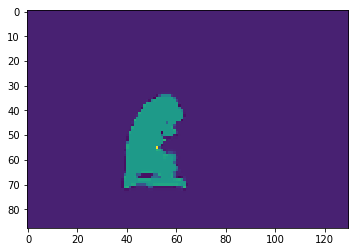

centroid: [[55 66 52]]
starting segmentation...
225
starting segmentation...
235
starting segmentation...
245
starting segmentation...
255
starting segmentation...
265
starting segmentation...
275


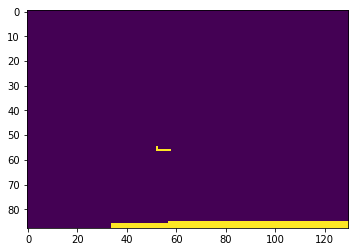

Elapsed time: 18.116 seconds.
104
Patient-id: 45858788
left


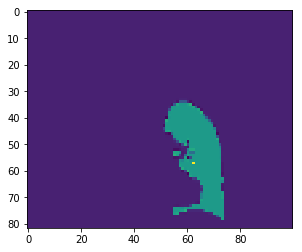

centroid: [[57 58 62]]
starting segmentation...
225


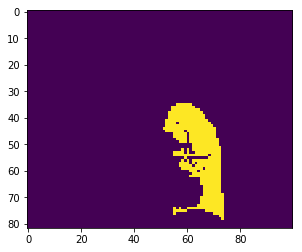

Elapsed time: 4.335 seconds.
105
Patient-id: 45858788
right


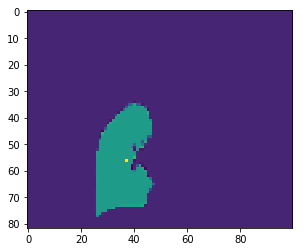

centroid: [[56 57 37]]
starting segmentation...
225


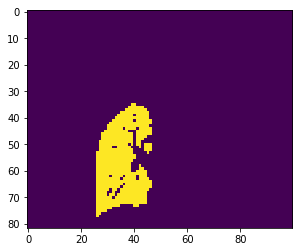

Elapsed time: 4.344 seconds.
106
Patient-id: 46318956
left


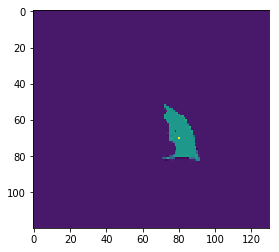

centroid: [[70 71 80]]
starting segmentation...
225


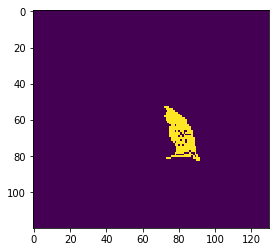

Elapsed time: 5.846 seconds.
107
Patient-id: 46318956
right


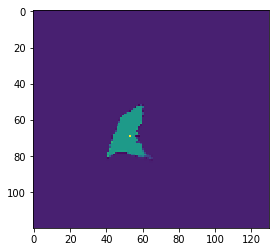

centroid: [[69 70 53]]
starting segmentation...
225


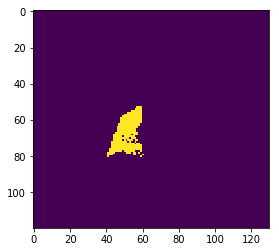

Elapsed time: 6.580 seconds.
108
Patient-id: 47262863
left


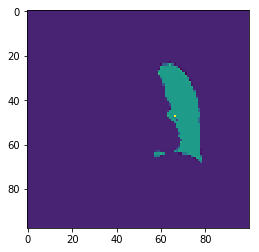

centroid: [[47 51 66]]
starting segmentation...
225


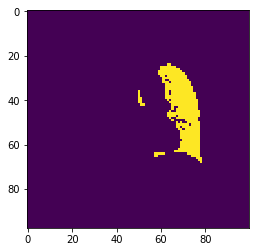

Elapsed time: 5.441 seconds.
109
Patient-id: 47262863
right


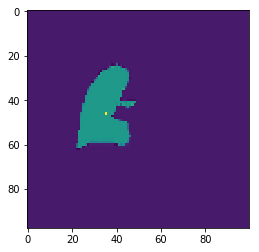

centroid: [[46 51 35]]
starting segmentation...
225


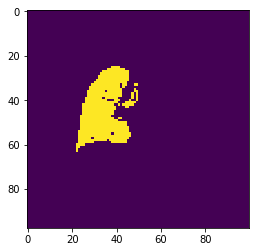

Elapsed time: 7.067 seconds.
110
Patient-id: 47295940
left


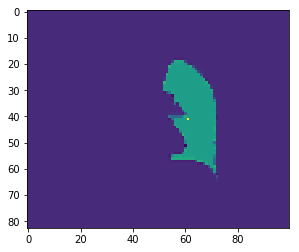

centroid: [[41 55 61]]
starting segmentation...
225


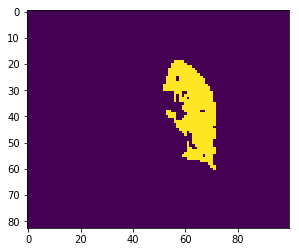

Elapsed time: 3.351 seconds.
111
Patient-id: 47295940
right


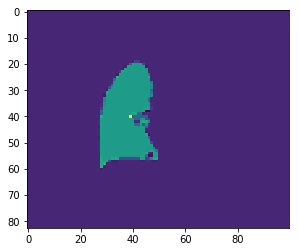

centroid: [[40 55 39]]
starting segmentation...
225


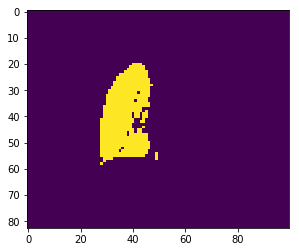

Elapsed time: 3.607 seconds.
112
Patient-id: 48148279
left


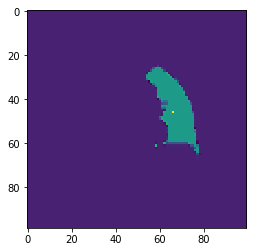

centroid: [[46 49 66]]
starting segmentation...
225


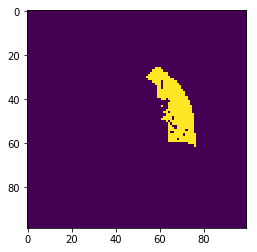

Elapsed time: 4.019 seconds.
113
Patient-id: 48148279
right


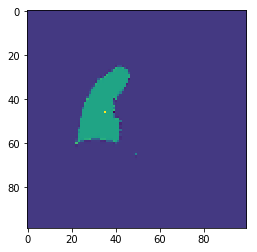

centroid: [[46 48 35]]
starting segmentation...
225


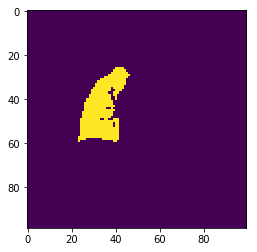

Elapsed time: 4.799 seconds.
114
Patient-id: 48259441
left
Im zero
Im zero


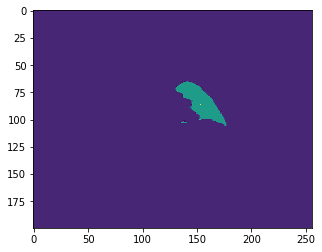

centroid: [[ 86 134 153]]
starting segmentation...
225


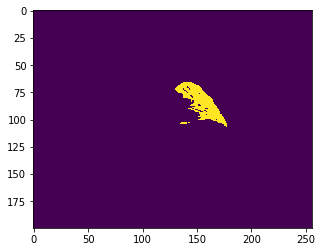

Elapsed time: 160.982 seconds.
115
Patient-id: 48259441
right
Im zero
Im zero


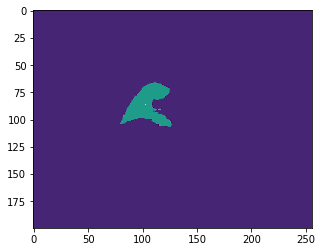

centroid: [[ 86 133 103]]
starting segmentation...
225


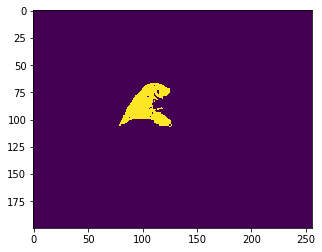

Elapsed time: 170.288 seconds.
116
Patient-id: 48335198
right


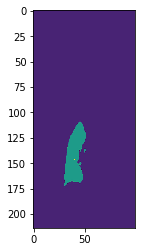

centroid: [[146  62  40]]
starting segmentation...
225


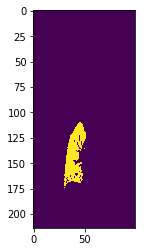

Elapsed time: 11.416 seconds.
117
Patient-id: 48389421
left


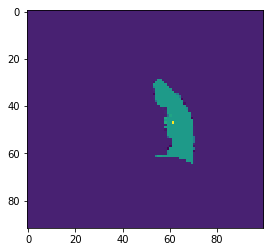

centroid: [[47 48 61]]
starting segmentation...
225


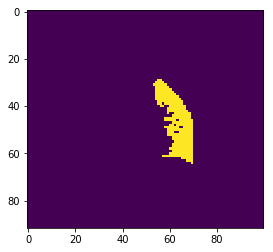

Elapsed time: 2.344 seconds.
118
Patient-id: 48389421
right


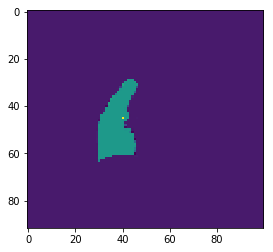

centroid: [[45 48 40]]
starting segmentation...
225


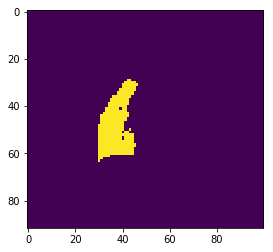

Elapsed time: 2.709 seconds.
119
Patient-id: 48684980
left


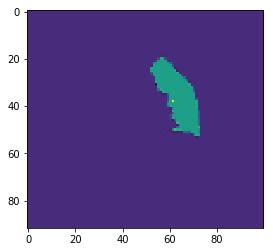

centroid: [[38 53 61]]
starting segmentation...
225


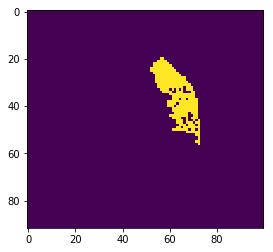

Elapsed time: 2.489 seconds.
120
Patient-id: 48684980
right


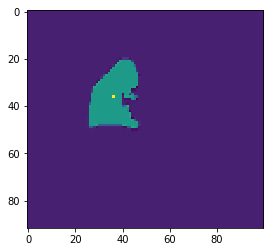

centroid: [[36 53 36]]
starting segmentation...
225


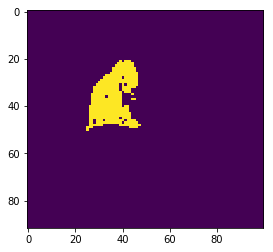

Elapsed time: 2.942 seconds.
121
Patient-id: 49174830
left


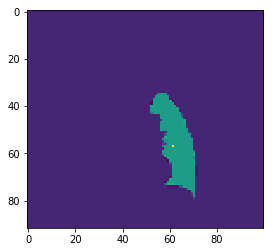

centroid: [[57 57 61]]
starting segmentation...
225


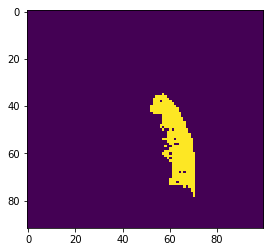

Elapsed time: 3.458 seconds.
122
Patient-id: 49174830
right


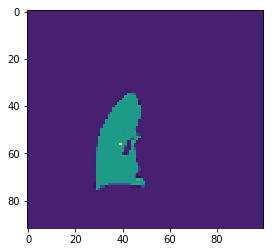

centroid: [[56 57 39]]
starting segmentation...
225


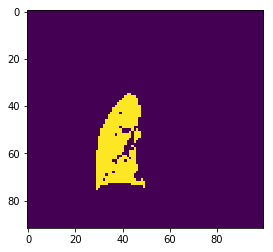

Elapsed time: 5.771 seconds.
123
Patient-id: 51927593
right
Im zero
Im zero


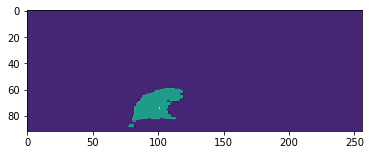

centroid: [[ 74 143 101]]
starting segmentation...
225


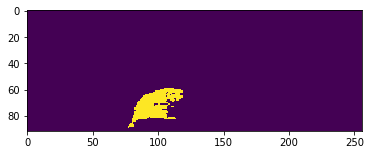

Elapsed time: 80.256 seconds.
124
Patient-id: 52016057
left


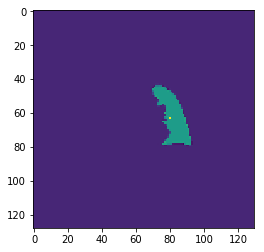

centroid: [[63 70 80]]
starting segmentation...
225


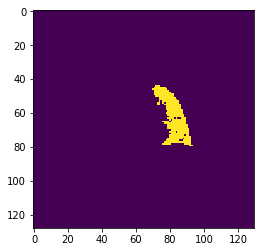

Elapsed time: 7.553 seconds.
125
Patient-id: 52016057
right


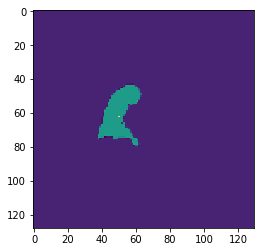

centroid: [[62 69 50]]
starting segmentation...
225


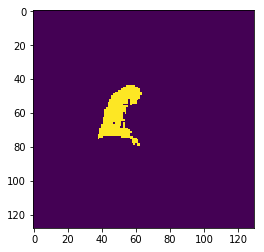

Elapsed time: 9.054 seconds.
126
Patient-id: 52075421
left


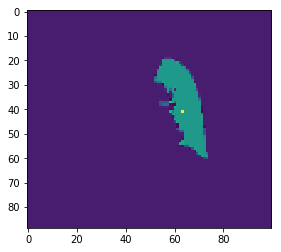

centroid: [[41 55 63]]
starting segmentation...
225


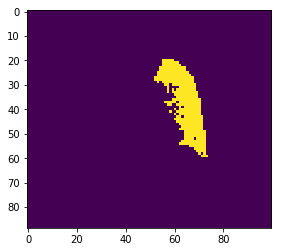

Elapsed time: 3.416 seconds.
127
Patient-id: 52075421
right


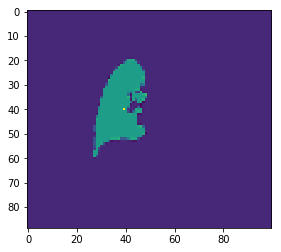

centroid: [[40 54 39]]
starting segmentation...
225


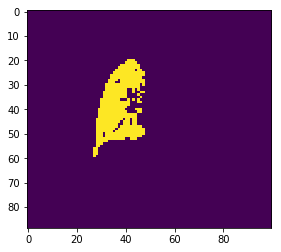

Elapsed time: 7.771 seconds.
128
Patient-id: 54828475
left


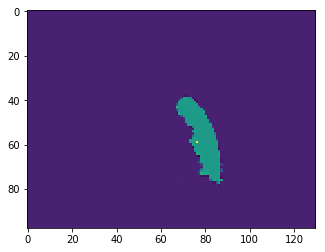

centroid: [[59 66 76]]
starting segmentation...
225


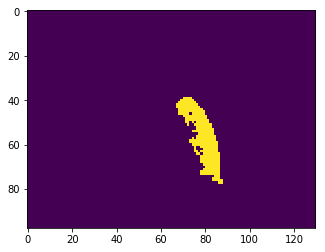

Elapsed time: 10.245 seconds.
129
Patient-id: 54828475
right


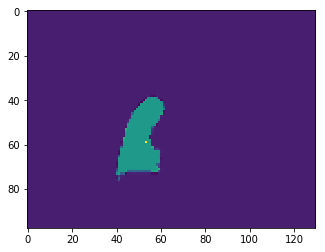

centroid: [[59 65 53]]
starting segmentation...
225


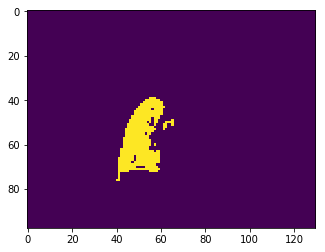

Elapsed time: 9.312 seconds.
130
Patient-id: 57220883
left


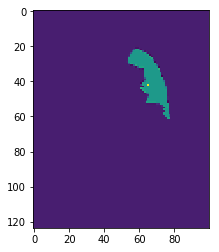

centroid: [[42 50 65]]
starting segmentation...
225


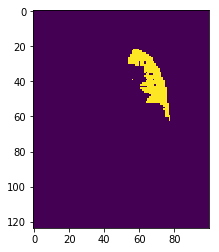

Elapsed time: 4.414 seconds.
131
Patient-id: 57220883
right


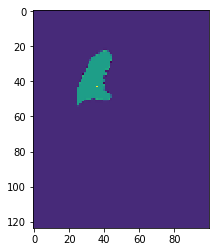

centroid: [[43 47 36]]
starting segmentation...
225


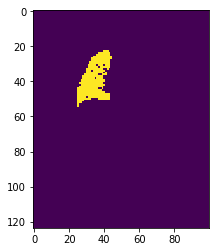

Elapsed time: 6.514 seconds.


In [10]:
from segmentation_functions import resample, grow
from finding_biggest_lung import arrange_slices, normalization, creating_mask
from automaticSeeding import find_seed
import numpy as np
import os
import matplotlib.pyplot as plt
import scipy.io as spio
import pydicom
import time

slices_path = "G:/CTimages/"
indices_path ="G:/Plans/CT/Lungs/ok/Separate Lungs/"
seeds_path = "G:/CTimages/CT/Images/Seeds"
separation_path = "G:/CTimages/CT/Images/Separator/"
centroid_path = "G:/CTimages/CT/Images/Centroids/"
segmentations_results_path = "G:/Plans/CT/Lungs/segmentation_results/Centroid/"
indices_folder= os.listdir(indices_path)
 
a=0
centroides = np.load(centroid_path+'centroids_all.npy')
for num,each_mask in enumerate(indices_folder):

    print(num)
    #Loading data--------------------------------------------------------------------------------------------------------
    opened = spio.loadmat(indices_path+'/'+each_mask, squeeze_me=True)["indexes"]
    patient_id = each_mask.split(" ", each_mask.count(each_mask))[0] 
    separador = spio.loadmat(separation_path+'/'+patient_id+'_separator', squeeze_me=True)["separator"]
    pre_region = each_mask.split("_", each_mask.count(each_mask))[1]
    region = pre_region.split("_", pre_region.count(pre_region))[0]
    print("Patient-id: "+ str(patient_id))
    print(region)
    
    #Reading the data--------------------------------------------------------------------------------------------------------
    slices= arrange_slices(slices_path,patient_id)
    normalized_volume=normalization(slices)
    normalized_array = np.array(normalized_volume)
    
    #Separating left and right side------------------------------------------------------------------------------------------
    volume = np.zeros(normalized_array.shape) #possible improvement: define the non-used side to the minimum intensity
    cols = normalized_array.shape[2]
    
    if region =='left':
        volume[:,:,separador:cols] = normalized_array[:,:,separador:cols]
    elif region =='right':
        volume[:,:,0:separador] = normalized_array[:,:,0:separador]
    volume_resampled, spacing = resample(volume, slices, [5,5,5])
    
    #Mask---------------------------------------------------------------------------------------------------------------------
    lung_mask = creating_mask(opened,normalized_array)
    lung_mask_resampled, spacing = resample(lung_mask, slices, [5,5,5])
   
    #Centroids--------------------------------------------------------------------------------------------------------------
    
    centroid = centroides[a]
    showing = lung_mask_resampled.copy()
    showing[tuple(centroid[0])]=2
    
    plt.imshow(showing[:,centroid[0][1],:])
    plt.show()
    print('centroid: '+str(centroid))
        
    #Segmentation--------------------------------------------------------------------------------------------------------------------
    thresh = 225
    first_seg = np.zeros(volume_resampled.shape, dtype=np.bool)
    max_seeding = 39705+50
    min_seeding = 3257
    counter = max_seeding+50
    while counter > max_seeding or counter< min_seeding:

        print('starting segmentation...')
        pre_seed = tuple(centroid[0])
        start = time.time()
        seg, counter = grow(volume_resampled,pre_seed,thresh,1,first_seg)
        stop = time.time()
        print(thresh)
        if counter>max_seeding:
            thresh = thresh-10
        if counter<min_seeding:
            thresh = thresh+10
    plt.imshow(seg[:,centroid[0][1],:])
    plt.show()
    print("Elapsed time: %.3f seconds." % (stop - start))
    
    a=a+1
    #Saving------------------------------------------------------------------------------------------------------------------
    name = segmentations_results_path+"3DVolumeSegmented_"+str(patient_id)+'_'+str(region)+"_"+str(thresh)
    np.save(name, seg)
   
    del slices
    del seg
    del normalized_array
    del volume_resampled
    

status: 0 in 132
nome pre-result: Centroid3DVolumeSegmented_10194022_left_225.npy
paciente_result: 10194022
region_indice: left
indice_mask: 10194022
shape segmentação: (82, 130, 130)
shape ground truth: (82, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10312, 1374129, 25, 1334]
Elapsed time: 0.044 seconds.


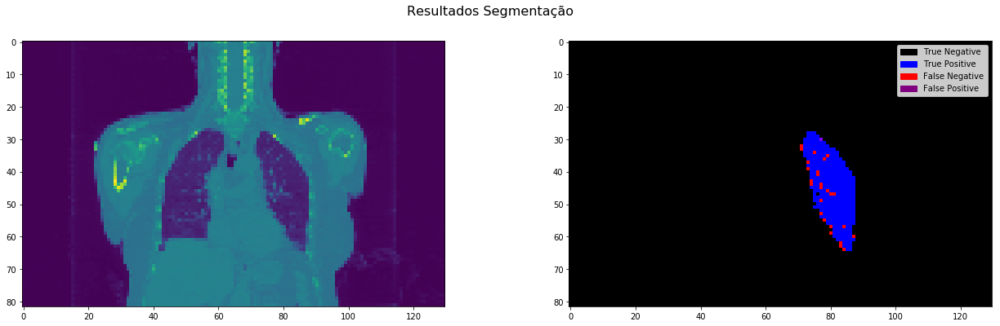

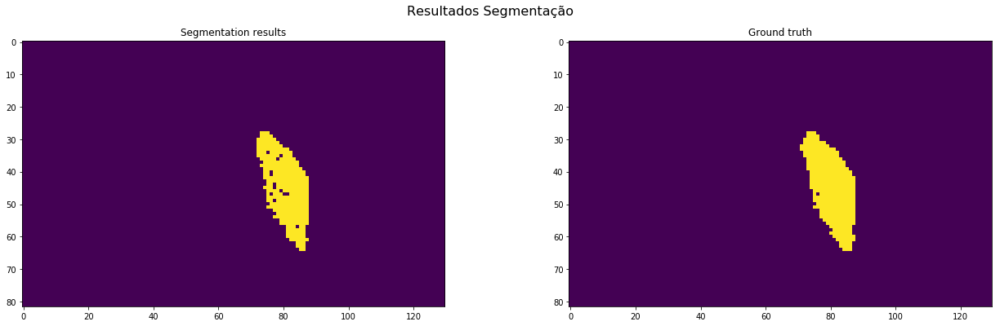

Metrics:
Dice: 0.9381795023427194
Jacquard Index: 0.8835575357724273
True Positive Rate: 0.8854542332131203
Volumetric Similarity: 0.9404539871719055

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 1 in 132
nome pre-result: Centroid3DVolumeSegmented_10194022_right_225.npy
paciente_result: 10194022
region_indice: right
indice_mask: 10194022
shape segmentação: (82, 130, 130)
shape ground truth: (82, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12401, 1372122, 16, 1261]
Elapsed time: 0.073 seconds.


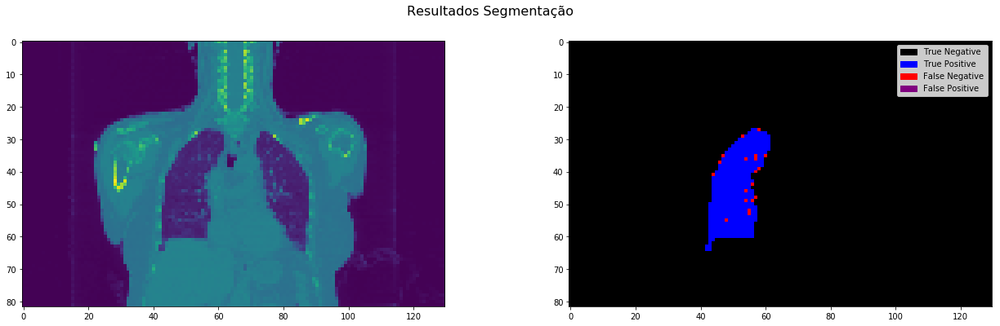

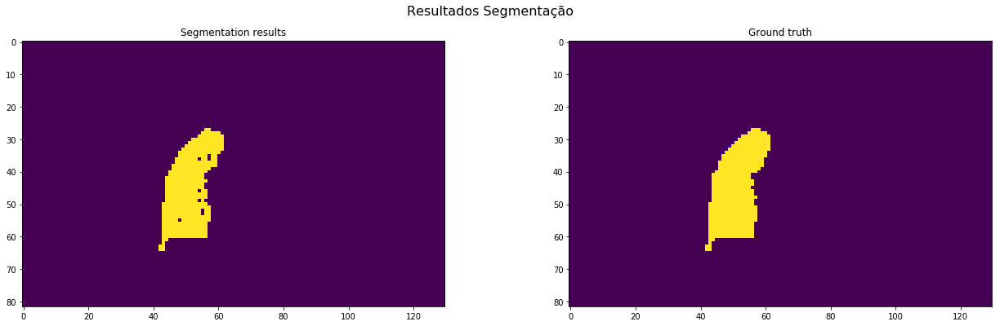

Metrics:
Dice: 0.9510333985198819
Jacquard Index: 0.9066383974265243
True Positive Rate: 0.9077001903088859
Volumetric Similarity: 0.9522604394340274

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 2 in 132
nome pre-result: Centroid3DVolumeSegmented_28838683_left_225.npy
paciente_result: 28838683
region_indice: left
indice_mask: 28838683
shape segmentação: (90, 100, 100)
shape ground truth: (90, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [4128, 895535, 101, 236]
Elapsed time: 0.035 seconds.


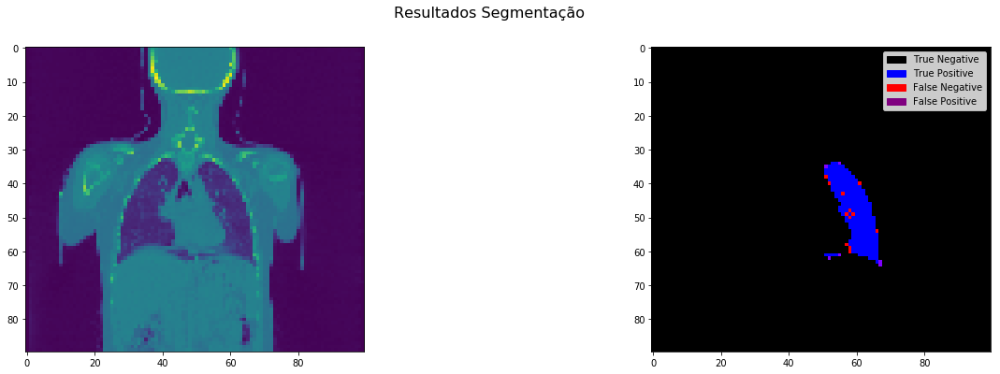

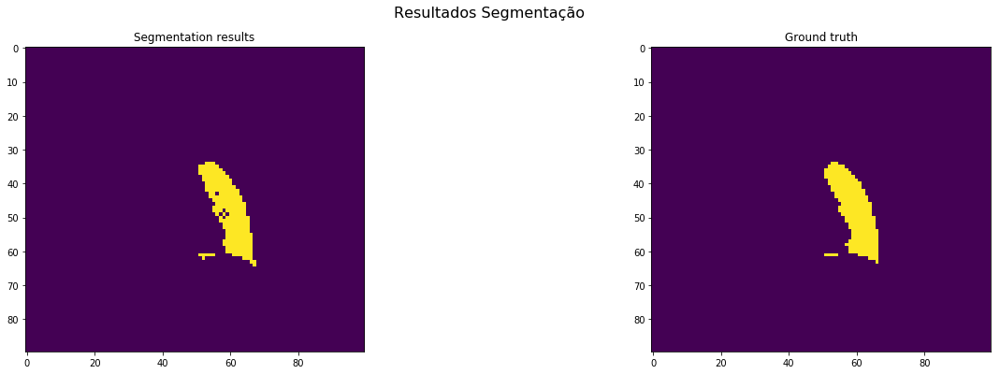

Metrics:
Dice: 0.9607820318864192
Jacquard Index: 0.9245240761478164
True Positive Rate: 0.9459211732355637
Volumetric Similarity: 0.9842895379960432

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 3 in 132
nome pre-result: Centroid3DVolumeSegmented_28838683_right_225.npy
paciente_result: 28838683
region_indice: right
indice_mask: 28838683
shape segmentação: (90, 100, 100)
shape ground truth: (90, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5045, 894588, 80, 287]
Elapsed time: 0.013 seconds.


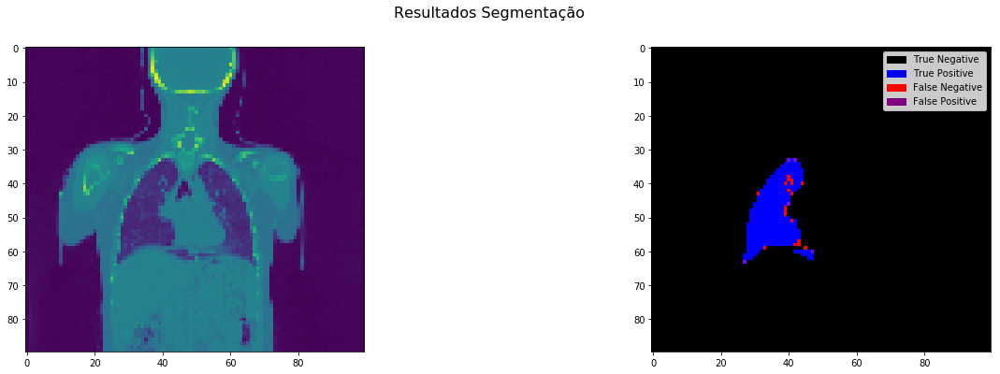

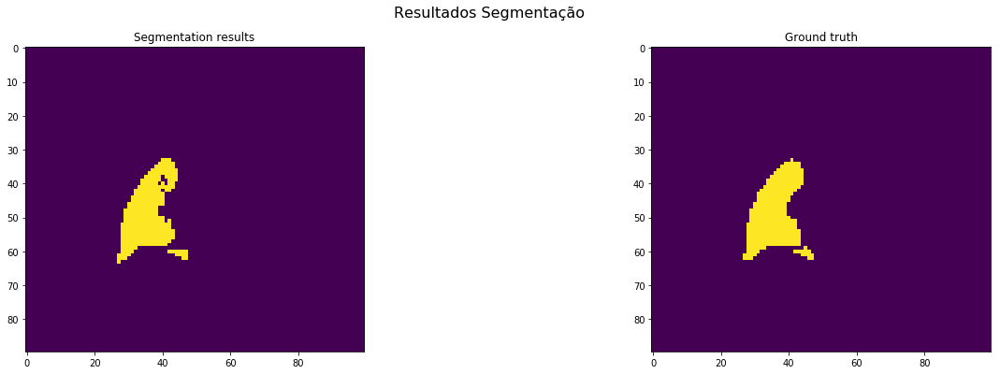

Metrics:
Dice: 0.9649038921296739
Jacquard Index: 0.9321877309682187
True Positive Rate: 0.9461740435108777
Volumetric Similarity: 0.9802046476044755

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 4 in 132
nome pre-result: Centroid3DVolumeSegmented_31022832_left_225.npy
paciente_result: 31022832
region_indice: left
indice_mask: 31022832
shape segmentação: (90, 130, 130)
shape ground truth: (90, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [51, 1475331, 39705, 5913]
Elapsed time: 0.029 seconds.


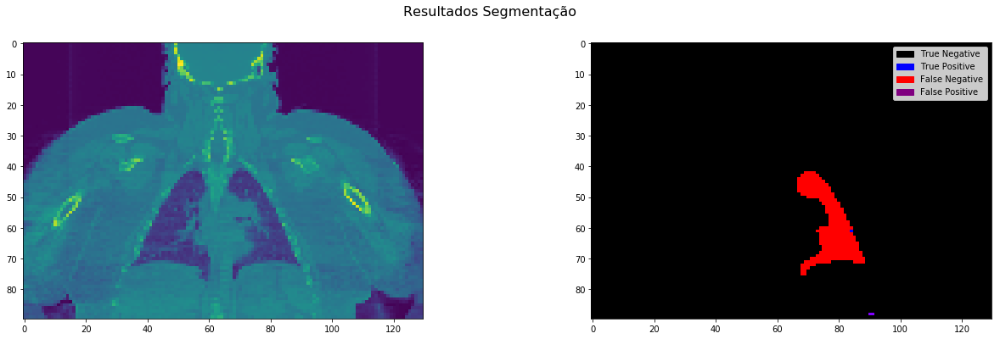

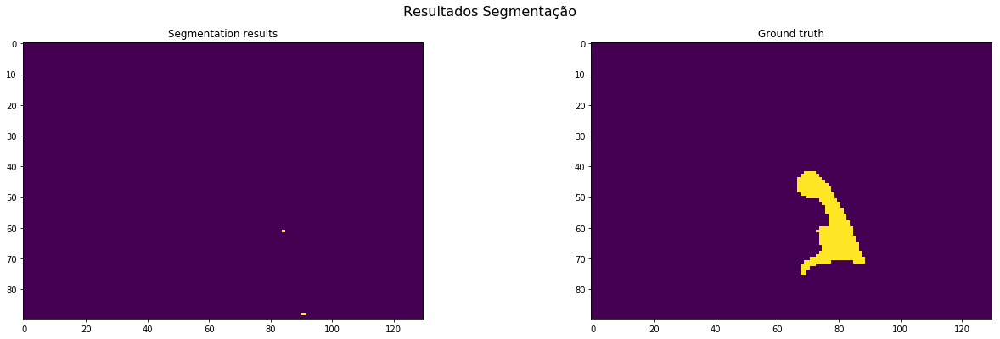

Metrics:
Dice: 0.002230971128608924
Jacquard Index: 0.001116731261906326
True Positive Rate: 0.008551307847082495
Volumetric Similarity: 0.2608923884514436

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 5 in 132
nome pre-result: Centroid3DVolumeSegmented_31022832_right_225.npy
paciente_result: 31022832
region_indice: right
indice_mask: 31022832
shape segmentação: (90, 130, 130)
shape ground truth: (90, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [253, 1471988, 39503, 9256]
Elapsed time: 0.034 seconds.


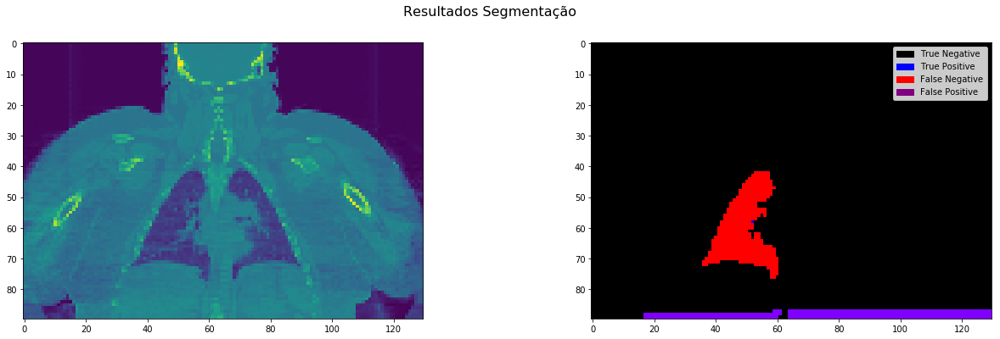

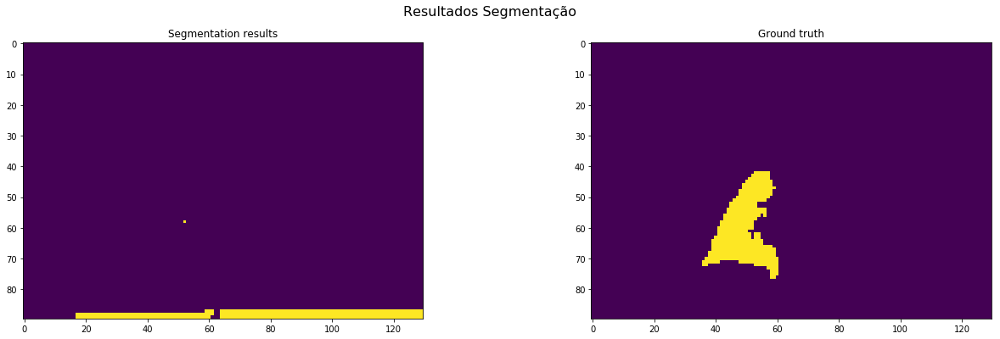

Metrics:
Dice: 0.010270983456815184
Jacquard Index: 0.005162001142577328
True Positive Rate: 0.026606372909874856
Volumetric Similarity: 0.3860347102405359

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 6 in 132
nome pre-result: Centroid3DVolumeSegmented_31119444_left_225.npy
paciente_result: 31119444
region_indice: left
indice_mask: 31119444
shape segmentação: (94, 130, 130)
shape ground truth: (94, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9494, 1578214, 331, 561]
Elapsed time: 0.058 seconds.


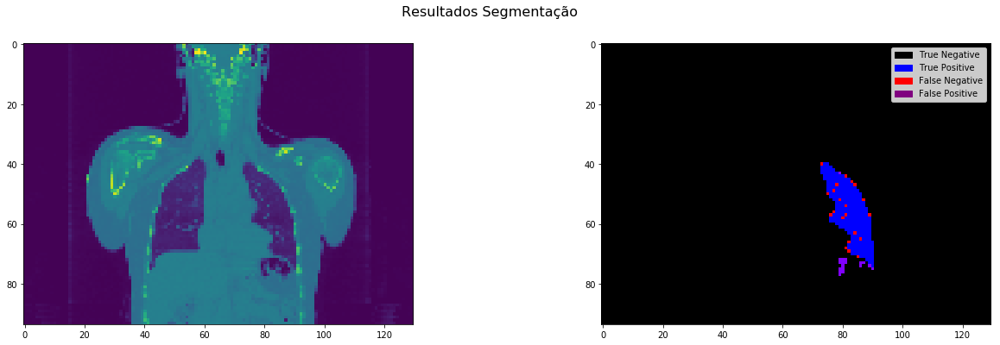

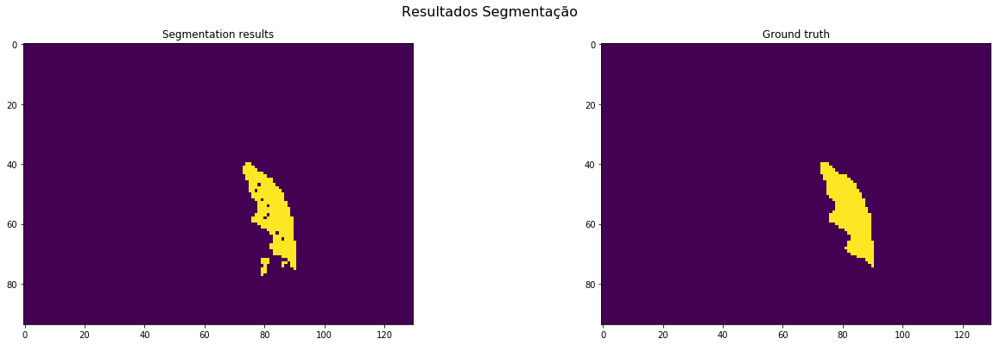

Metrics:
Dice: 0.9551307847082495
Jacquard Index: 0.9141151550163682
True Positive Rate: 0.9442068622575833
Volumetric Similarity: 0.988430583501006

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 7 in 132
nome pre-result: Centroid3DVolumeSegmented_31119444_right_225.npy
paciente_result: 31119444
region_indice: right
indice_mask: 31119444
shape segmentação: (94, 130, 130)
shape ground truth: (94, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [0, 1536969, 39756, 11875]
Elapsed time: 0.033 seconds.


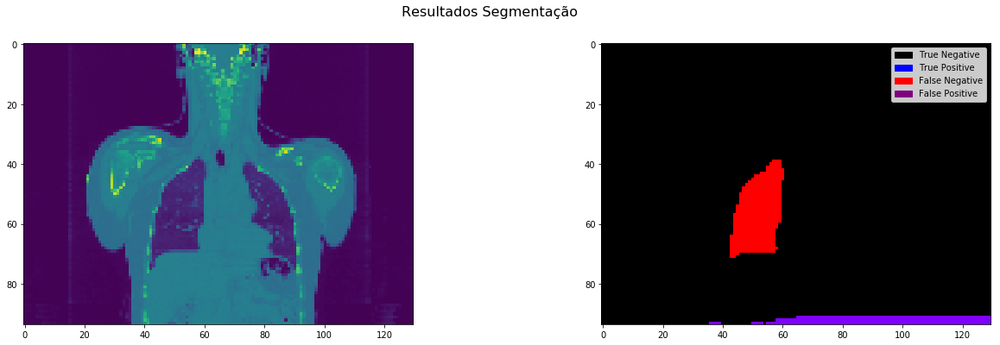

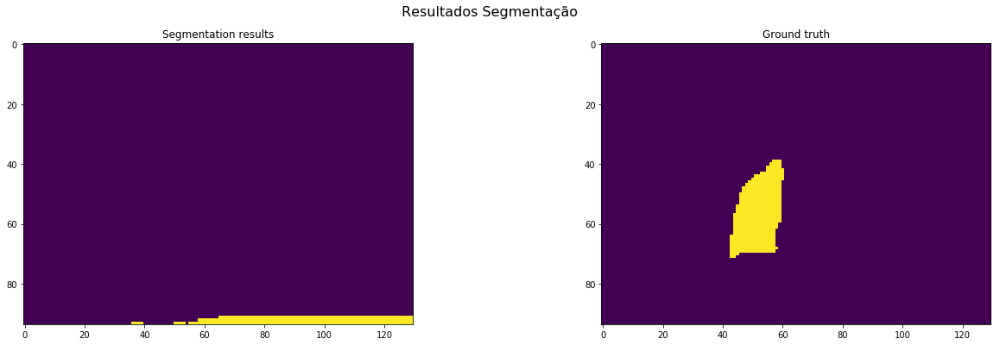

Metrics:
Dice: 0.0
Jacquard Index: 0.0
True Positive Rate: 0.0
Volumetric Similarity: 0.45999496426565434

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 8 in 132
nome pre-result: Centroid3DVolumeSegmented_32064030_right_225.npy
paciente_result: 32064030
region_indice: right
indice_mask: 32064030
shape segmentação: (214, 100, 100)
shape ground truth: (214, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [31290, 2106052, 407, 2251]
Elapsed time: 0.042 seconds.


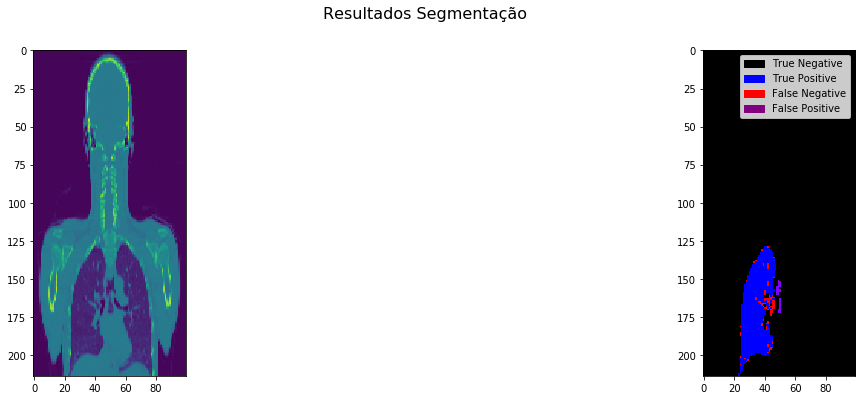

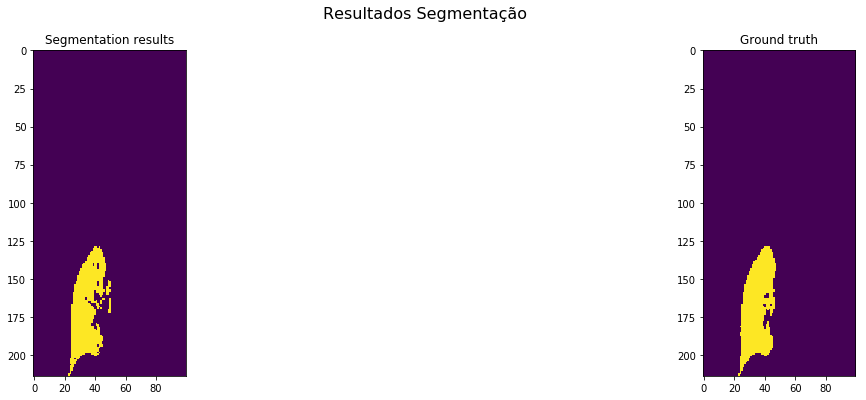

Metrics:
Dice: 0.9592568748275545
Jacquard Index: 0.9217037822552139
True Positive Rate: 0.9328881070928118
Volumetric Similarity: 0.9717342653054968

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 9 in 132
nome pre-result: Centroid3DVolumeSegmented_32407507_left_225.npy
paciente_result: 32407507
region_indice: left
indice_mask: 32407507
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6211, 873330, 85, 374]
Elapsed time: 0.012 seconds.


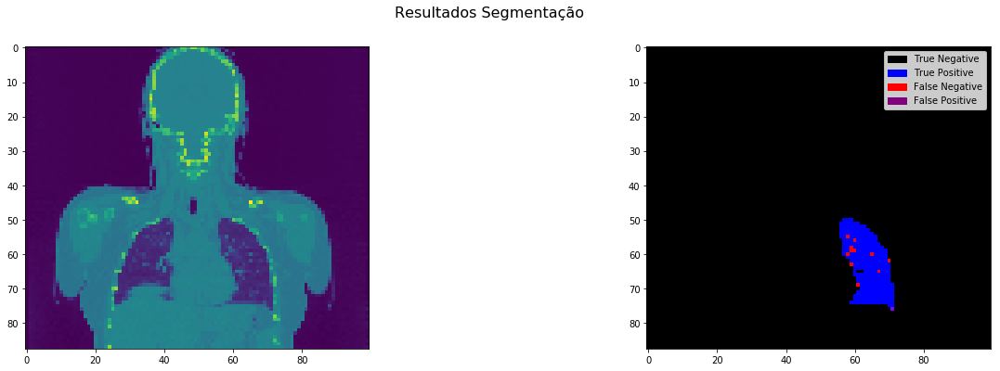

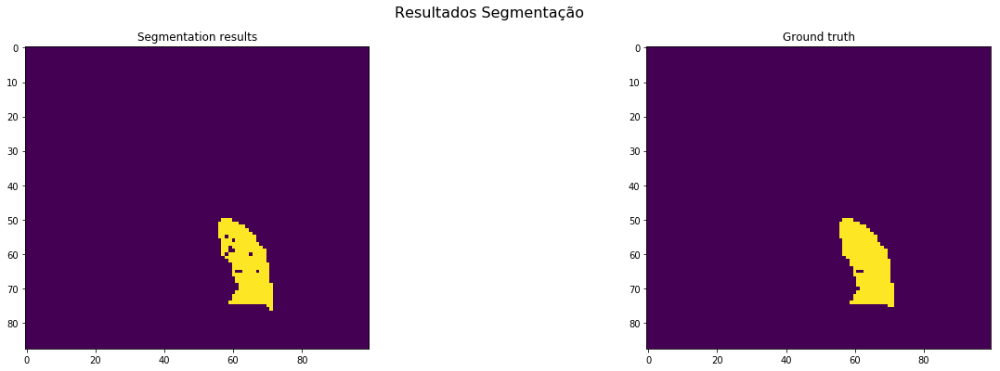

Metrics:
Dice: 0.9643661206428072
Jacquard Index: 0.9311844077961019
True Positive Rate: 0.943204252088079
Volumetric Similarity: 0.9775638537380638

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 10 in 132
nome pre-result: Centroid3DVolumeSegmented_32407507_right_225.npy
paciente_result: 32407507
region_indice: right
indice_mask: 32407507
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6663, 872782, 119, 436]
Elapsed time: 0.017 seconds.


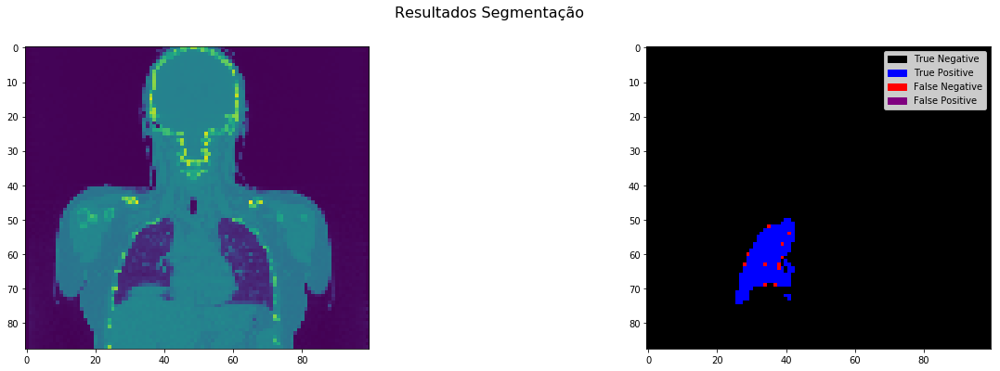

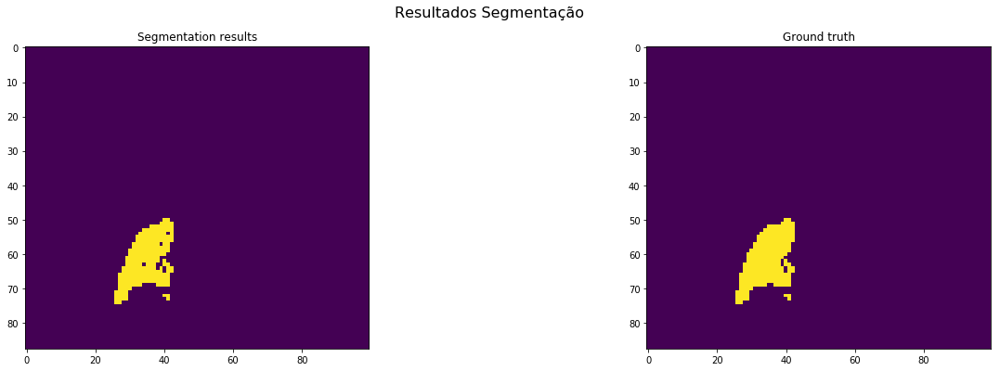

Metrics:
Dice: 0.9600172898206181
Jacquard Index: 0.9231088944305902
True Positive Rate: 0.9385828989998591
Volumetric Similarity: 0.977163028600245

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 11 in 132
nome pre-result: Centroid3DVolumeSegmented_33515150_left_225.npy
paciente_result: 33515150
region_indice: left
indice_mask: 33515150
shape segmentação: (222, 100, 100)
shape ground truth: (222, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [4884, 2214815, 109, 192]
Elapsed time: 0.083 seconds.


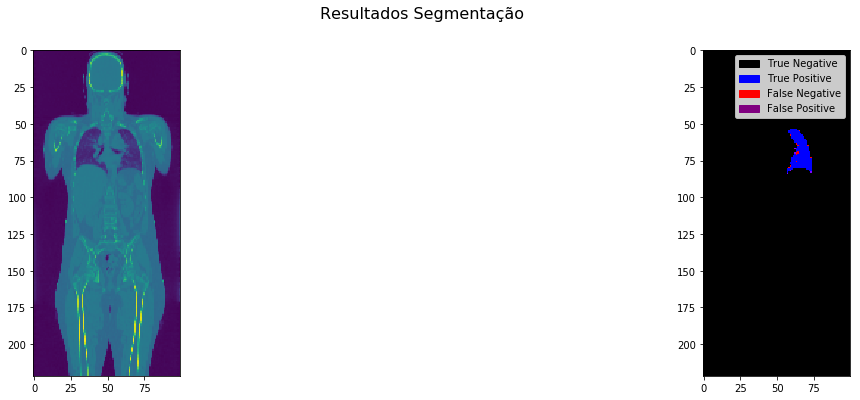

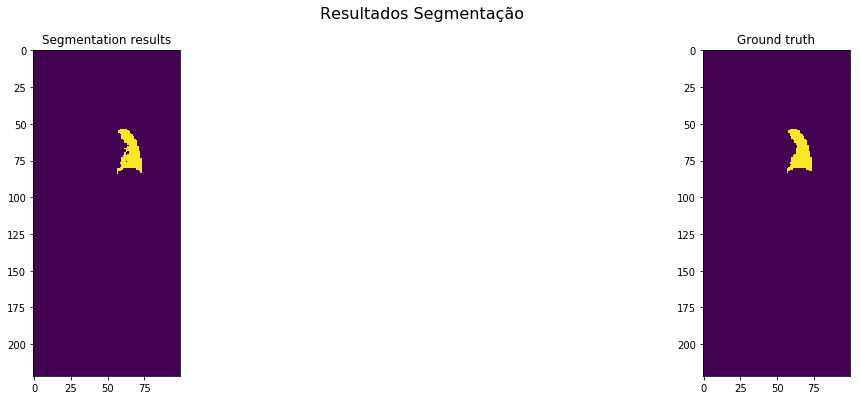

Metrics:
Dice: 0.9701062667593604
Jacquard Index: 0.9419479267116683
True Positive Rate: 0.9621749408983451
Volumetric Similarity: 0.9917568775449399

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 12 in 132
nome pre-result: Centroid3DVolumeSegmented_33515150_right_225.npy
paciente_result: 33515150
region_indice: right
indice_mask: 33515150
shape segmentação: (222, 100, 100)
shape ground truth: (222, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6416, 2213135, 290, 159]
Elapsed time: 0.089 seconds.


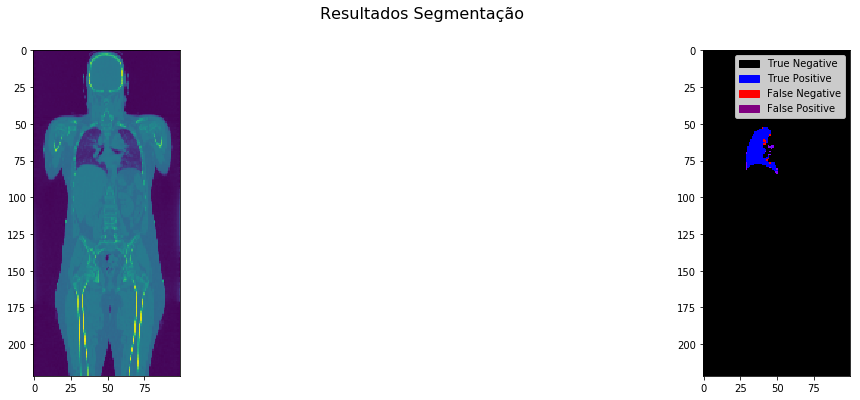

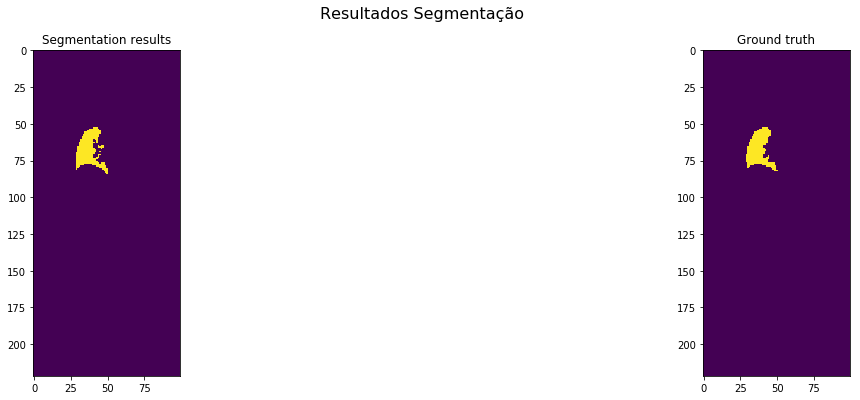

Metrics:
Dice: 0.9661923047963256
Jacquard Index: 0.9345957756737072
True Positive Rate: 0.9758174904942966
Volumetric Similarity: 0.9901362849183043

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 13 in 132
nome pre-result: Centroid3DVolumeSegmented_34332375_left_225.npy
paciente_result: 34332375
region_indice: left
indice_mask: 34332375
shape segmentação: (190, 100, 100)
shape ground truth: (190, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [22396, 1875474, 195, 1935]
Elapsed time: 0.045 seconds.


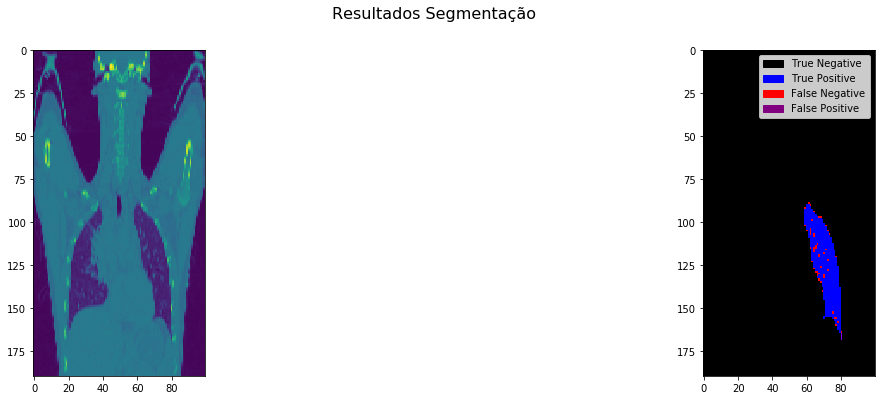

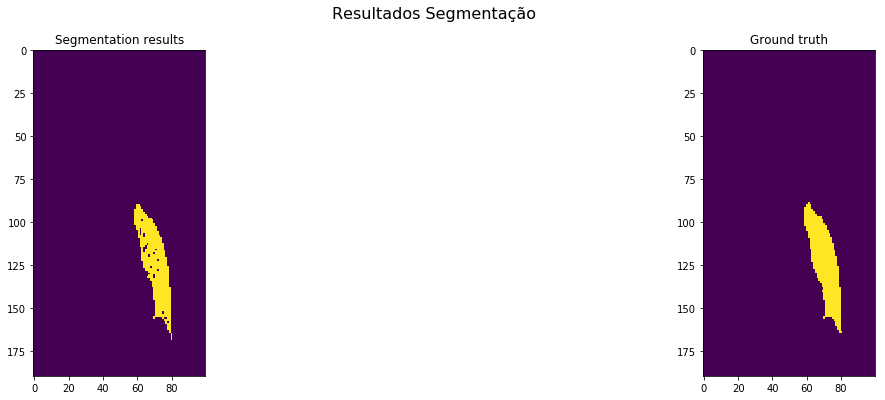

Metrics:
Dice: 0.9546055155364221
Jacquard Index: 0.9131533882410503
True Positive Rate: 0.9204718260655131
Volumetric Similarity: 0.9629171817058096

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 14 in 132
nome pre-result: Centroid3DVolumeSegmented_34332375_right_225.npy
paciente_result: 34332375
region_indice: right
indice_mask: 34332375
shape segmentação: (190, 100, 100)
shape ground truth: (190, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [23078, 1874905, 145, 1872]
Elapsed time: 0.065 seconds.


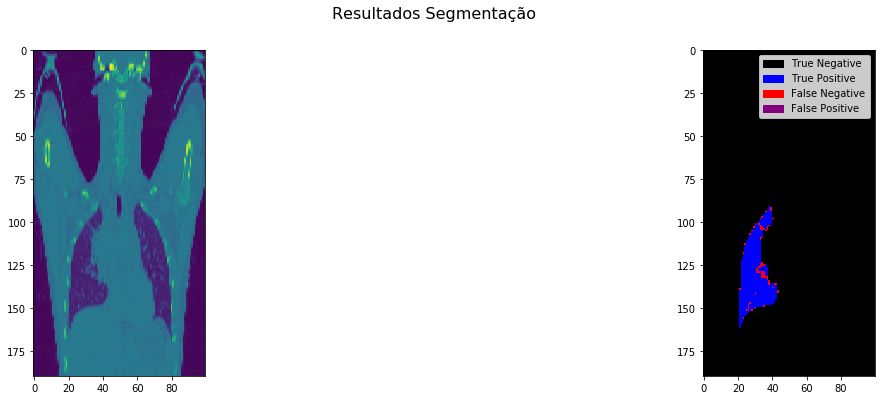

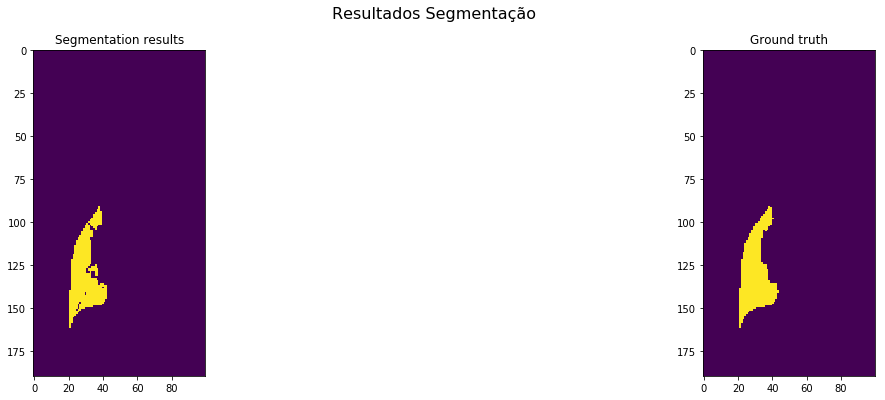

Metrics:
Dice: 0.9581300728623918
Jacquard Index: 0.9196254233911137
True Positive Rate: 0.9249699398797595
Volumetric Similarity: 0.9641500425549582

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 15 in 132
nome pre-result: Centroid3DVolumeSegmented_35196645_right_225.npy
paciente_result: 35196645
region_indice: right
indice_mask: 35196645
shape segmentação: (86, 130, 130)
shape ground truth: (86, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12447, 1439086, 480, 1387]
Elapsed time: 0.029 seconds.


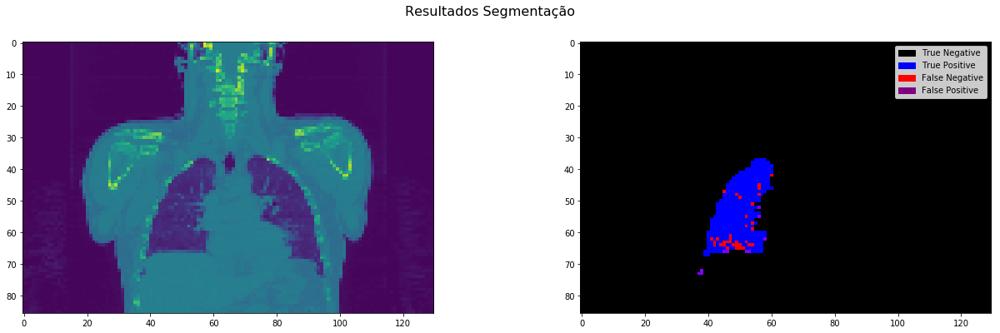

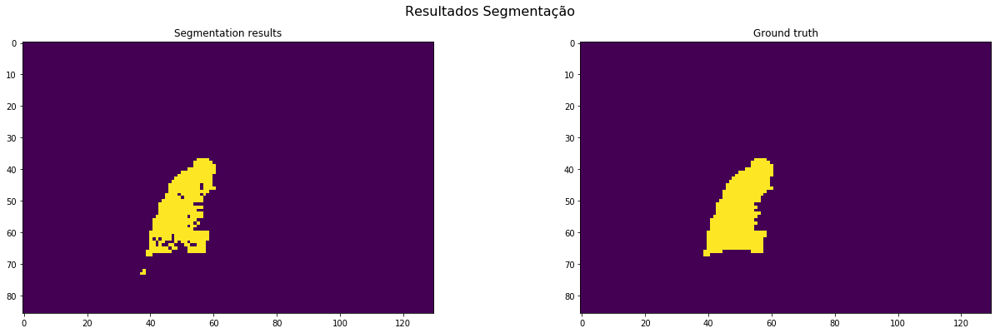

Metrics:
Dice: 0.9302342961772729
Jacquard Index: 0.8695682548553864
True Positive Rate: 0.8997397715772734
Volumetric Similarity: 0.9661073950898695

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 16 in 132
nome pre-result: Centroid3DVolumeSegmented_35939665_left_225.npy
paciente_result: 35939665
region_indice: left
indice_mask: 35939665
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7389, 871846, 235, 530]
Elapsed time: 0.018 seconds.


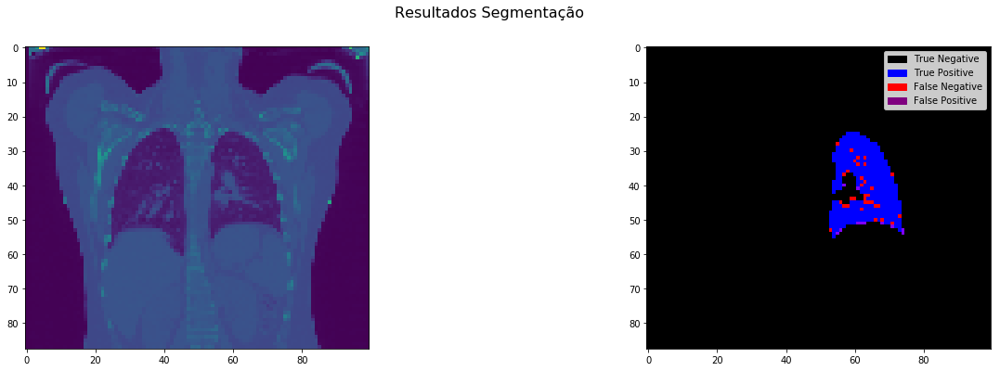

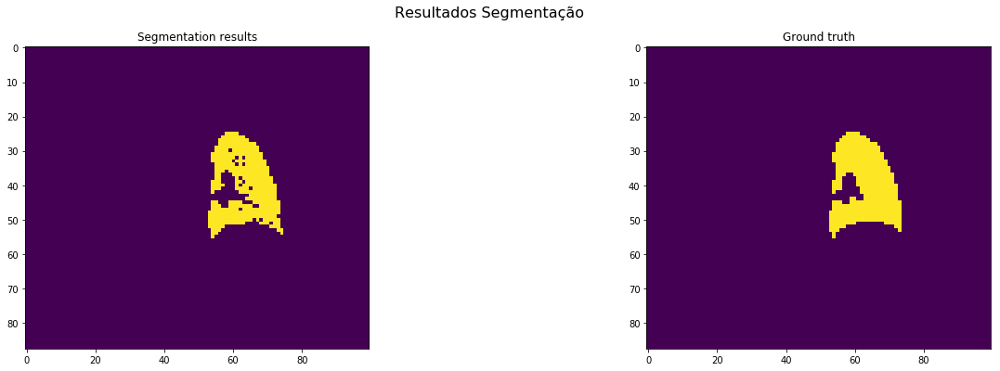

Metrics:
Dice: 0.950781702374059
Jacquard Index: 0.9061810154525386
True Positive Rate: 0.9330723576209118
Volumetric Similarity: 0.9810203950331339

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 17 in 132
nome pre-result: Centroid3DVolumeSegmented_35939665_right_225.npy
paciente_result: 35939665
region_indice: right
indice_mask: 35939665
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10257, 869013, 329, 401]
Elapsed time: 0.023 seconds.


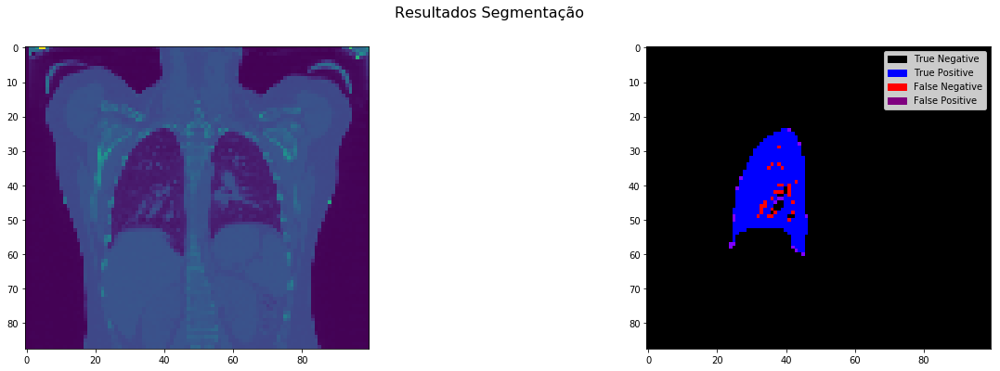

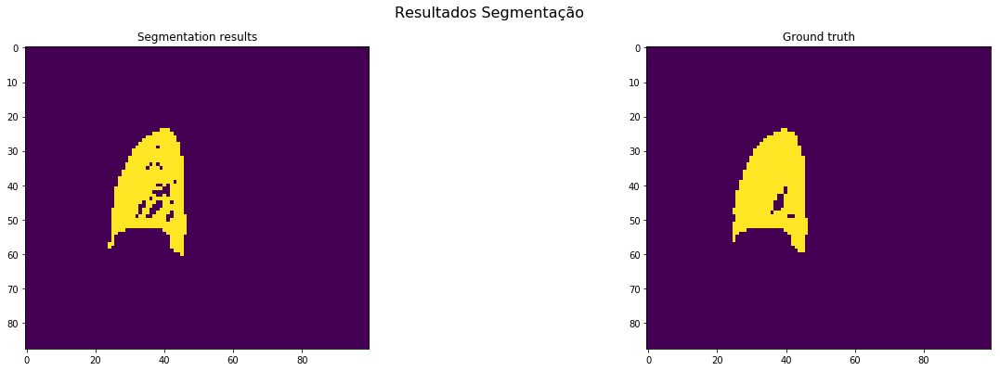

Metrics:
Dice: 0.9656373564300509
Jacquard Index: 0.9335578410849186
True Positive Rate: 0.9623756802401952
Volumetric Similarity: 0.9966108077574845

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 18 in 132
nome pre-result: Centroid3DVolumeSegmented_36319905_left_225.npy
paciente_result: 36319905
region_indice: left
indice_mask: 36319905
shape segmentação: (196, 100, 100)
shape ground truth: (196, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12523, 1944715, 532, 2230]
Elapsed time: 0.065 seconds.


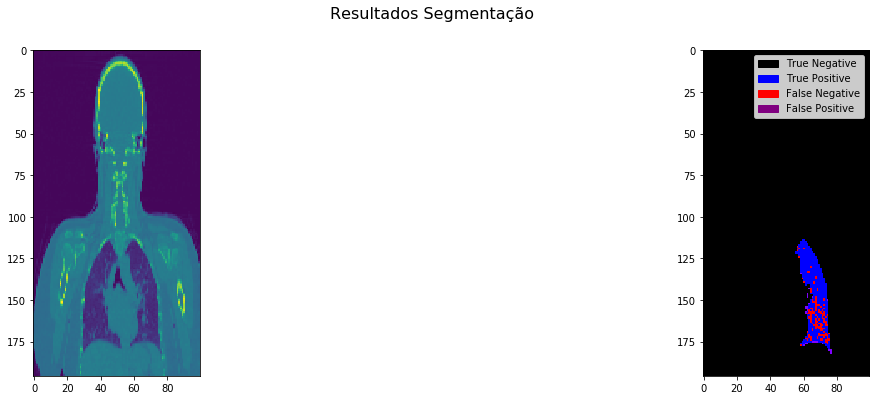

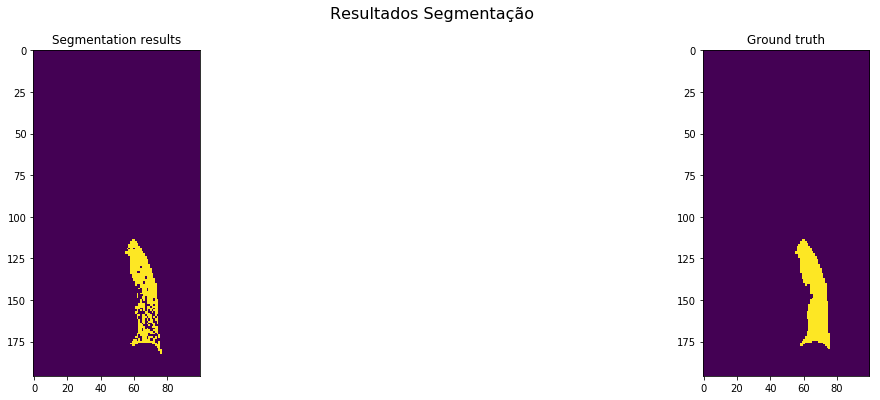

Metrics:
Dice: 0.9006760644418872
Jacquard Index: 0.819299967288191
True Positive Rate: 0.8488443028536569
Volumetric Similarity: 0.9389384349827388

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 19 in 132
nome pre-result: Centroid3DVolumeSegmented_36319905_right_225.npy
paciente_result: 36319905
region_indice: right
indice_mask: 36319905
shape segmentação: (196, 100, 100)
shape ground truth: (196, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [16316, 1942149, 213, 1322]
Elapsed time: 0.042 seconds.


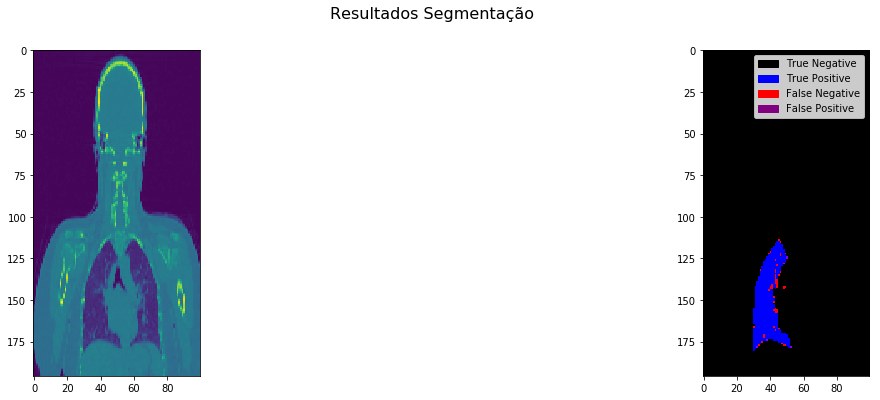

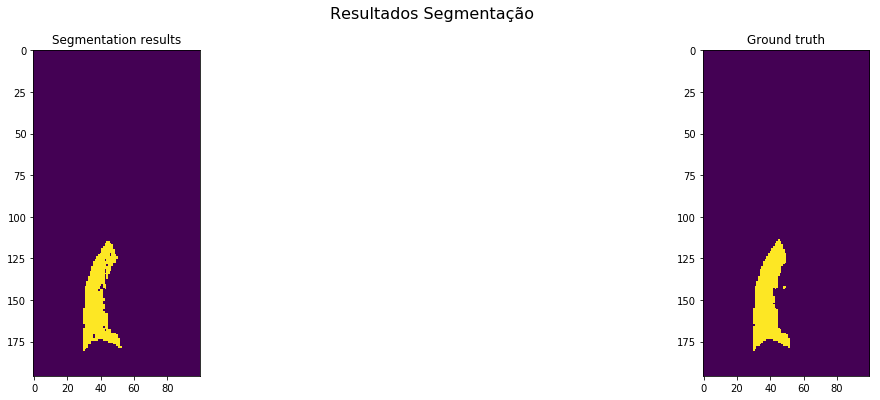

Metrics:
Dice: 0.9550736090379606
Jacquard Index: 0.914010419584337
True Positive Rate: 0.9250481914049212
Volumetric Similarity: 0.9675417800801943

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 20 in 132
nome pre-result: Centroid3DVolumeSegmented_36778909_left_225.npy
paciente_result: 36778909
region_indice: left
indice_mask: 36778909
shape segmentação: (148, 130, 130)
shape ground truth: (148, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [0, 2455897, 39756, 5547]
Elapsed time: 0.080 seconds.


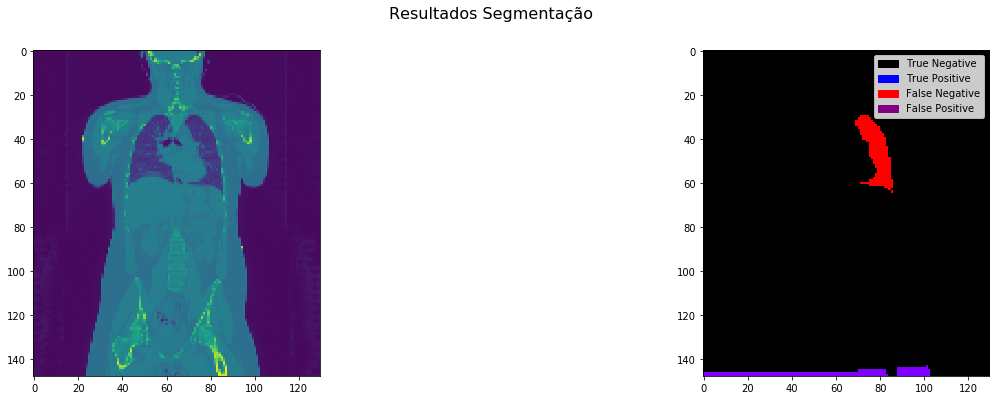

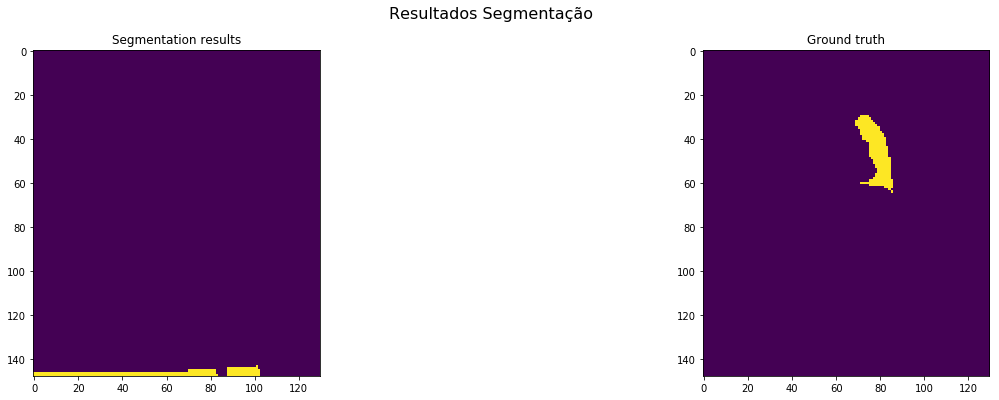

Metrics:
Dice: 0.0
Jacquard Index: 0.0
True Positive Rate: 0.0
Volumetric Similarity: 0.24488444473875903

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 21 in 132
nome pre-result: Centroid3DVolumeSegmented_36778909_right_225.npy
paciente_result: 36778909
region_indice: right
indice_mask: 36778909
shape segmentação: (148, 130, 130)
shape ground truth: (148, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6695, 2494064, 159, 282]
Elapsed time: 0.079 seconds.


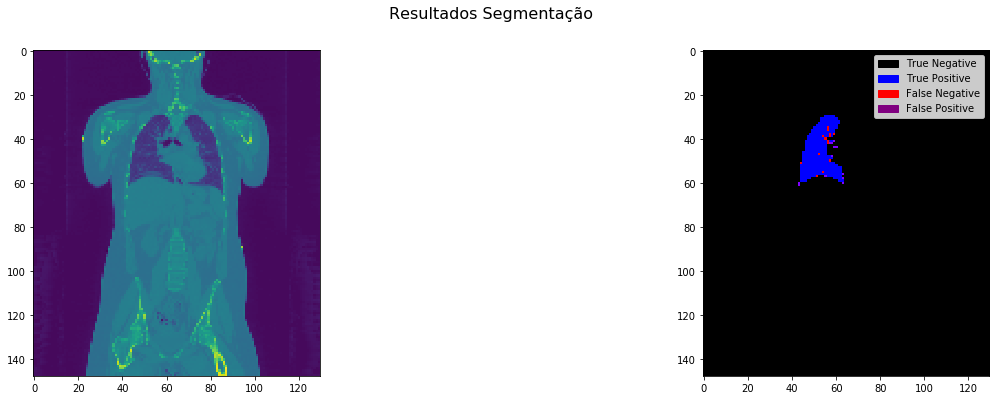

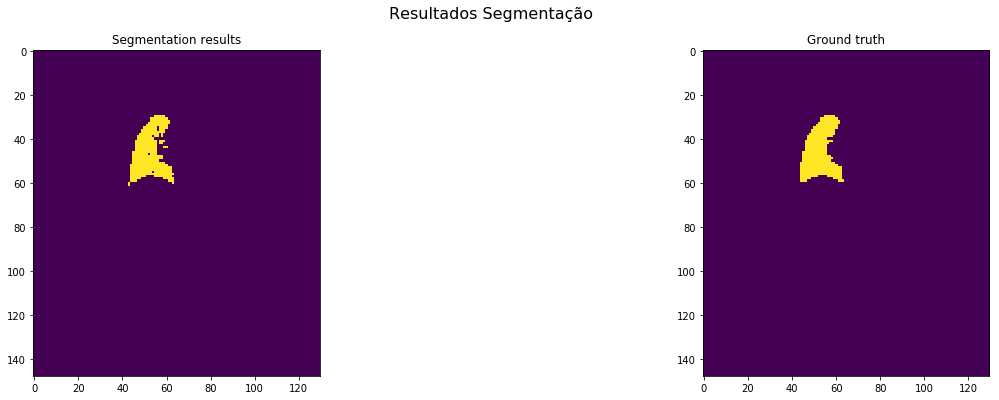

Metrics:
Dice: 0.9681151037524401
Jacquard Index: 0.9382006726457399
True Positive Rate: 0.9595814820123262
Volumetric Similarity: 0.9911069336996602

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 22 in 132
nome pre-result: Centroid3DVolumeSegmented_36873387_left_225.npy
paciente_result: 36873387
region_indice: left
indice_mask: 36873387
shape segmentação: (94, 100, 100)
shape ground truth: (94, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10629, 928606, 135, 630]
Elapsed time: 0.022 seconds.


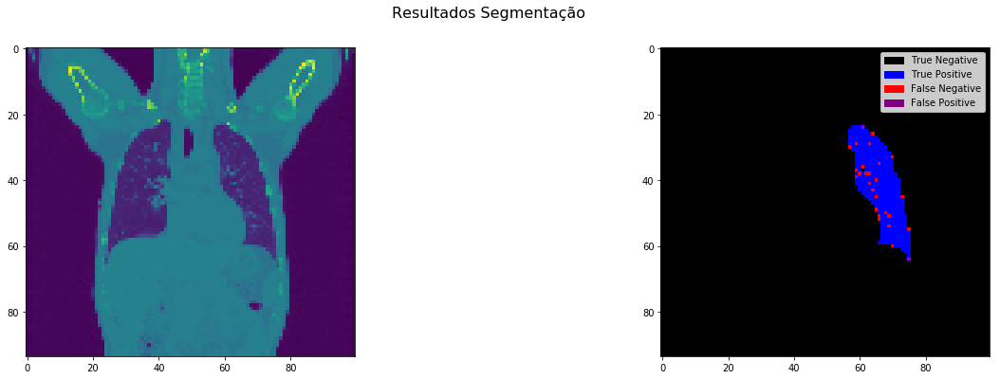

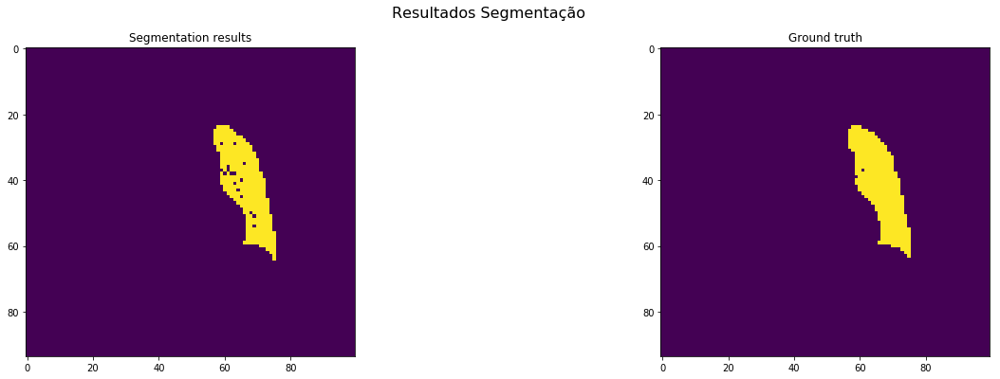

Metrics:
Dice: 0.9652635880670208
Jacquard Index: 0.9328593996840442
True Positive Rate: 0.9440447641886491
Volumetric Similarity: 0.9775234981610135

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 23 in 132
nome pre-result: Centroid3DVolumeSegmented_36873387_right_225.npy
paciente_result: 36873387
region_indice: right
indice_mask: 36873387
shape segmentação: (94, 100, 100)
shape ground truth: (94, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [13153, 925745, 314, 788]
Elapsed time: 0.024 seconds.


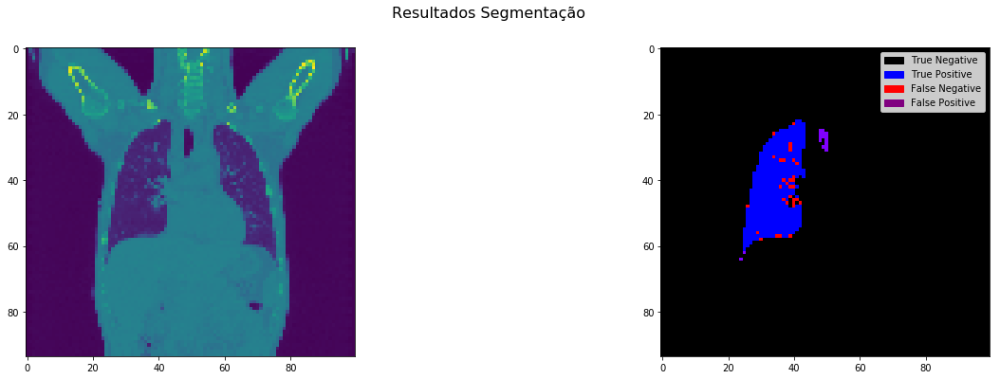

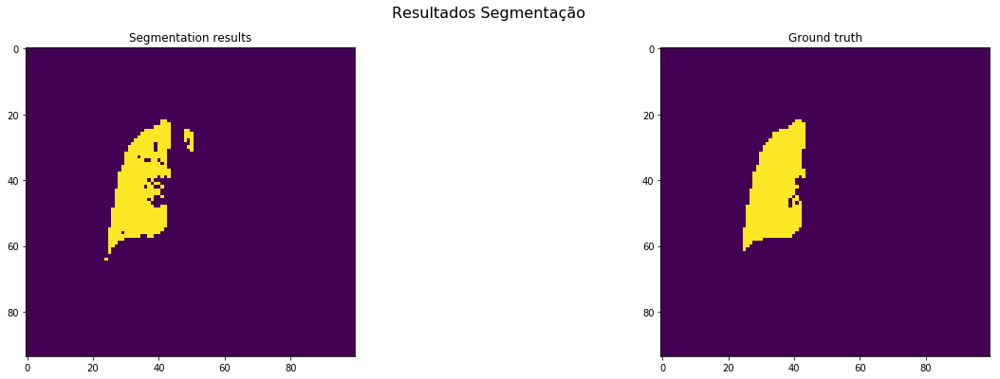

Metrics:
Dice: 0.9597927612375948
Jacquard Index: 0.9226937916520519
True Positive Rate: 0.9434760777562585
Volumetric Similarity: 0.9827057793345009

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 24 in 132
nome pre-result: Centroid3DVolumeSegmented_37017626_left_225.npy
paciente_result: 37017626
region_indice: left
indice_mask: 37017626
shape segmentação: (193, 100, 100)
shape ground truth: (193, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [103, 1875132, 39653, 15112]
Elapsed time: 0.046 seconds.


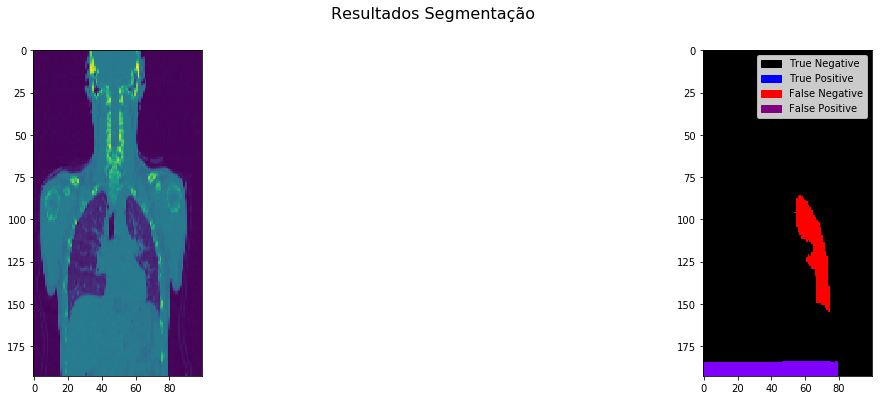

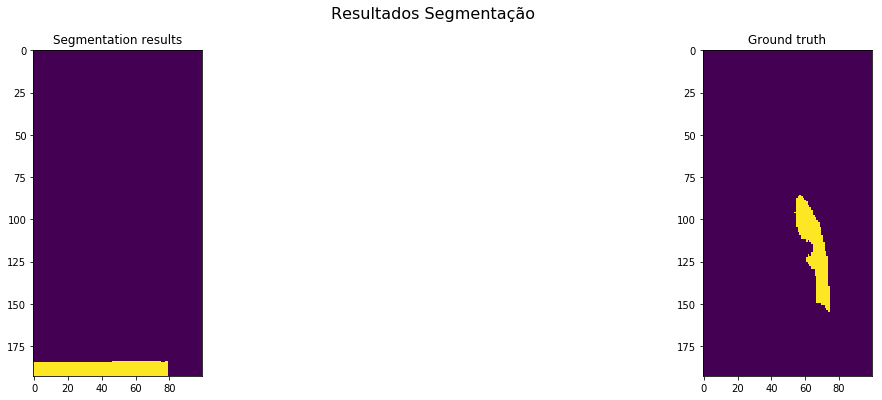

Metrics:
Dice: 0.003747430463335213
Jacquard Index: 0.001877232631041773
True Positive Rate: 0.006769635228393033
Volumetric Similarity: 0.5535646067926725

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 25 in 132
nome pre-result: Centroid3DVolumeSegmented_37017626_right_225.npy
paciente_result: 37017626
region_indice: right
indice_mask: 37017626
shape segmentação: (193, 100, 100)
shape ground truth: (193, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [20276, 1907889, 279, 1556]
Elapsed time: 0.037 seconds.


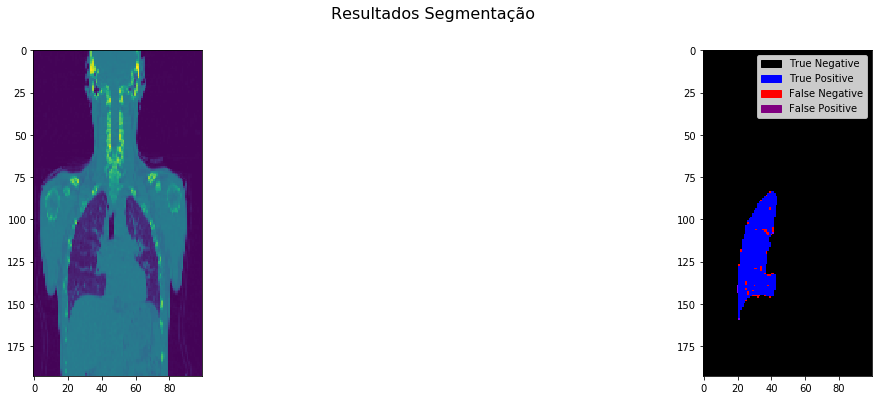

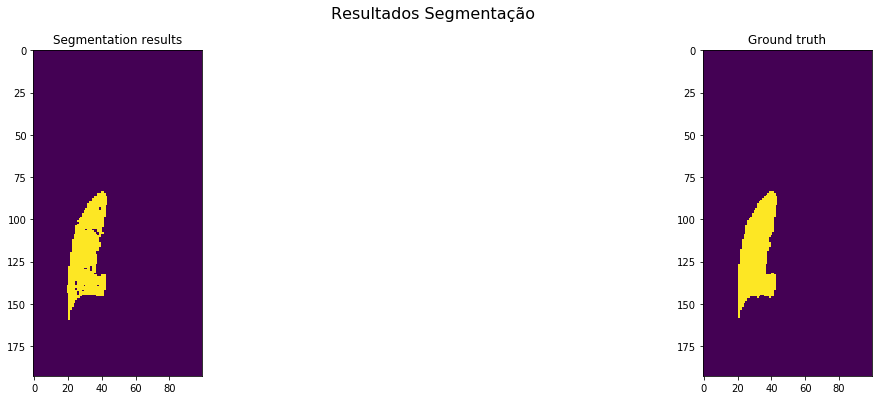

Metrics:
Dice: 0.9567084247528723
Jacquard Index: 0.9170096332142372
True Positive Rate: 0.9287284719677538
Volumetric Similarity: 0.9698728383702551

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 26 in 132
nome pre-result: Centroid3DVolumeSegmented_37018208_left_225.npy
paciente_result: 37018208
region_indice: left
indice_mask: 37018208
shape segmentação: (86, 100, 100)
shape ground truth: (86, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [3387, 855865, 331, 417]
Elapsed time: 0.019 seconds.


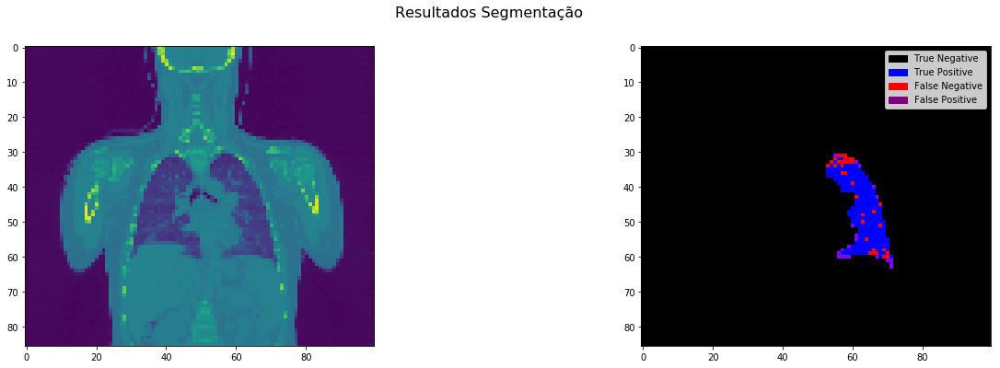

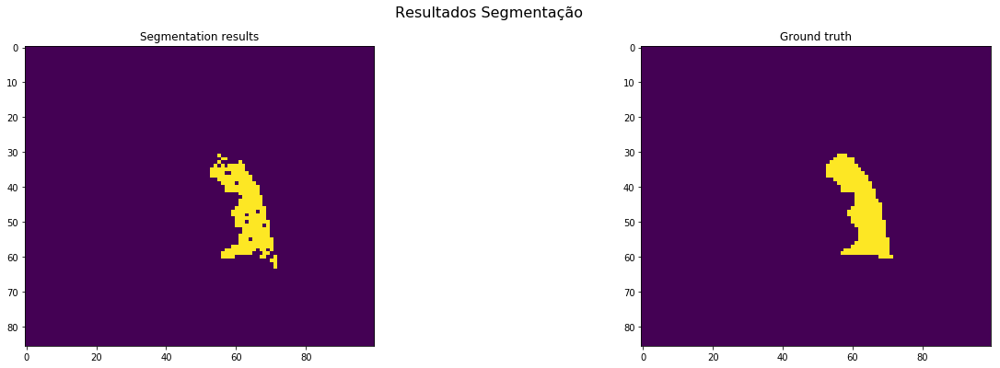

Metrics:
Dice: 0.9005583621377293
Jacquard Index: 0.8191051995163241
True Positive Rate: 0.8903785488958991
Volumetric Similarity: 0.9885668705131614

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 27 in 132
nome pre-result: Centroid3DVolumeSegmented_37018208_right_225.npy
paciente_result: 37018208
region_indice: right
indice_mask: 37018208
shape segmentação: (86, 100, 100)
shape ground truth: (86, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [4376, 855076, 247, 301]
Elapsed time: 0.013 seconds.


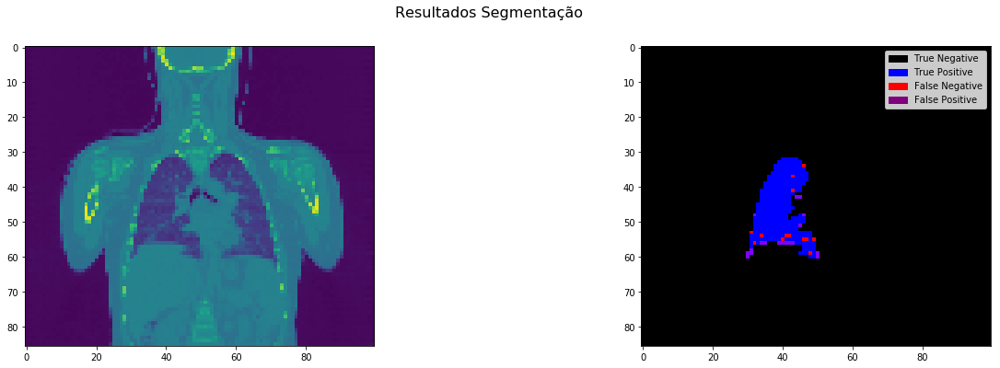

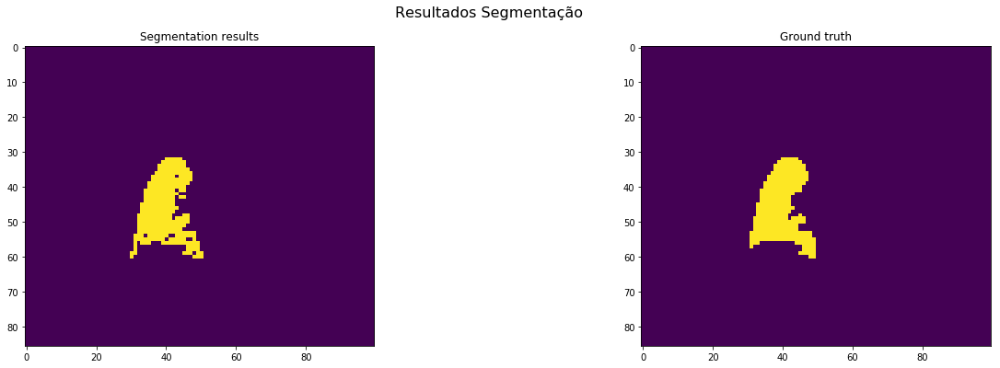

Metrics:
Dice: 0.9410752688172043
Jacquard Index: 0.8887083671811535
True Positive Rate: 0.9356425058798375
Volumetric Similarity: 0.9941935483870967

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 28 in 132
nome pre-result: Centroid3DVolumeSegmented_37042652_left_225.npy
paciente_result: 37042652
region_indice: left
indice_mask: 37042652
shape segmentação: (84, 130, 130)
shape ground truth: (84, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8130, 1410672, 115, 683]
Elapsed time: 0.028 seconds.


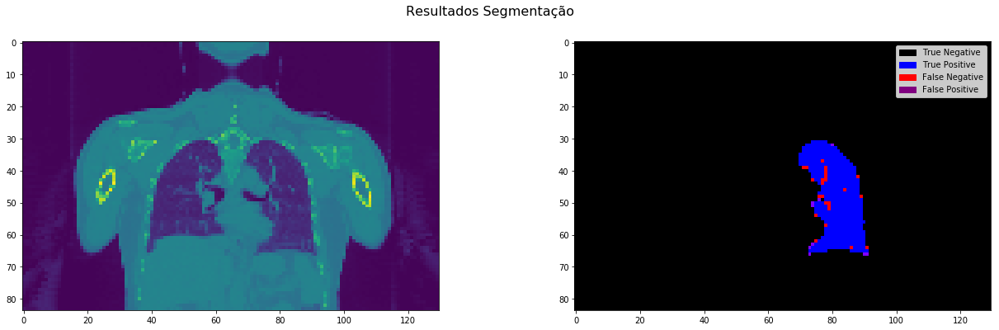

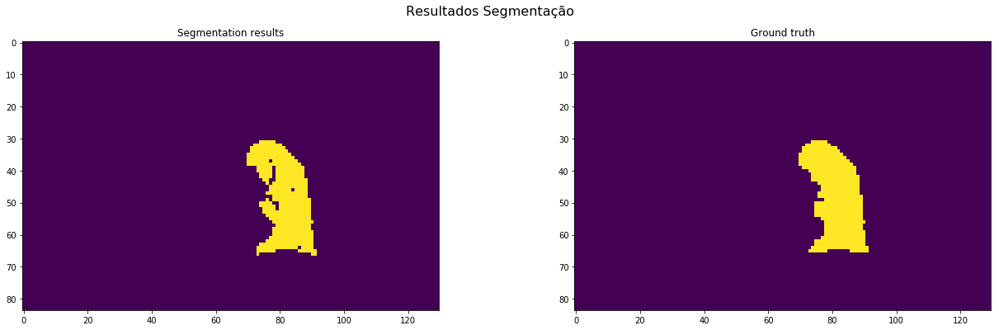

Metrics:
Dice: 0.9532184312346114
Jacquard Index: 0.9106182795698925
True Positive Rate: 0.9225008510155452
Volumetric Similarity: 0.9667018407785204

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 29 in 132
nome pre-result: Centroid3DVolumeSegmented_37042652_right_225.npy
paciente_result: 37042652
region_indice: right
indice_mask: 37042652
shape segmentação: (84, 130, 130)
shape ground truth: (84, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10038, 1408629, 206, 727]
Elapsed time: 0.029 seconds.


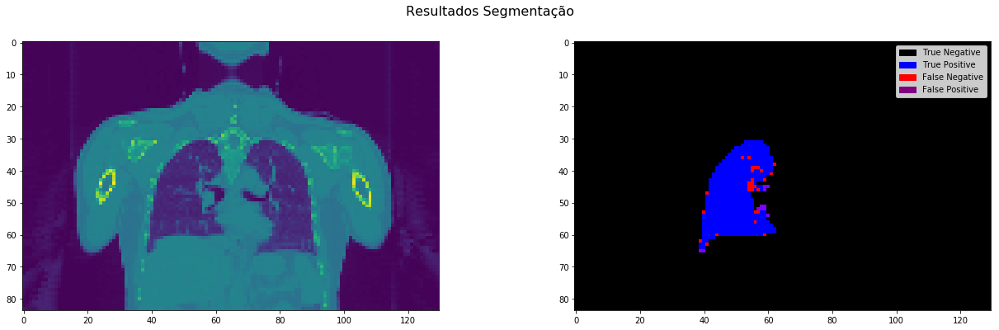

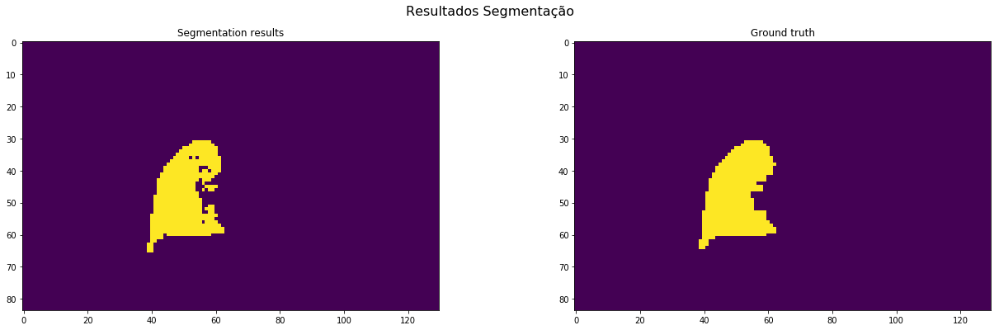

Metrics:
Dice: 0.9555904612309011
Jacquard Index: 0.9149576155318567
True Positive Rate: 0.9324663260566651
Volumetric Similarity: 0.9752011042886382

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 30 in 132
nome pre-result: Centroid3DVolumeSegmented_37137615_left_225.npy
paciente_result: 37137615
region_indice: left
indice_mask: 37137615
shape segmentação: (158, 100, 100)
shape ground truth: (158, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [4637, 1574910, 148, 305]
Elapsed time: 0.047 seconds.


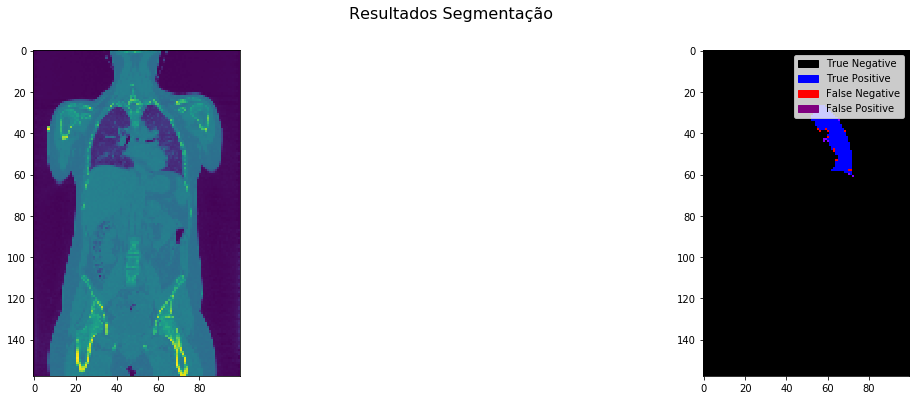

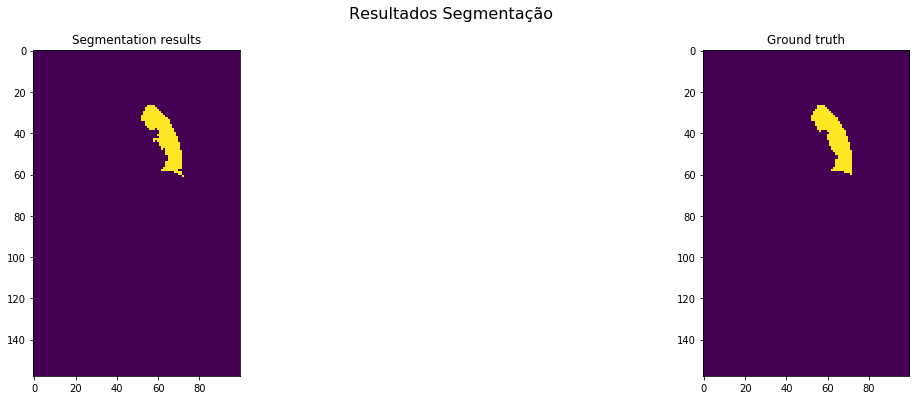

Metrics:
Dice: 0.9534286008018916
Jacquard Index: 0.9110019646365423
True Positive Rate: 0.9382840955078915
Volumetric Similarity: 0.983859360542819

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 31 in 132
nome pre-result: Centroid3DVolumeSegmented_37137615_right_225.npy
paciente_result: 37137615
region_indice: right
indice_mask: 37137615
shape segmentação: (158, 100, 100)
shape ground truth: (158, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6377, 1573096, 216, 311]
Elapsed time: 0.052 seconds.


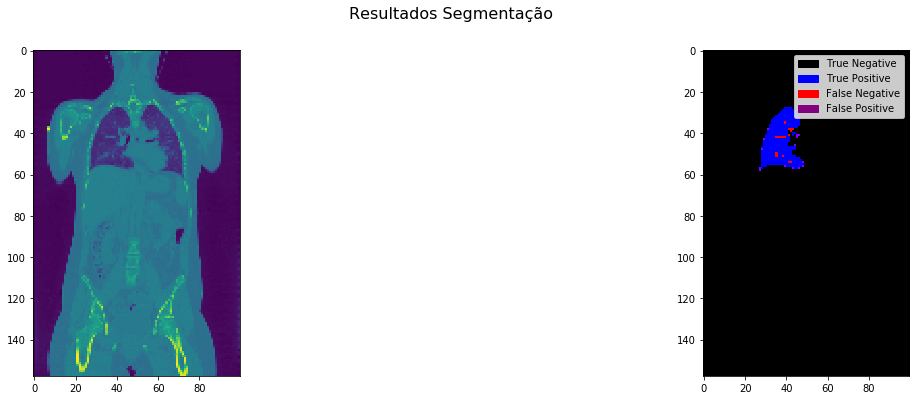

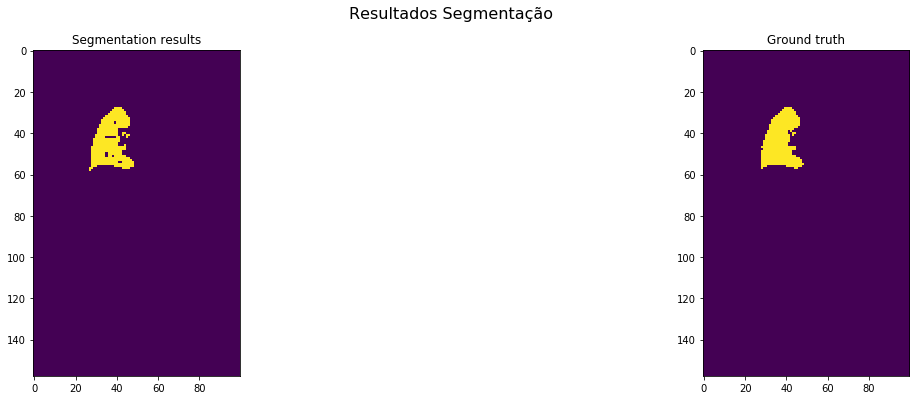

Metrics:
Dice: 0.960319253068293
Jacquard Index: 0.923667439165701
True Positive Rate: 0.9534988038277512
Volumetric Similarity: 0.9928469241773963

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 32 in 132
nome pre-result: Centroid3DVolumeSegmented_37173796_left_225.npy
paciente_result: 37173796
region_indice: left
indice_mask: 37173796
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8466, 910885, 45, 604]
Elapsed time: 0.012 seconds.


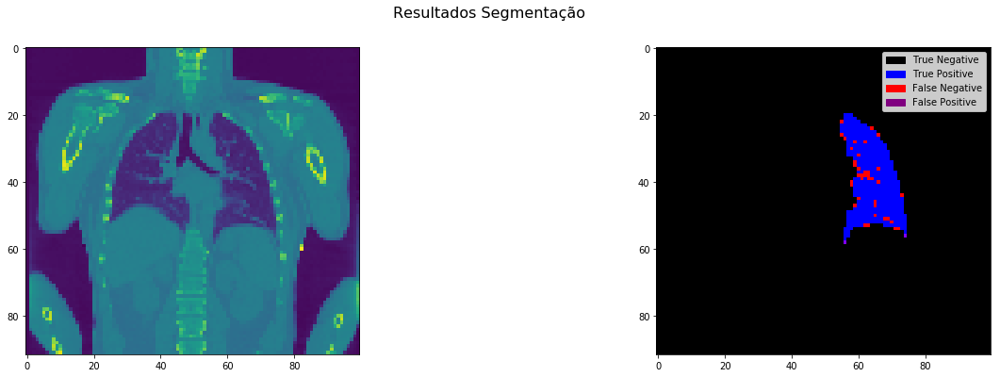

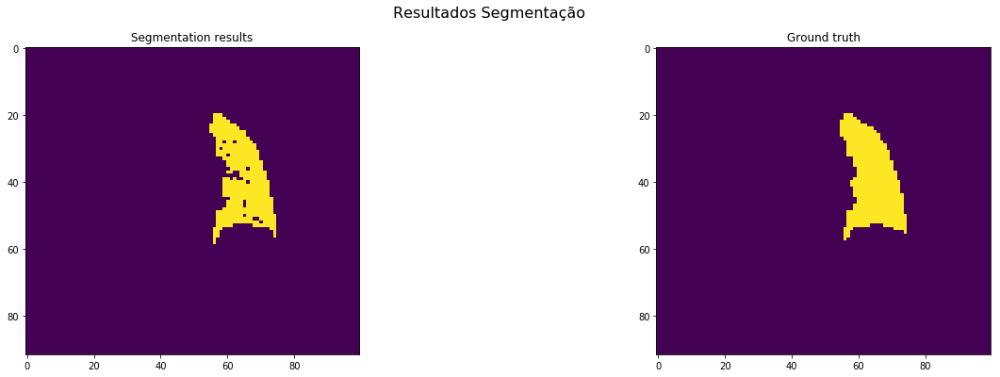

Metrics:
Dice: 0.9630851487401172
Jacquard Index: 0.9287986834887548
True Positive Rate: 0.933406835722161
Volumetric Similarity: 0.9682043114726124

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 33 in 132
nome pre-result: Centroid3DVolumeSegmented_37173796_right_225.npy
paciente_result: 37173796
region_indice: right
indice_mask: 37173796
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9267, 910046, 65, 622]
Elapsed time: 0.011 seconds.


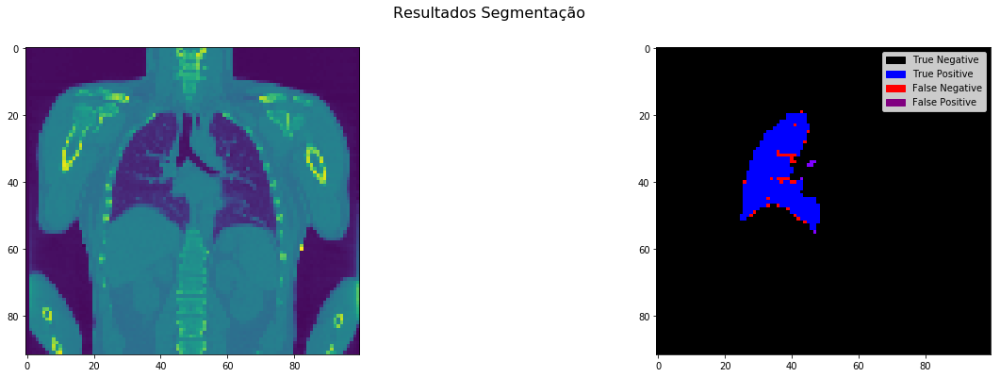

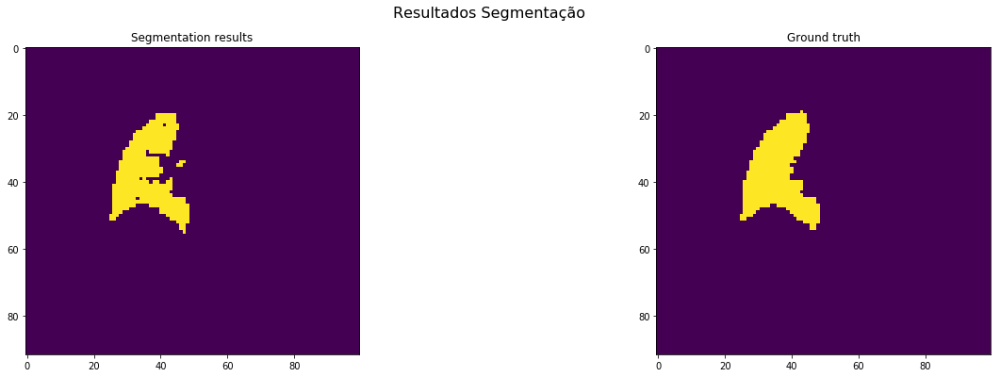

Metrics:
Dice: 0.964257842984236
Jacquard Index: 0.9309825195901146
True Positive Rate: 0.9371018303165133
Volumetric Similarity: 0.9710212788096353

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 34 in 132
nome pre-result: Centroid3DVolumeSegmented_37468094_left_225.npy
paciente_result: 37468094
region_indice: left
indice_mask: 37468094
shape segmentação: (112, 100, 100)
shape ground truth: (112, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8882, 1110366, 87, 665]
Elapsed time: 0.035 seconds.


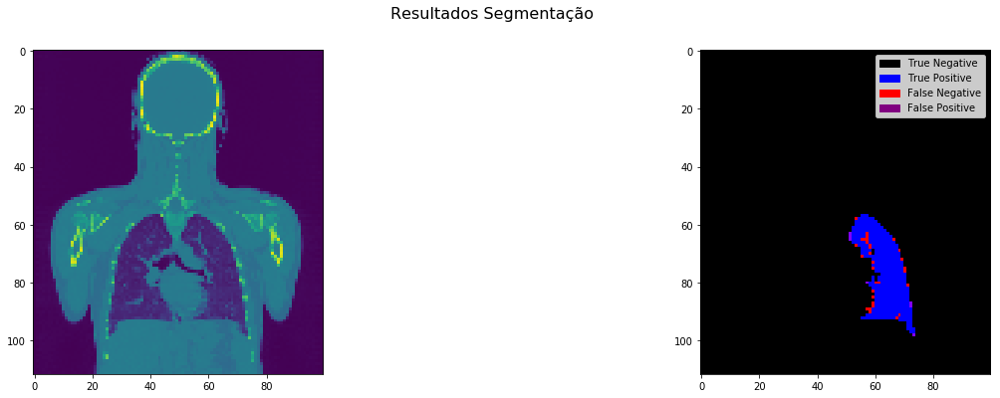

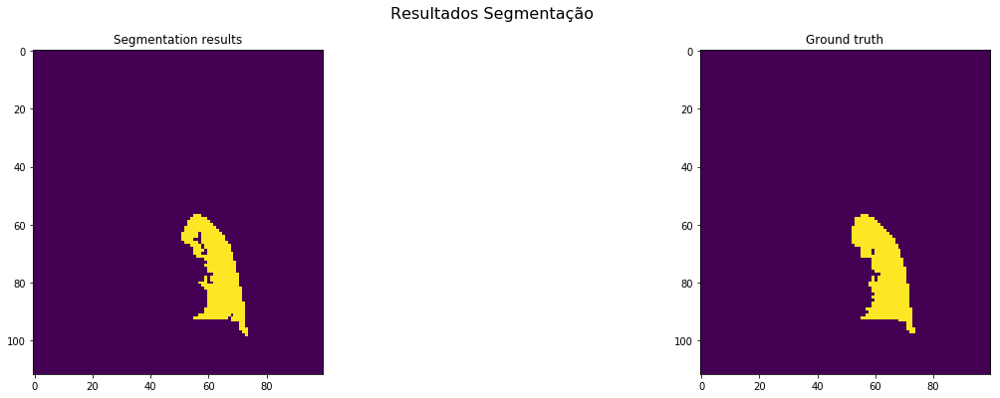

Metrics:
Dice: 0.9593864765608122
Jacquard Index: 0.9219431181233133
True Positive Rate: 0.9303446108725254
Volumetric Similarity: 0.9687837545906244

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 35 in 132
nome pre-result: Centroid3DVolumeSegmented_37468094_right_225.npy
paciente_result: 37468094
region_indice: right
indice_mask: 37468094
shape segmentação: (112, 100, 100)
shape ground truth: (112, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10765, 1108357, 80, 798]
Elapsed time: 0.022 seconds.


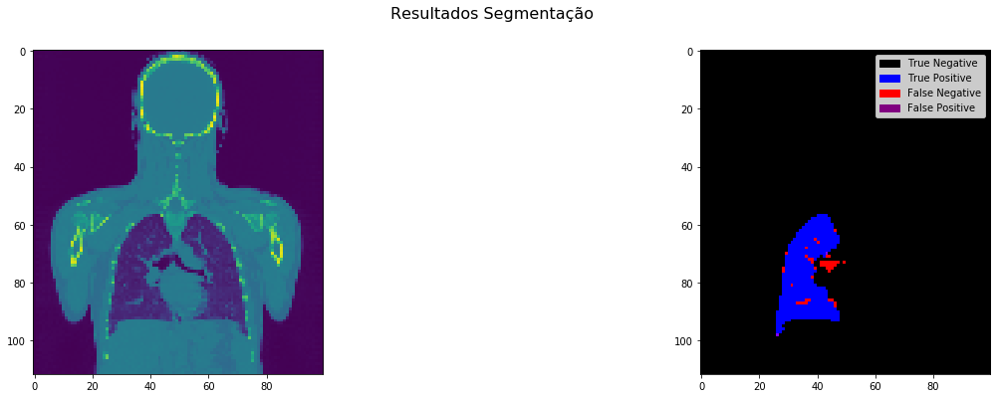

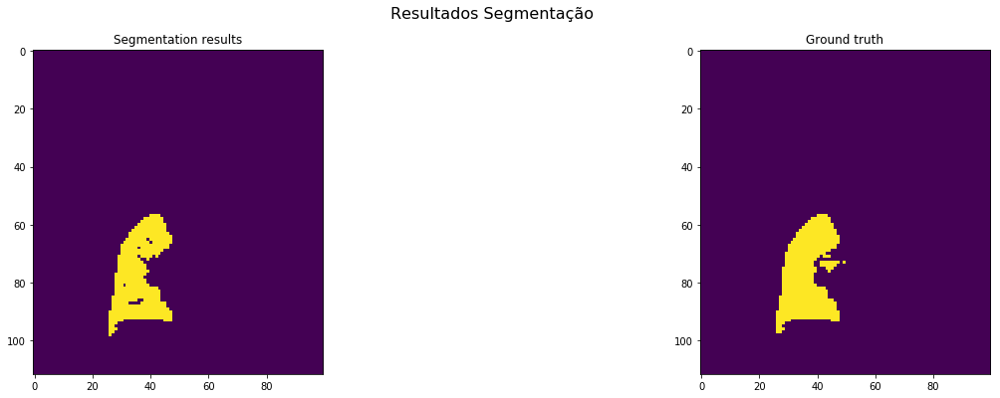

Metrics:
Dice: 0.9608175651553017
Jacquard Index: 0.9245898823327321
True Positive Rate: 0.9309867681397561
Volumetric Similarity: 0.9679578721885042

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 36 in 132
nome pre-result: Centroid3DVolumeSegmented_37606125_left_225.npy
paciente_result: 37606125
region_indice: left
indice_mask: 37606125
shape segmentação: (120, 100, 100)
shape ground truth: (120, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6050, 1193378, 236, 336]
Elapsed time: 0.029 seconds.


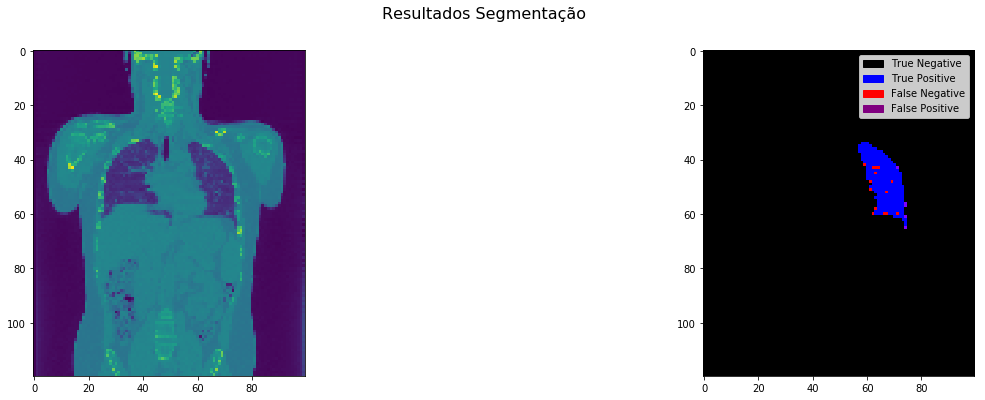

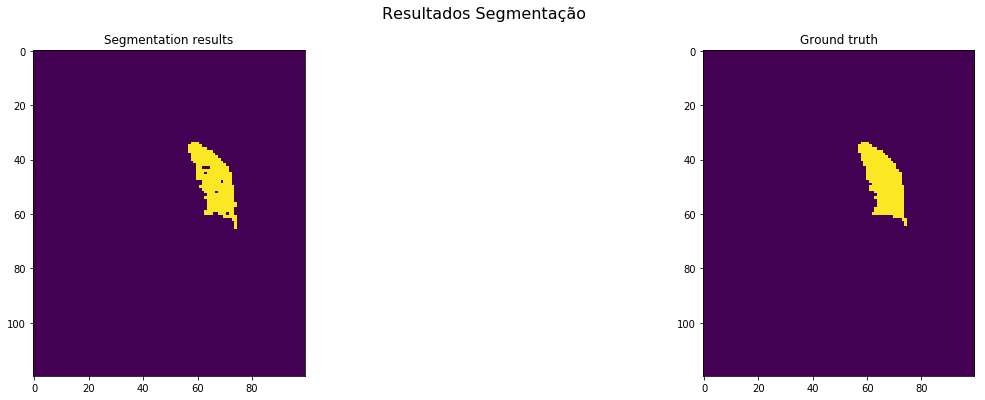

Metrics:
Dice: 0.9548611111111112
Jacquard Index: 0.9136212624584718
True Positive Rate: 0.9473849044785468
Volumetric Similarity: 0.9921085858585859

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 37 in 132
nome pre-result: Centroid3DVolumeSegmented_37606125_right_225.npy
paciente_result: 37606125
region_indice: right
indice_mask: 37606125
shape segmentação: (120, 100, 100)
shape ground truth: (120, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5, 1190933, 0, 9062]
Elapsed time: 0.025 seconds.


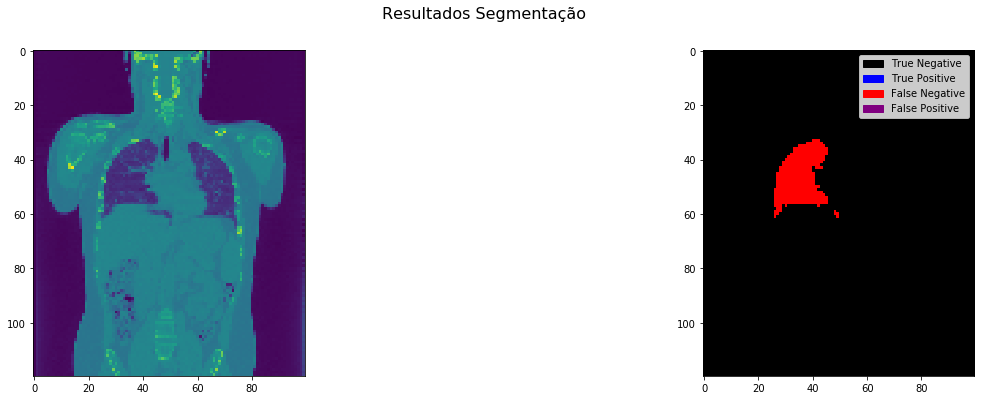

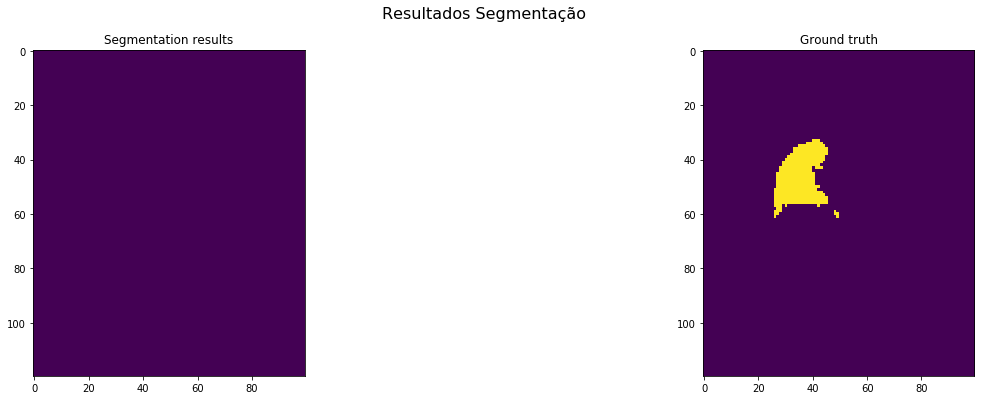

Metrics:
Dice: 0.0011022927689594356
Jacquard Index: 0.0005514503143266791
True Positive Rate: 0.0005514503143266791
Volumetric Similarity: 0.0011022927689594564

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 38 in 132
nome pre-result: Centroid3DVolumeSegmented_37624458_left_225.npy
paciente_result: 37624458
region_indice: left
indice_mask: 37624458
shape segmentação: (187, 100, 100)
shape ground truth: (187, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [18063, 1849978, 293, 1666]
Elapsed time: 0.059 seconds.


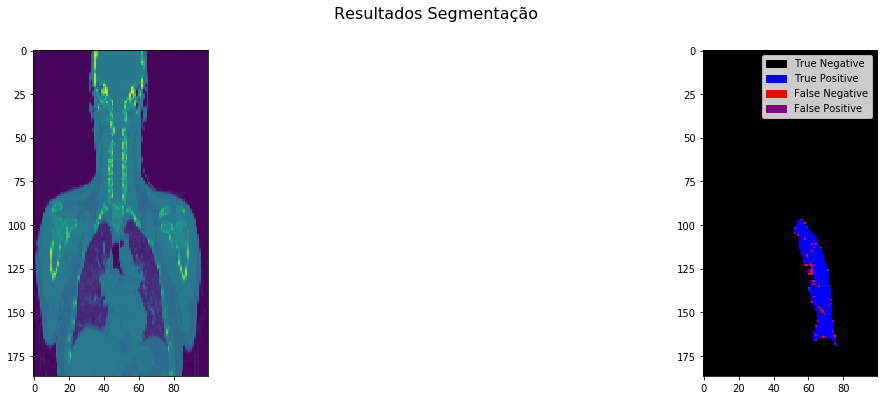

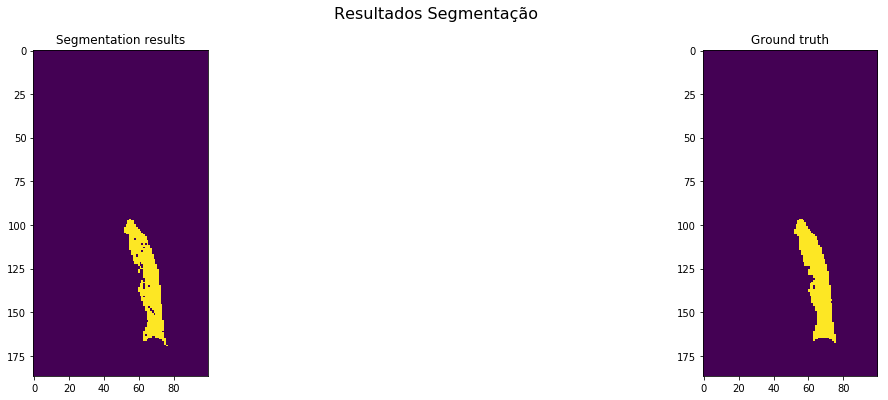

Metrics:
Dice: 0.9485624261520283
Jacquard Index: 0.9021576266107282
True Positive Rate: 0.9155557808302499
Volumetric Similarity: 0.9639490613102272

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 39 in 132
nome pre-result: Centroid3DVolumeSegmented_37624458_right_225.npy
paciente_result: 37624458
region_indice: right
indice_mask: 37624458
shape segmentação: (187, 100, 100)
shape ground truth: (187, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [22246, 1844684, 258, 2812]
Elapsed time: 0.036 seconds.


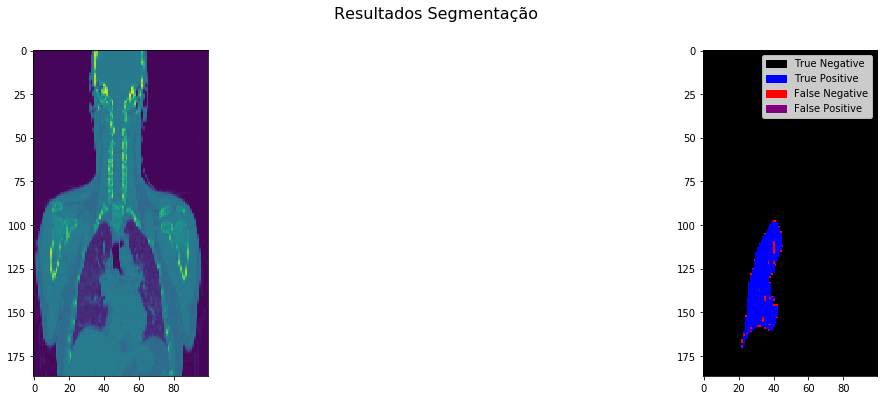

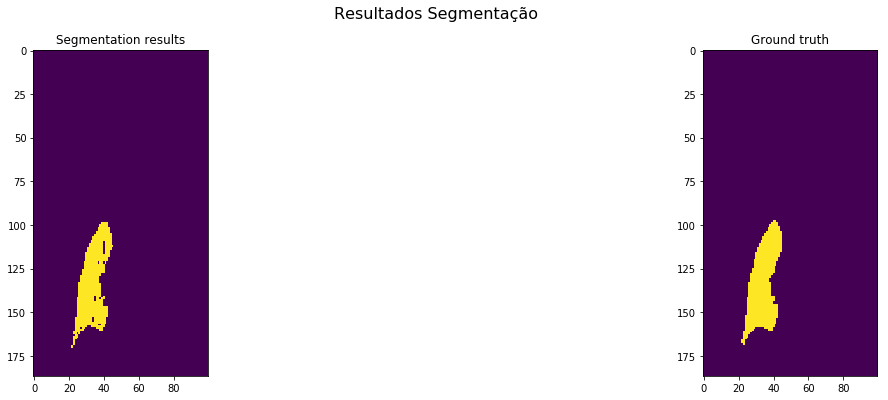

Metrics:
Dice: 0.935452672301417
Jacquard Index: 0.8787328171907094
True Positive Rate: 0.8877803495889536
Volumetric Similarity: 0.9463016693999411

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 40 in 132
nome pre-result: Centroid3DVolumeSegmented_37650357_left_225.npy
paciente_result: 37650357
region_indice: left
indice_mask: 37650357
shape segmentação: (115, 100, 100)
shape ground truth: (115, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [212, 1097439, 39544, 12805]
Elapsed time: 0.032 seconds.


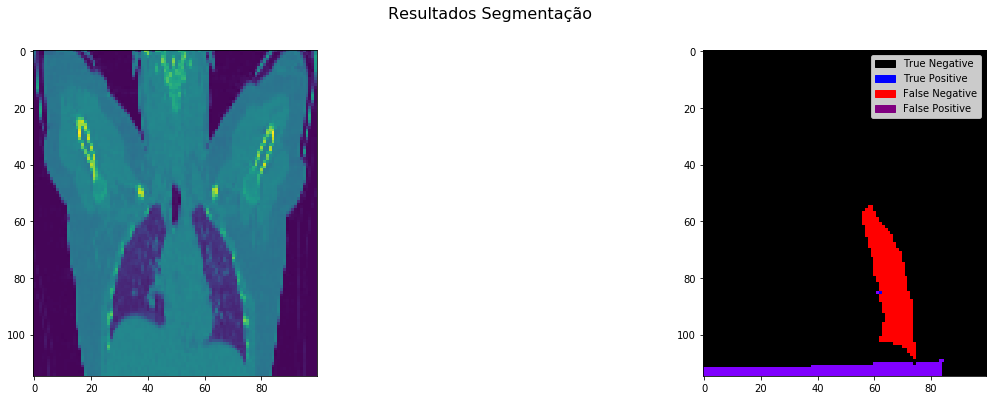

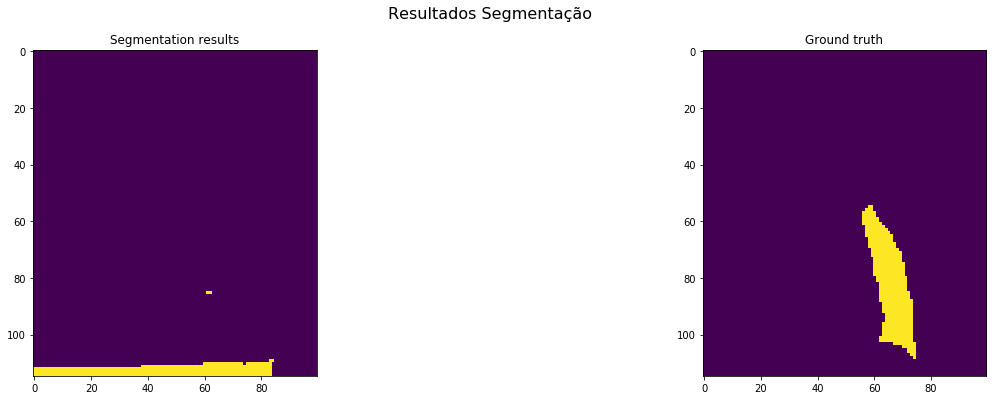

Metrics:
Dice: 0.008034411536202225
Jacquard Index: 0.004033408801202412
True Positive Rate: 0.01628639471460398
Volumetric Similarity: 0.49332044795634133

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 41 in 132
nome pre-result: Centroid3DVolumeSegmented_37650357_right_225.npy
paciente_result: 37650357
region_indice: right
indice_mask: 37650357
shape segmentação: (115, 100, 100)
shape ground truth: (115, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [14663, 1133432, 175, 1730]
Elapsed time: 0.034 seconds.


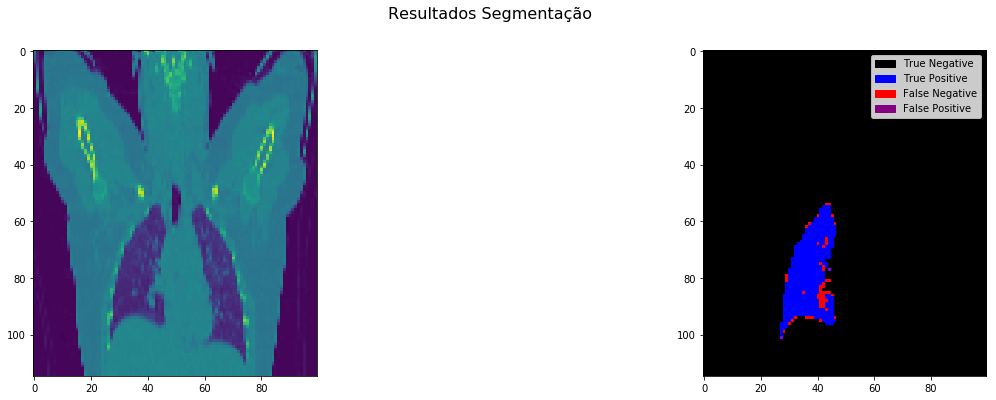

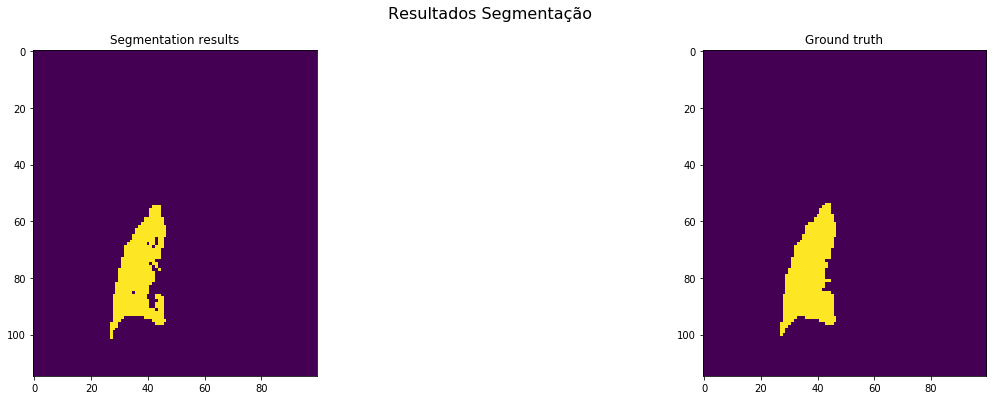

Metrics:
Dice: 0.9390029137715731
Jacquard Index: 0.8850193143408981
True Positive Rate: 0.8944671506130666
Volumetric Similarity: 0.9502097275143288

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 42 in 132
nome pre-result: Centroid3DVolumeSegmented_37683143_left_225.npy
paciente_result: 37683143
region_indice: left
indice_mask: 37683143
shape segmentação: (138, 100, 100)
shape ground truth: (138, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [4714, 1374953, 113, 220]
Elapsed time: 0.030 seconds.


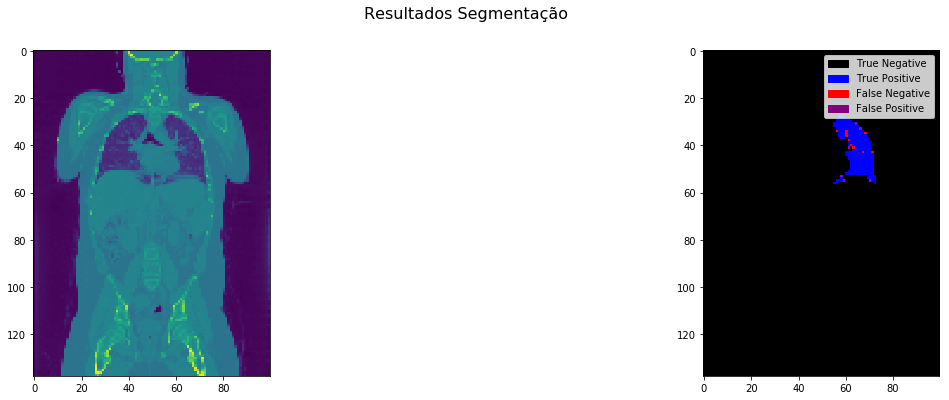

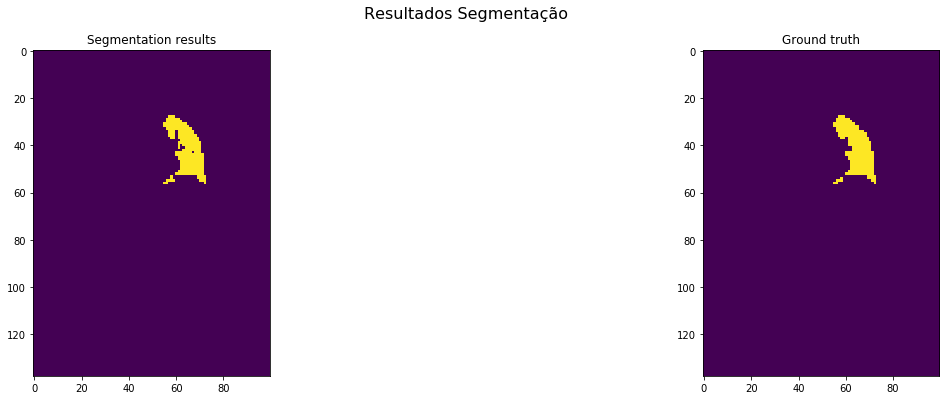

Metrics:
Dice: 0.9658846429669091
Jacquard Index: 0.9340202100257579
True Positive Rate: 0.9554114308877178
Volumetric Similarity: 0.9890380084007786

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 43 in 132
nome pre-result: Centroid3DVolumeSegmented_37683143_right_225.npy
paciente_result: 37683143
region_indice: right
indice_mask: 37683143
shape segmentação: (138, 100, 100)
shape ground truth: (138, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5449, 1374108, 275, 168]
Elapsed time: 0.027 seconds.


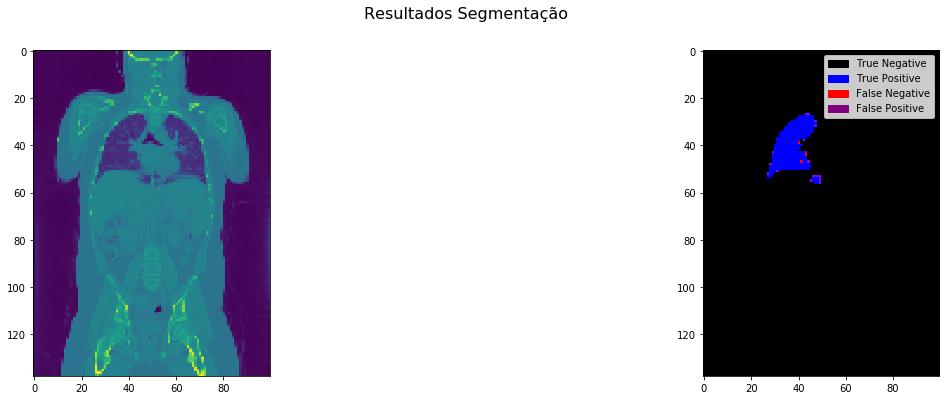

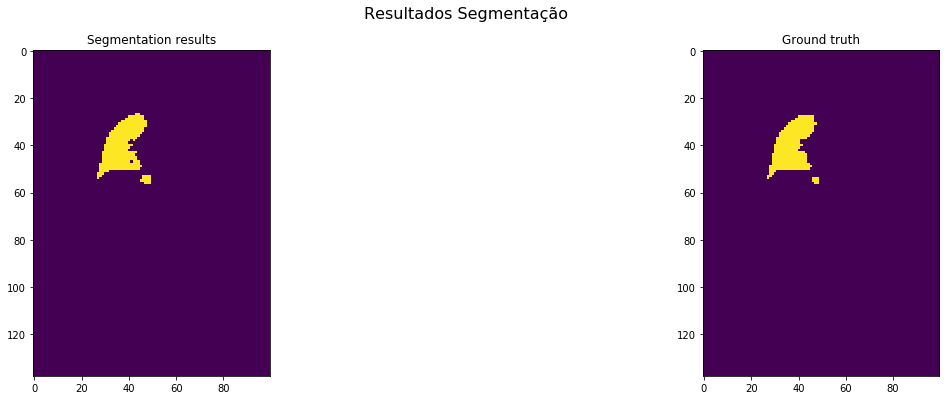

Metrics:
Dice: 0.9609381888722335
Jacquard Index: 0.9248133061778683
True Positive Rate: 0.9700907957984689
Volumetric Similarity: 0.9905652058901332

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 44 in 132
nome pre-result: Centroid3DVolumeSegmented_37881605_left_225.npy
paciente_result: 37881605
region_indice: left
indice_mask: 37881605


C:\Anaconda3\lib\site-packages\scipy\ndimage\interpolation.py:605: UserWarning: From scipy 0.13.0, the output shape of zoom() is calculated with round() instead of int() - for these inputs the size of the returned array has changed.
  "the returned array has changed.", UserWarning)


shape segmentação: (100, 100, 100)
shape ground truth: (100, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9769, 989012, 51, 1168]
Elapsed time: 0.014 seconds.


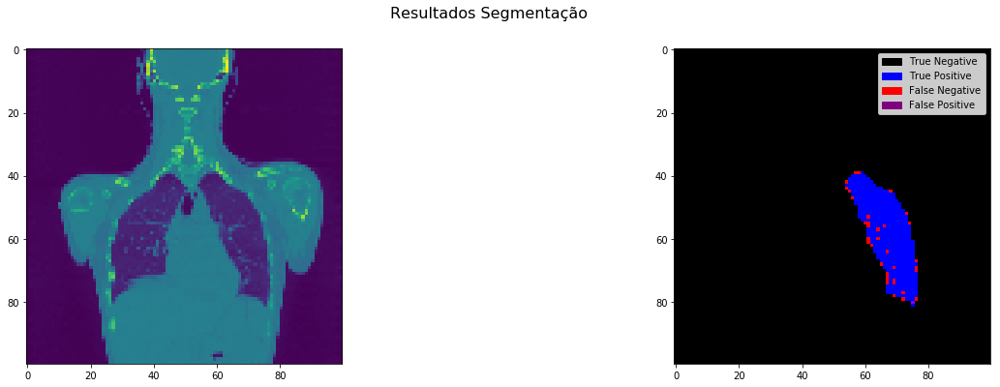

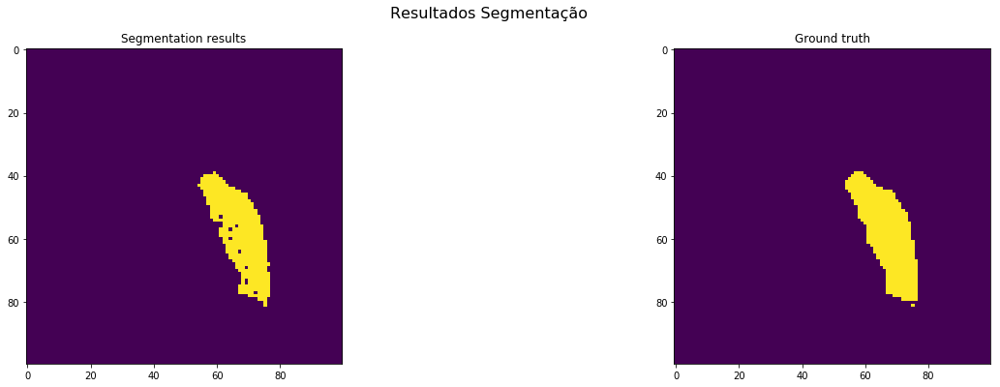

Metrics:
Dice: 0.9412728236257648
Jacquard Index: 0.8890607935930106
True Positive Rate: 0.8932065465849868
Volumetric Similarity: 0.9461868285397698

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 45 in 132
nome pre-result: Centroid3DVolumeSegmented_37881605_right_225.npy
paciente_result: 37881605
region_indice: right
indice_mask: 37881605
shape segmentação: (100, 100, 100)
shape ground truth: (100, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10288, 988530, 109, 1073]
Elapsed time: 0.012 seconds.


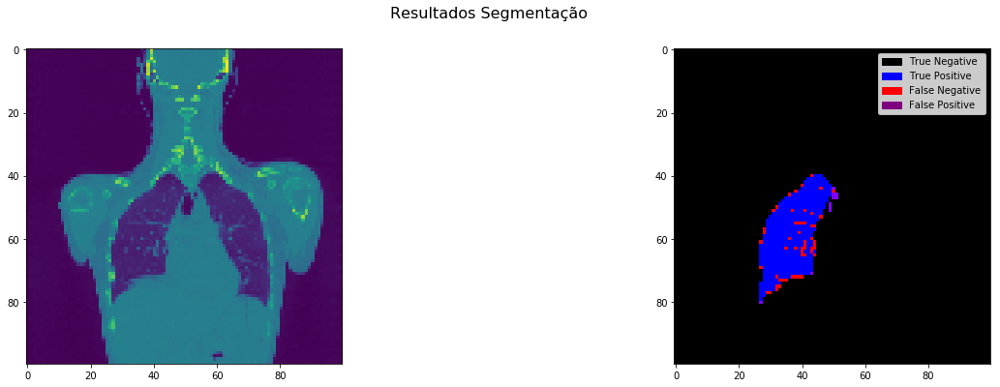

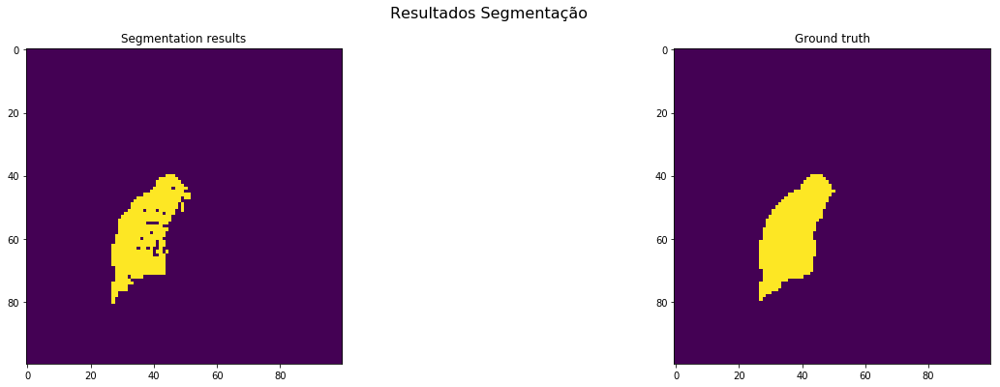

Metrics:
Dice: 0.9456751539663572
Jacquard Index: 0.8969485614646905
True Positive Rate: 0.9055540885485432
Volumetric Similarity: 0.9556944572111408

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 46 in 132
nome pre-result: Centroid3DVolumeSegmented_37953385_left_225.npy
paciente_result: 37953385
region_indice: left
indice_mask: 37953385
shape segmentação: (96, 100, 100)
shape ground truth: (96, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6042, 952903, 335, 720]
Elapsed time: 0.014 seconds.


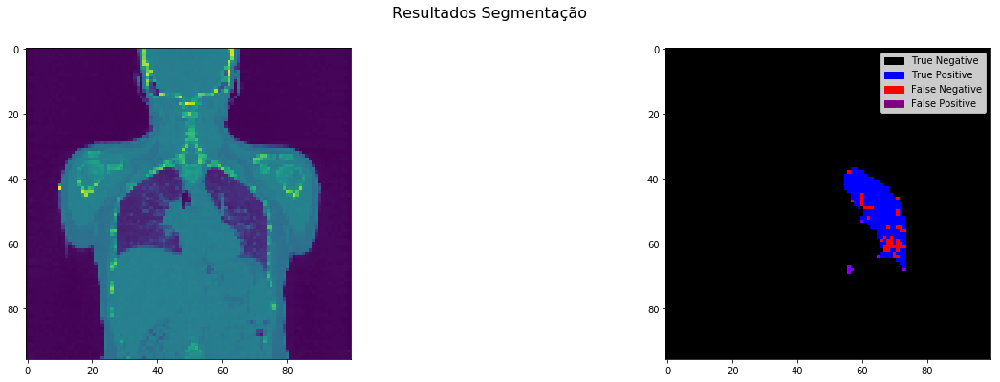

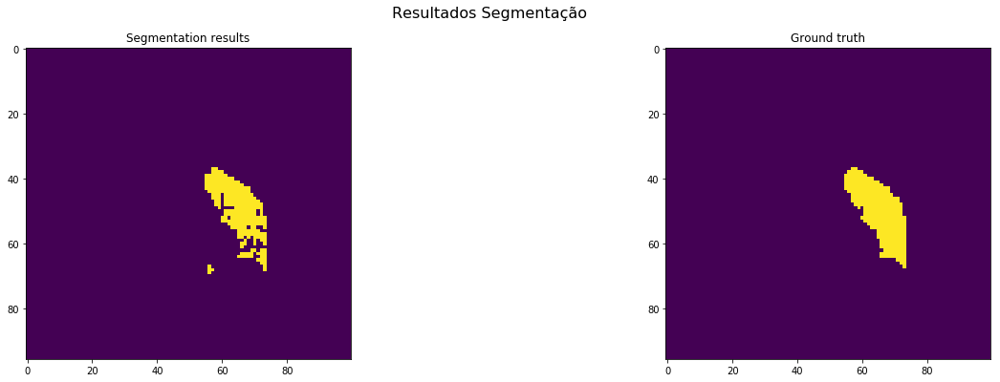

Metrics:
Dice: 0.9197046959433747
Jacquard Index: 0.8513456390023953
True Positive Rate: 0.8935226264418811
Volumetric Similarity: 0.9706979222163026

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 47 in 132
nome pre-result: Centroid3DVolumeSegmented_37953385_right_225.npy
paciente_result: 37953385
region_indice: right
indice_mask: 37953385
shape segmentação: (96, 100, 100)
shape ground truth: (96, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7629, 951527, 244, 600]
Elapsed time: 0.013 seconds.


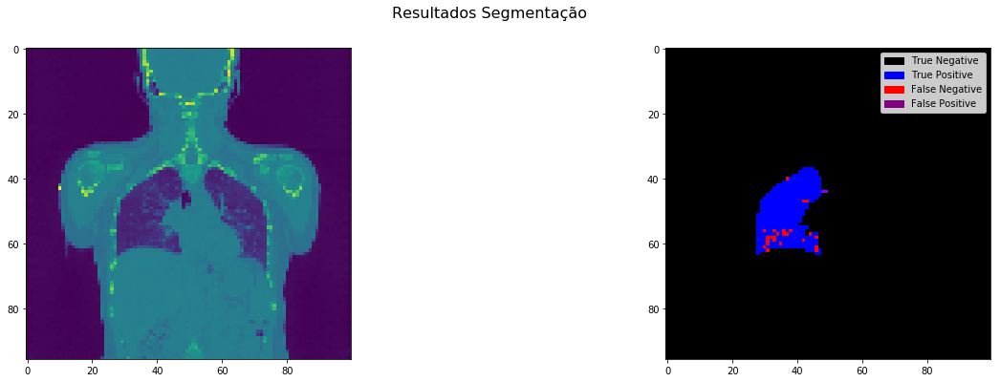

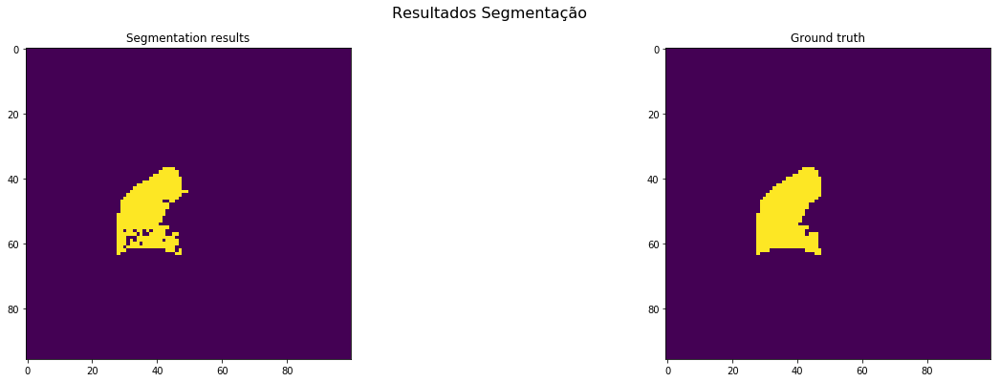

Metrics:
Dice: 0.9475841510371382
Jacquard Index: 0.9003894724418742
True Positive Rate: 0.9270871308786001
Volumetric Similarity: 0.9778909452241957

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 48 in 132
nome pre-result: Centroid3DVolumeSegmented_38028657_left_225.npy
paciente_result: 38028657
region_indice: left
indice_mask: 38028657
shape segmentação: (80, 100, 100)
shape ground truth: (80, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9189, 790141, 85, 585]
Elapsed time: 0.013 seconds.


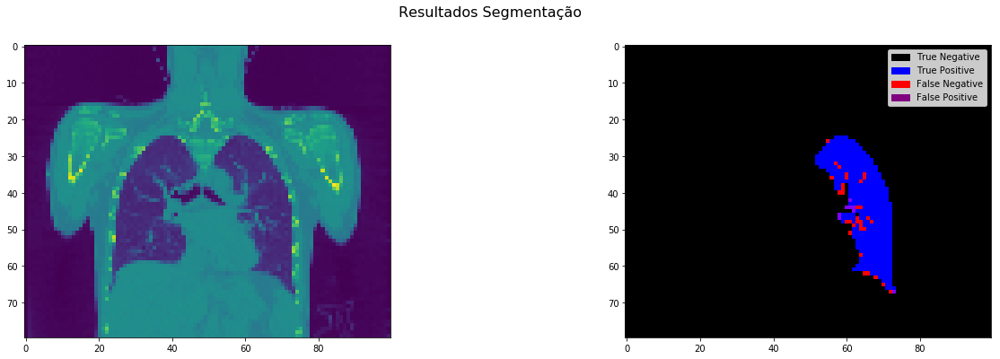

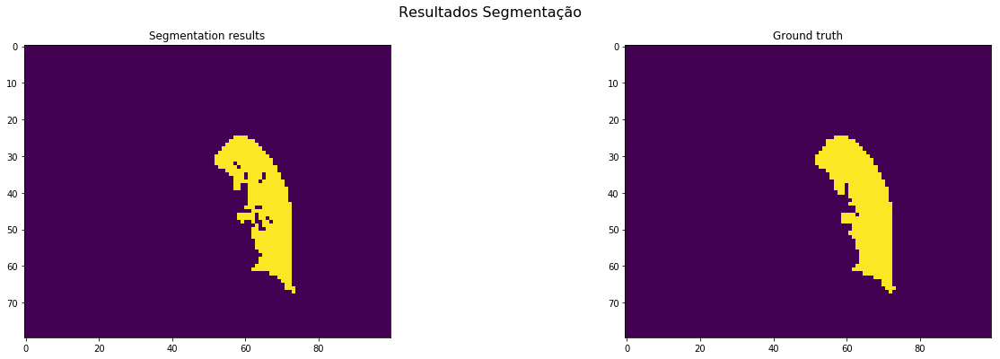

Metrics:
Dice: 0.9648257034859303
Jacquard Index: 0.9320417892281164
True Positive Rate: 0.9401473296500921
Volumetric Similarity: 0.9737505249895002

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 49 in 132
nome pre-result: Centroid3DVolumeSegmented_38028657_right_225.npy
paciente_result: 38028657
region_indice: right
indice_mask: 38028657
shape segmentação: (80, 100, 100)
shape ground truth: (80, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10849, 788387, 75, 689]
Elapsed time: 0.010 seconds.


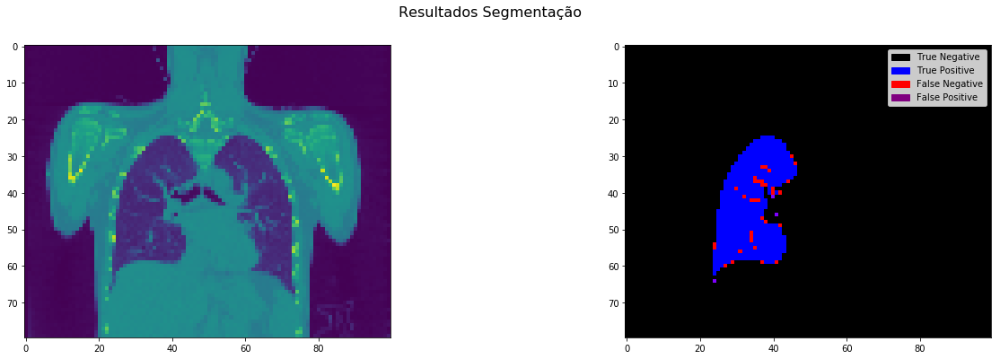

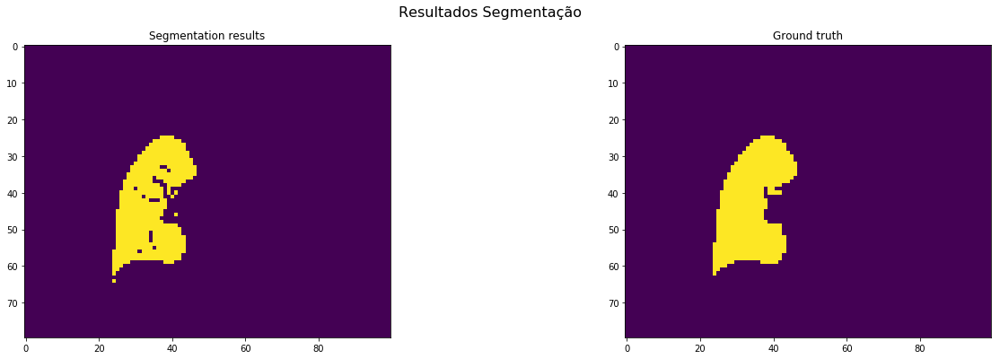

Metrics:
Dice: 0.9659870002671178
Jacquard Index: 0.9342116593472832
True Positive Rate: 0.9402842780377881
Volumetric Similarity: 0.9726649452408512

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 50 in 132
nome pre-result: Centroid3DVolumeSegmented_38133514_left_225.npy
paciente_result: 38133514
region_indice: left
indice_mask: 38133514
shape segmentação: (97, 100, 100)
shape ground truth: (97, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [14668, 951172, 3364, 796]
Elapsed time: 0.013 seconds.


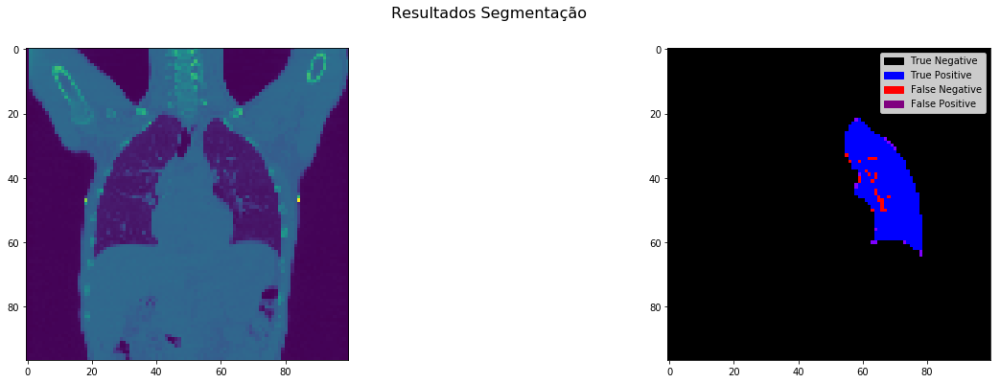

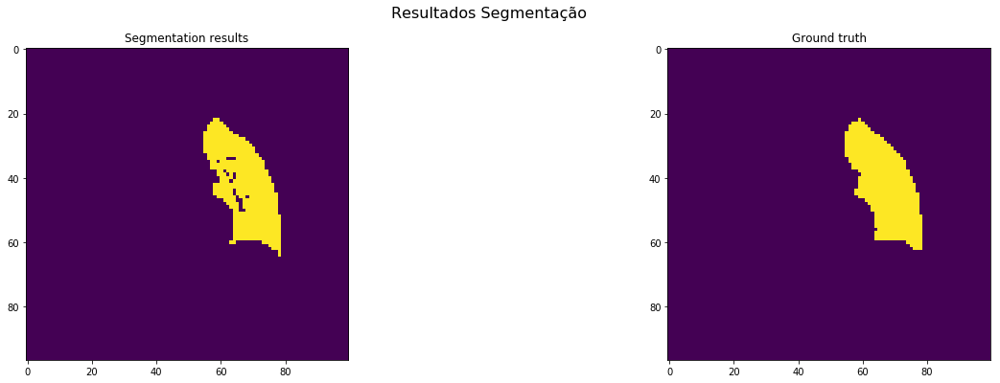

Metrics:
Dice: 0.8758060663959876
Jacquard Index: 0.7790524750371787
True Positive Rate: 0.9485256078634248
Volumetric Similarity: 0.9233341294482923

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 51 in 132
nome pre-result: Centroid3DVolumeSegmented_38133514_right_225.npy
paciente_result: 38133514
region_indice: right
indice_mask: 38133514
shape segmentação: (97, 100, 100)
shape ground truth: (97, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [17165, 951368, 738, 729]
Elapsed time: 0.013 seconds.


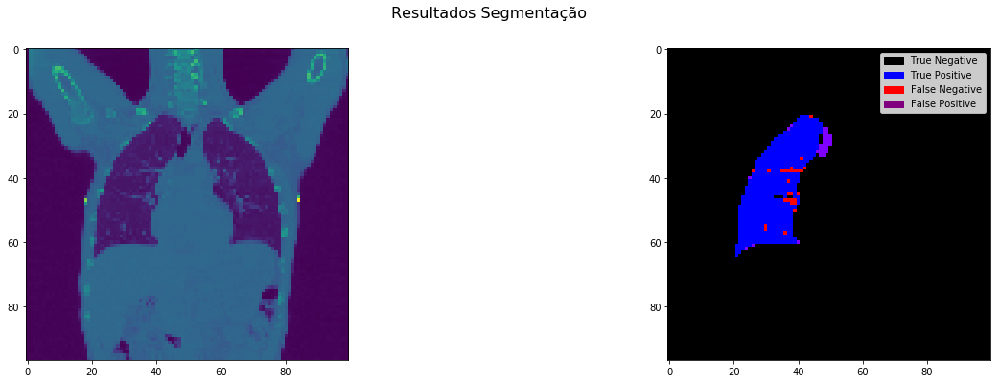

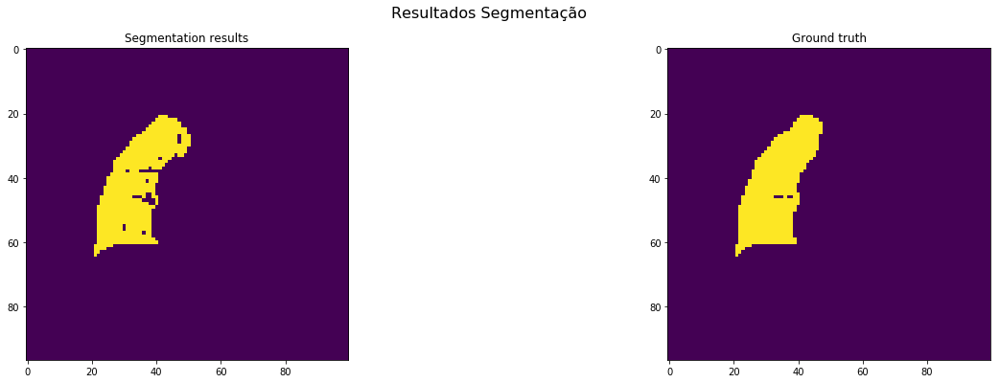

Metrics:
Dice: 0.9590189121993463
Jacquard Index: 0.9212644911979391
True Positive Rate: 0.9592600871800604
Volumetric Similarity: 0.9997485822834316

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 52 in 132
nome pre-result: Centroid3DVolumeSegmented_38564873_left_225.npy
paciente_result: 38564873
region_indice: left
indice_mask: 38564873
shape segmentação: (102, 100, 100)
shape ground truth: (102, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8408, 1010456, 157, 979]
Elapsed time: 0.014 seconds.


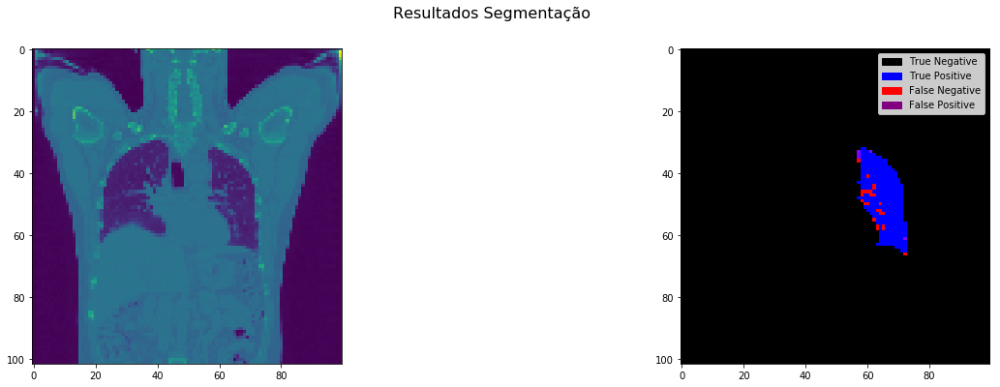

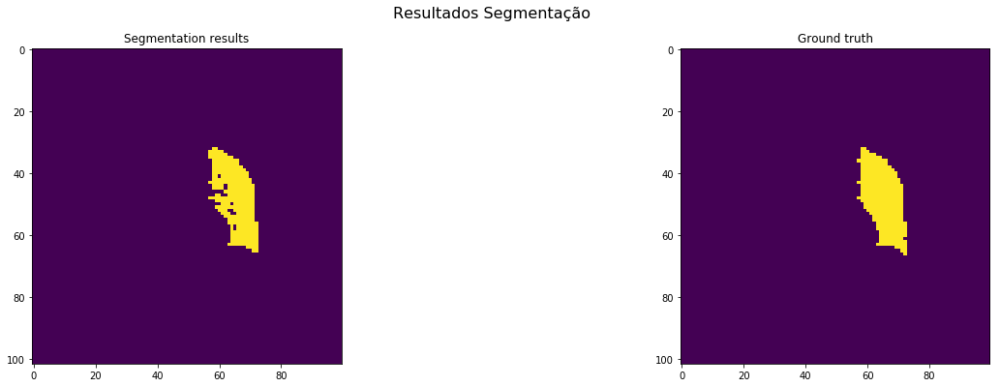

Metrics:
Dice: 0.9367201426024956
Jacquard Index: 0.8809723386420788
True Positive Rate: 0.8957068285927346
Volumetric Similarity: 0.9542112299465241

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 53 in 132
nome pre-result: Centroid3DVolumeSegmented_38564873_right_225.npy
paciente_result: 38564873
region_indice: right
indice_mask: 38564873
shape segmentação: (102, 100, 100)
shape ground truth: (102, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [11399, 1007274, 114, 1213]
Elapsed time: 0.013 seconds.


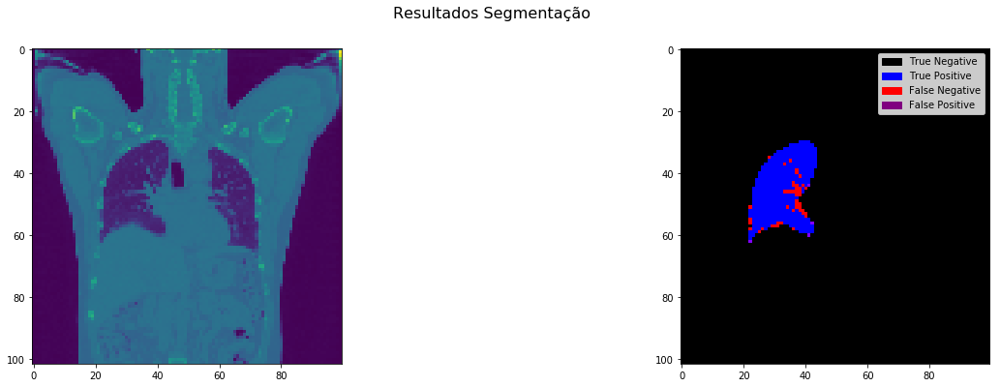

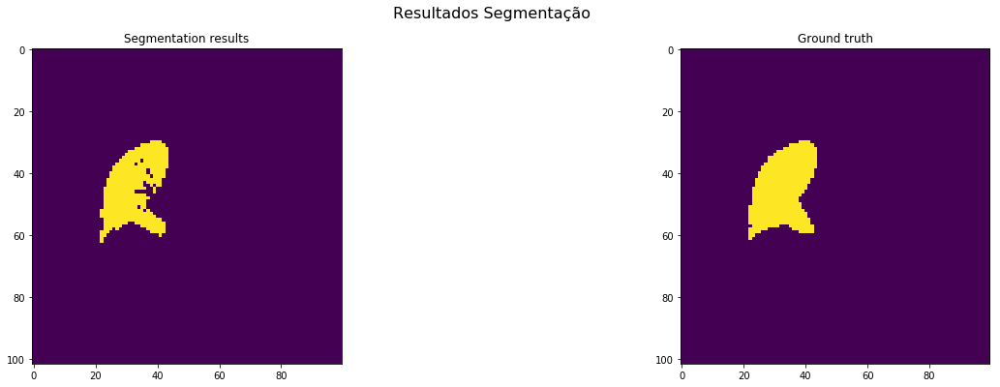

Metrics:
Dice: 0.9449948186528497
Jacquard Index: 0.8957252868143957
True Positive Rate: 0.9038217570567714
Volumetric Similarity: 0.9544455958549223

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 54 in 132
nome pre-result: Centroid3DVolumeSegmented_39002828_left_225.npy
paciente_result: 39002828
region_indice: left
indice_mask: 39002828
shape segmentação: (184, 100, 100)
shape ground truth: (184, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10269, 1827957, 775, 999]
Elapsed time: 0.036 seconds.


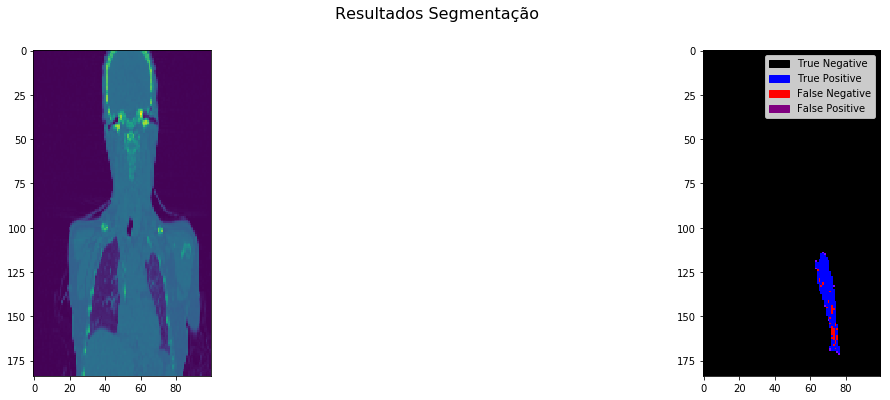

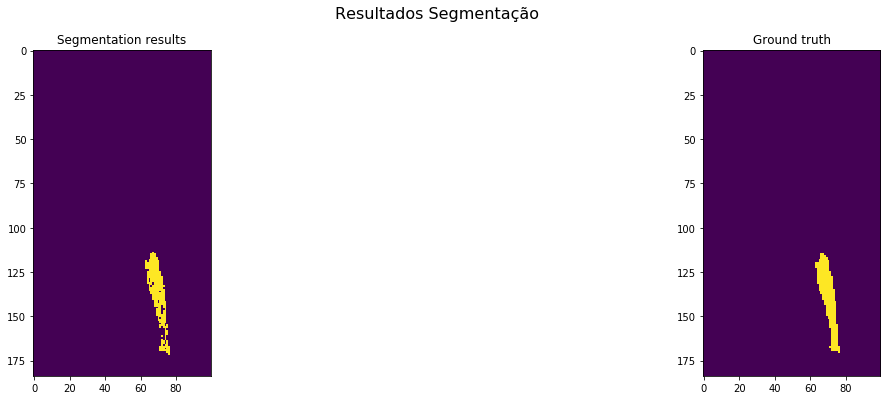

Metrics:
Dice: 0.9204912154894227
Jacquard Index: 0.8526945113343851
True Positive Rate: 0.9113418530351438
Volumetric Similarity: 0.9899605593402653

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 55 in 132
nome pre-result: Centroid3DVolumeSegmented_39002828_right_225.npy
paciente_result: 39002828
region_indice: right
indice_mask: 39002828
shape segmentação: (184, 100, 100)
shape ground truth: (184, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [15539, 1820981, 641, 2839]
Elapsed time: 0.036 seconds.


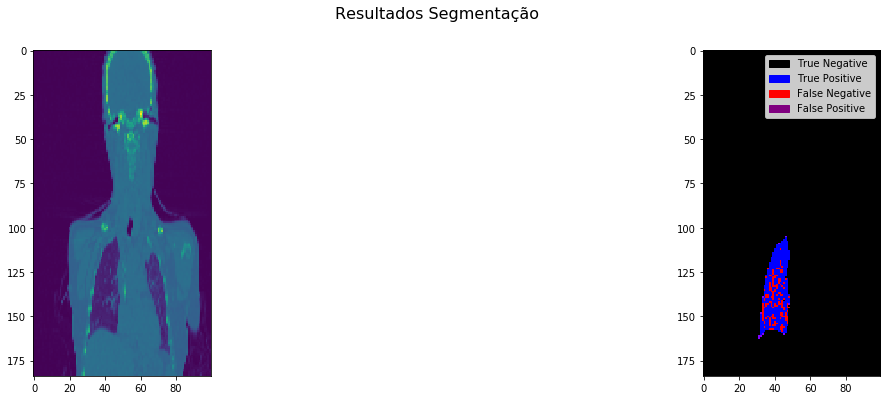

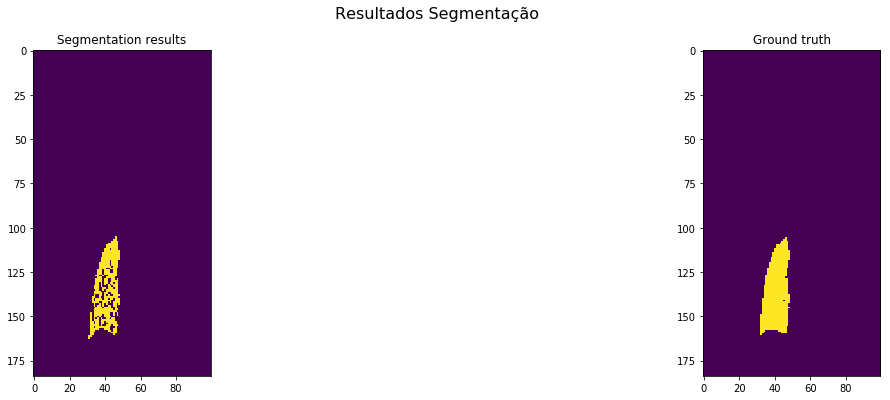

Metrics:
Dice: 0.8992997279935181
Jacquard Index: 0.8170250801829749
True Positive Rate: 0.8455218195668734
Volumetric Similarity: 0.9363967822211934

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 56 in 132
nome pre-result: Centroid3DVolumeSegmented_39137852_left_225.npy
paciente_result: 39137852
region_indice: left
indice_mask: 39137852
shape segmentação: (84, 100, 100)
shape ground truth: (84, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7396, 831944, 80, 580]
Elapsed time: 0.010 seconds.


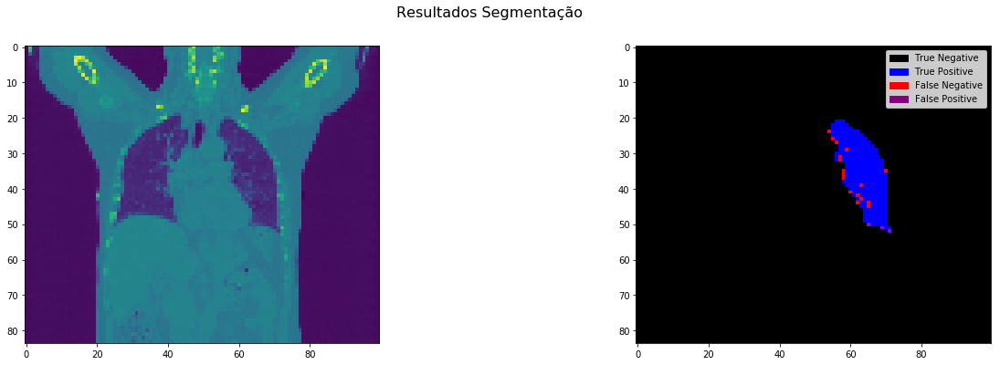

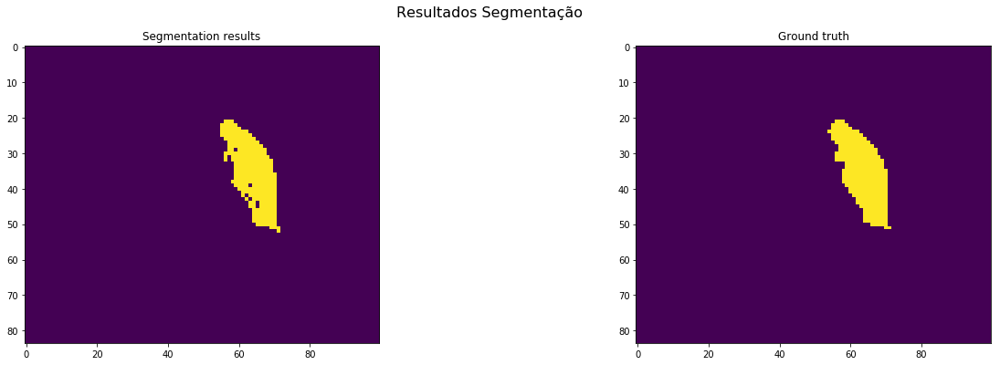

Metrics:
Dice: 0.957287082578307
Jacquard Index: 0.9180734856007945
True Positive Rate: 0.9272818455366099
Volumetric Similarity: 0.9676417292259901

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 57 in 132
nome pre-result: Centroid3DVolumeSegmented_39137852_right_225.npy
paciente_result: 39137852
region_indice: right
indice_mask: 39137852
shape segmentação: (84, 100, 100)
shape ground truth: (84, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8763, 830468, 133, 636]
Elapsed time: 0.018 seconds.


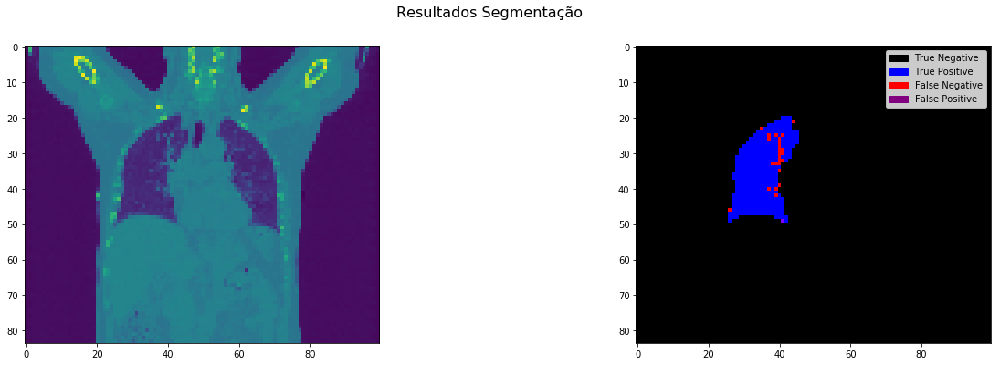

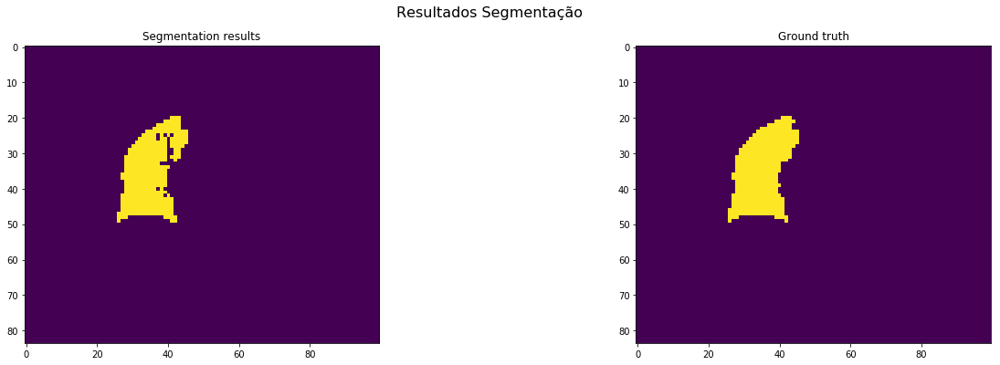

Metrics:
Dice: 0.9579666575567095
Jacquard Index: 0.9193243810323122
True Positive Rate: 0.9323332269390361
Volumetric Similarity: 0.9725061492210987

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 58 in 132
nome pre-result: Centroid3DVolumeSegmented_39256095_left_225.npy
paciente_result: 39256095
region_indice: left
indice_mask: 39256095
shape segmentação: (170, 100, 100)
shape ground truth: (170, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [20620, 1677673, 110, 1597]
Elapsed time: 0.034 seconds.


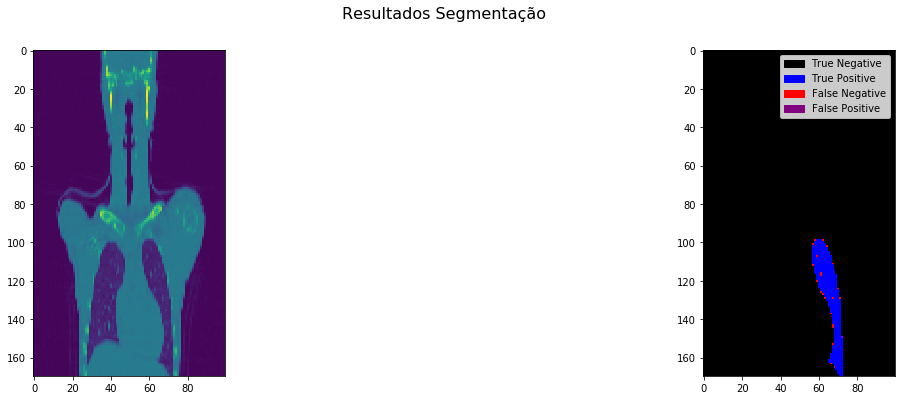

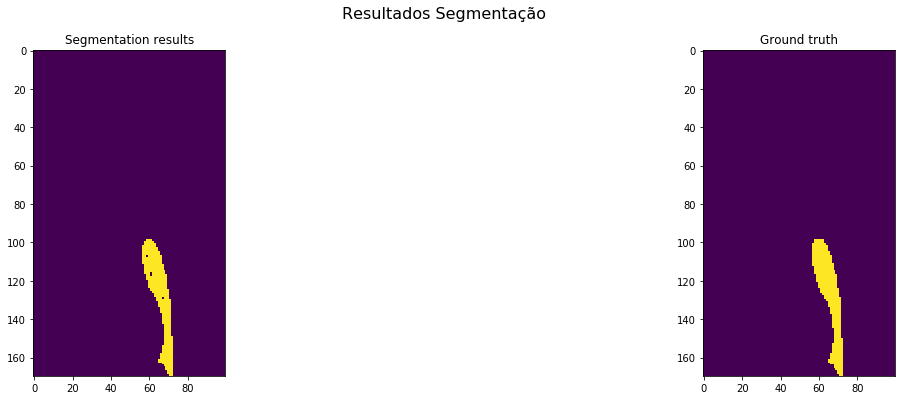

Metrics:
Dice: 0.9602533355065546
Jacquard Index: 0.9235454830474313
True Positive Rate: 0.9281181077553226
Volumetric Similarity: 0.9653759284699747

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 59 in 132
nome pre-result: Centroid3DVolumeSegmented_39256095_right_225.npy
paciente_result: 39256095
region_indice: right
indice_mask: 39256095
shape segmentação: (170, 100, 100)
shape ground truth: (170, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [24429, 1673602, 211, 1758]
Elapsed time: 0.044 seconds.


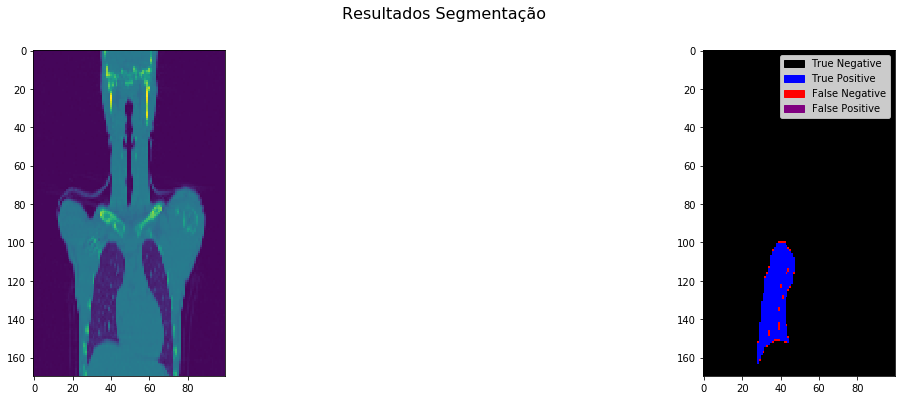

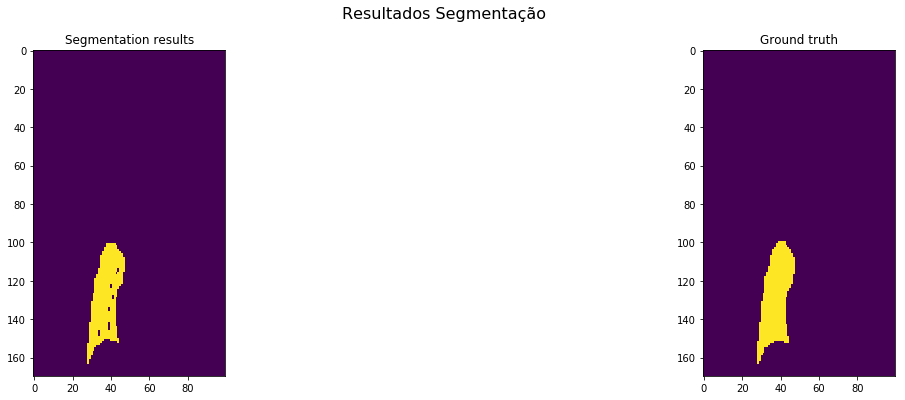

Metrics:
Dice: 0.9612607472406398
Jacquard Index: 0.9254110159860596
True Positive Rate: 0.9328674533165311
Volumetric Similarity: 0.9695634210163889

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 60 in 132
nome pre-result: Centroid3DVolumeSegmented_39524591_left_225.npy
paciente_result: 39524591
region_indice: left
indice_mask: 39524591
shape segmentação: (144, 100, 100)
shape ground truth: (144, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [3143, 1436470, 273, 114]
Elapsed time: 0.035 seconds.


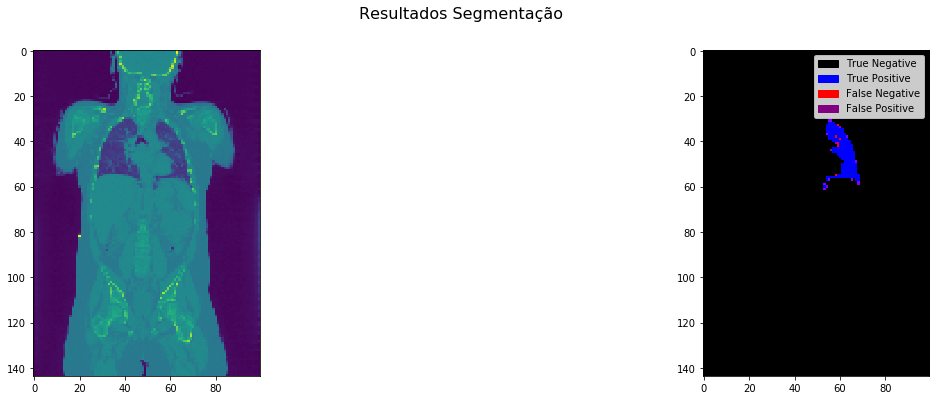

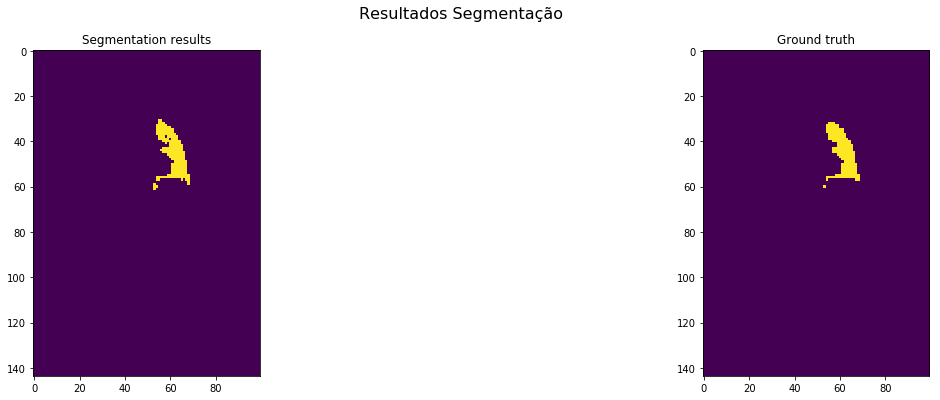

Metrics:
Dice: 0.9420050951595984
Jacquard Index: 0.8903682719546743
True Positive Rate: 0.9649984648449493
Volumetric Similarity: 0.976172635995804

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 61 in 132
nome pre-result: Centroid3DVolumeSegmented_39524591_right_225.npy
paciente_result: 39524591
region_indice: right
indice_mask: 39524591
shape segmentação: (144, 100, 100)
shape ground truth: (144, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [4419, 1435199, 148, 234]
Elapsed time: 0.085 seconds.


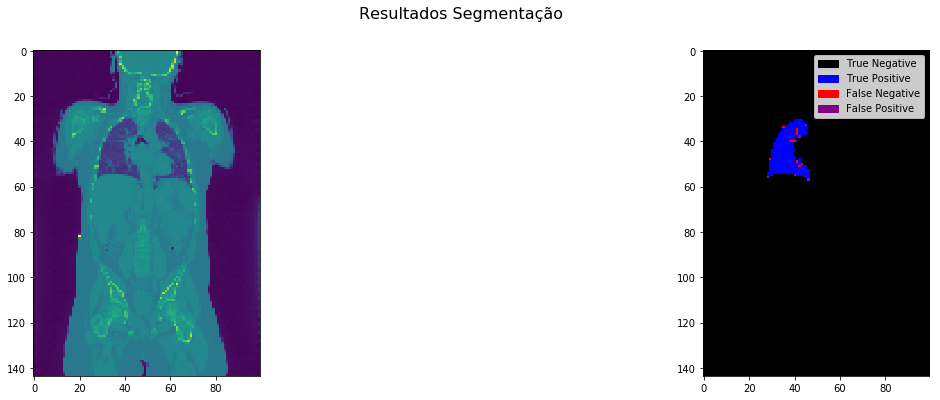

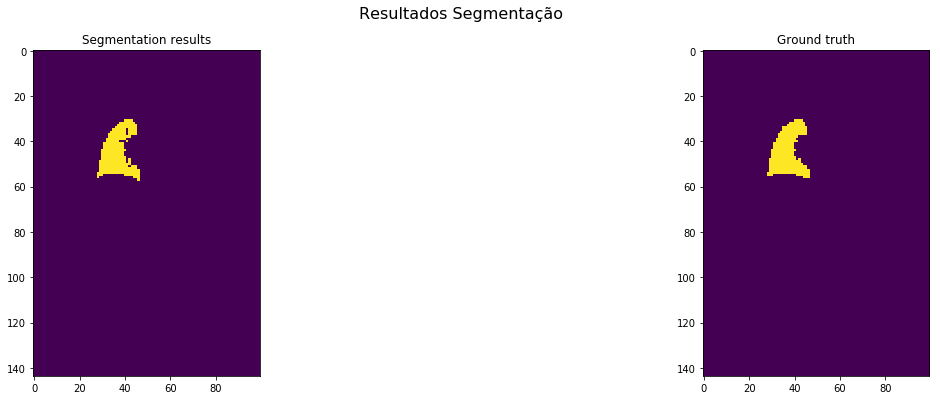

Metrics:
Dice: 0.9585683297180043
Jacquard Index: 0.9204332430743595
True Positive Rate: 0.9497098646034816
Volumetric Similarity: 0.9906724511930586

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 62 in 132
nome pre-result: Centroid3DVolumeSegmented_39819471_left_225.npy
paciente_result: 39819471
region_indice: left
indice_mask: 39819471
shape segmentação: (80, 109, 109)
shape ground truth: (80, 109, 109)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10184, 939495, 89, 712]
Elapsed time: 0.019 seconds.


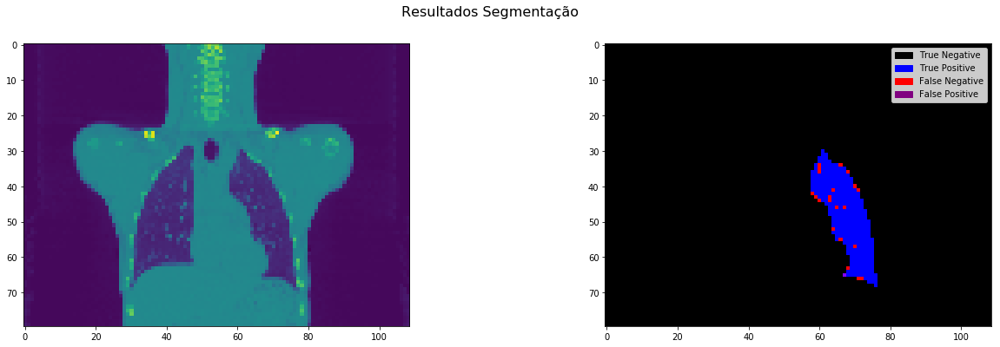

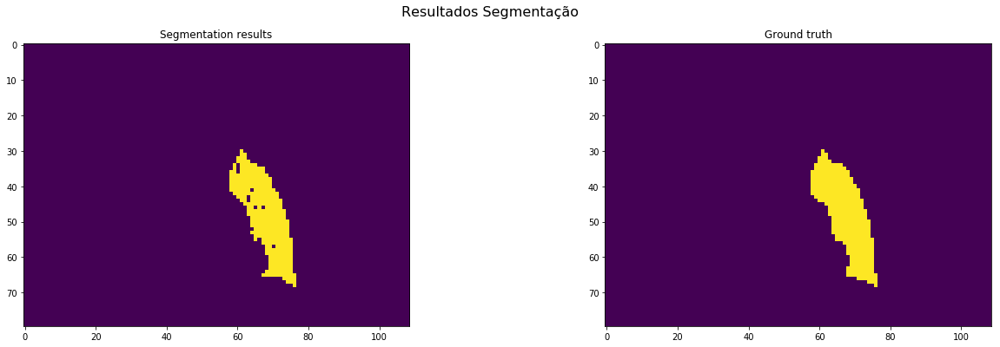

Metrics:
Dice: 0.9621616514714914
Jacquard Index: 0.9270823850705507
True Positive Rate: 0.9346549192364171
Volumetric Similarity: 0.9705701733667155

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 63 in 132
nome pre-result: Centroid3DVolumeSegmented_39819471_right_225.npy
paciente_result: 39819471
region_indice: right
indice_mask: 39819471
shape segmentação: (80, 109, 109)
shape ground truth: (80, 109, 109)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [2, 898216, 39754, 12508]
Elapsed time: 0.028 seconds.


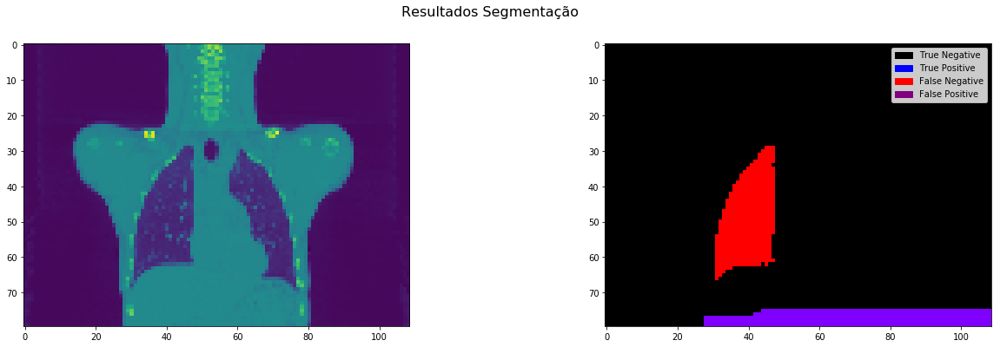

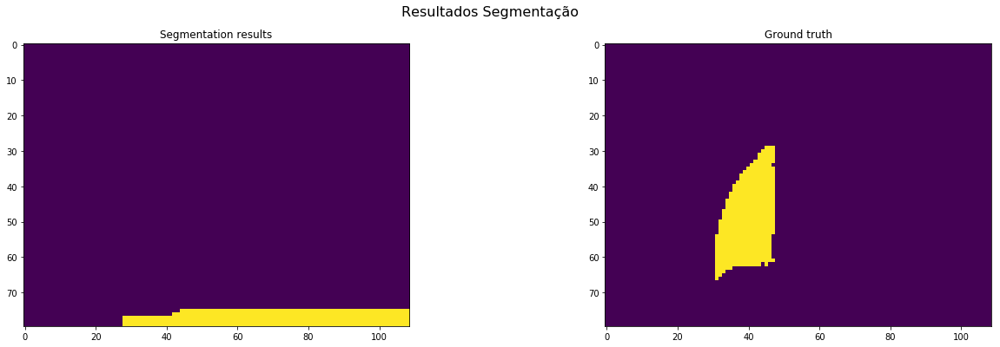

Metrics:
Dice: 7.653158841311751e-05
Jacquard Index: 3.8267258533598655e-05
True Positive Rate: 0.0001598721023181455
Volumetric Similarity: 0.47870508552405

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 64 in 132
nome pre-result: Centroid3DVolumeSegmented_39844012_left_225.npy
paciente_result: 39844012
region_indice: left
indice_mask: 39844012
shape segmentação: (79, 100, 100)
shape ground truth: (79, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [11, 779490, 3, 10496]
Elapsed time: 0.018 seconds.


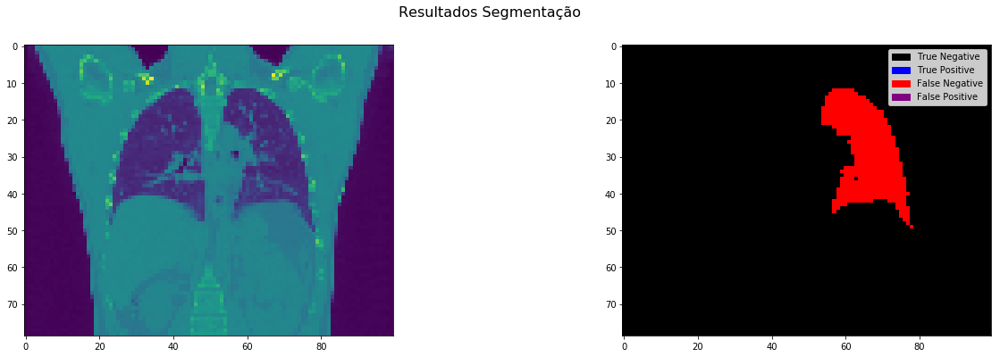

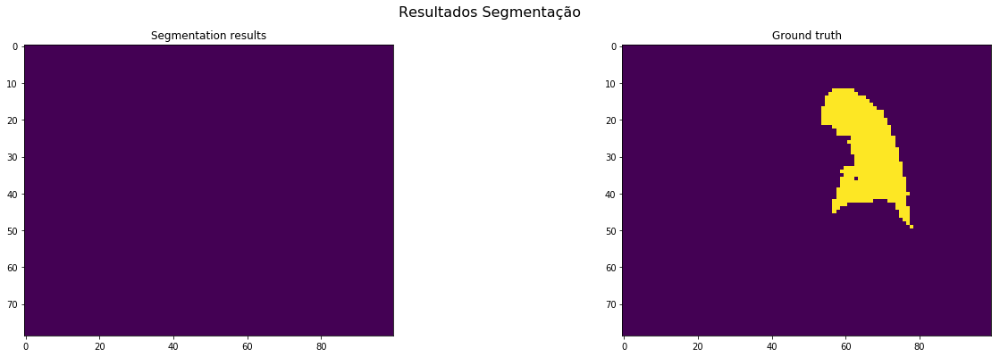

Metrics:
Dice: 0.002091055983271552
Jacquard Index: 0.0010466222645099904
True Positive Rate: 0.0010469211002189017
Volumetric Similarity: 0.0026613439787092075

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 65 in 132
nome pre-result: Centroid3DVolumeSegmented_39844012_right_225.npy
paciente_result: 39844012
region_indice: right
indice_mask: 39844012
shape segmentação: (79, 100, 100)
shape ground truth: (79, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [11179, 778062, 142, 617]
Elapsed time: 0.012 seconds.


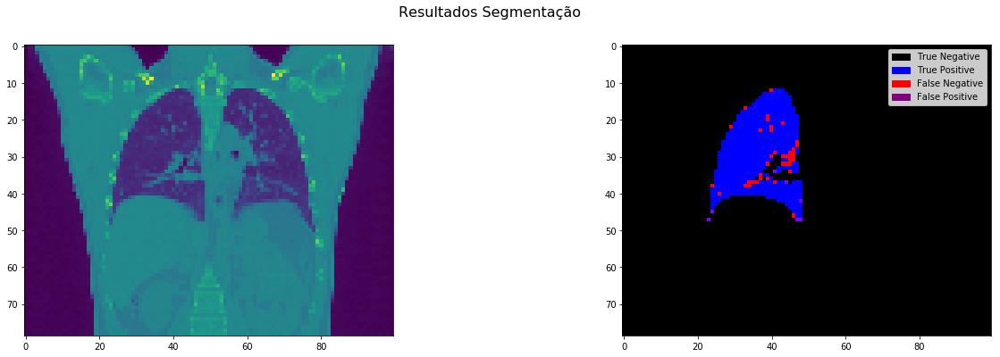

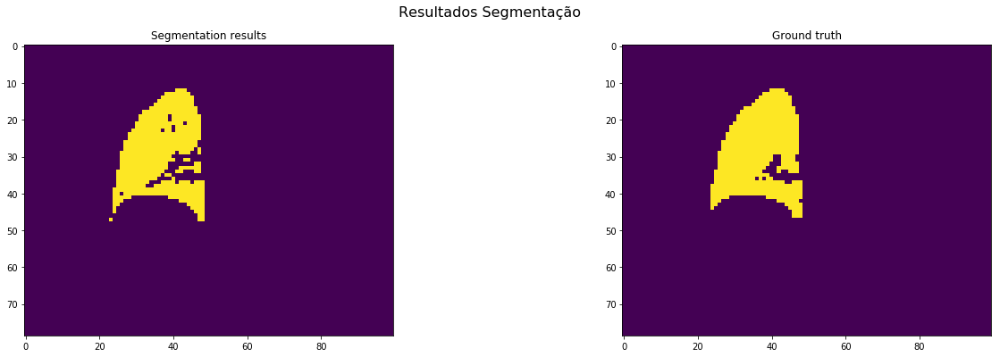

Metrics:
Dice: 0.967167019942034
Jacquard Index: 0.9364215111408947
True Positive Rate: 0.9476941336046117
Volumetric Similarity: 0.9794523510836182

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 66 in 132
nome pre-result: Centroid3DVolumeSegmented_39859629_left_225.npy
paciente_result: 39859629
region_indice: left
indice_mask: 39859629
shape segmentação: (106, 100, 100)
shape ground truth: (106, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5926, 1053341, 286, 447]
Elapsed time: 0.036 seconds.


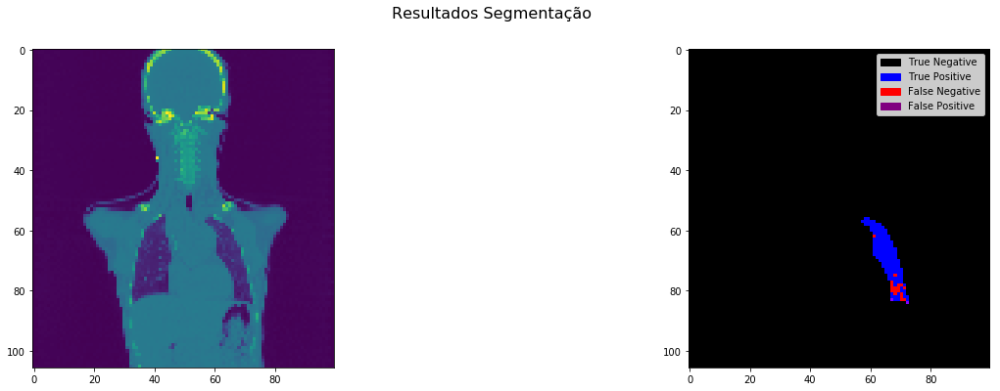

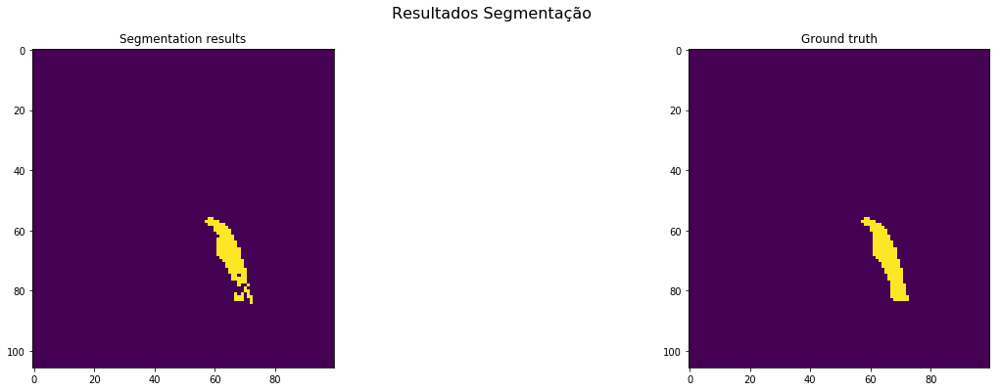

Metrics:
Dice: 0.9417560588001589
Jacquard Index: 0.8899234119237123
True Positive Rate: 0.9298603483445786
Volumetric Similarity: 0.9872069924513309

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 67 in 132
nome pre-result: Centroid3DVolumeSegmented_39859629_right_225.npy
paciente_result: 39859629
region_indice: right
indice_mask: 39859629
shape segmentação: (106, 100, 100)
shape ground truth: (106, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7803, 1051588, 111, 498]
Elapsed time: 0.021 seconds.


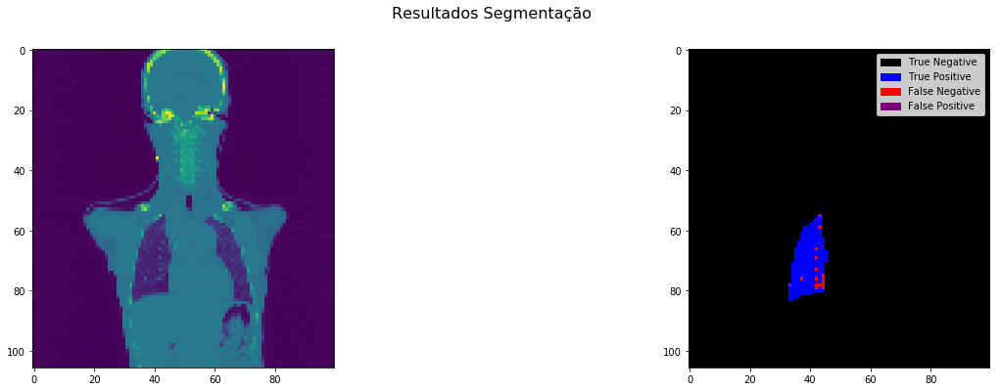

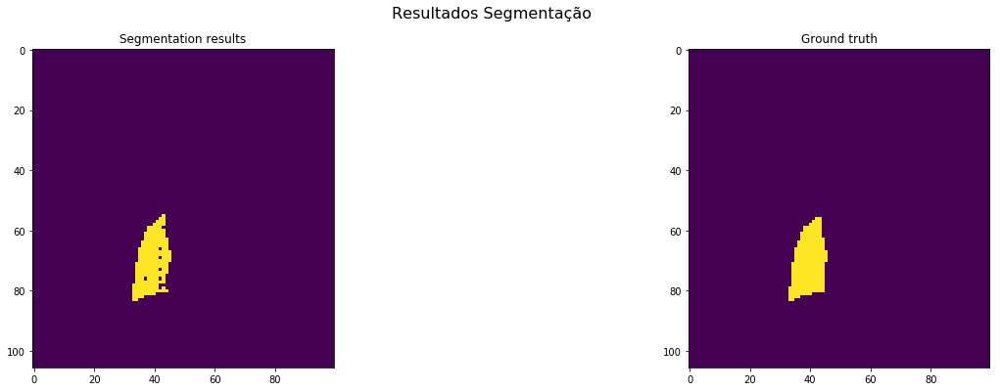

Metrics:
Dice: 0.9624421831637373
Jacquard Index: 0.9276034236804565
True Positive Rate: 0.9400072280448138
Volumetric Similarity: 0.9761332099907493

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 68 in 132
nome pre-result: Centroid3DVolumeSegmented_39929954_left_225.npy
paciente_result: 39929954
region_indice: left
indice_mask: 39929954
shape segmentação: (116, 100, 100)
shape ground truth: (116, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9663, 1149551, 111, 675]
Elapsed time: 0.034 seconds.


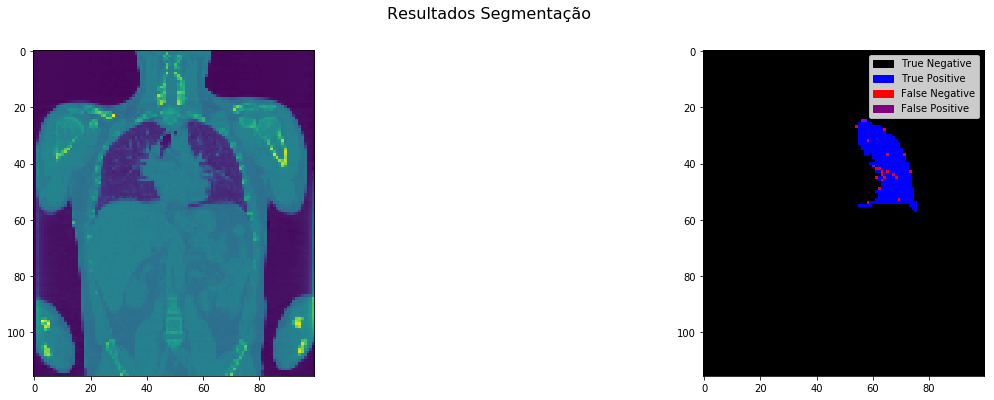

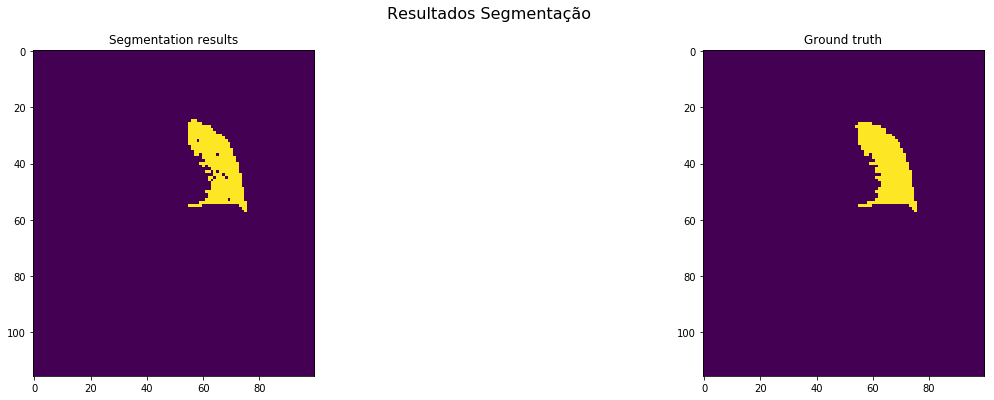

Metrics:
Dice: 0.9609188544152745
Jacquard Index: 0.9247774906689635
True Positive Rate: 0.9347069065583284
Volumetric Similarity: 0.9719570405727924

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 69 in 132
nome pre-result: Centroid3DVolumeSegmented_39929954_right_225.npy
paciente_result: 39929954
region_indice: right
indice_mask: 39929954
shape segmentação: (116, 100, 100)
shape ground truth: (116, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12679, 1146423, 110, 788]
Elapsed time: 0.031 seconds.


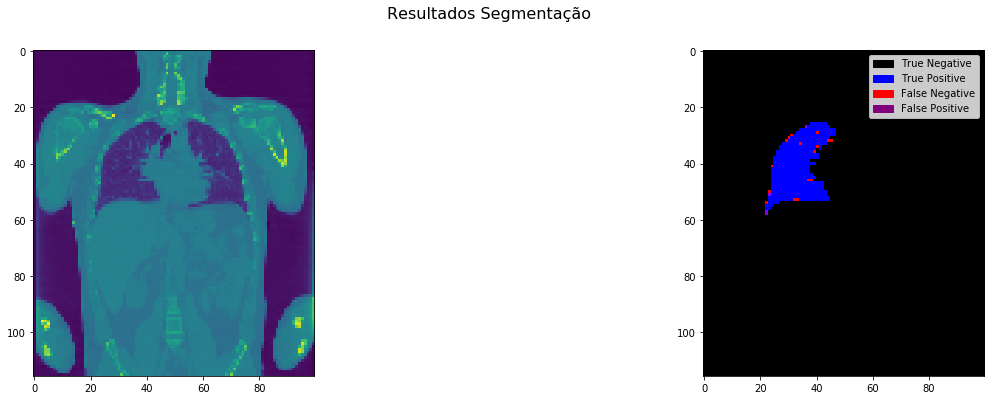

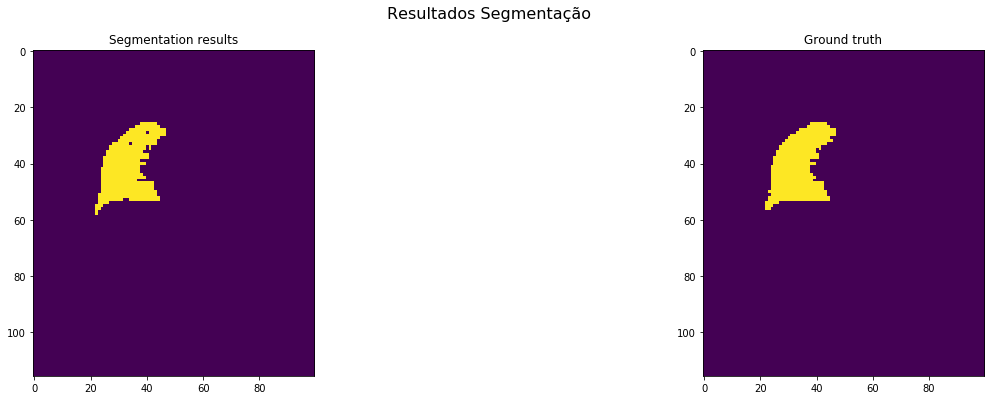

Metrics:
Dice: 0.9657982937233395
Jacquard Index: 0.933858731678574
True Positive Rate: 0.9414865968664142
Volumetric Similarity: 0.9741773308957953

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 70 in 132
nome pre-result: Centroid3DVolumeSegmented_39980297_left_225.npy
paciente_result: 39980297
region_indice: left
indice_mask: 39980297
shape segmentação: (90, 130, 130)
shape ground truth: (90, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9497, 1510764, 152, 587]
Elapsed time: 0.029 seconds.


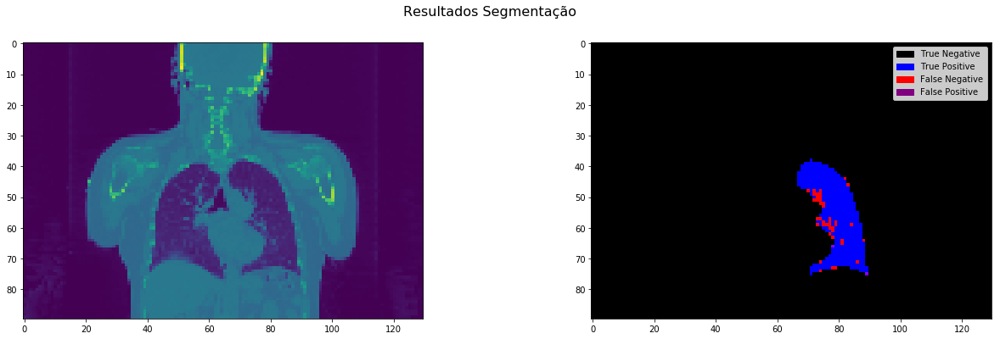

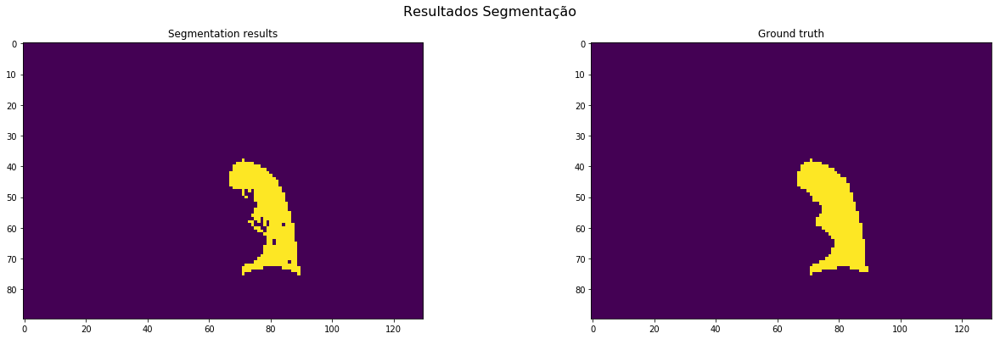

Metrics:
Dice: 0.962550043075052
Jacquard Index: 0.9278038296209457
True Positive Rate: 0.9417889726299088
Volumetric Similarity: 0.9779557087112958

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 71 in 132
nome pre-result: Centroid3DVolumeSegmented_39980297_right_225.npy
paciente_result: 39980297
region_indice: right
indice_mask: 39980297
shape segmentação: (90, 130, 130)
shape ground truth: (90, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [11906, 1508217, 117, 760]
Elapsed time: 0.029 seconds.


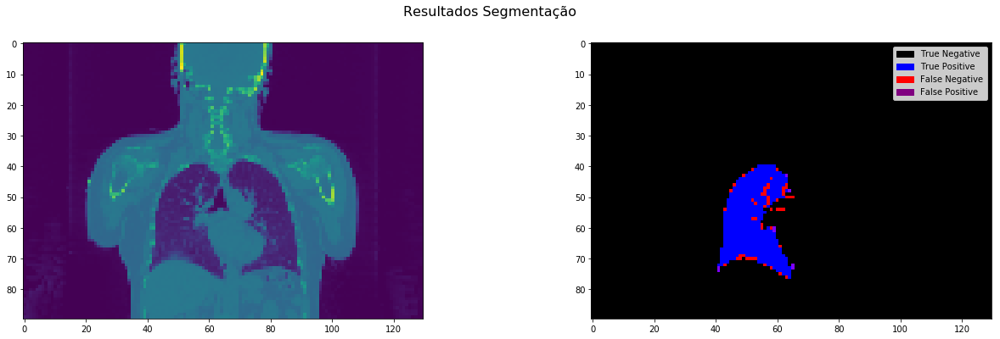

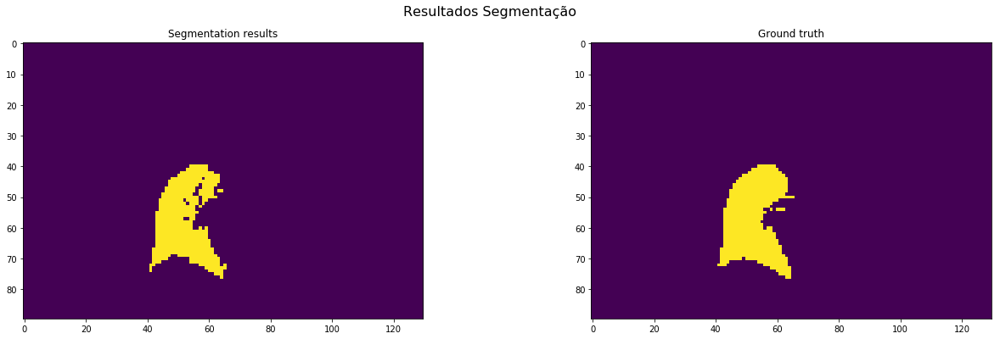

Metrics:
Dice: 0.9644781076592814
Jacquard Index: 0.9313932566690135
True Positive Rate: 0.9399968419390494
Volumetric Similarity: 0.9739560127992223

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 72 in 132
nome pre-result: Centroid3DVolumeSegmented_40165373_left_225.npy
paciente_result: 40165373
region_indice: left
indice_mask: 40165373
shape segmentação: (96, 130, 130)
shape ground truth: (96, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [1, 1614511, 0, 7888]
Elapsed time: 0.030 seconds.


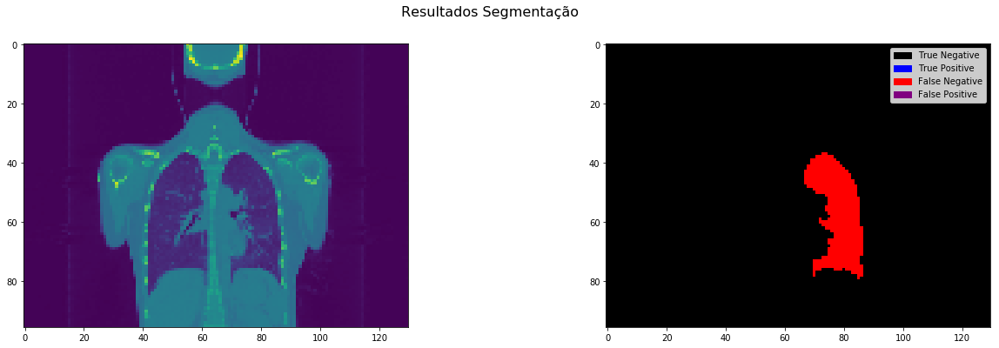

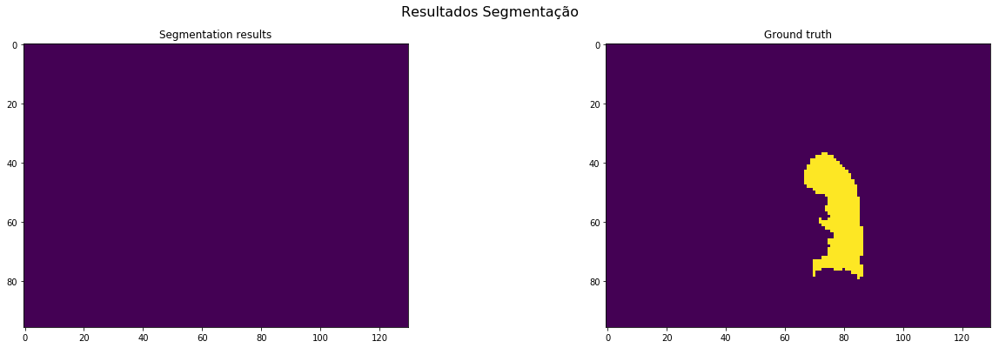

Metrics:
Dice: 0.00025348542458808617
Jacquard Index: 0.00012675877804537965
True Positive Rate: 0.00012675877804537965
Volumetric Similarity: 0.00025348542458814016

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 73 in 132
nome pre-result: Centroid3DVolumeSegmented_40165373_right_225.npy
paciente_result: 40165373
region_indice: right
indice_mask: 40165373
shape segmentação: (96, 130, 130)
shape ground truth: (96, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10417, 1611238, 103, 642]
Elapsed time: 0.040 seconds.


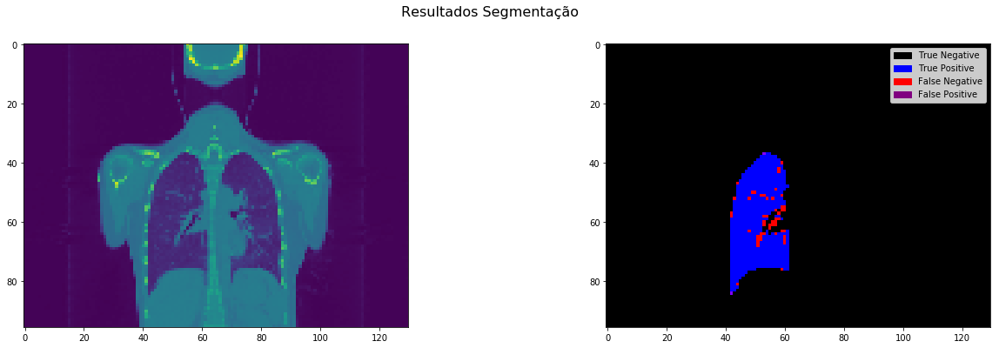

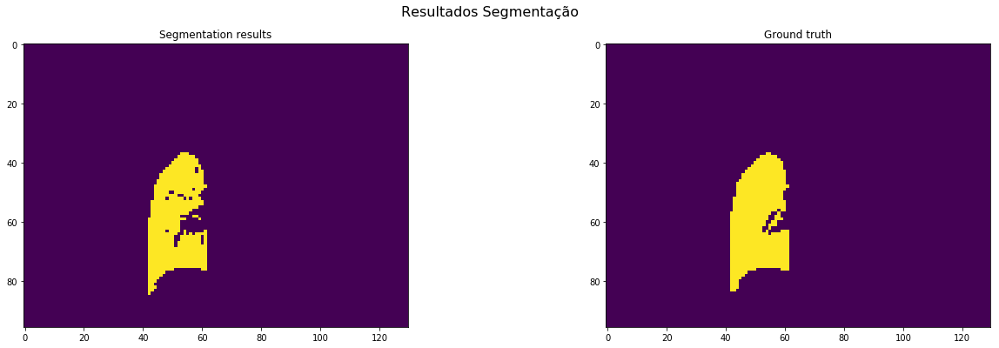

Metrics:
Dice: 0.9654756939617221
Jacquard Index: 0.9332556889446336
True Positive Rate: 0.9419477348765711
Volumetric Similarity: 0.9750220121414338

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 74 in 132
nome pre-result: Centroid3DVolumeSegmented_40283713_left_225.npy
paciente_result: 40283713
region_indice: left
indice_mask: 40283713
shape segmentação: (109, 130, 130)
shape ground truth: (109, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9504, 1831991, 151, 454]
Elapsed time: 0.083 seconds.


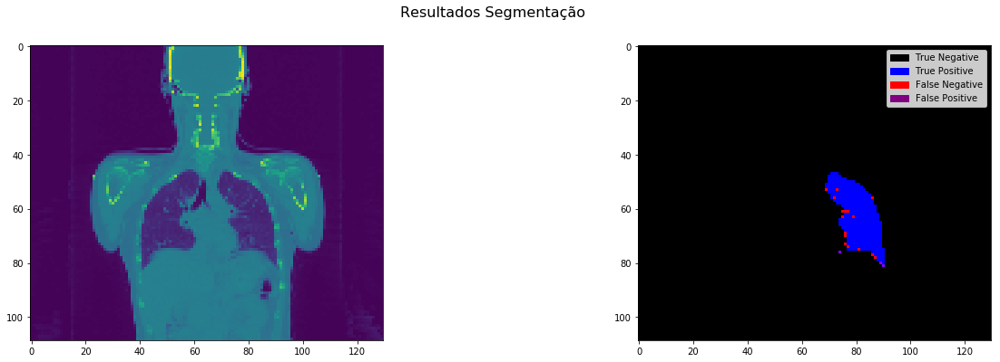

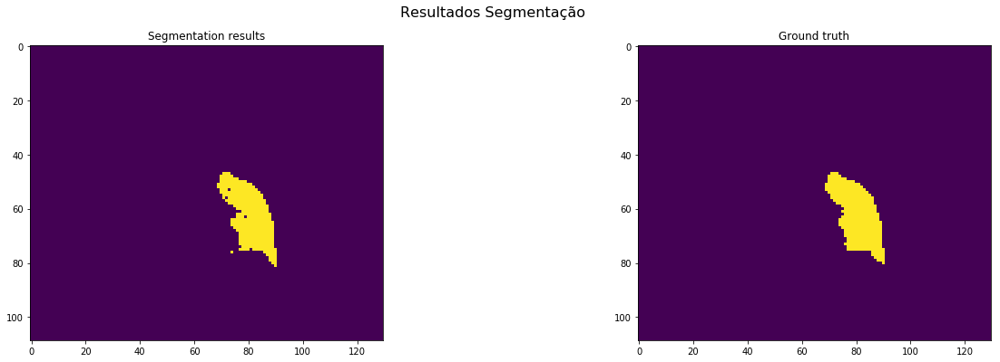

Metrics:
Dice: 0.9691531127313516
Jacquard Index: 0.940152339499456
True Positive Rate: 0.9544085157662181
Volumetric Similarity: 0.9845510630704125

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 75 in 132
nome pre-result: Centroid3DVolumeSegmented_40283713_right_225.npy
paciente_result: 40283713
region_indice: right
indice_mask: 40283713
shape segmentação: (109, 130, 130)
shape ground truth: (109, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [11050, 1830340, 196, 514]
Elapsed time: 0.042 seconds.


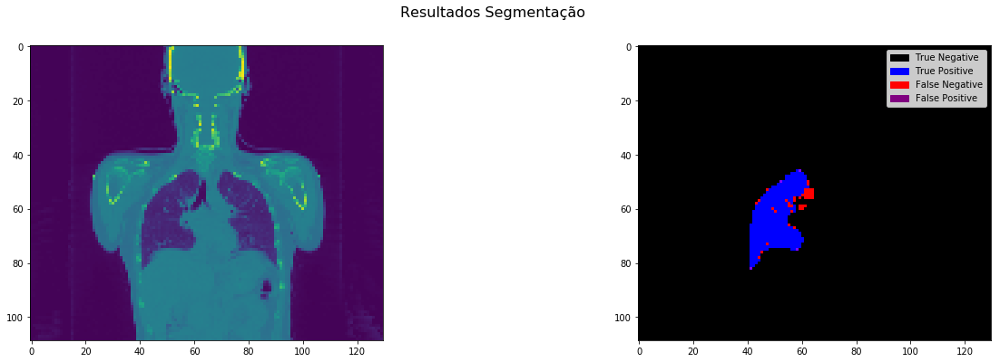

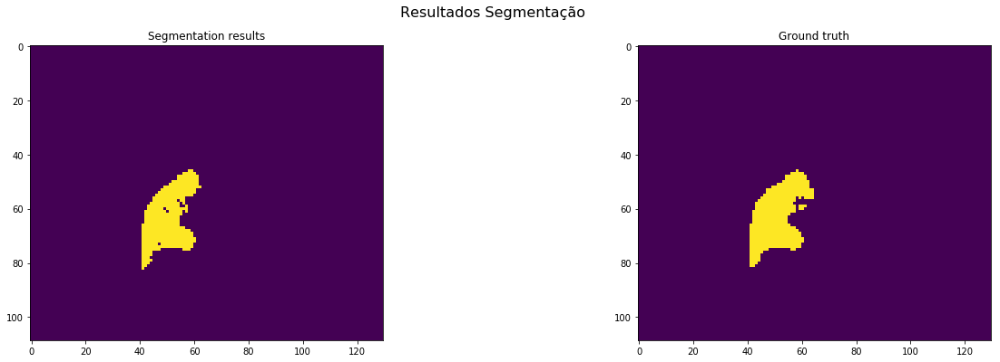

Metrics:
Dice: 0.9688733011836914
Jacquard Index: 0.939625850340136
True Positive Rate: 0.9555517122103079
Volumetric Similarity: 0.9860587461639632

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 76 in 132
nome pre-result: Centroid3DVolumeSegmented_40433190_right_225.npy
paciente_result: 40433190
region_indice: right
indice_mask: 40433190
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5400, 871768, 686, 2146]
Elapsed time: 0.016 seconds.


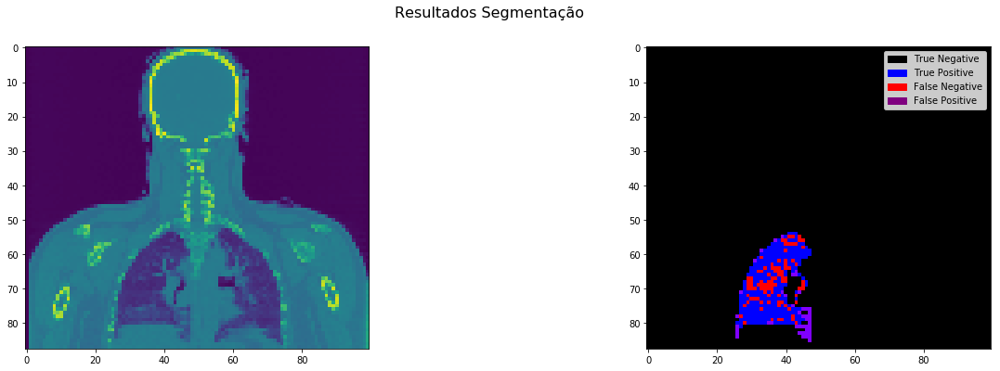

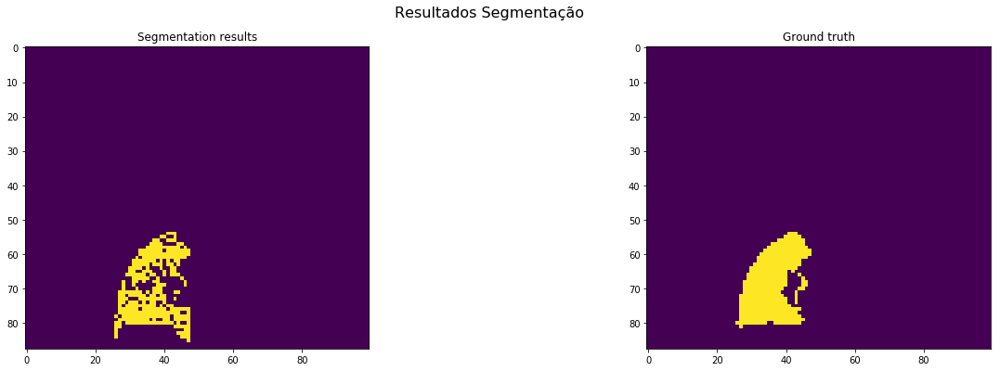

Metrics:
Dice: 0.7922535211267606
Jacquard Index: 0.6559766763848397
True Positive Rate: 0.7156109196925523
Volumetric Similarity: 0.8928990610328639

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 77 in 132
nome pre-result: Centroid3DVolumeSegmented_40470341_left_225.npy
paciente_result: 40470341
region_indice: left
indice_mask: 40470341
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6112, 912481, 488, 919]
Elapsed time: 0.012 seconds.


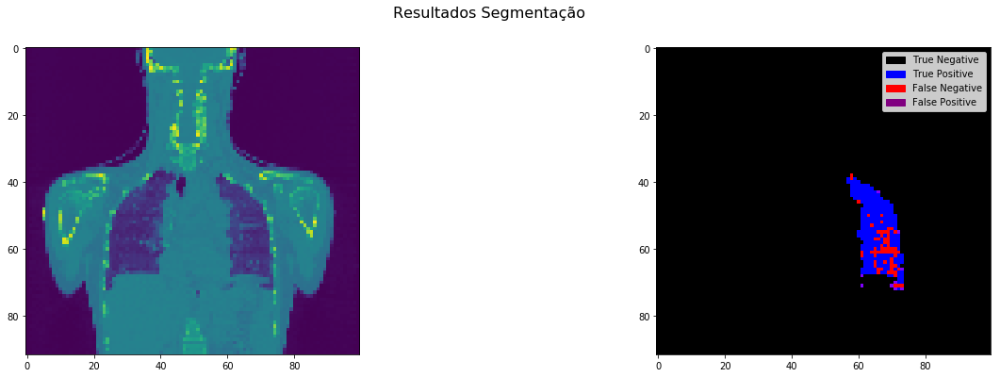

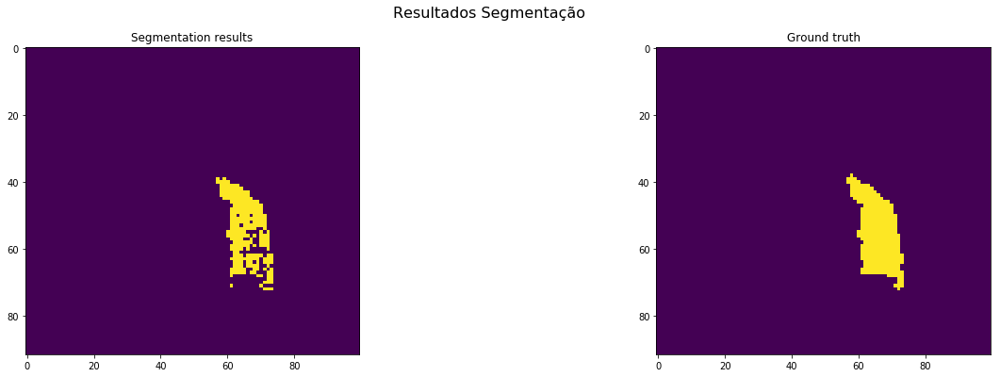

Metrics:
Dice: 0.8967793998972929
Jacquard Index: 0.8128740524005852
True Positive Rate: 0.8692931304224151
Volumetric Similarity: 0.9683808964859512

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 78 in 132
nome pre-result: Centroid3DVolumeSegmented_40470341_right_225.npy
paciente_result: 40470341
region_indice: right
indice_mask: 40470341
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8000, 910948, 334, 718]
Elapsed time: 0.013 seconds.


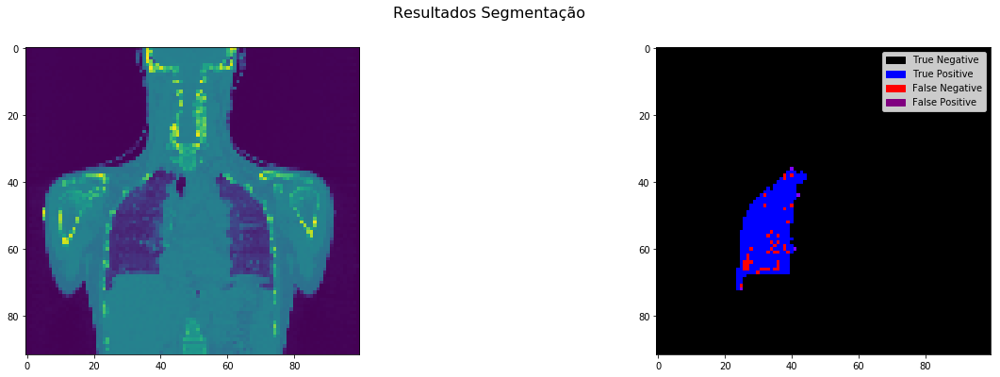

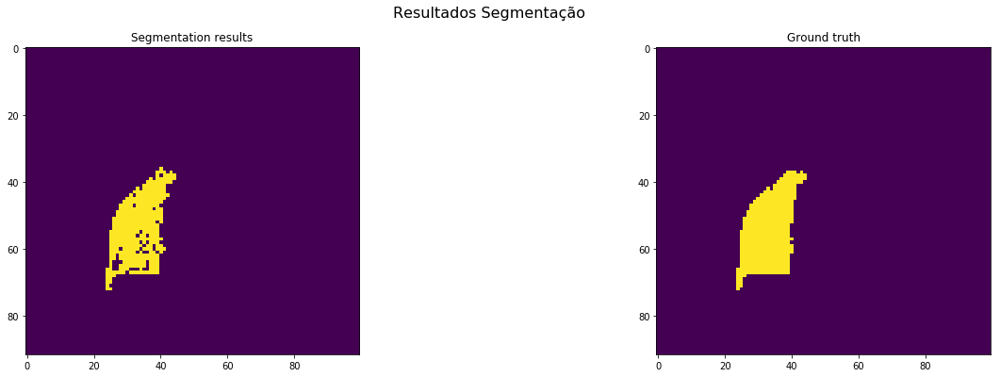

Metrics:
Dice: 0.9383063570255689
Jacquard Index: 0.8837825894829872
True Positive Rate: 0.9176416609314063
Volumetric Similarity: 0.9774806474313863

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 79 in 132
nome pre-result: Centroid3DVolumeSegmented_40584316_left_225.npy
paciente_result: 40584316
region_indice: left
indice_mask: 40584316
shape segmentação: (208, 100, 100)
shape ground truth: (208, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8950, 2070264, 110, 676]
Elapsed time: 0.049 seconds.


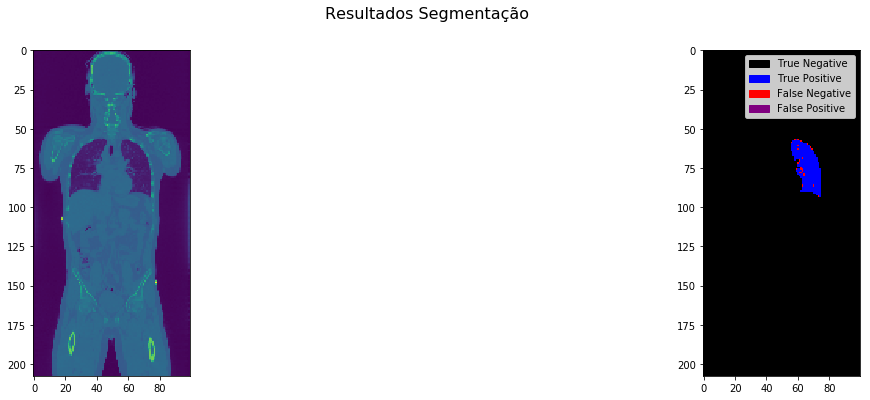

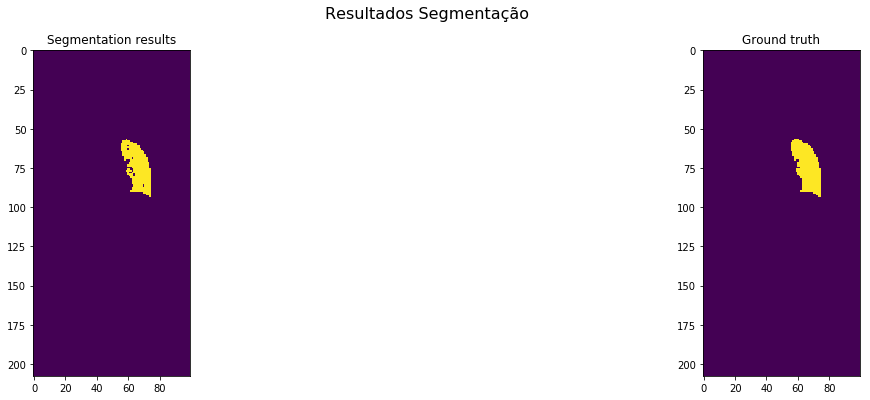

Metrics:
Dice: 0.9579364229904741
Jacquard Index: 0.9192686935086277
True Positive Rate: 0.9297735300228548
Volumetric Similarity: 0.9697099432730386

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 80 in 132
nome pre-result: Centroid3DVolumeSegmented_40584316_right_225.npy
paciente_result: 40584316
region_indice: right
indice_mask: 40584316
shape segmentação: (208, 100, 100)
shape ground truth: (208, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10702, 2068509, 75, 714]
Elapsed time: 0.120 seconds.


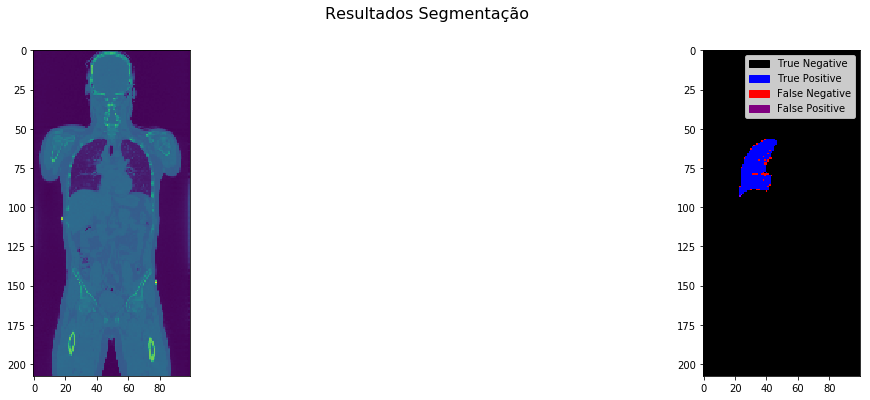

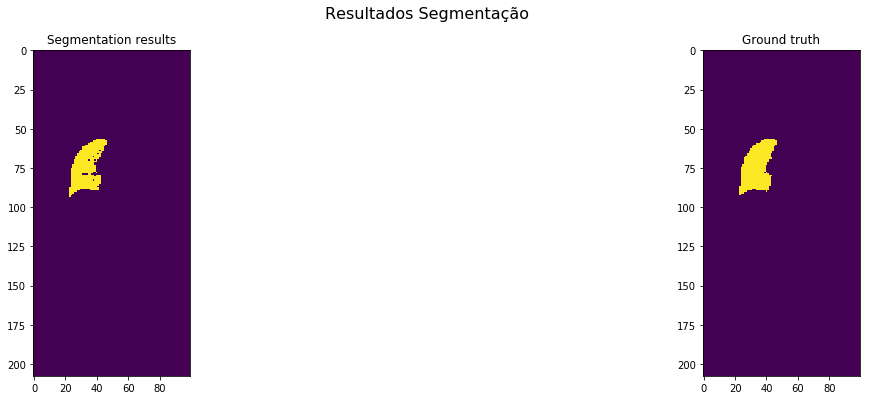

Metrics:
Dice: 0.9644482494480241
Jacquard Index: 0.9313375685318945
True Positive Rate: 0.9374562018220042
Volumetric Similarity: 0.9712071373856621

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 81 in 132
nome pre-result: Centroid3DVolumeSegmented_41265741_left_225.npy
paciente_result: 41265741
region_indice: left
indice_mask: 41265741
shape segmentação: (210, 100, 100)
shape ground truth: (210, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [17424, 2081441, 164, 971]
Elapsed time: 0.042 seconds.


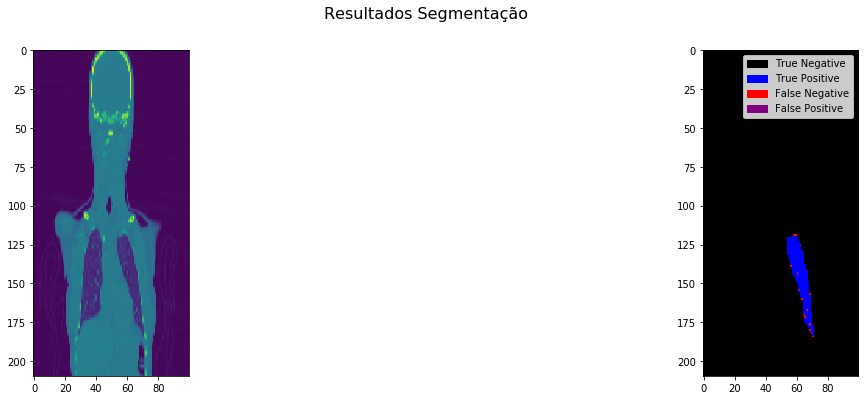

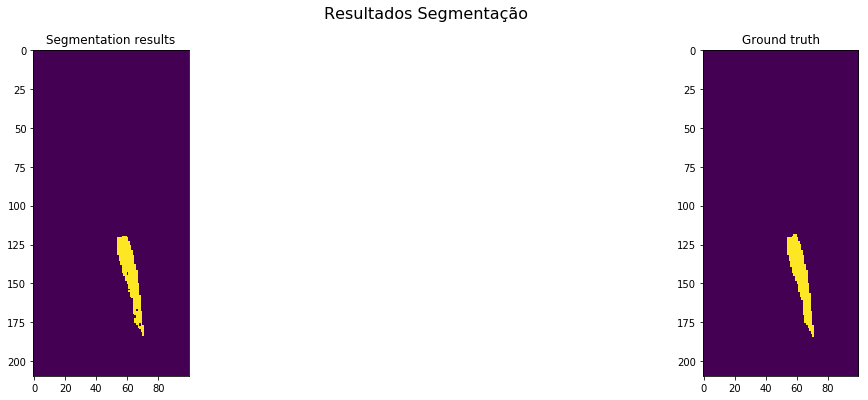

Metrics:
Dice: 0.9684573270711169
Jacquard Index: 0.9388436876986906
True Positive Rate: 0.9472139168252243
Volumetric Similarity: 0.9775727426840453

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 82 in 132
nome pre-result: Centroid3DVolumeSegmented_41265741_right_225.npy
paciente_result: 41265741
region_indice: right
indice_mask: 41265741
shape segmentação: (210, 100, 100)
shape ground truth: (210, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [20708, 2077733, 189, 1370]
Elapsed time: 0.046 seconds.


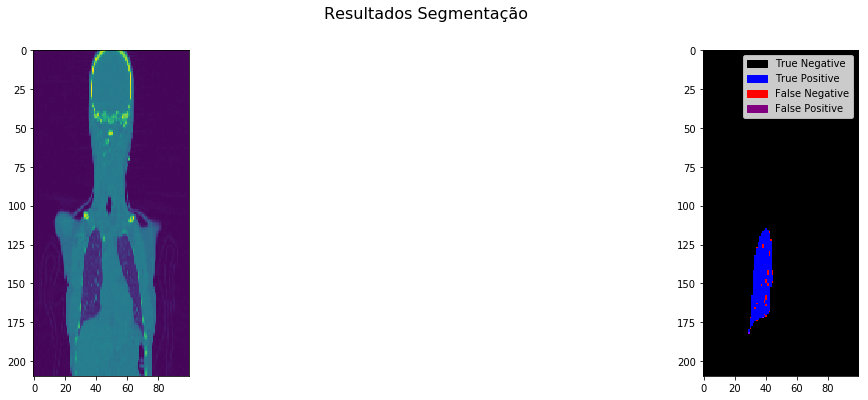

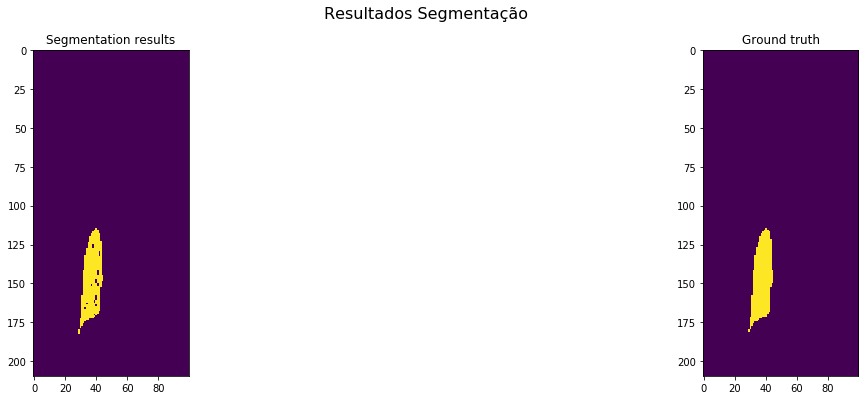

Metrics:
Dice: 0.9637230948225712
Jacquard Index: 0.9299860780527237
True Positive Rate: 0.937947277833137
Volumetric Similarity: 0.9725189063408959

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 83 in 132
nome pre-result: Centroid3DVolumeSegmented_42242822_left_225.npy
paciente_result: 42242822
region_indice: left
indice_mask: 42242822
shape segmentação: (78, 100, 100)
shape ground truth: (78, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [100, 733207, 39656, 7037]
Elapsed time: 0.011 seconds.


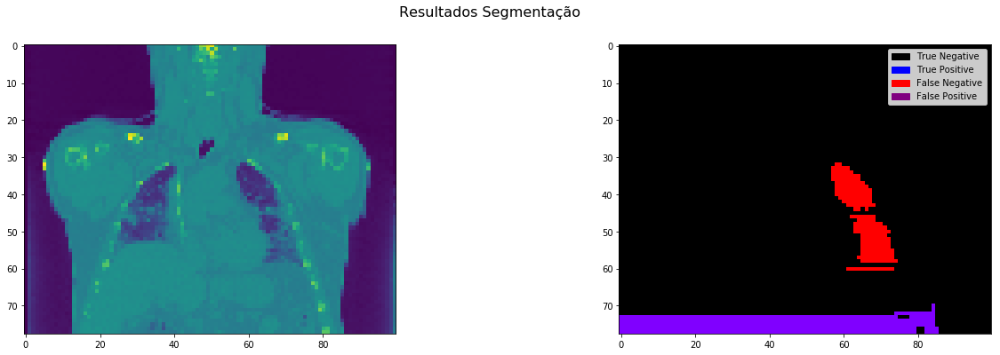

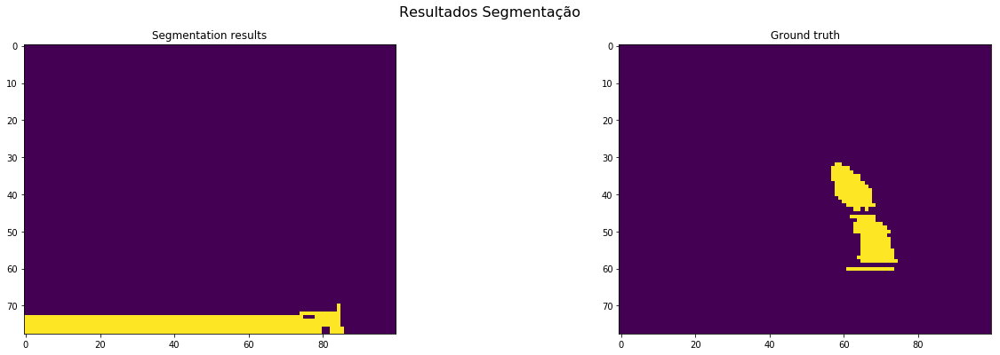

Metrics:
Dice: 0.004265028895570767
Jacquard Index: 0.0021370717842412327
True Positive Rate: 0.014011489421325487
Volumetric Similarity: 0.30439511227688565

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 84 in 132
nome pre-result: Centroid3DVolumeSegmented_42715988_left_225.npy
paciente_result: 42715988
region_indice: left
indice_mask: 42715988
shape segmentação: (144, 100, 100)
shape ground truth: (144, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9880, 1429075, 310, 735]
Elapsed time: 0.030 seconds.


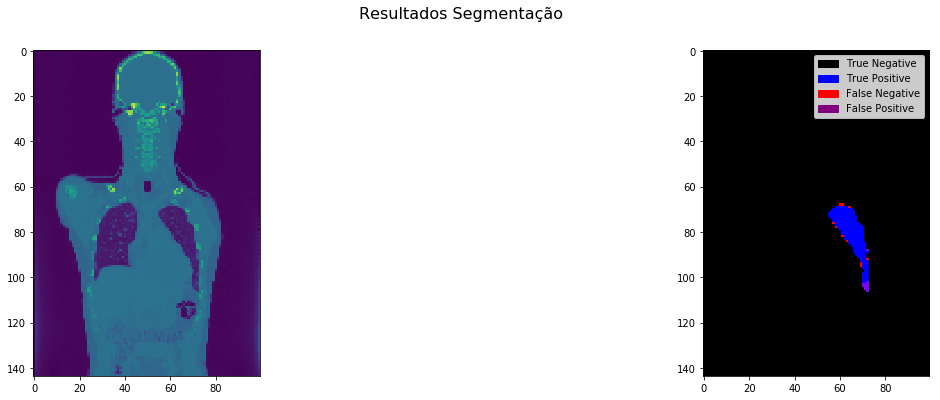

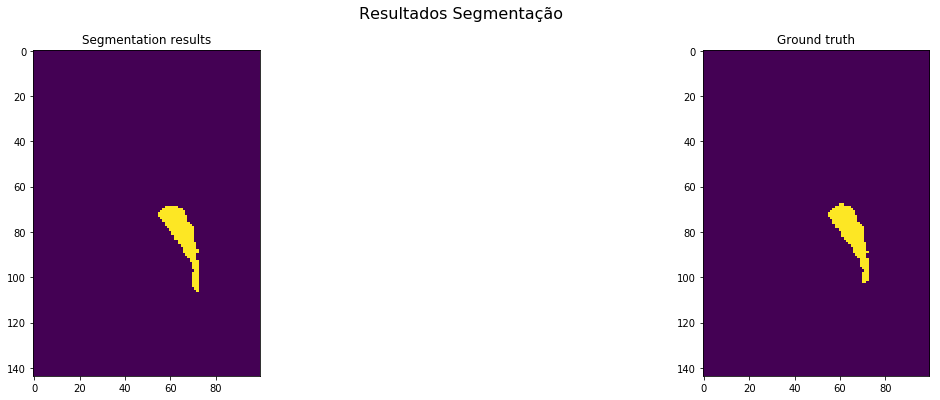

Metrics:
Dice: 0.9497716894977168
Jacquard Index: 0.9043478260869565
True Positive Rate: 0.9307583608101743
Volumetric Similarity: 0.9795722182167748

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 85 in 132
nome pre-result: Centroid3DVolumeSegmented_42715988_right_225.npy
paciente_result: 42715988
region_indice: right
indice_mask: 42715988
shape segmentação: (144, 100, 100)
shape ground truth: (144, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [13698, 1425079, 261, 962]
Elapsed time: 0.039 seconds.


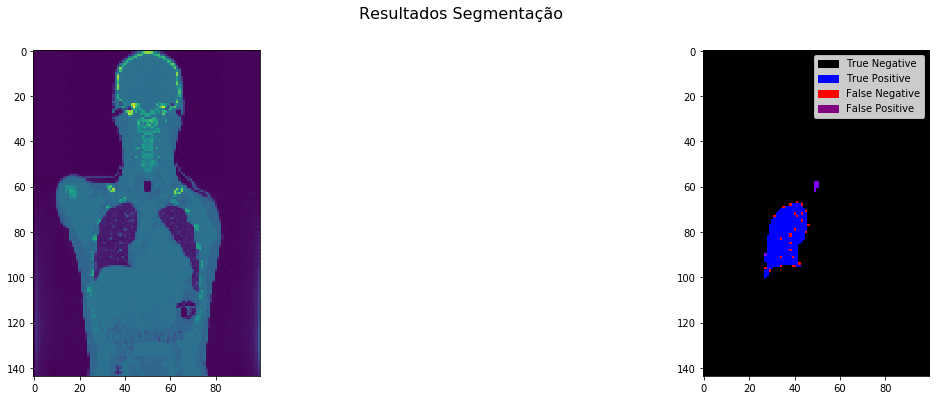

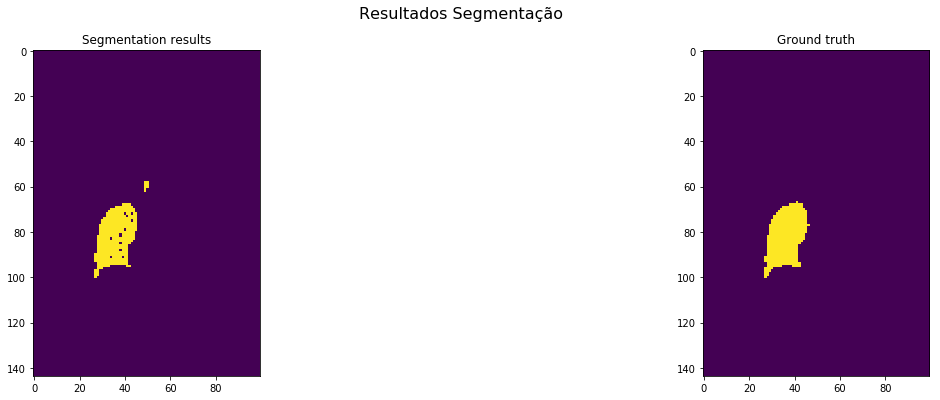

Metrics:
Dice: 0.9572661518571578
Jacquard Index: 0.9180349842503853
True Positive Rate: 0.9343792633015007
Volumetric Similarity: 0.9755057828715189

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 86 in 132
nome pre-result: Centroid3DVolumeSegmented_43109032_left_225.npy
paciente_result: 43109032
region_indice: left
indice_mask: 43109032
shape segmentação: (78, 100, 100)
shape ground truth: (78, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5642, 773809, 53, 496]
Elapsed time: 0.010 seconds.


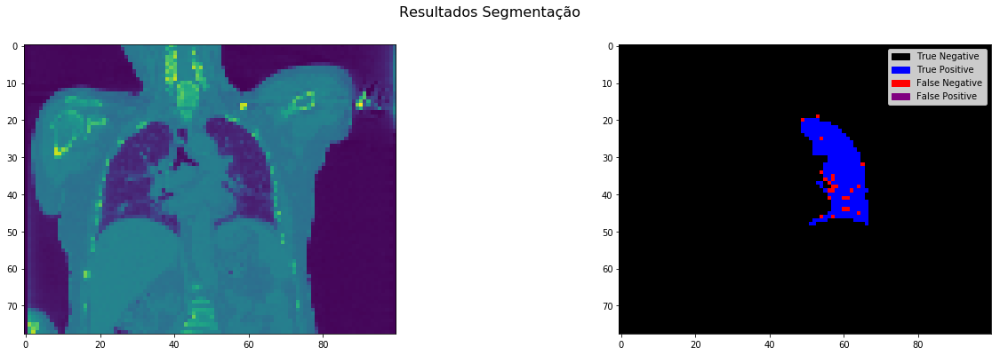

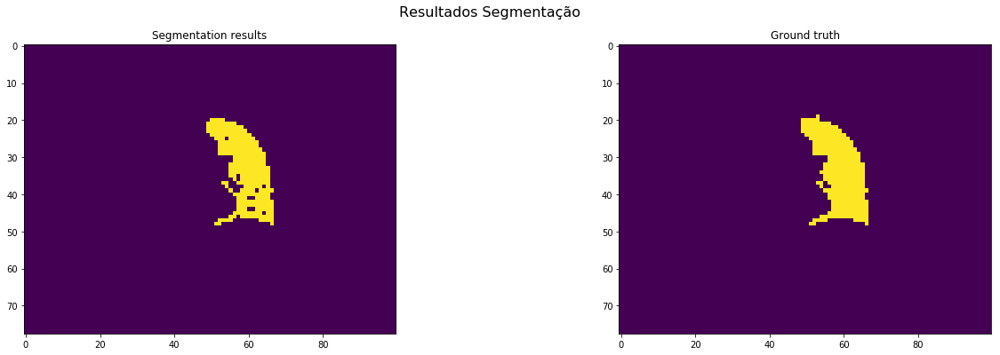

Metrics:
Dice: 0.9536043268824473
Jacquard Index: 0.9113228880633177
True Positive Rate: 0.9191919191919192
Volumetric Similarity: 0.9625623256993154

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 87 in 132
nome pre-result: Centroid3DVolumeSegmented_43109032_right_225.npy
paciente_result: 43109032
region_indice: right
indice_mask: 43109032
shape segmentação: (78, 100, 100)
shape ground truth: (78, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7738, 771496, 87, 679]
Elapsed time: 0.012 seconds.


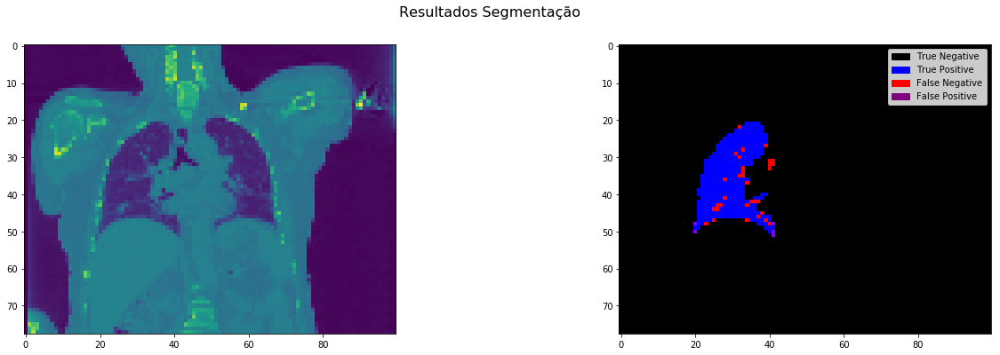

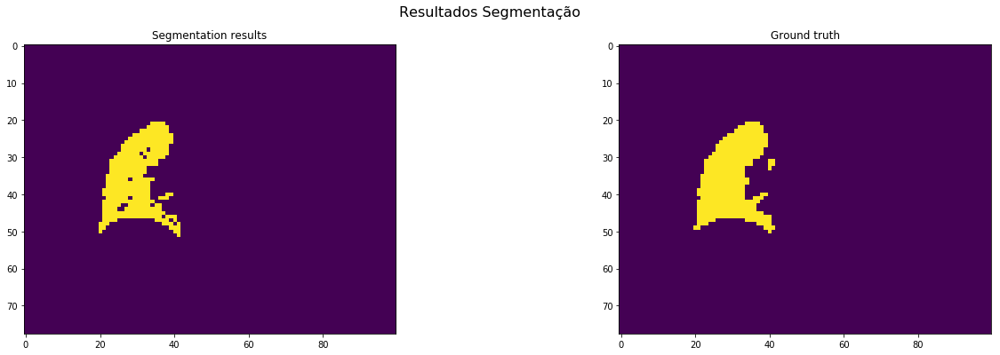

Metrics:
Dice: 0.9528383204038912
Jacquard Index: 0.9099247412982127
True Positive Rate: 0.9193299275276227
Volumetric Similarity: 0.9635512867873415

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 88 in 132
nome pre-result: Centroid3DVolumeSegmented_43151324_left_225.npy
paciente_result: 43151324
region_indice: left
indice_mask: 43151324
shape segmentação: (104, 100, 100)
shape ground truth: (104, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5183, 1034281, 221, 315]
Elapsed time: 0.026 seconds.


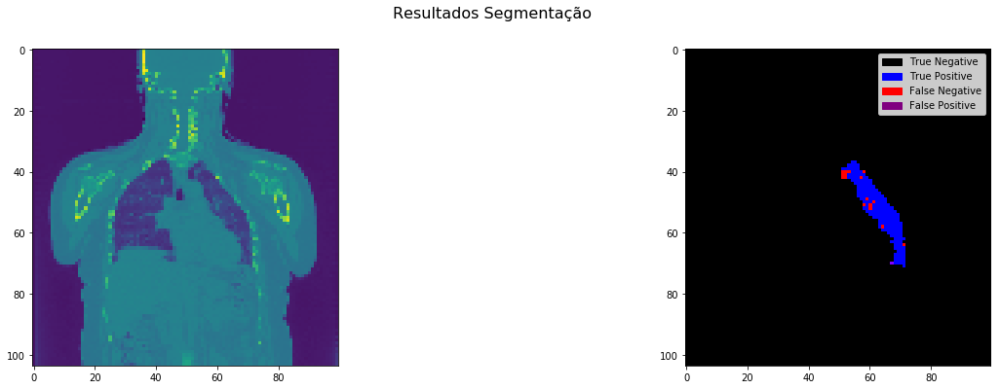

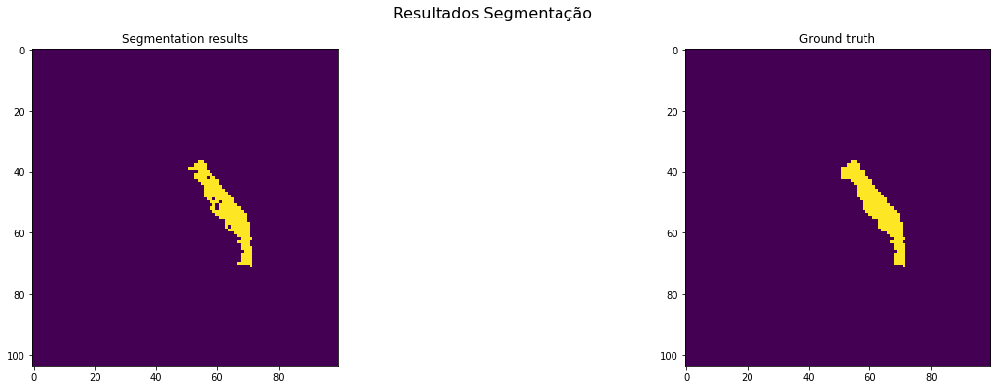

Metrics:
Dice: 0.9508347092276647
Jacquard Index: 0.9062773212100017
True Positive Rate: 0.9427064387049836
Volumetric Similarity: 0.9913777288570904

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 89 in 132
nome pre-result: Centroid3DVolumeSegmented_43151324_right_225.npy
paciente_result: 43151324
region_indice: right
indice_mask: 43151324
shape segmentação: (104, 100, 100)
shape ground truth: (104, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8472, 1030553, 82, 893]
Elapsed time: 0.016 seconds.


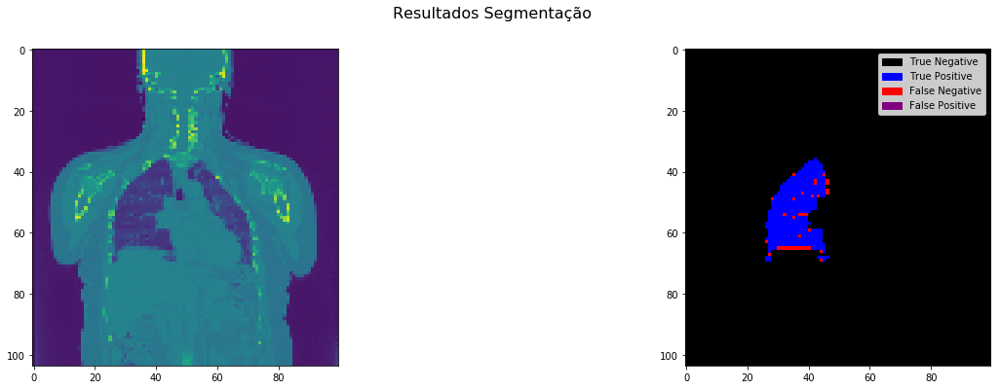

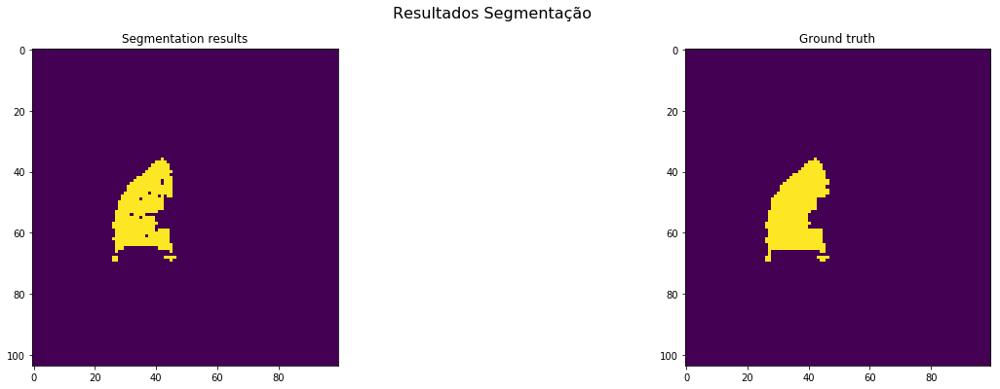

Metrics:
Dice: 0.9455884815000837
Jacquard Index: 0.896792632581772
True Positive Rate: 0.9046449546182594
Volumetric Similarity: 0.9547407779451978

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 90 in 132
nome pre-result: Centroid3DVolumeSegmented_43181879_left_225.npy
paciente_result: 43181879
region_indice: left
indice_mask: 43181879
shape segmentação: (108, 100, 100)
shape ground truth: (108, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6738, 1072786, 137, 339]
Elapsed time: 0.024 seconds.


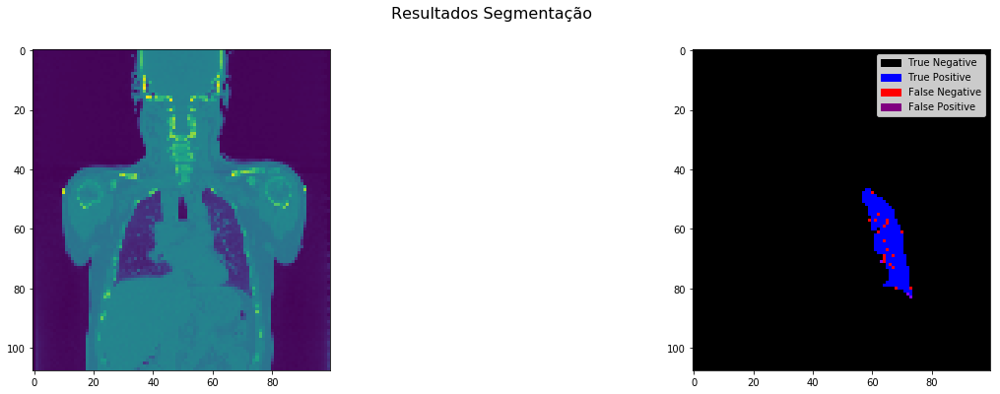

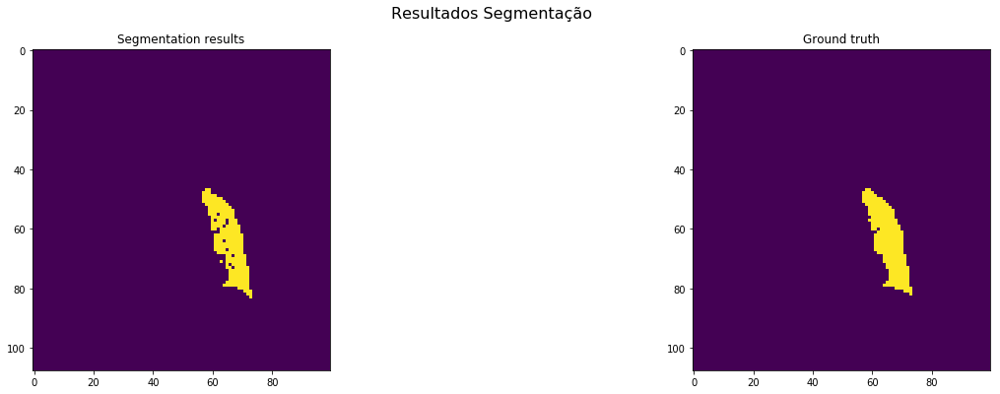

Metrics:
Dice: 0.9658830275229358
Jacquard Index: 0.9340171887995564
True Positive Rate: 0.9520983467571005
Volumetric Similarity: 0.9855217889908257

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 91 in 132
nome pre-result: Centroid3DVolumeSegmented_43181879_right_225.npy
paciente_result: 43181879
region_indice: right
indice_mask: 43181879
shape segmentação: (108, 100, 100)
shape ground truth: (108, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8231, 1071154, 146, 469]
Elapsed time: 0.024 seconds.


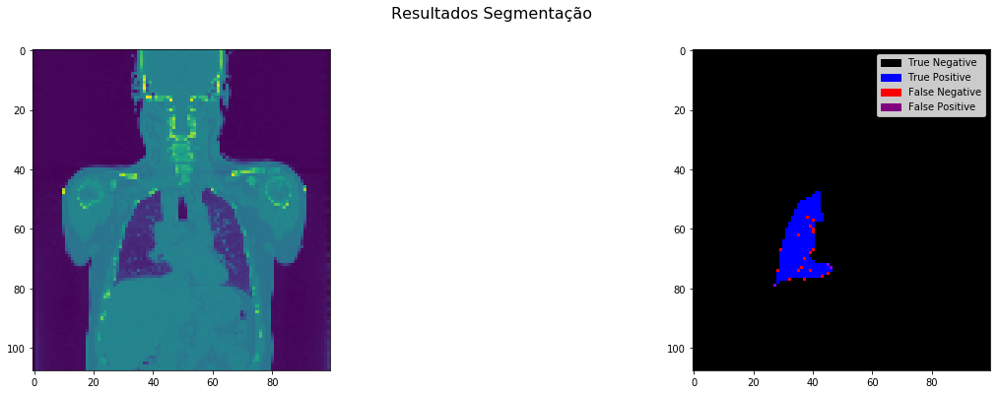

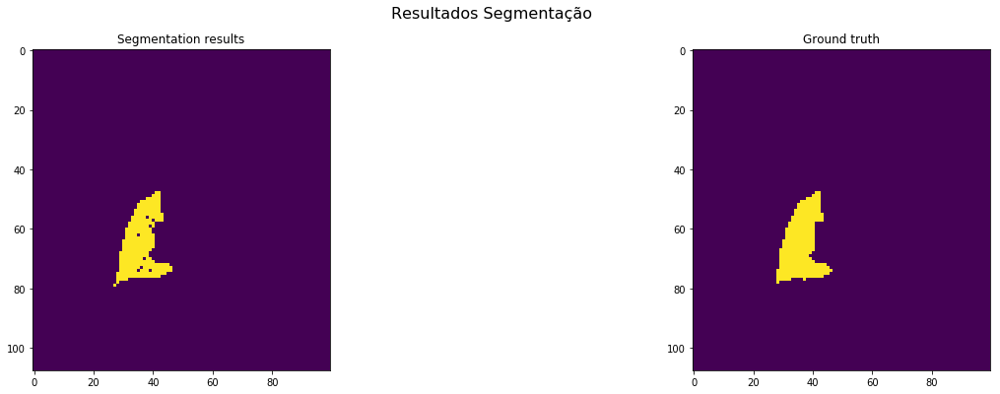

Metrics:
Dice: 0.9639866487087896
Jacquard Index: 0.9304770517748134
True Positive Rate: 0.9460919540229885
Volumetric Similarity: 0.9810856707852668

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 92 in 132
nome pre-result: Centroid3DVolumeSegmented_43266075_left_225.npy
paciente_result: 43266075
region_indice: left
indice_mask: 43266075
shape segmentação: (92, 130, 130)
shape ground truth: (92, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7076, 1547071, 224, 429]
Elapsed time: 0.032 seconds.


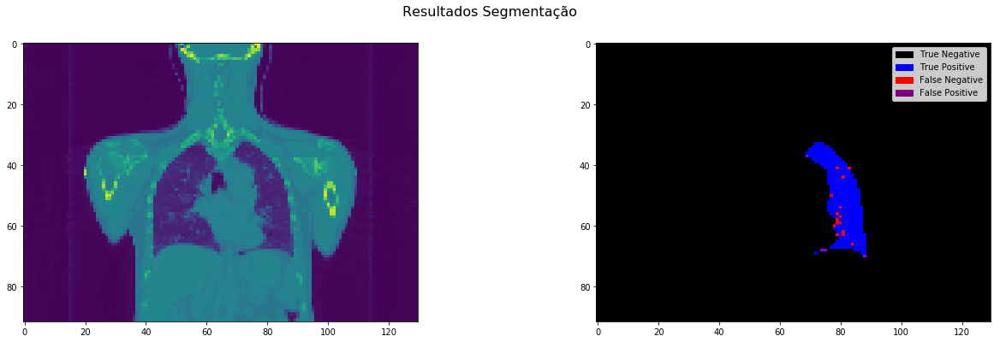

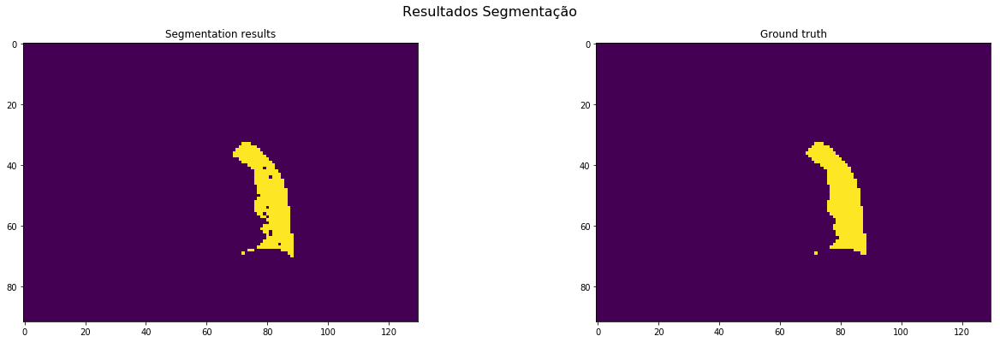

Metrics:
Dice: 0.9558932792975346
Jacquard Index: 0.9155130029758054
True Positive Rate: 0.942838107928048
Volumetric Similarity: 0.9861533265788585

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 93 in 132
nome pre-result: Centroid3DVolumeSegmented_43266075_right_225.npy
paciente_result: 43266075
region_indice: right
indice_mask: 43266075
shape segmentação: (92, 130, 130)
shape ground truth: (92, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10022, 1543738, 314, 726]
Elapsed time: 0.041 seconds.


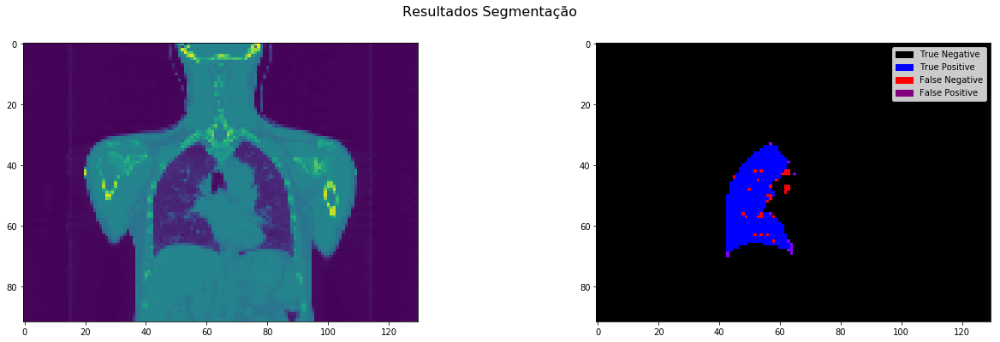

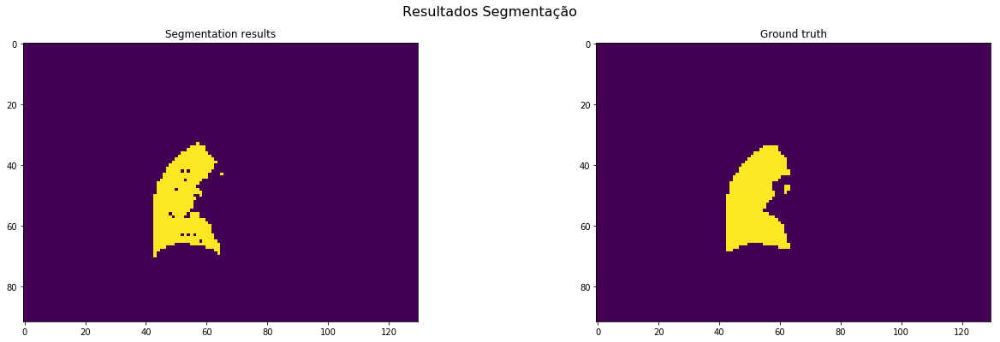

Metrics:
Dice: 0.9506734964902296
Jacquard Index: 0.9059844512746339
True Positive Rate: 0.9324525493114998
Volumetric Similarity: 0.9804591159172833

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 94 in 132
nome pre-result: Centroid3DVolumeSegmented_43405561_left_225.npy
paciente_result: 43405561
region_indice: left
indice_mask: 43405561
shape segmentação: (166, 100, 100)
shape ground truth: (166, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7, 1650565, 0, 9428]
Elapsed time: 0.062 seconds.


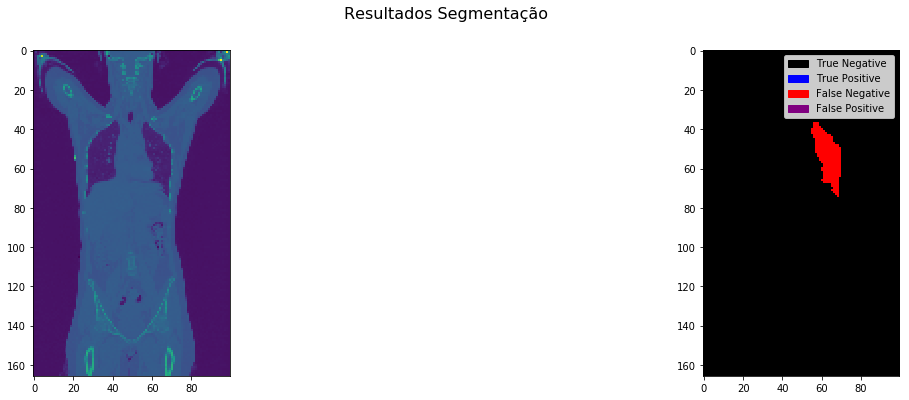

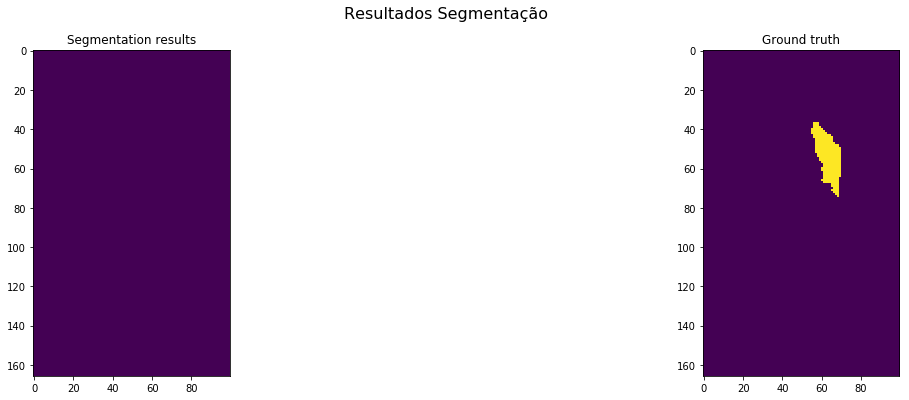

Metrics:
Dice: 0.0014827367083245075
Jacquard Index: 0.0007419183889772125
True Positive Rate: 0.0007419183889772125
Volumetric Similarity: 0.0014827367083245502

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 95 in 132
nome pre-result: Centroid3DVolumeSegmented_43405561_right_225.npy
paciente_result: 43405561
region_indice: right
indice_mask: 43405561
shape segmentação: (166, 100, 100)
shape ground truth: (166, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10067, 1648991, 135, 807]
Elapsed time: 0.035 seconds.


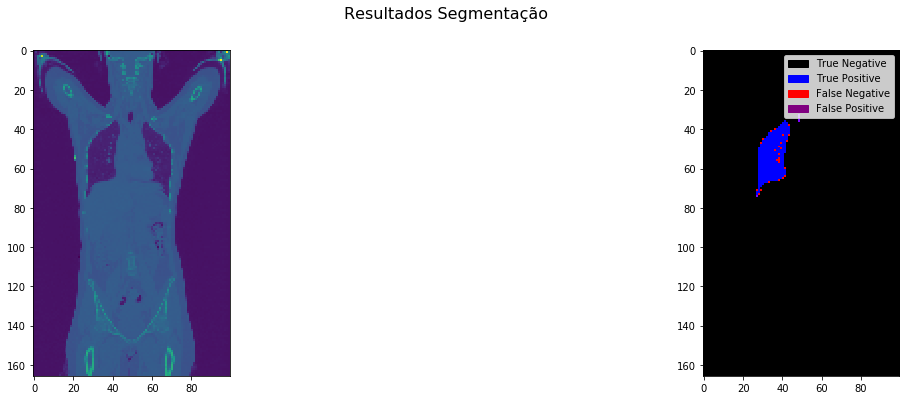

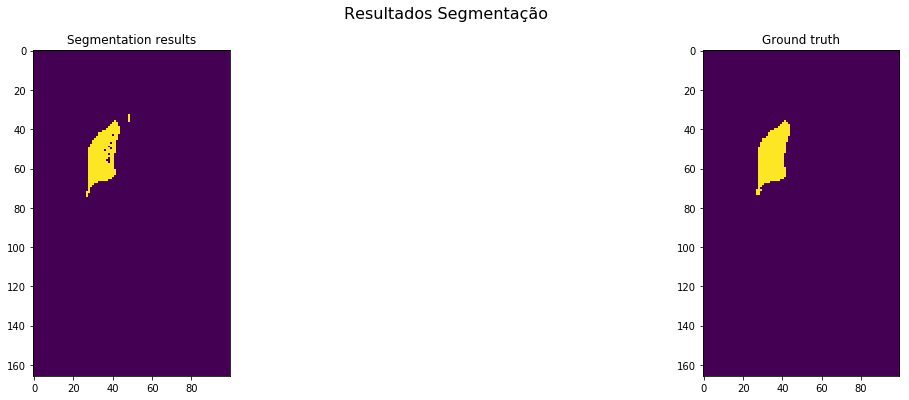

Metrics:
Dice: 0.9553046118808123
Jacquard Index: 0.9144336451993823
True Positive Rate: 0.9257862791980872
Volumetric Similarity: 0.9681153919149744

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 96 in 132
nome pre-result: Centroid3DVolumeSegmented_43675706_left_225.npy
paciente_result: 43675706
region_indice: left
indice_mask: 43675706
shape segmentação: (110, 130, 130)
shape ground truth: (110, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8200, 1850208, 158, 434]
Elapsed time: 0.044 seconds.


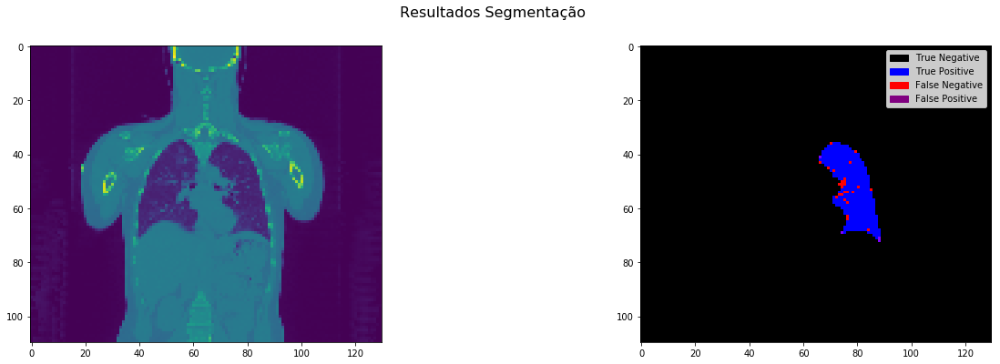

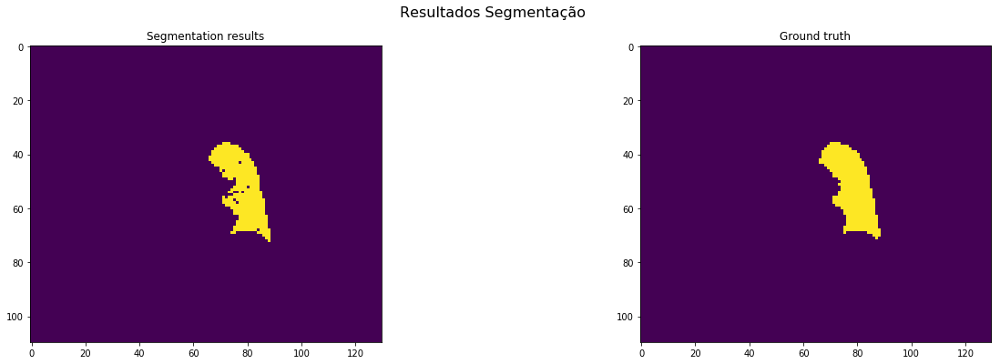

Metrics:
Dice: 0.9651600753295668
Jacquard Index: 0.9326660600545951
True Positive Rate: 0.9497336113041464
Volumetric Similarity: 0.9837570621468926

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 97 in 132
nome pre-result: Centroid3DVolumeSegmented_43675706_right_225.npy
paciente_result: 43675706
region_indice: right
indice_mask: 43675706
shape segmentação: (110, 130, 130)
shape ground truth: (110, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9637, 1848637, 122, 604]
Elapsed time: 0.039 seconds.


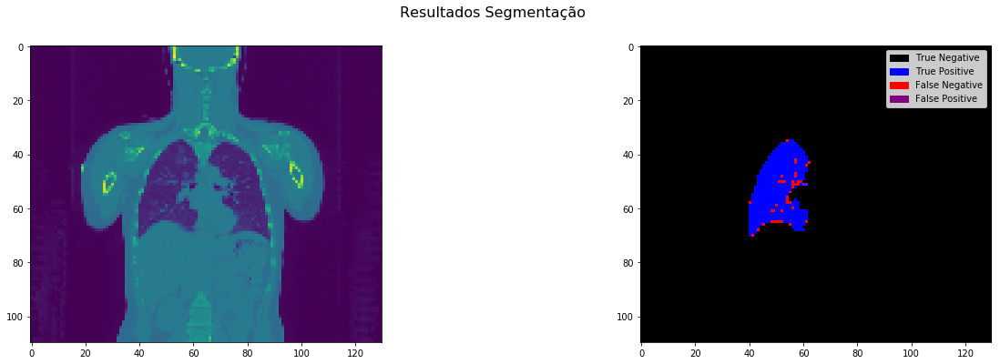

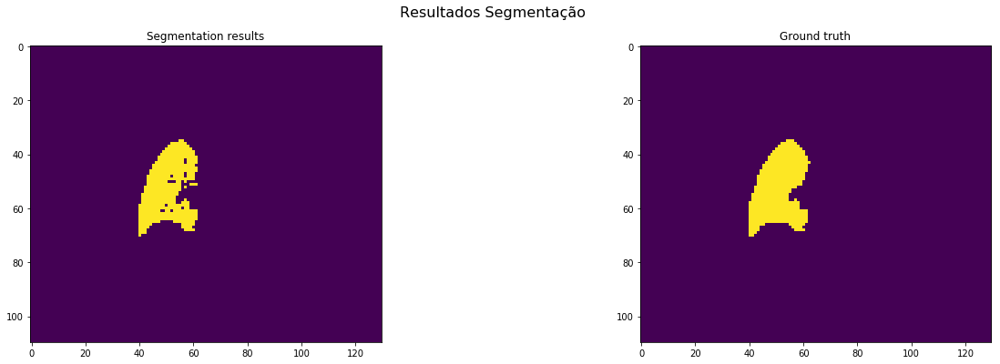

Metrics:
Dice: 0.9637
Jacquard Index: 0.929943066679533
True Positive Rate: 0.9410213846304072
Volumetric Similarity: 0.9759

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 98 in 132
nome pre-result: Centroid3DVolumeSegmented_44120063_left_225.npy
paciente_result: 44120063
region_indice: left
indice_mask: 44120063
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8852, 870415, 77, 656]
Elapsed time: 0.013 seconds.


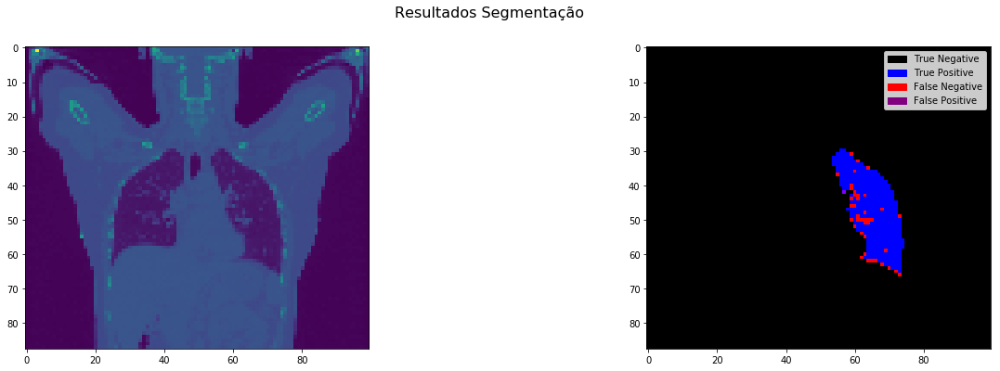

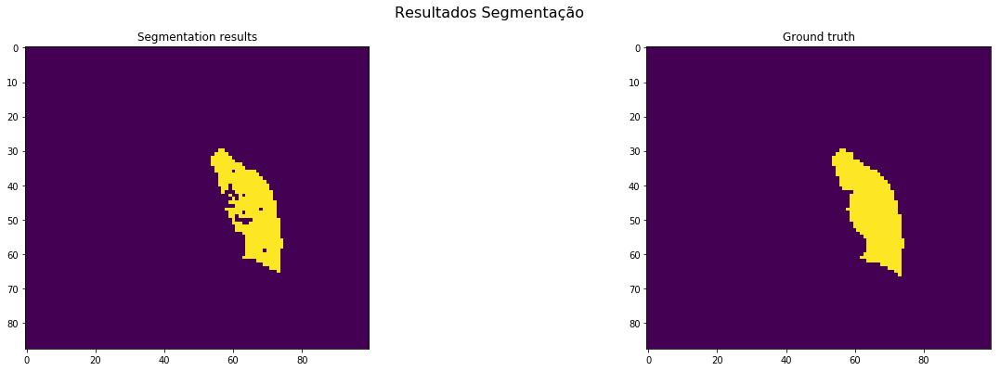

Metrics:
Dice: 0.960242989640397
Jacquard Index: 0.9235263432446531
True Positive Rate: 0.9310054690786705
Volumetric Similarity: 0.9685957585290449

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 99 in 132
nome pre-result: Centroid3DVolumeSegmented_44120063_right_225.npy
paciente_result: 44120063
region_indice: right
indice_mask: 44120063
shape segmentação: (88, 100, 100)
shape ground truth: (88, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10142, 869067, 81, 710]
Elapsed time: 0.017 seconds.


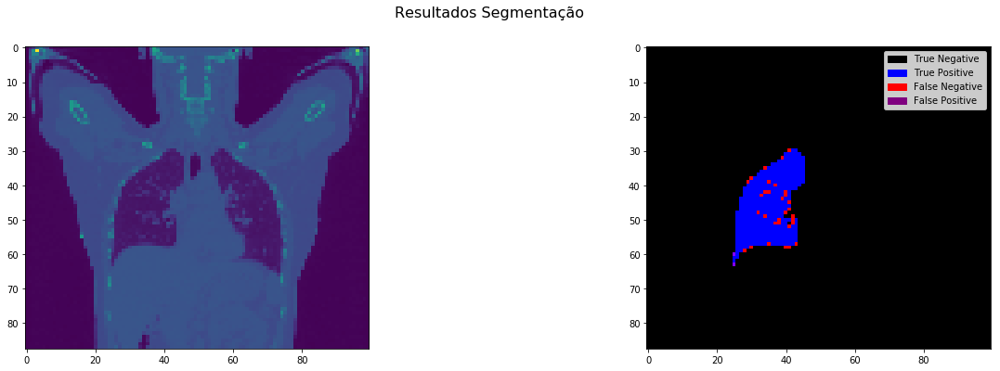

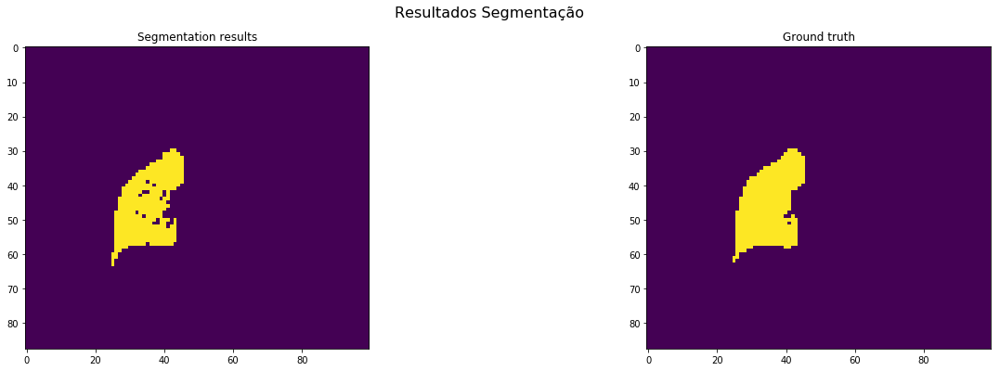

Metrics:
Dice: 0.962467378410439
Jacquard Index: 0.9276502332388182
True Positive Rate: 0.9345742720235901
Volumetric Similarity: 0.9701542111506525

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 100 in 132
nome pre-result: Centroid3DVolumeSegmented_44253050_left_225.npy
paciente_result: 44253050
region_indice: left
indice_mask: 44253050
shape segmentação: (168, 100, 100)
shape ground truth: (168, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [14032, 1664765, 142, 1061]
Elapsed time: 0.070 seconds.


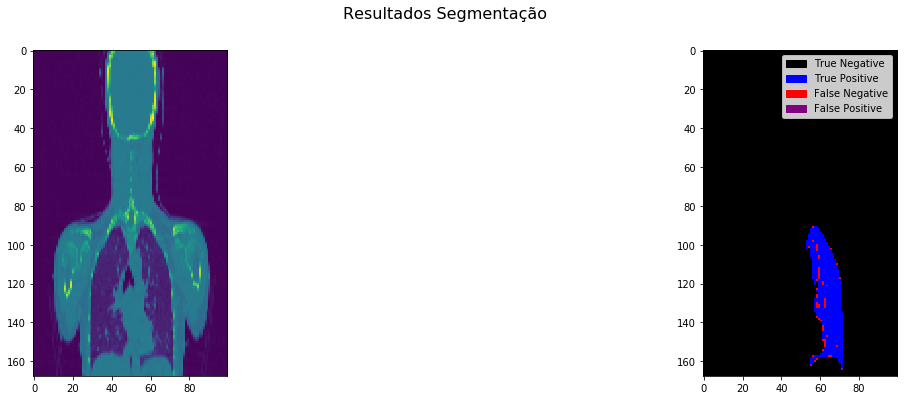

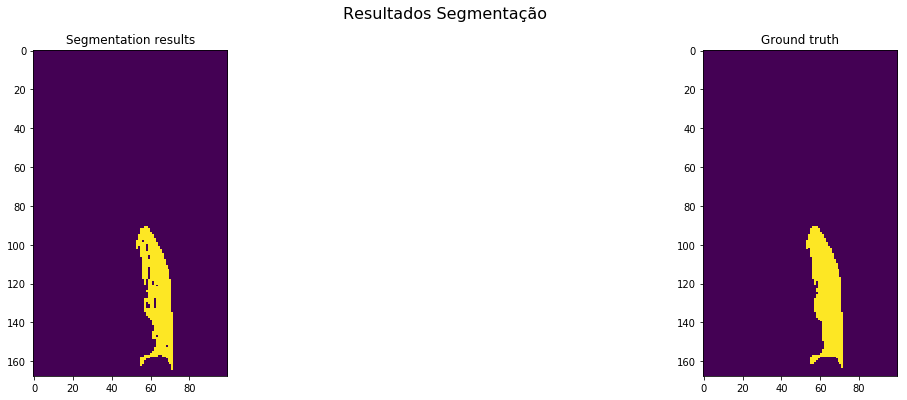

Metrics:
Dice: 0.9588956845594013
Jacquard Index: 0.9210370856580243
True Positive Rate: 0.92970251109786
Volumetric Similarity: 0.9685994464755526

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 101 in 132
nome pre-result: Centroid3DVolumeSegmented_44253050_right_225.npy
paciente_result: 44253050
region_indice: right
indice_mask: 44253050
shape segmentação: (168, 100, 100)
shape ground truth: (168, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [16570, 1661217, 217, 1996]
Elapsed time: 0.033 seconds.


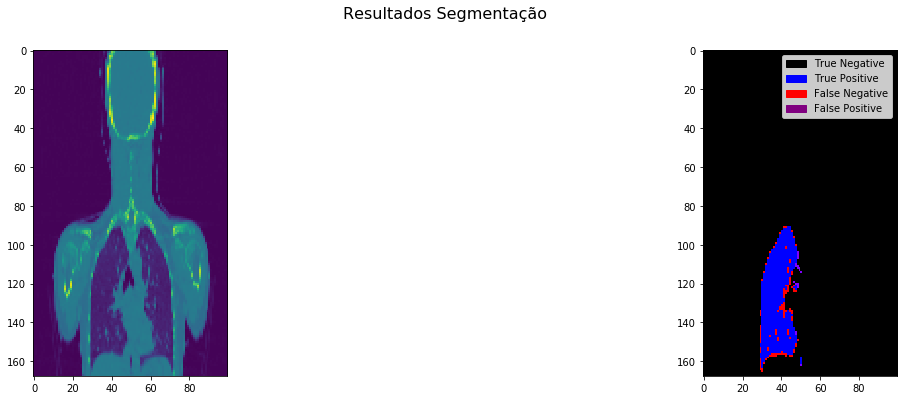

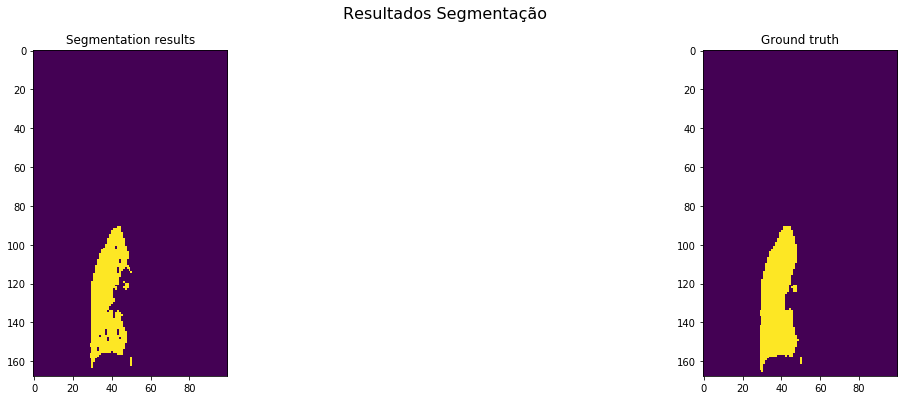

Metrics:
Dice: 0.9374027663847481
Jacquard Index: 0.8821806953095884
True Positive Rate: 0.8924916514057956
Volumetric Similarity: 0.9496789522812774

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 102 in 132
nome pre-result: Centroid3DVolumeSegmented_44422897_left_225.npy
paciente_result: 44422897
region_indice: left
indice_mask: 44422897
shape segmentação: (88, 130, 130)
shape ground truth: (88, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [11670, 1474425, 368, 737]
Elapsed time: 0.033 seconds.


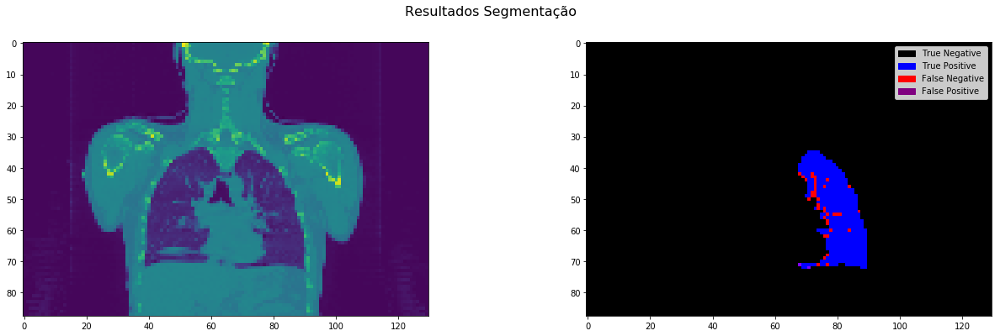

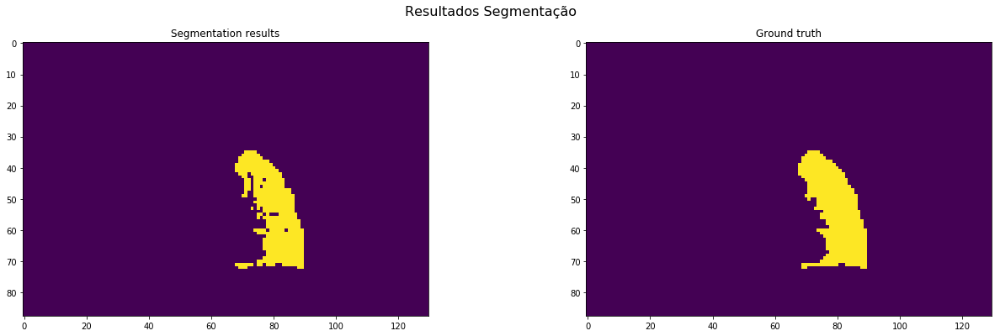

Metrics:
Dice: 0.9547964818981387
Jacquard Index: 0.9135029354207437
True Positive Rate: 0.9405980494881921
Volumetric Similarity: 0.9849048885252608

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 103 in 132
nome pre-result: Centroid3DVolumeSegmented_44422897_right_225.npy
paciente_result: 44422897
region_indice: right
indice_mask: 44422897
shape segmentação: (88, 130, 130)
shape ground truth: (88, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [1, 1472843, 0, 14356]
Elapsed time: 0.036 seconds.


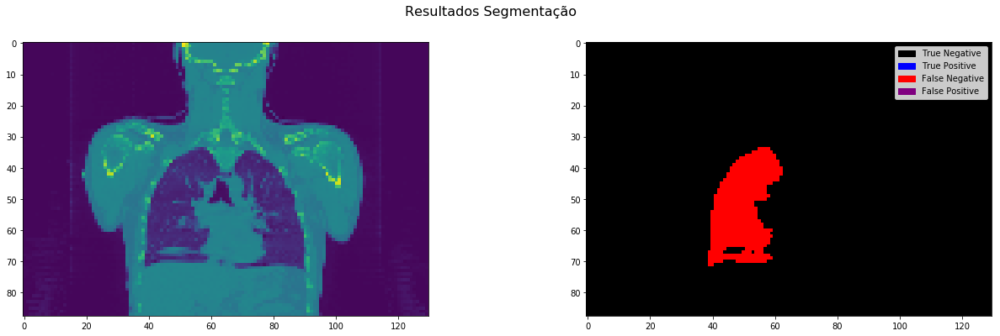

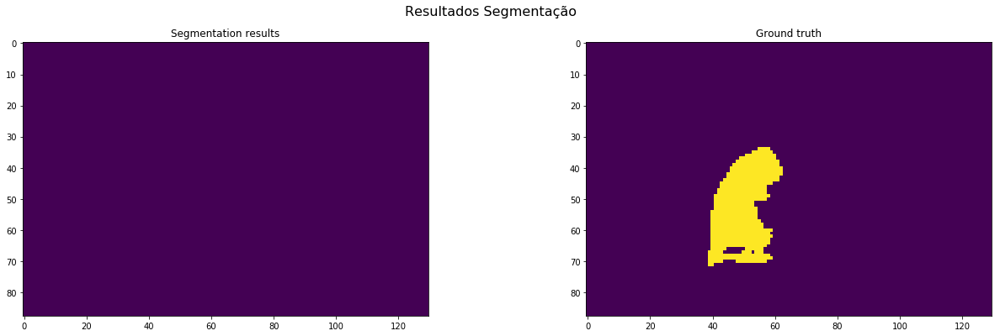

Metrics:
Dice: 0.0001392951664577239
Jacquard Index: 6.965243435258063e-05
True Positive Rate: 6.965243435258063e-05
Volumetric Similarity: 0.00013929516645772022

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 104 in 132
nome pre-result: Centroid3DVolumeSegmented_45858788_left_225.npy
paciente_result: 45858788
region_indice: left
indice_mask: 45858788
shape segmentação: (82, 100, 100)
shape ground truth: (82, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9817, 809401, 71, 711]
Elapsed time: 0.011 seconds.


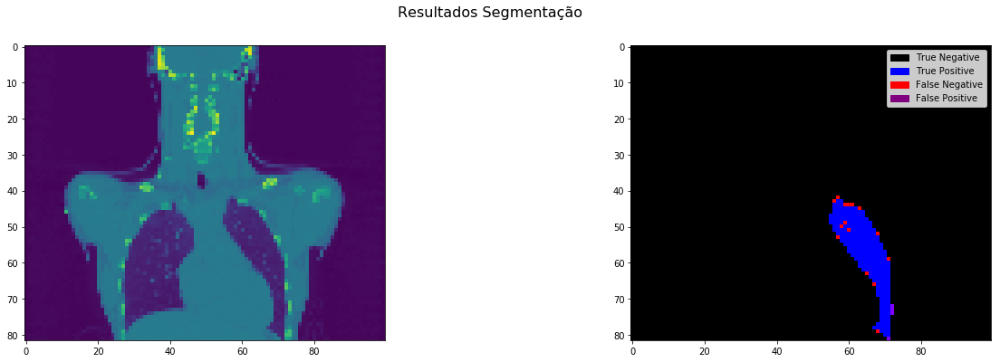

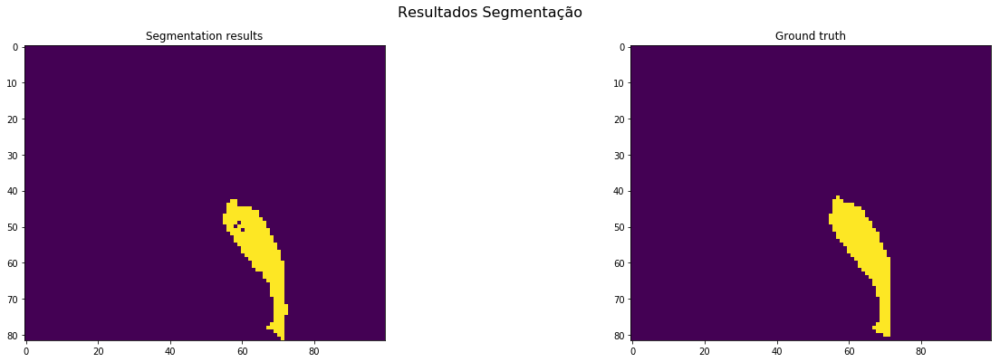

Metrics:
Dice: 0.9616967084639498
Jacquard Index: 0.9262194546655345
True Positive Rate: 0.9324658054711246
Volumetric Similarity: 0.9686520376175549

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 105 in 132
nome pre-result: Centroid3DVolumeSegmented_45858788_right_225.npy
paciente_result: 45858788
region_indice: right
indice_mask: 45858788
shape segmentação: (82, 100, 100)
shape ground truth: (82, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12325, 806712, 143, 820]
Elapsed time: 0.013 seconds.


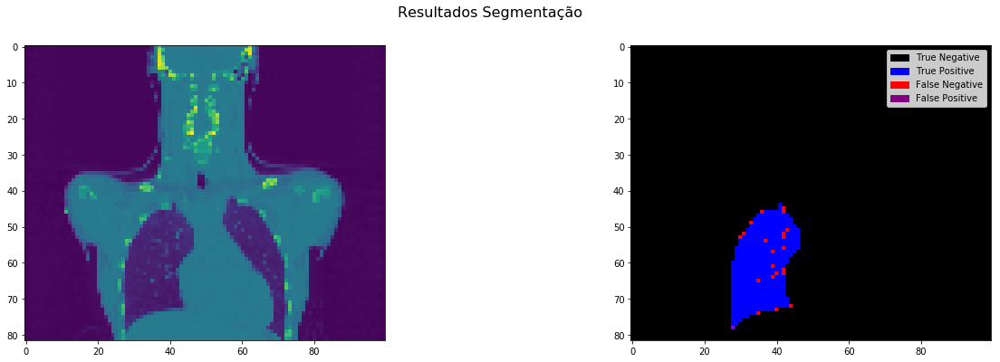

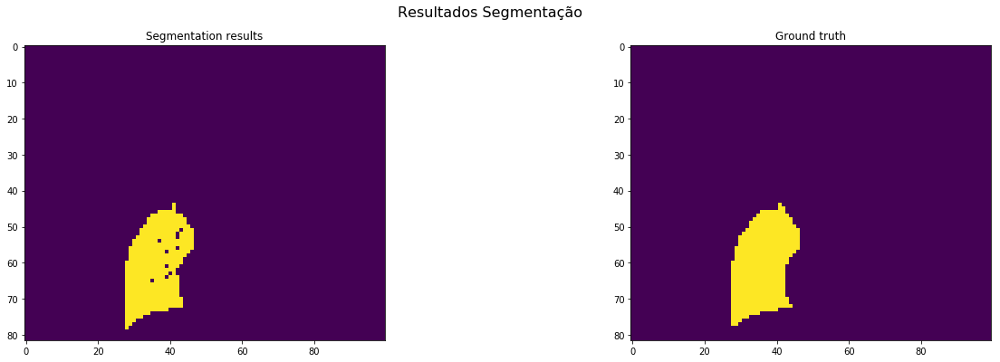

Metrics:
Dice: 0.9624019052824737
Jacquard Index: 0.927528597230584
True Positive Rate: 0.9376188664891594
Volumetric Similarity: 0.973568109944169

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 106 in 132
nome pre-result: Centroid3DVolumeSegmented_46318956_left_225.npy
paciente_result: 46318956
region_indice: left
indice_mask: 46318956
shape segmentação: (120, 130, 130)
shape ground truth: (120, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7025, 2019938, 61, 976]
Elapsed time: 0.039 seconds.


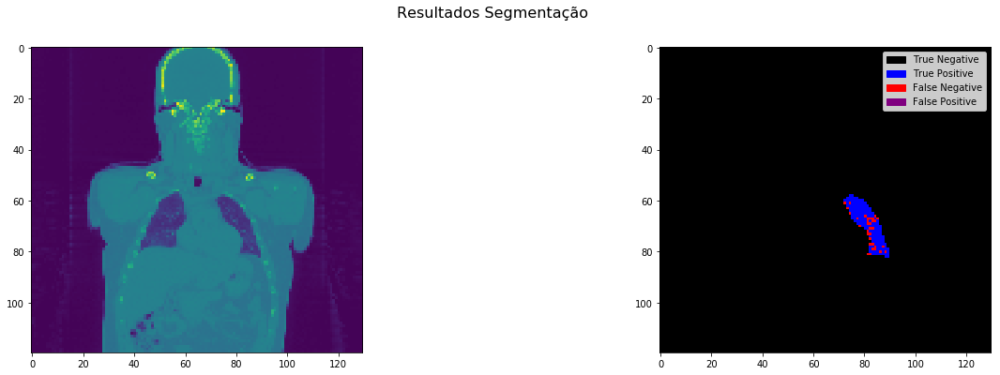

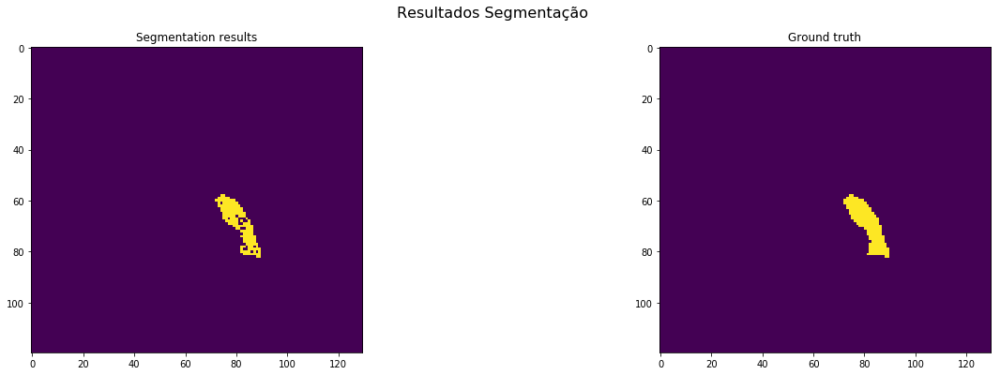

Metrics:
Dice: 0.931265327765626
Jacquard Index: 0.8713718680228231
True Positive Rate: 0.8780152480939882
Volumetric Similarity: 0.9393517597931994

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 107 in 132
nome pre-result: Centroid3DVolumeSegmented_46318956_right_225.npy
paciente_result: 46318956
region_indice: right
indice_mask: 46318956
shape segmentação: (120, 130, 130)
shape ground truth: (120, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8757, 2018150, 78, 1015]
Elapsed time: 0.040 seconds.


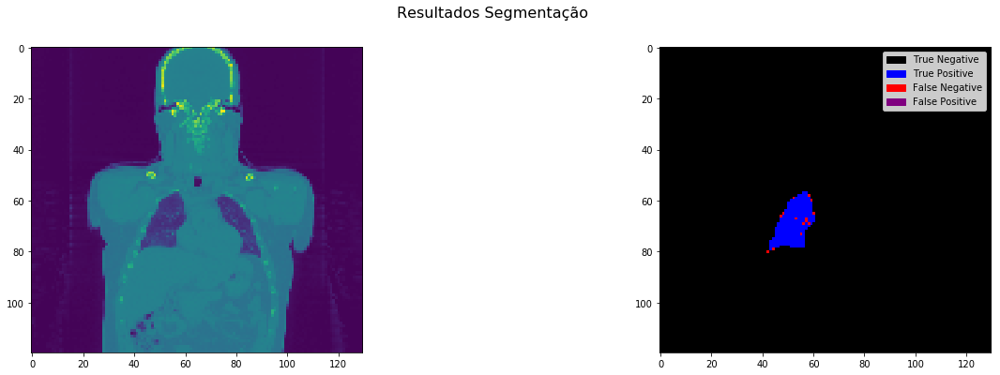

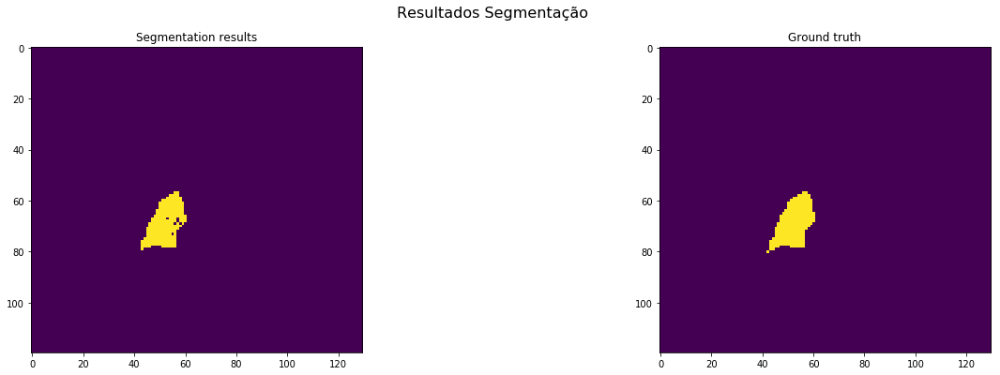

Metrics:
Dice: 0.9412586660934057
Jacquard Index: 0.8890355329949239
True Positive Rate: 0.8961318051575932
Volumetric Similarity: 0.9496426076207879

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 108 in 132
nome pre-result: Centroid3DVolumeSegmented_47262863_left_225.npy
paciente_result: 47262863
region_indice: left
indice_mask: 47262863
shape segmentação: (98, 100, 100)
shape ground truth: (98, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12116, 966623, 270, 991]
Elapsed time: 0.015 seconds.


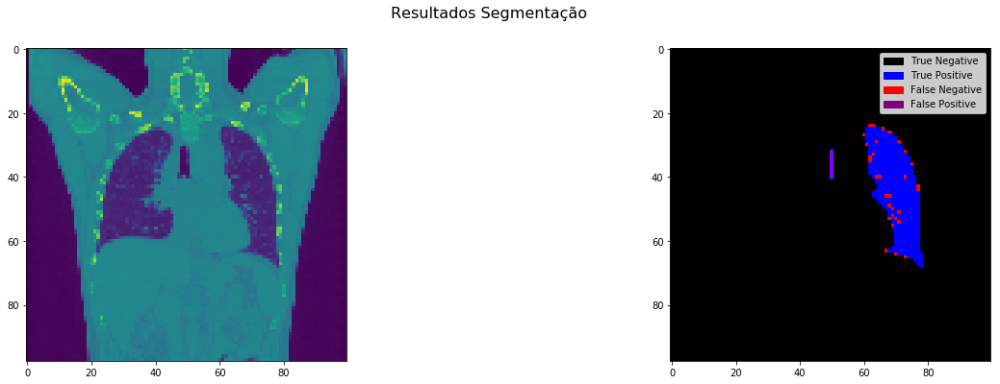

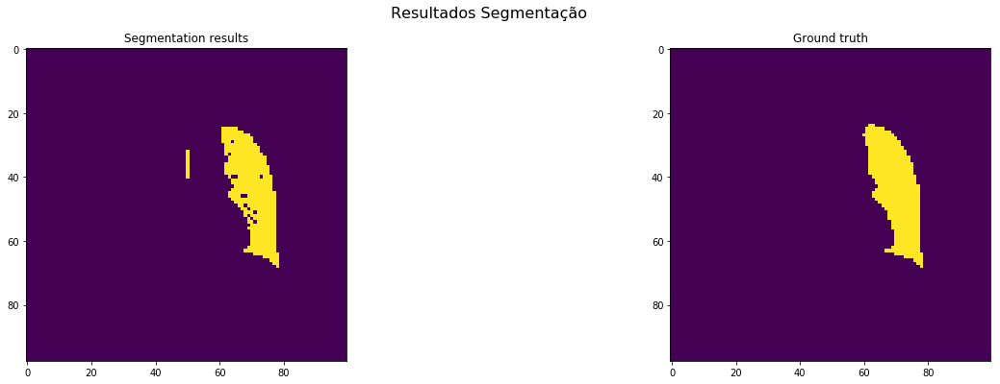

Metrics:
Dice: 0.9505354411014788
Jacquard Index: 0.9057337220602527
True Positive Rate: 0.9243915465018693
Volumetric Similarity: 0.9717177264347076

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 109 in 132
nome pre-result: Centroid3DVolumeSegmented_47262863_right_225.npy
paciente_result: 47262863
region_indice: right
indice_mask: 47262863
shape segmentação: (98, 100, 100)
shape ground truth: (98, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [14137, 964536, 239, 1088]
Elapsed time: 0.014 seconds.


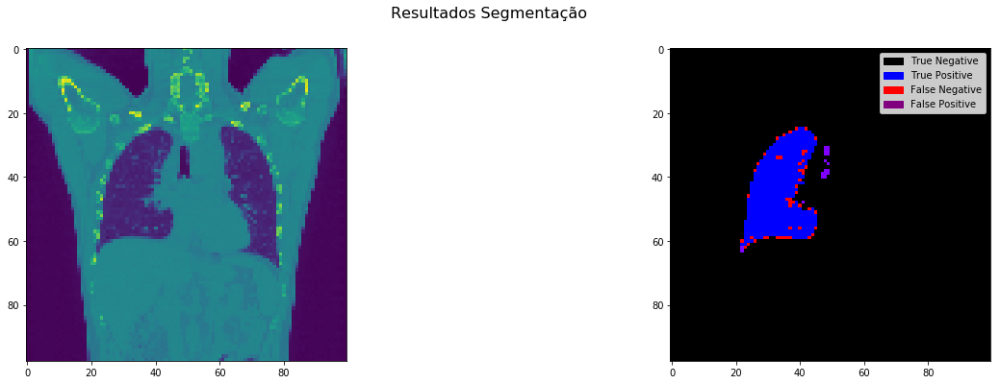

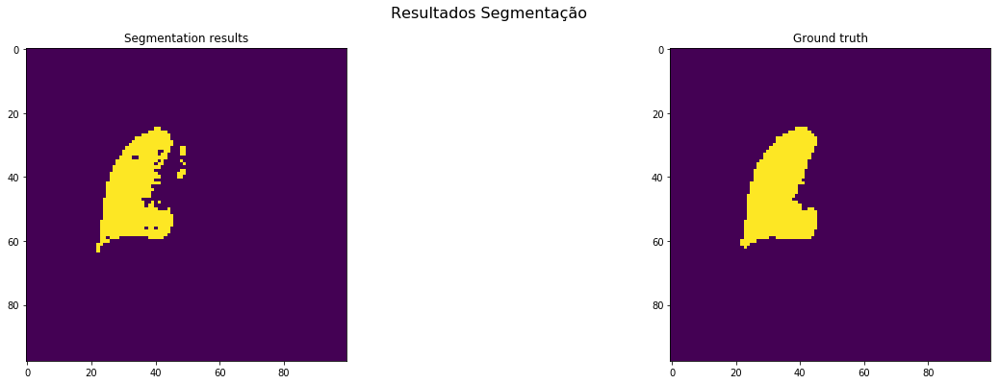

Metrics:
Dice: 0.955170433431303
Jacquard Index: 0.914187790998448
True Positive Rate: 0.9285385878489327
Volumetric Similarity: 0.9713185365359278

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 110 in 132
nome pre-result: Centroid3DVolumeSegmented_47295940_left_225.npy
paciente_result: 47295940
region_indice: left
indice_mask: 47295940
shape segmentação: (83, 100, 100)
shape ground truth: (83, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9624, 819100, 63, 1213]
Elapsed time: 0.017 seconds.


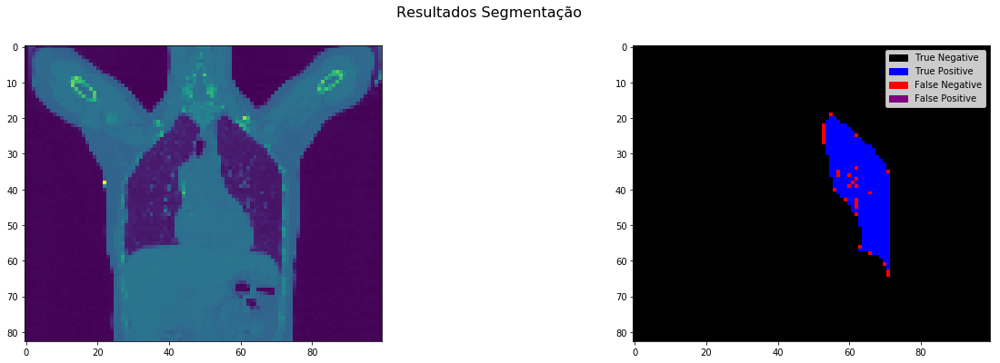

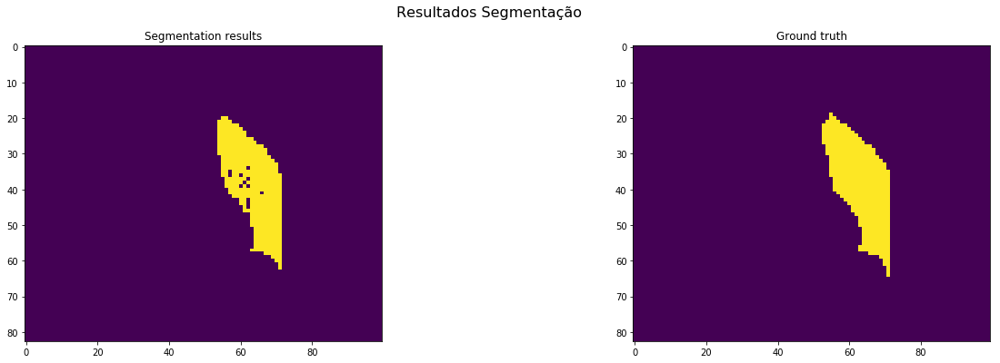

Metrics:
Dice: 0.937828883258624
Jacquard Index: 0.8829357798165137
True Positive Rate: 0.8880686536864446
Volumetric Similarity: 0.9439680374196063

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 111 in 132
nome pre-result: Centroid3DVolumeSegmented_47295940_right_225.npy
paciente_result: 47295940
region_indice: right
indice_mask: 47295940
shape segmentação: (83, 100, 100)
shape ground truth: (83, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9870, 818872, 211, 1047]
Elapsed time: 0.011 seconds.


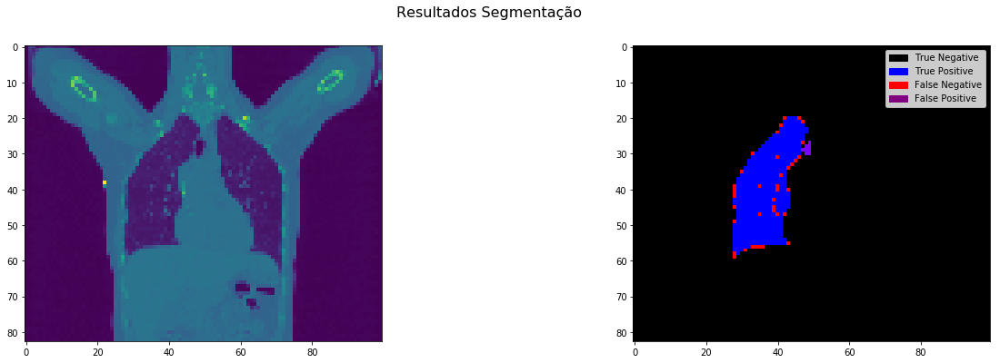

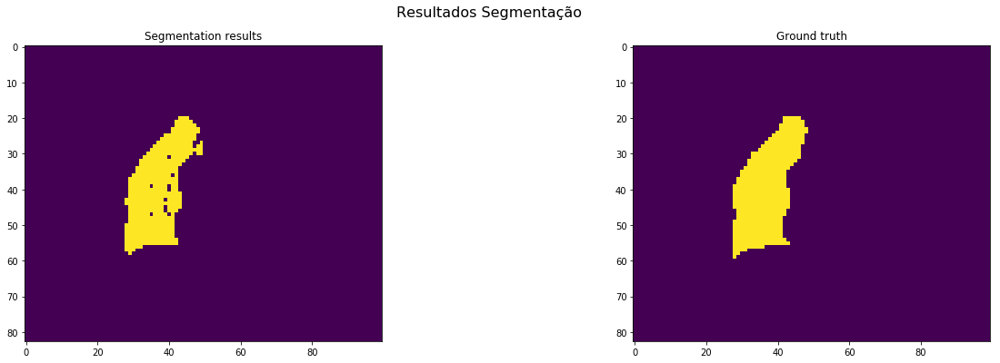

Metrics:
Dice: 0.940089532336413
Jacquard Index: 0.8869518332135155
True Positive Rate: 0.9040945314646881
Volumetric Similarity: 0.9601866844461378

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 112 in 132
nome pre-result: Centroid3DVolumeSegmented_48148279_left_225.npy
paciente_result: 48148279
region_indice: left
indice_mask: 48148279
shape segmentação: (99, 100, 100)
shape ground truth: (99, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9462, 979095, 51, 1392]
Elapsed time: 0.012 seconds.


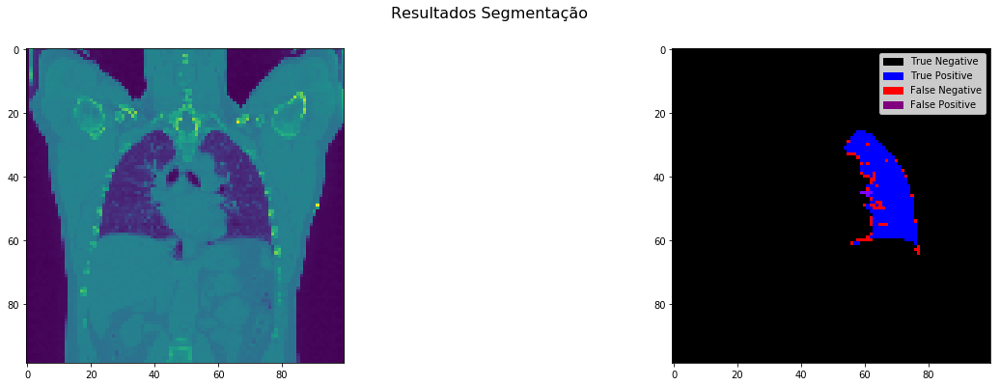

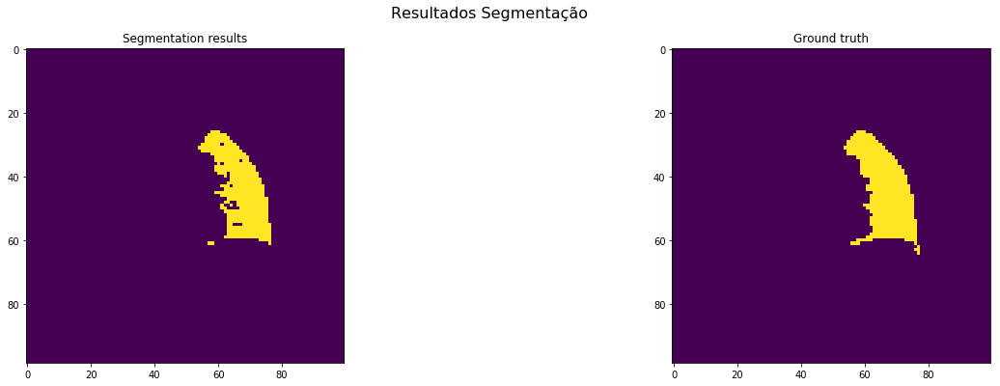

Metrics:
Dice: 0.9291500957431139
Jacquard Index: 0.86767537826685
True Positive Rate: 0.8717523493642897
Volumetric Similarity: 0.9341581970835174

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 113 in 132
nome pre-result: Centroid3DVolumeSegmented_48148279_right_225.npy
paciente_result: 48148279
region_indice: right
indice_mask: 48148279
shape segmentação: (99, 100, 100)
shape ground truth: (99, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10882, 977537, 21, 1560]
Elapsed time: 0.013 seconds.


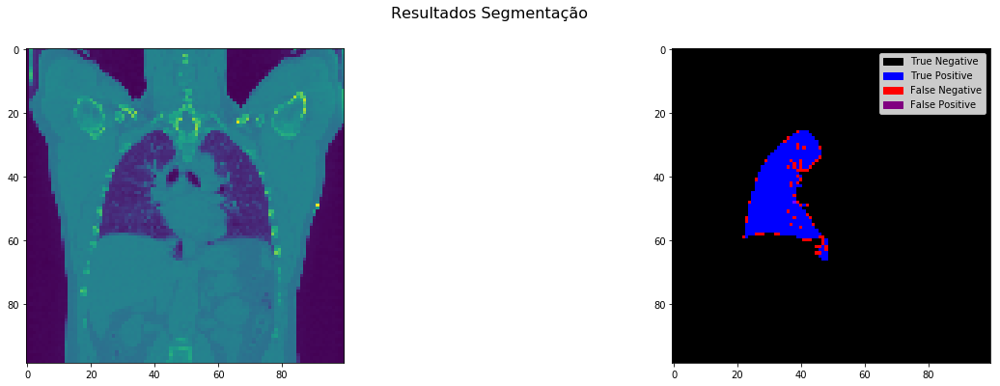

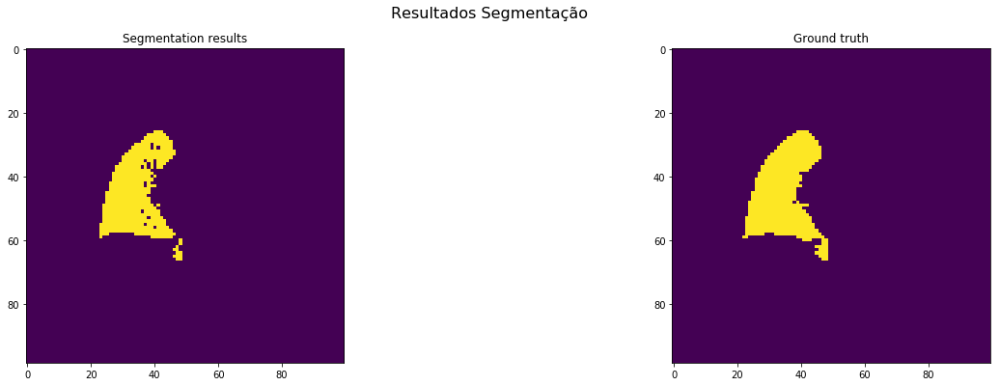

Metrics:
Dice: 0.9322767187834654
Jacquard Index: 0.8731445077429191
True Positive Rate: 0.874618228580614
Volumetric Similarity: 0.9340758192332406

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 114 in 132
nome pre-result: Centroid3DVolumeSegmented_48259441_left_225.npy
paciente_result: 48259441
region_indice: left
indice_mask: 48259441
Im zero
Im zero
shape segmentação: (200, 256, 256)
shape ground truth: (200, 256, 256)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [34135, 13070108, 1055, 1902]
Elapsed time: 0.274 seconds.


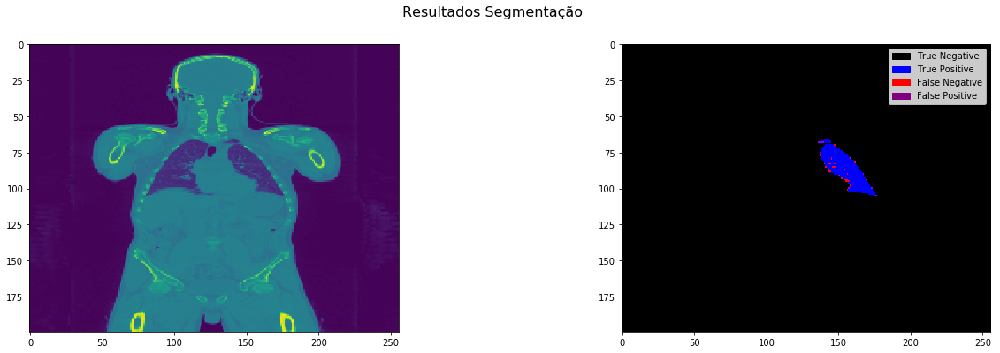

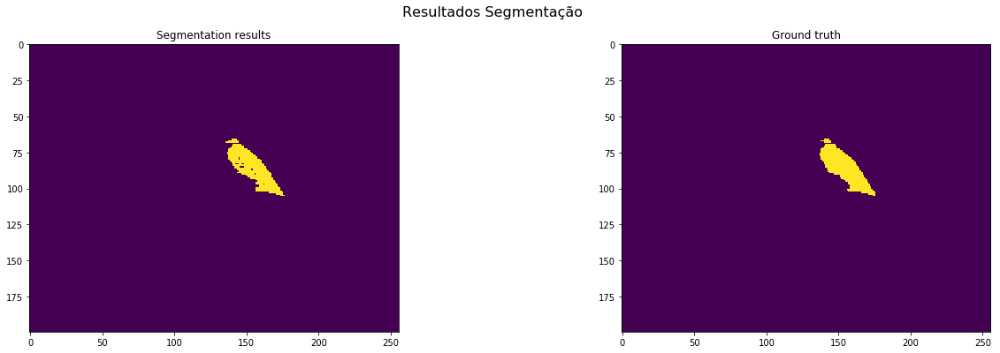

Metrics:
Dice: 0.9584848442304182
Jacquard Index: 0.9202793055106222
True Positive Rate: 0.9472209118406083
Volumetric Similarity: 0.98810844202339

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 115 in 132
nome pre-result: Centroid3DVolumeSegmented_48259441_right_225.npy
paciente_result: 48259441
region_indice: right
indice_mask: 48259441
Im zero
Im zero
shape segmentação: (200, 256, 256)
shape ground truth: (200, 256, 256)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [37919, 13065658, 1837, 1786]
Elapsed time: 0.256 seconds.


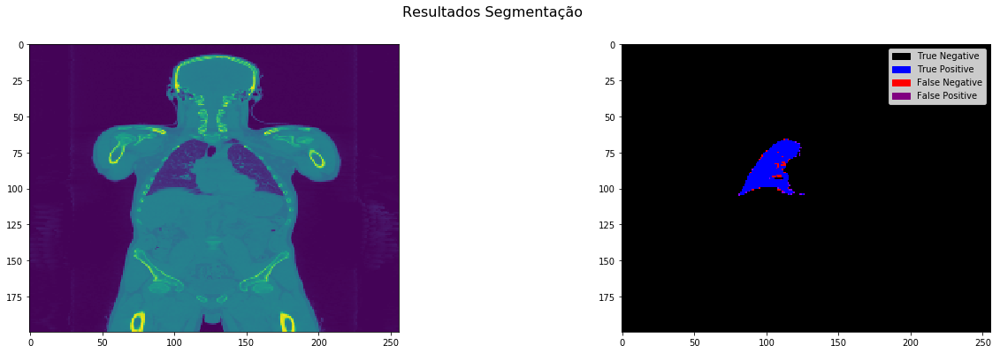

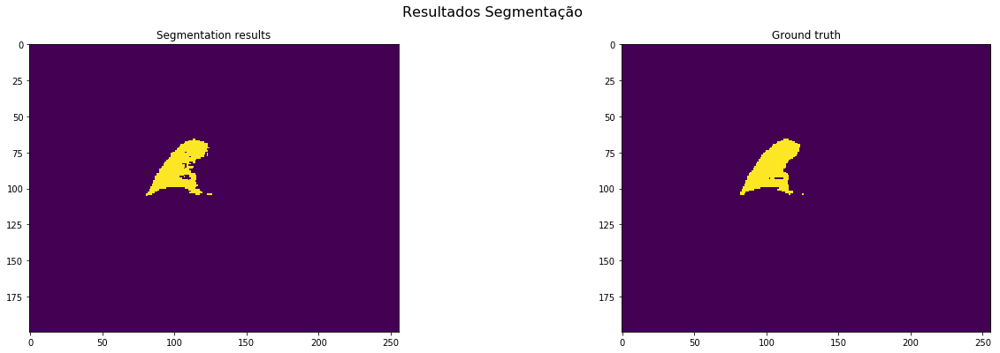

Metrics:
Dice: 0.9544053057474736
Jacquard Index: 0.9127870588801694
True Positive Rate: 0.9550182596650296
Volumetric Similarity: 0.9993581757088383

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 116 in 132
nome pre-result: Centroid3DVolumeSegmented_48335198_right_225.npy
paciente_result: 48335198
region_indice: right
indice_mask: 48335198
shape segmentação: (214, 100, 100)
shape ground truth: (214, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [12686, 2125628, 408, 1278]
Elapsed time: 0.045 seconds.


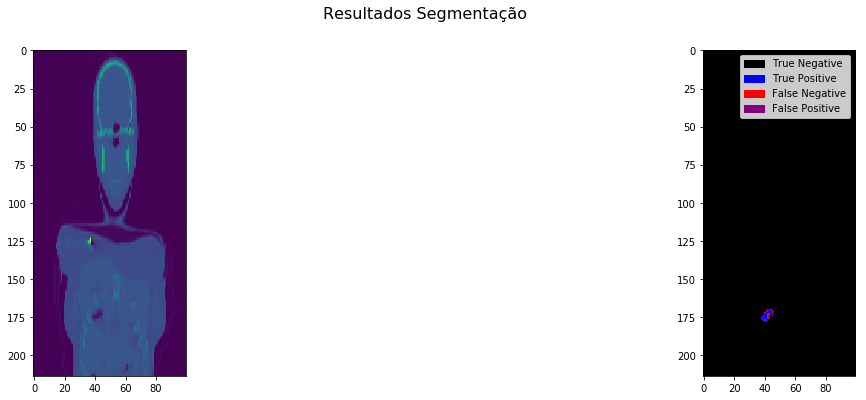

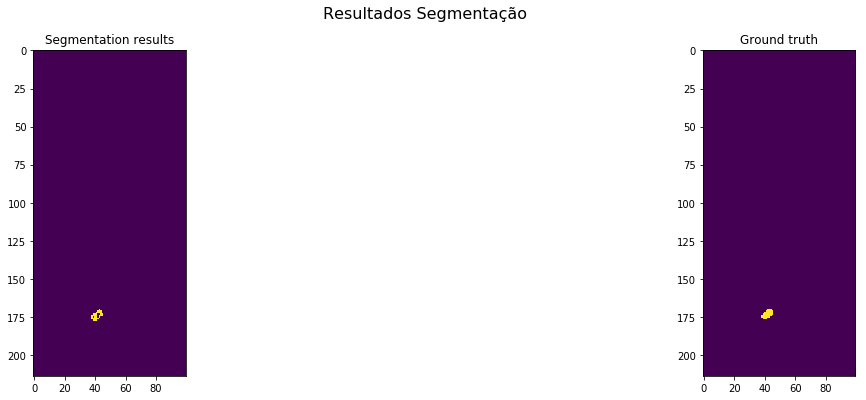

Metrics:
Dice: 0.9376894079385025
Jacquard Index: 0.8826885610910103
True Positive Rate: 0.9084789458607849
Volumetric Similarity: 0.9678468475127504

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 117 in 132
nome pre-result: Centroid3DVolumeSegmented_48389421_left_225.npy
paciente_result: 48389421
region_indice: left
indice_mask: 48389421
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6240, 913215, 47, 498]
Elapsed time: 0.024 seconds.


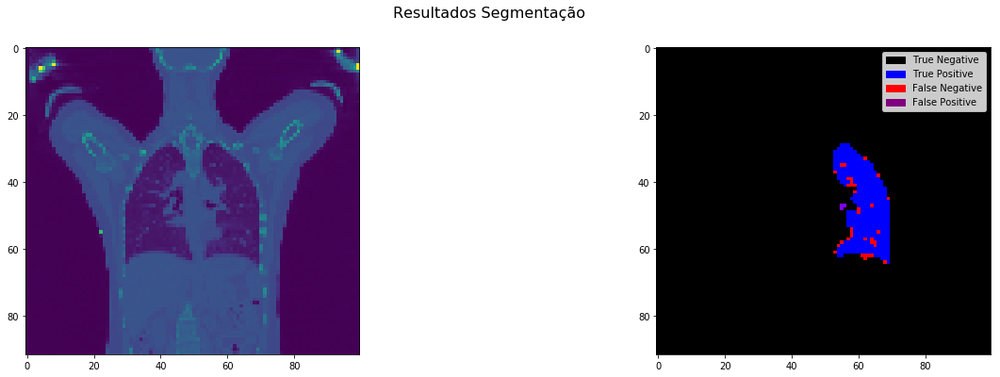

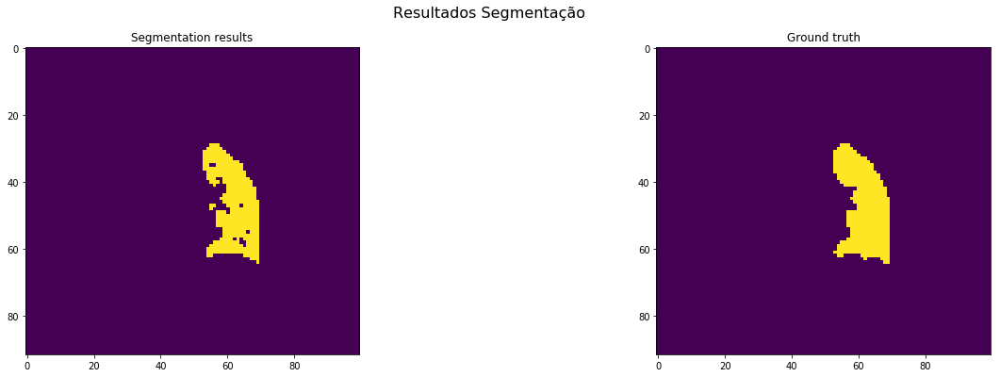

Metrics:
Dice: 0.9581573896353167
Jacquard Index: 0.9196757553426677
True Positive Rate: 0.9260908281389136
Volumetric Similarity: 0.9653742802303263

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 118 in 132
nome pre-result: Centroid3DVolumeSegmented_48389421_right_225.npy
paciente_result: 48389421
region_indice: right
indice_mask: 48389421
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7126, 912272, 65, 537]
Elapsed time: 0.013 seconds.


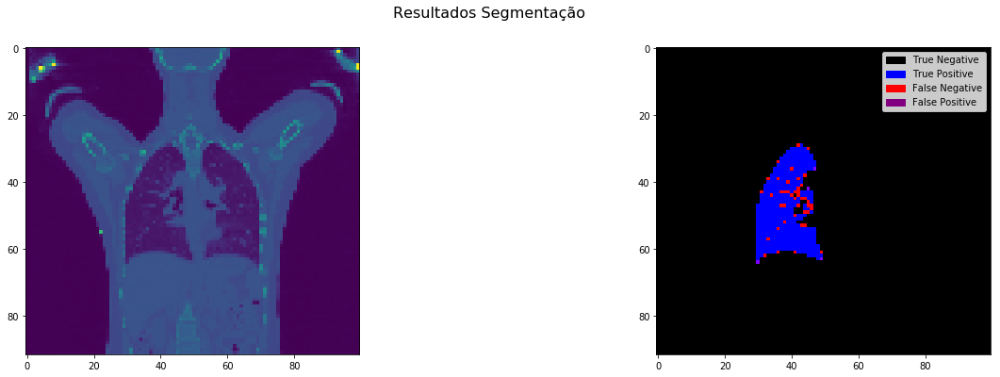

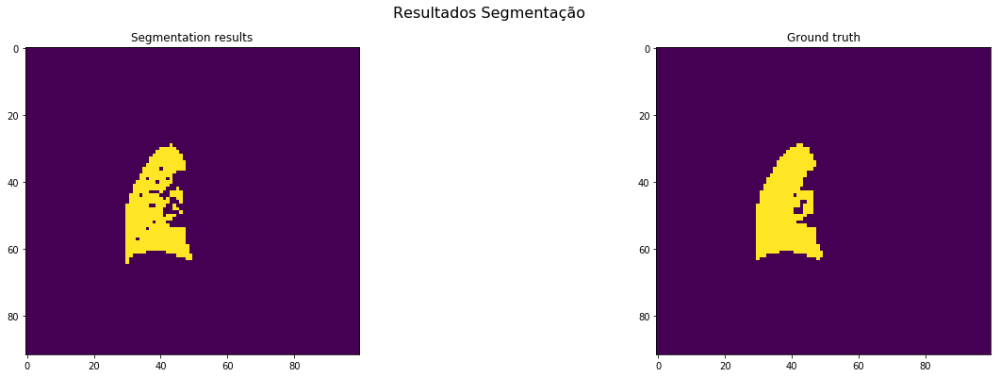

Metrics:
Dice: 0.9594721960414703
Jacquard Index: 0.9221014492753623
True Positive Rate: 0.9299230066553569
Volumetric Similarity: 0.9682240473946412

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 119 in 132
nome pre-result: Centroid3DVolumeSegmented_48684980_left_225.npy
paciente_result: 48684980
region_indice: left
indice_mask: 48684980
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [5918, 913181, 320, 581]
Elapsed time: 0.012 seconds.


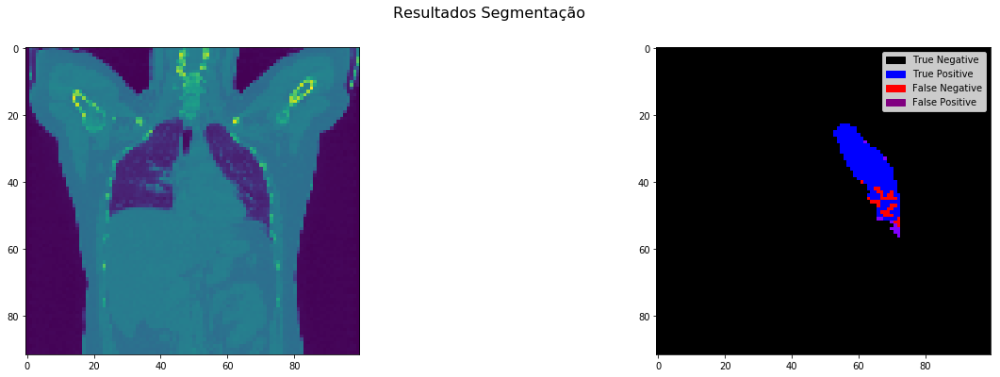

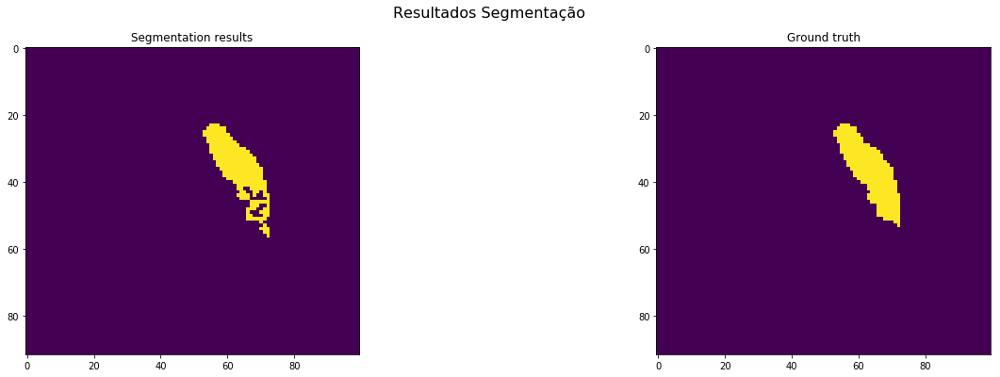

Metrics:
Dice: 0.9292612075056921
Jacquard Index: 0.8678691890306497
True Positive Rate: 0.9106016310201569
Volumetric Similarity: 0.9795085184894402

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 120 in 132
nome pre-result: Centroid3DVolumeSegmented_48684980_right_225.npy
paciente_result: 48684980
region_indice: right
indice_mask: 48684980
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7518, 911876, 207, 399]
Elapsed time: 0.012 seconds.


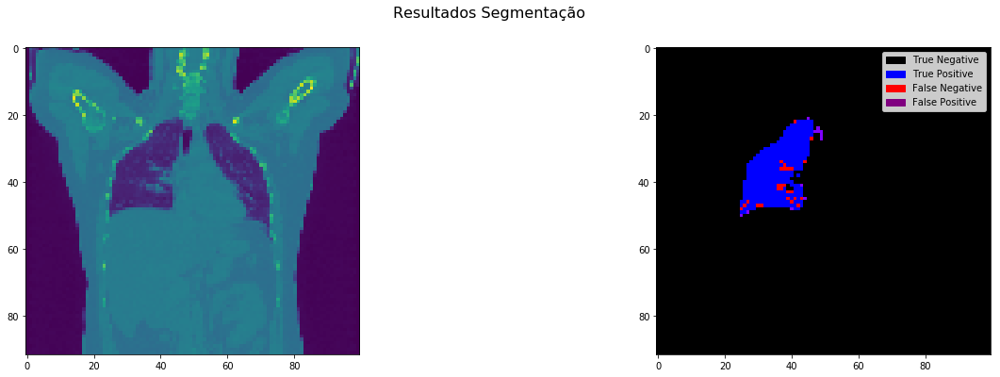

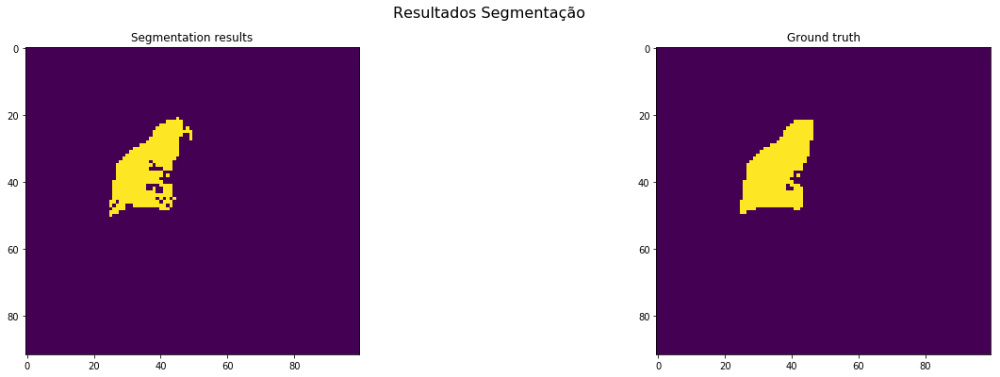

Metrics:
Dice: 0.9612581511315689
Jacquard Index: 0.9254062038404727
True Positive Rate: 0.9496021220159151
Volumetric Similarity: 0.9877253548139624

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 121 in 132
nome pre-result: Centroid3DVolumeSegmented_49174830_left_225.npy
paciente_result: 49174830
region_indice: left
indice_mask: 49174830
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8797, 910456, 50, 697]
Elapsed time: 0.012 seconds.


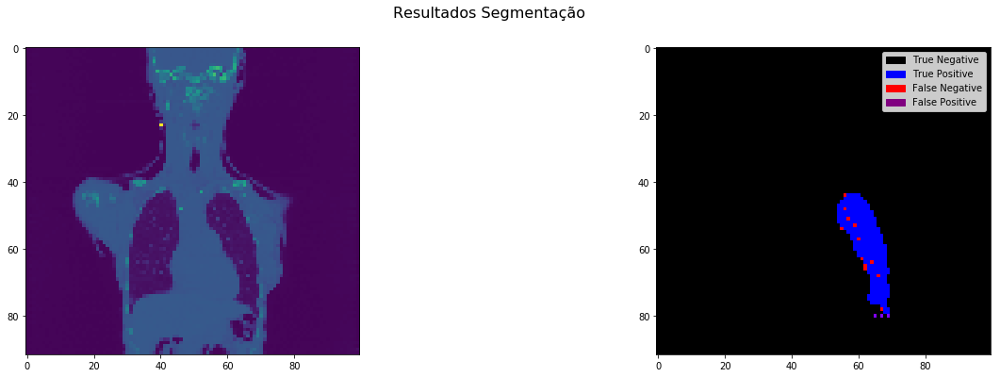

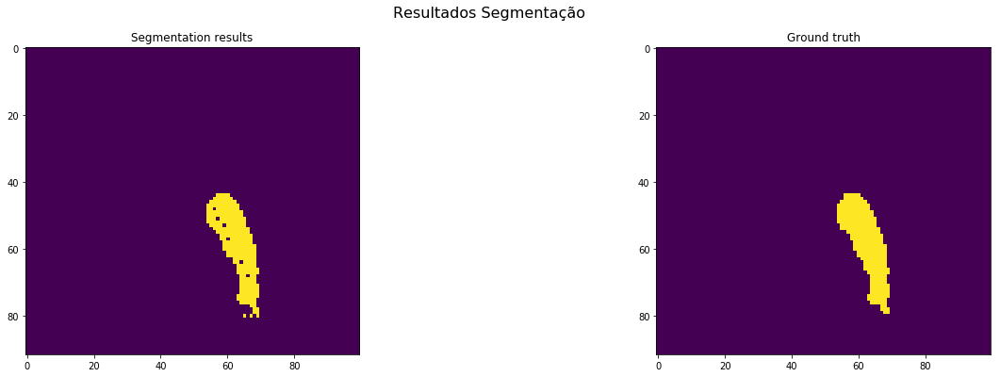

Metrics:
Dice: 0.9592715773403849
Jacquard Index: 0.9217309304274938
True Positive Rate: 0.9265852117126606
Volumetric Similarity: 0.9647238427566653

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 122 in 132
nome pre-result: Centroid3DVolumeSegmented_49174830_right_225.npy
paciente_result: 49174830
region_indice: right
indice_mask: 49174830
shape segmentação: (92, 100, 100)
shape ground truth: (92, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10689, 908341, 274, 696]
Elapsed time: 0.017 seconds.


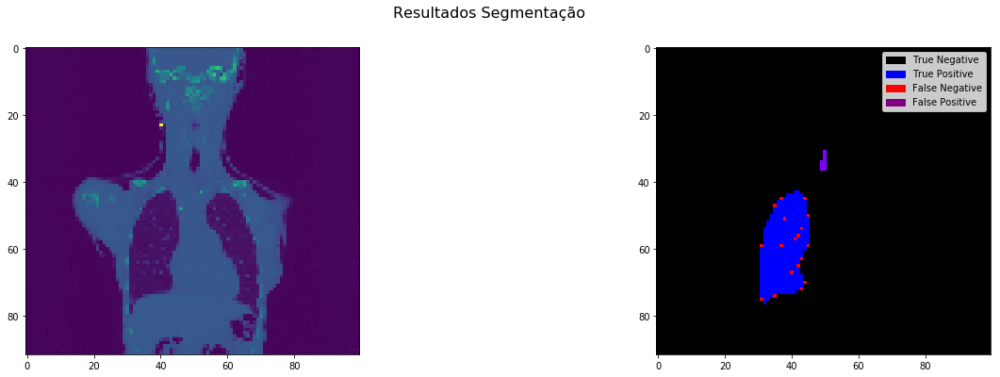

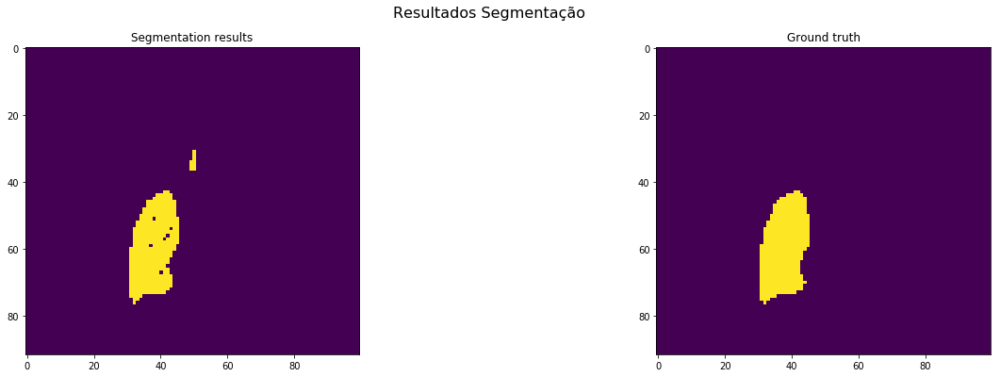

Metrics:
Dice: 0.9565956685161984
Jacquard Index: 0.9168024701946994
True Positive Rate: 0.938866930171278
Volumetric Similarity: 0.9811168784678719

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 123 in 132
nome pre-result: Centroid3DVolumeSegmented_51927593_right_225.npy
paciente_result: 51927593
region_indice: right
indice_mask: 51927593
Im zero
Im zero
shape segmentação: (92, 256, 256)
shape ground truth: (92, 256, 256)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [34519, 5992401, 419, 1973]
Elapsed time: 0.176 seconds.


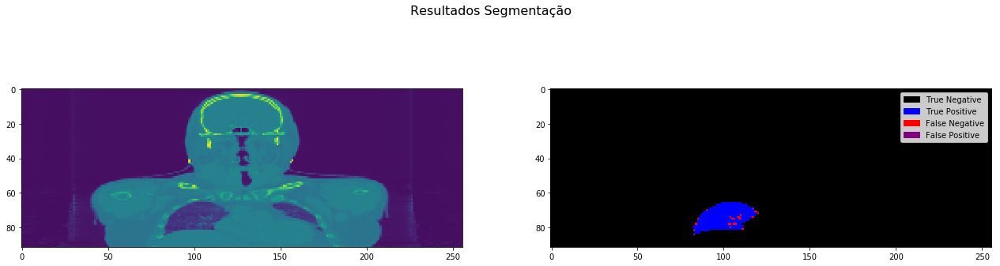

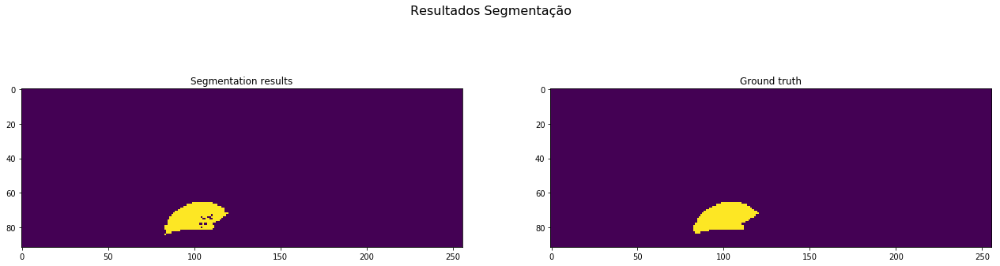

Metrics:
Dice: 0.9665126697466051
Jacquard Index: 0.9351954701850397
True Positive Rate: 0.9459333552559465
Volumetric Similarity: 0.9782444351112978

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 124 in 132
nome pre-result: Centroid3DVolumeSegmented_52016057_left_225.npy
paciente_result: 52016057
region_indice: left
indice_mask: 52016057
shape segmentação: (128, 130, 130)
shape ground truth: (128, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [9179, 2153242, 212, 567]
Elapsed time: 0.041 seconds.


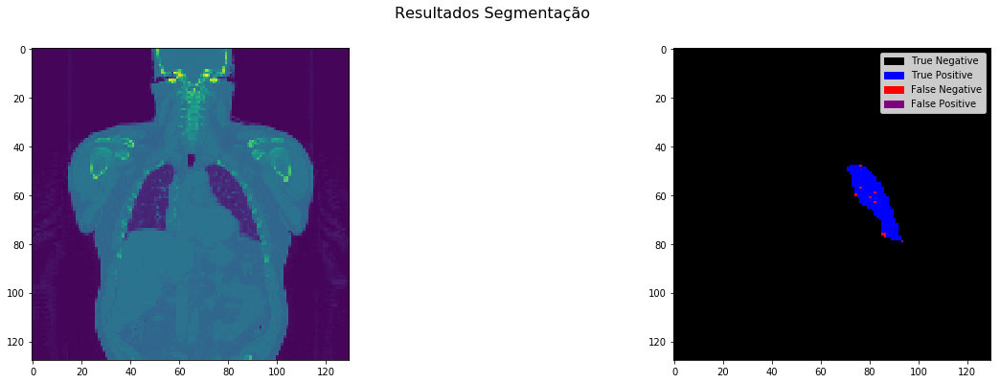

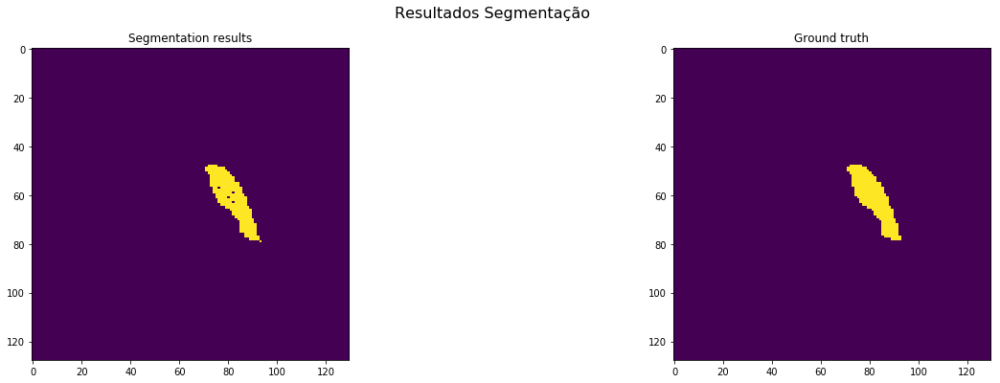

Metrics:
Dice: 0.9592935151800178
Jacquard Index: 0.9217714400482024
True Positive Rate: 0.9418222860660784
Volumetric Similarity: 0.9814495479960287

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 125 in 132
nome pre-result: Centroid3DVolumeSegmented_52016057_right_225.npy
paciente_result: 52016057
region_indice: right
indice_mask: 52016057
shape segmentação: (128, 130, 130)
shape ground truth: (128, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10535, 2151609, 276, 780]
Elapsed time: 0.045 seconds.


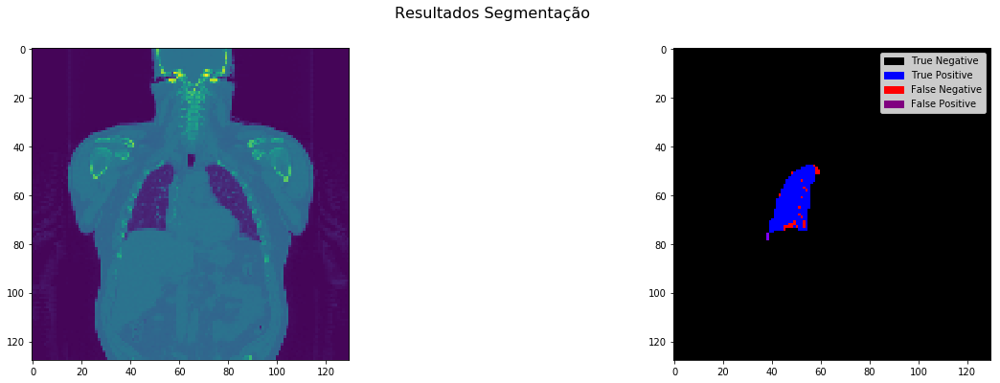

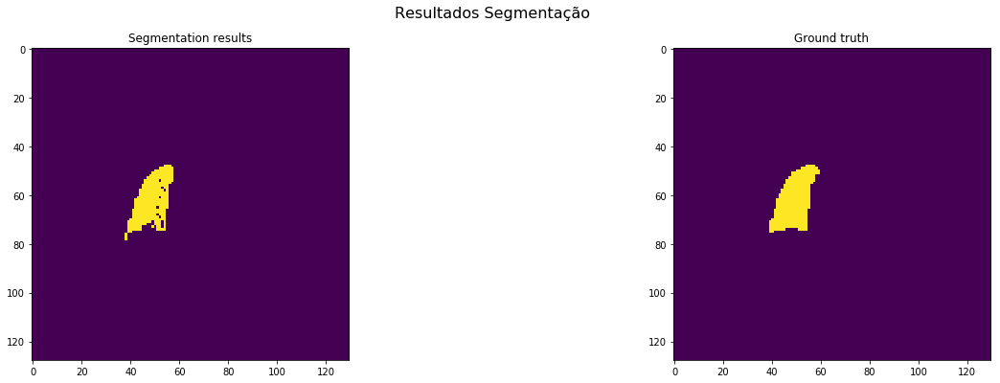

Metrics:
Dice: 0.9522733435776914
Jacquard Index: 0.9088948321973945
True Positive Rate: 0.931064958020327
Volumetric Similarity: 0.9772213685257164

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 126 in 132
nome pre-result: Centroid3DVolumeSegmented_52075421_left_225.npy
paciente_result: 52075421
region_indice: left
indice_mask: 52075421
shape segmentação: (89, 100, 100)
shape ground truth: (89, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7870, 881510, 98, 522]
Elapsed time: 0.024 seconds.


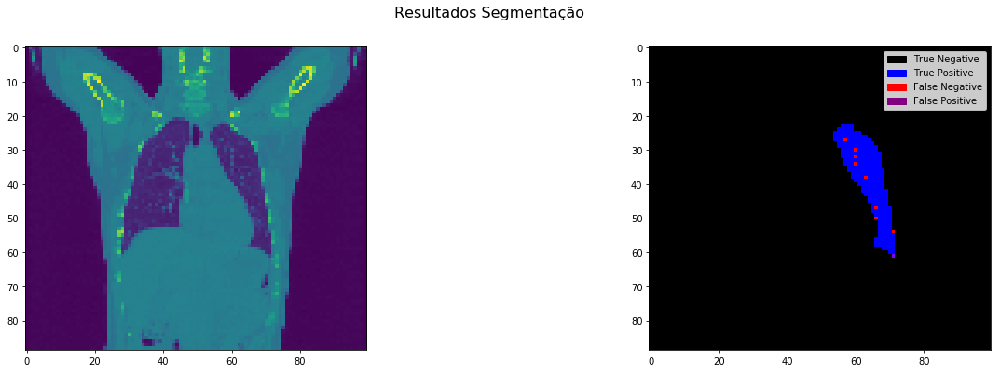

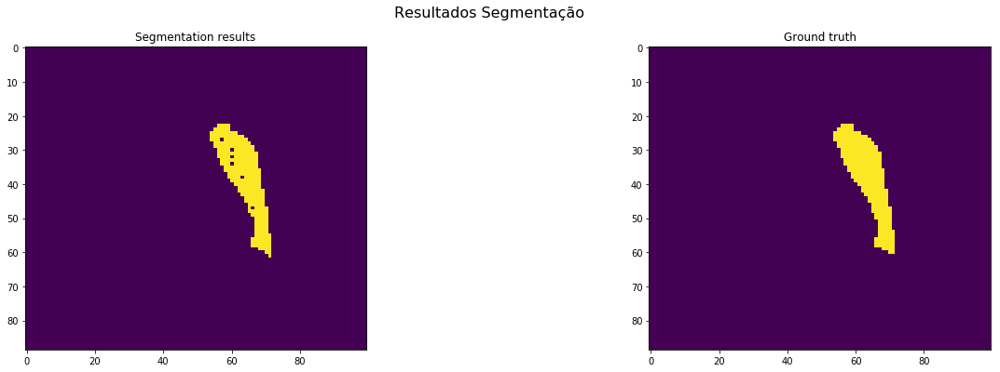

Metrics:
Dice: 0.9621026894865525
Jacquard Index: 0.9269729093050648
True Positive Rate: 0.9377979027645377
Volumetric Similarity: 0.9740831295843521

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 127 in 132
nome pre-result: Centroid3DVolumeSegmented_52075421_right_225.npy
paciente_result: 52075421
region_indice: right
indice_mask: 52075421
shape segmentação: (89, 100, 100)
shape ground truth: (89, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10563, 878639, 107, 691]
Elapsed time: 0.018 seconds.


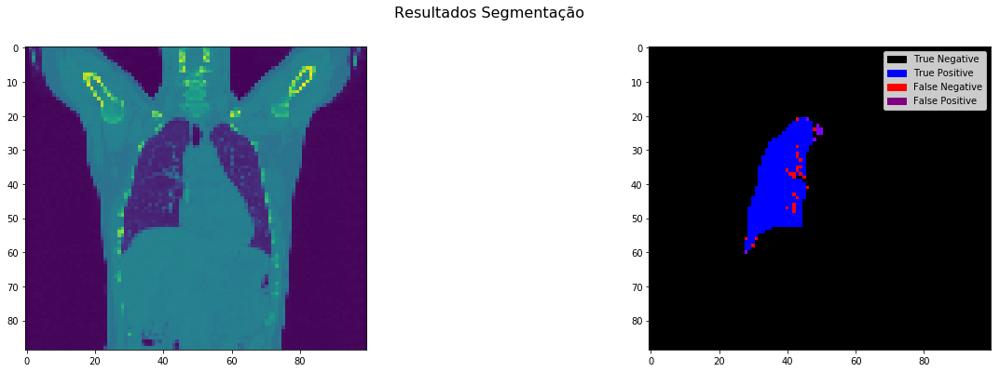

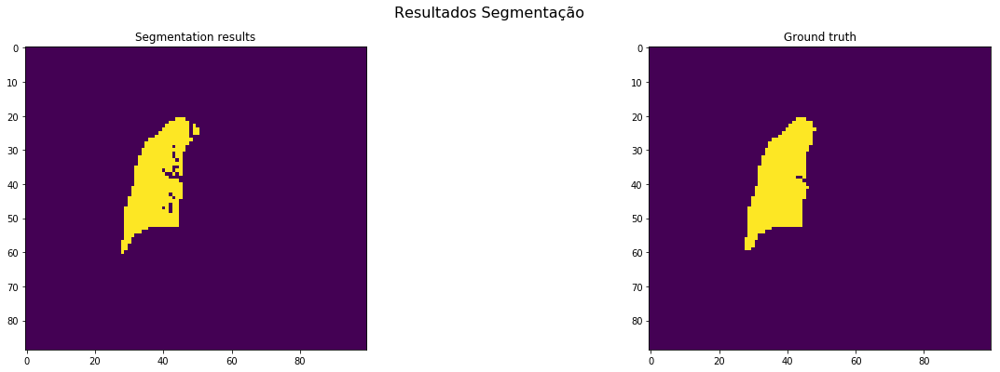

Metrics:
Dice: 0.9636015325670498
Jacquard Index: 0.9297597042513863
True Positive Rate: 0.9385996090279012
Volumetric Similarity: 0.973362525086663

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 128 in 132
nome pre-result: Centroid3DVolumeSegmented_54828475_left_225.npy
paciente_result: 54828475
region_indice: left
indice_mask: 54828475
shape segmentação: (98, 130, 130)
shape ground truth: (98, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [7782, 1647743, 113, 562]
Elapsed time: 0.033 seconds.


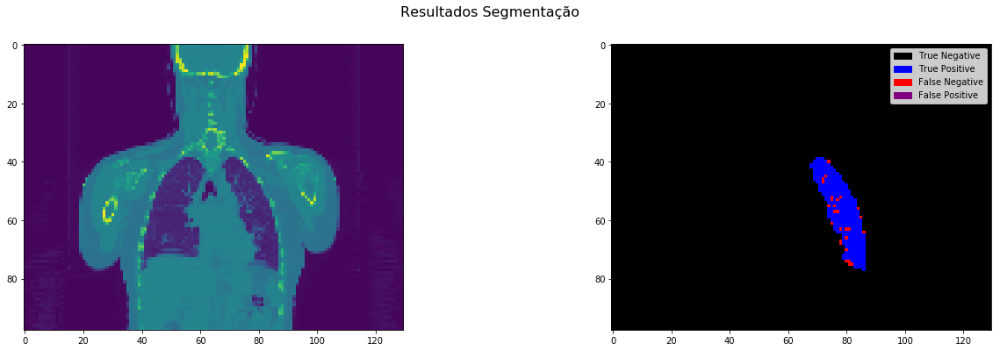

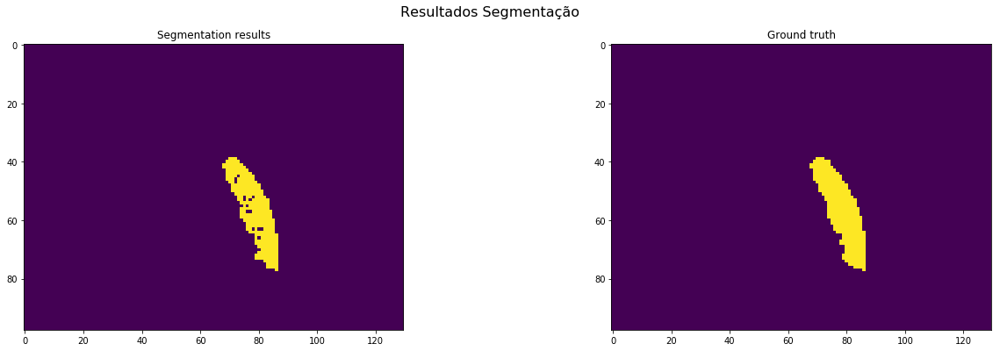

Metrics:
Dice: 0.9584334010714946
Jacquard Index: 0.9201844625753813
True Positive Rate: 0.9326462128475551
Volumetric Similarity: 0.9723505141942238

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 129 in 132
nome pre-result: Centroid3DVolumeSegmented_54828475_right_225.npy
paciente_result: 54828475
region_indice: right
indice_mask: 54828475
shape segmentação: (98, 130, 130)
shape ground truth: (98, 130, 130)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [10366, 1644872, 147, 815]
Elapsed time: 0.060 seconds.


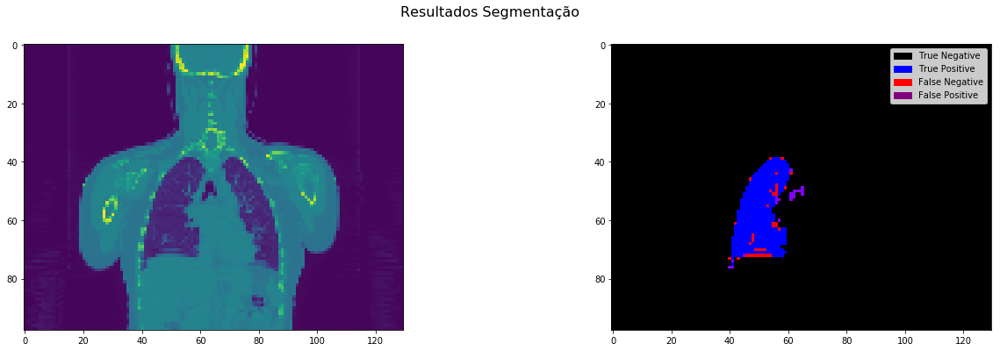

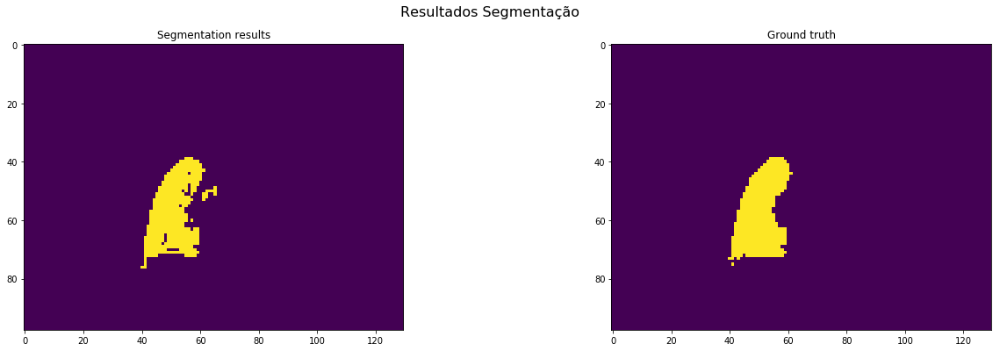

Metrics:
Dice: 0.955655941735042
Jacquard Index: 0.9150776836158192
True Positive Rate: 0.9271084876129148
Volumetric Similarity: 0.9692080759657048

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 130 in 132
nome pre-result: Centroid3DVolumeSegmented_57220883_left_225.npy
paciente_result: 57220883
region_indice: left
indice_mask: 57220883
shape segmentação: (124, 100, 100)
shape ground truth: (124, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [6661, 1232781, 98, 460]
Elapsed time: 0.025 seconds.


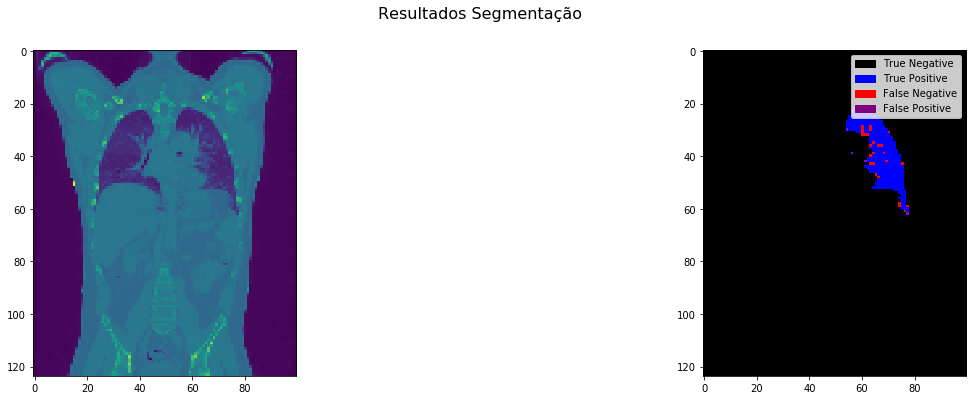

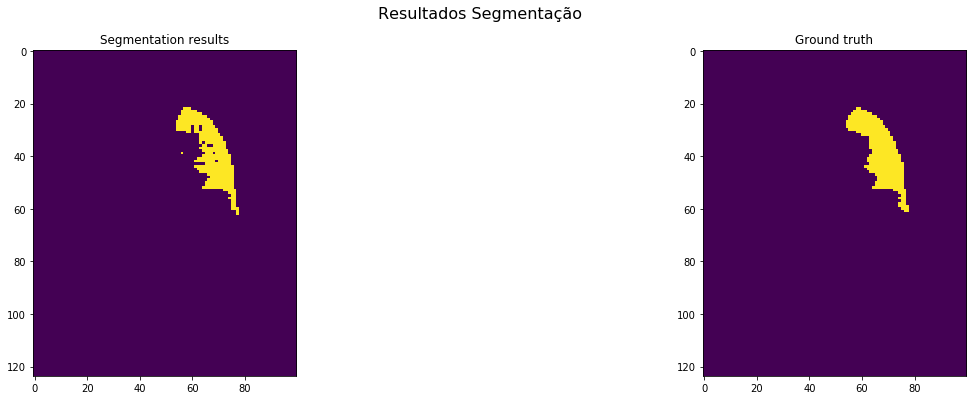

Metrics:
Dice: 0.9597982708933718
Jacquard Index: 0.9227039756198919
True Positive Rate: 0.9354023311332678
Volumetric Similarity: 0.9739193083573487

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------
status: 131 in 132
nome pre-result: Centroid3DVolumeSegmented_57220883_right_225.npy
paciente_result: 57220883
region_indice: right
indice_mask: 57220883
shape segmentação: (124, 100, 100)
shape ground truth: (124, 100, 100)

-----------------------------------------------------------------------------------------
TP, TN, FP, FN: [8310, 1231054, 82, 554]
Elapsed time: 0.024 seconds.


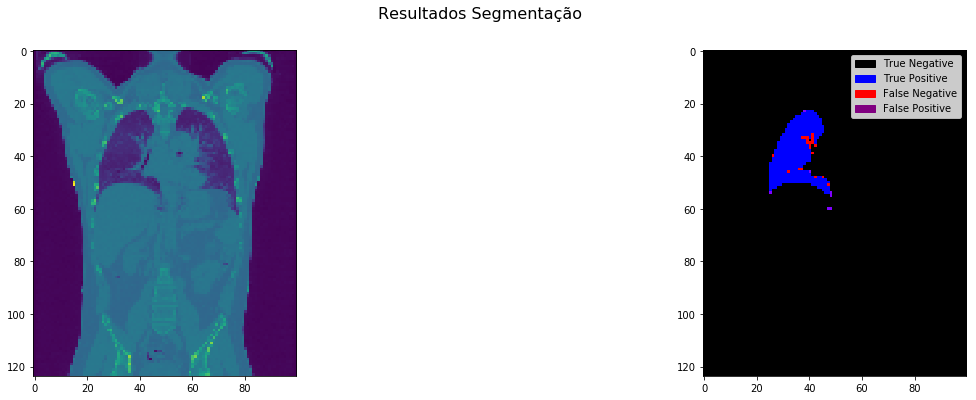

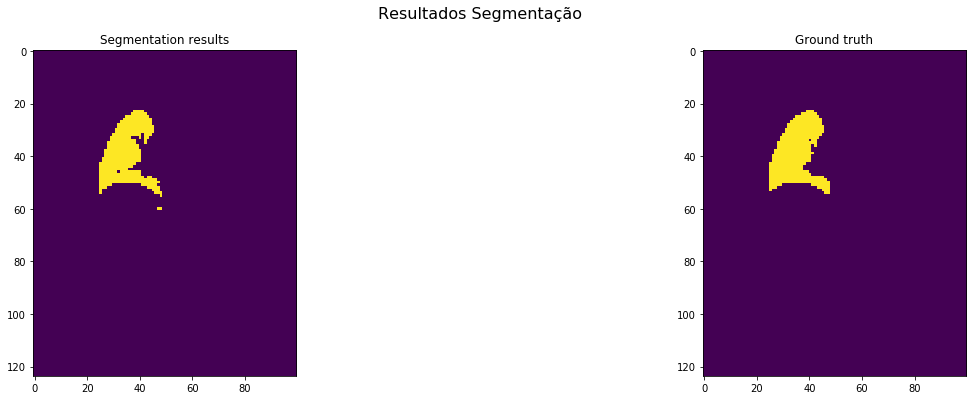

Metrics:
Dice: 0.9631432545201669
Jacquard Index: 0.9289067739771966
True Positive Rate: 0.9375
Volumetric Similarity: 0.9726471951784886

-----------------------------------------------------------------------------------------
----------------------------------------------------------------------------------------------


In [21]:
from segmentation_functions import resample
from finding_biggest_lung import arrange_slices, normalization, creating_mask
from automaticSeeding import find_seed #confirmar que não é o primeiro metodo
import numpy as np
import os
import matplotlib.pyplot as plt
import scipy.io as spio
import pydicom
import time
from segmentation_metrics import compare_volumes_lighter, plot_results_segmentation_image, Dice, Jac, TruePR, VoluM, MutualI
#from math import sqrt


slices_path = "G:/CTimages/"
indices_path ="G:/Plans/CT/Lungs/ok/Separate Lungs/"
seeds_path = "G:/CTimages/CT/Images/Seeds/"
separation_path = "G:/CTimages/CT/Images/Separator/"
centroid_path = "G:/CTimages/CT/Images/Centroids/"
segmentations_results_path = "G:/Plans/CT/Lungs/segmentation_results/Non_iterative/Centroid/"
indices_folder= os.listdir(indices_path)


segmentation_folder= os.listdir(segmentations_results_path)
metrics_methods = []
masks = []

resultados = os.listdir(segmentations_results_path)
a = 0
metrics = []
TP_list = []
TN_list = []
FP_list = []
FN_list = []
for num,pre_result in enumerate(resultados): #folder of results for each method

    print('status: '+str(num)+' in '+str(len(resultados)))
    print('nome pre-result: ' +str(pre_result))
    split_id = pre_result.split('_', pre_result.count(pre_result))[1]
    result_id = split_id.split('_', split_id.count(split_id))[0]
    print('paciente_result: '+str(result_id))
    indexes = os.listdir(indices_path)
    indice_id = indexes[a].split(" ")[0]
    region = indexes[a].split("_")[1]
    print('region_indice: '+str(region))

    print('indice_mask: '+str(indice_id))

    #Reading data--------------------------------------------------------------------------------------------------
    indexes_mask = spio.loadmat(indices_path+ indexes[a], squeeze_me=True)["indexes"]
    slices = arrange_slices(slices_path,result_id)
    normalized_volume=normalization(slices)
    normalized_array = np.array(normalized_volume)
    volume_resampled,spacing = resample(normalized_array, slices, [5,5,5])

    # Ground Truth
    ground_truth = creating_mask(indexes_mask,normalized_array)
    ground_truth_resampled,spacing = resample(ground_truth, slices, [5,5,5])
    ground_truth_boolean = np.where(ground_truth_resampled>0.5, 1, 0)

    # Segmentation results
    result_segment= np.load(segmentations_results_path +pre_result)
    result_segment_boolean= np.where(result_segment==True, 1, 0)

    print('shape segmentation: '+str(result_segment_boolean.shape))
    print('shape ground truth: '+str(ground_truth_boolean.shape))

    print('\n'+'-----------------------------------------------------------------------------------------')

    #Metrics------------------------------------------------------------------------------------------------------------------
    start=time.time()
    TP, TN, FP, FN = compare_volumes_lighter(ground_truth_boolean,result_segment_boolean)
    stop=time.time()
    TP_list.append(TP)
    FP_list.append(FP)
    TN_list.append(TN)
    FN_list.append(FN)
    name = segmentations_results_path+"Metrics_Tp_Fp, Tn, Fn"
    np.save(name, [TP_list,FP_list,TN_list,FN_list])
    
    print('TP, TN, FP, FN: '+str([TP, TN, FP, FN]))
    print("Elapsed time: %.3f seconds." % (stop - start))
    half_rows = result_segment_boolean.shape[1]//2

    img = plot_results_segmentation_image(ground_truth_boolean[:,half_rows,:],result_segment_boolean[:,half_rows,:],volume_resampled[:,half_rows,:])
    fig = plt.figure(figsize=(22,6))  
    fig.suptitle("Segmentation results", fontsize=16)
    y = fig.add_subplot(1,2,1)
    y.imshow(result_segment_boolean[:,half_rows,:])
    y.set_title("Segmentation Mask")
    x = fig.add_subplot(1,2,2)
    x.imshow(ground_truth_boolean[:,half_rows,:])
    x.set_title("Ground truth")
    plt.show()

    identification = indice_id+'_'+region
    dice = Dice(TP,FP,FN)
    jac = Jac(TP,FP,FN)
    truePr = TruePR(TP,FN)
    vs = VoluM(TP,FP, FN)
    #mi = MutualI(TP,TN,FP,FN)
    avaliation =tuple([dice,jac,truePr,vs, mi])
    result = tuple([identification,avaliation])
    metrics.append(result)

    print('Metrics:')
    print('Dice: '+str(dice))
    print('Jacquard Index: '+str(jac))
    print('True Positive Rate: '+str(truePr))
    print('Volumetric Similarity: '+str(vs))
    #print('Mutual Information: '+str(mi))
    print('\n'+'-----------------------------------------------------------------------------------------')
    print('----------------------------------------------------------------------------------------------')

    a=a+1
metrics_methods.append(metrics)

In [24]:
dice =[]
jac = []
tpr = []
vs = []
mi = []
for i in metrics:
    #dice = i[1][0]
    dice.append(i[1][0])
    jac.append(i[1][1])
    tpr.append(i[1][2])
    vs.append(i[1][3])
    mi.append(i[1][4])